In [ ]:
%load_ext autotime

# Writing a chess program 

The program will be written in Python and contains all main parts of a chess engine. 

Every chess program has 3 important parts:
    - The representation of the board
    - The board evaluation
    - The search

As a starting point we use the Python package "chess" [https://python-chess.readthedocs.io](https://python-chess.readthedocs.io) which is a library for move generation, move validation, support for printing the board and more.

## Board representation

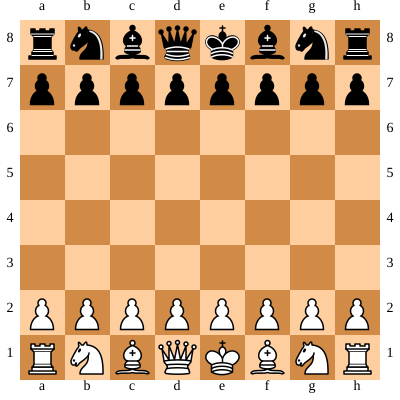

In [1]:
import chess
import chess.svg

from IPython.display import SVG

board = chess.Board()
SVG(chess.svg.board(board=board,size=400))  

The main component of the chess library is a "Board"-object which represents the pieces on the chess board, and has methods for move-generation and checking the status of the board (for example checking for mate). The object has a move-stack on which you can push and pop moves, for making a move and taking back a move.

An SVG component can be used to display a graphical representation of the board as above in a "Jupyter"-notebook.

## Board evaluation

A position on the chess board can be evaluated, if it is won by one side or it is a draw. If none of this conditions is satisfied we need an estimate of how likely it is that a player wins. In this simple implementation it is done by two factors the "material" (pieces on board) and the positions of the pieces. For each sort of pieces different values are calculated depending on the squares the pieces are located. This is done with so called "piece-square" tables. See below for the implementation.

In [2]:
def evaluate_board():
    
    if board.is_checkmate():
        if board.turn:
            return -9999
        else:
            return 9999
    if board.is_stalemate():
        return 0
    if board.is_insufficient_material():
        return 0
    
    wp = len(board.pieces(chess.PAWN, chess.WHITE))
    bp = len(board.pieces(chess.PAWN, chess.BLACK))
    wn = len(board.pieces(chess.KNIGHT, chess.WHITE))
    bn = len(board.pieces(chess.KNIGHT, chess.BLACK))
    wb = len(board.pieces(chess.BISHOP, chess.WHITE))
    bb = len(board.pieces(chess.BISHOP, chess.BLACK))
    wr = len(board.pieces(chess.ROOK, chess.WHITE))
    br = len(board.pieces(chess.ROOK, chess.BLACK))
    wq = len(board.pieces(chess.QUEEN, chess.WHITE))
    bq = len(board.pieces(chess.QUEEN, chess.BLACK))
    
    material = 100*(wp-bp)+320*(wn-bn)+330*(wb-bb)+500*(wr-br)+900*(wq-bq)
    
    pawnsq = sum([pawntable[i] for i in board.pieces(chess.PAWN, chess.WHITE)])
    pawnsq= pawnsq + sum([-pawntable[chess.square_mirror(i)] 
                                    for i in board.pieces(chess.PAWN, chess.BLACK)])
    knightsq = sum([knightstable[i] for i in board.pieces(chess.KNIGHT, chess.WHITE)])
    knightsq = knightsq + sum([-knightstable[chess.square_mirror(i)] 
                                    for i in board.pieces(chess.KNIGHT, chess.BLACK)])
    bishopsq= sum([bishopstable[i] for i in board.pieces(chess.BISHOP, chess.WHITE)])
    bishopsq= bishopsq + sum([-bishopstable[chess.square_mirror(i)] 
                                    for i in board.pieces(chess.BISHOP, chess.BLACK)])
    rooksq = sum([rookstable[i] for i in board.pieces(chess.ROOK, chess.WHITE)]) 
    rooksq = rooksq + sum([-rookstable[chess.square_mirror(i)] 
                                    for i in board.pieces(chess.ROOK, chess.BLACK)])
    queensq = sum([queenstable[i] for i in board.pieces(chess.QUEEN, chess.WHITE)]) 
    queensq = queensq + sum([-queenstable[chess.square_mirror(i)] 
                                    for i in board.pieces(chess.QUEEN, chess.BLACK)])
    kingsq = sum([kingstable[i] for i in board.pieces(chess.KING, chess.WHITE)]) 
    kingsq = kingsq + sum([-kingstable[chess.square_mirror(i)] 
                                    for i in board.pieces(chess.KING, chess.BLACK)])
    
    eval = material + pawnsq + knightsq + bishopsq+ rooksq+ queensq + kingsq
    if board.turn:
        return eval
    else:
        return -eval

The function returns -9999 if white is mated, 9999 if black is mated and 0 for a draw. In all other situations it returns an evaluation as the sum of the material and the sum of postion values via piece-square tables. If black is in turn then the negative value is returned as needed by the negamax implementation of the search (see below).

### Piece-square tables

We used the piece-squre tables from [https://www.chessprogramming.org/Simplified_Evaluation_Function](https://www.chessprogramming.org/Simplified_Evaluation_Function). For each sort of piece a different table is defined. If the value on a square is positive then the program tries to place a piece on that square if the value is negative it avoids to move to that square. The value of the whole position is calculated by summing over all pieces of both sides.

For pawns the program is encouraged to advance the pawns. Additionally we try to discourage the engine from leaving central pawns unmoved. Pawns on f2, g2 or c2 and b2 should not move zu f3 etc.

Knights are simply encouraged to go to the center. Standing on the edge is a bad idea.

Bishops should avoid corners and borders.

Rooks should occupy the 7th rank and avoid a, h columns

Queens should avoid corners and borders and stay in the center.

Kings should stand behind the pawn shelter. This is only good for opening and middle game. The endgame needs a different table. I will do this in a future enhancement of the program.

In [3]:
pawntable = [
 0,  0,  0,  0,  0,  0,  0,  0,
 5, 10, 10,-20,-20, 10, 10,  5,
 5, -5,-10,  0,  0,-10, -5,  5,
 0,  0,  0, 20, 20,  0,  0,  0,
 5,  5, 10, 25, 25, 10,  5,  5,
10, 10, 20, 30, 30, 20, 10, 10,
50, 50, 50, 50, 50, 50, 50, 50,
 0,  0,  0,  0,  0,  0,  0,  0]

knightstable = [
-50,-40,-30,-30,-30,-30,-40,-50,
-40,-20,  0,  5,  5,  0,-20,-40,
-30,  5, 10, 15, 15, 10,  5,-30,
-30,  0, 15, 20, 20, 15,  0,-30,
-30,  5, 15, 20, 20, 15,  5,-30,
-30,  0, 10, 15, 15, 10,  0,-30,
-40,-20,  0,  0,  0,  0,-20,-40,
-50,-40,-30,-30,-30,-30,-40,-50]

bishopstable = [
-20,-10,-10,-10,-10,-10,-10,-20,
-10,  5,  0,  0,  0,  0,  5,-10,
-10, 10, 10, 10, 10, 10, 10,-10,
-10,  0, 10, 10, 10, 10,  0,-10,
-10,  5,  5, 10, 10,  5,  5,-10,
-10,  0,  5, 10, 10,  5,  0,-10,
-10,  0,  0,  0,  0,  0,  0,-10,
-20,-10,-10,-10,-10,-10,-10,-20]

rookstable = [
  0,  0,  0,  5,  5,  0,  0,  0,
 -5,  0,  0,  0,  0,  0,  0, -5,
 -5,  0,  0,  0,  0,  0,  0, -5,
 -5,  0,  0,  0,  0,  0,  0, -5,
 -5,  0,  0,  0,  0,  0,  0, -5,
 -5,  0,  0,  0,  0,  0,  0, -5,
  5, 10, 10, 10, 10, 10, 10,  5,
 0,  0,  0,  0,  0,  0,  0,  0]

queenstable = [
-20,-10,-10, -5, -5,-10,-10,-20,
-10,  0,  0,  0,  0,  0,  0,-10,
-10,  5,  5,  5,  5,  5,  0,-10,
  0,  0,  5,  5,  5,  5,  0, -5,
 -5,  0,  5,  5,  5,  5,  0, -5,
-10,  0,  5,  5,  5,  5,  0,-10,
-10,  0,  0,  0,  0,  0,  0,-10,
-20,-10,-10, -5, -5,-10,-10,-20]

kingstable = [
 20, 30, 10,  0,  0, 10, 30, 20,
 20, 20,  0,  0,  0,  0, 20, 20,
-10,-20,-20,-20,-20,-20,-20,-10,
-20,-30,-30,-40,-40,-30,-30,-20,
-30,-40,-40,-50,-50,-40,-40,-30,
-30,-40,-40,-50,-50,-40,-40,-30,
-30,-40,-40,-50,-50,-40,-40,-30,
-30,-40,-40,-50,-50,-40,-40,-30]

## Search algorithms
We are using the MinMax algorithm with the Negamax implementation. We are also bringing in alpha beta tuning and quiescence search approach

###  Quiesence *Search*

For lookahead we use Depth-First search that starts at the root and explores up to a fixed depth along each branch before backtracking. The value of the position is calculated via [Minimax](https://www.chessprogramming.org/Minimax) and [Alphabeta pruning](https://www.chessprogramming.org/Alpha-Beta) is used with the Negamax implementation.  

In [100]:
def alphabeta( alpha, beta,maxdepth, depthleft):
    # This if else code block is only used for analysis of algorithm, by counting number of nodes explored
    if maxdepth - depthleft in nodes_per_depth:
        nodes_per_depth[maxdepth - depthleft] += 1
    else: 
        nodes_per_depth[maxdepth - depthleft] = 1

    bestscore = -9999
    if( depthleft == 0 ):
        #return evaluate_board()
        return quiesce( alpha, beta, maxdepth )
    for move in board.legal_moves:
        board.push(move)   
        score= - alphabeta( -beta, -alpha, maxdepth, depthleft - 1 )
        
        board.pop()
        if( score >= beta ):
            coupe[0] = coupe[0] +1
            return score
        if( score > bestscore ):
            bestscore = score
        if( score > alpha ):
            alpha = score   
    return bestscore

At the maximun search depth the search is extended by searching all capture moves, the so called [quiescence search](https://www.chessprogramming.org/Quiescence_Search) to avoid the ["Horizon Effect"](https://www.chessprogramming.org/Horizon_Effect).

In [101]:
def quiesce( alpha, beta,  maxdepth):
    stand_pat = evaluate_board()
    if maxdepth  in nodes_per_depth:
        nodes_per_depth[maxdepth ] += 1
    else: 
        nodes_per_depth[maxdepth ] = 1
    if( stand_pat >= beta ):
        coupe[0] = coupe[0] +1
        return beta
    if( alpha < stand_pat ):
        alpha = stand_pat

    for move in board.legal_moves:
        if board.is_capture(move):
            board.push(move)        
            score = -quiesce( -beta, -alpha, maxdepth + 1 )
            
            board.pop()

            if( score >= beta ):
                coupe[0] = coupe[0] +1
                return beta
            if( score > alpha ):
                alpha = score  
    return alpha

The function which implements the move selection in the root position consists of two parts. The first part tries to find a move in the opening book and gives it back. The "chess" library has a function to access opening books in the ["Polyglot" format](https://www.chessprogramming.org/PolyGlot). I used the "bookfish" opening book which I downloaded from [http://rebel13.nl/download/books.html](http://rebel13.nl/download/books.html). A random weighted move is selected from all possible moves of the book in this position.

The second part calculates the move if the book is empty. For each move in the position the search (alphabeta) is conducted and the best move is choosen.

In [102]:
import chess.polyglot

def selectmove(depth,movehistory):
    
    bestMove = chess.Move.null()
    bestValue = -99999
    alpha = -100000
    beta = 100000
    for move in board.legal_moves:
        board.push(move)
        boardValue = -alphabeta(-beta, -alpha,depth, depth-1)
        
        if boardValue > bestValue:
            bestValue = boardValue;
            bestMove = move
        if( boardValue > alpha ):
            alpha = boardValue
        board.pop()
    movehistory.append(bestMove)
    return bestMove

###  Negamax_ab *Search*

Another search version using only the alphabeta pruning without the quiescence search. It is used for testing purposes

In [83]:
def alphabeta_ab( alpha, beta,maxdepth, depthleft):
    # This if else code block is only used for analysis of algorithm, by counting number of nodes explored
    if maxdepth - depthleft in nodes_per_depth:
        nodes_per_depth[maxdepth - depthleft] += 1
    else: 
        nodes_per_depth[maxdepth - depthleft] = 1

    bestscore = -9999
    if( depthleft == 0 ):
        return evaluate_board()
        
    for move in board.legal_moves:
        board.push(move)   
        score= - alphabeta_ab( -beta, -alpha, maxdepth, depthleft - 1 )
        
        board.pop()
        if( score >= beta ):
            
            return score
        if( score > bestscore ):
            bestscore = score
        if( score > alpha ):
            alpha = score   
    return bestscore

In [84]:
import chess.polyglot

def selectmove_ab(depth,movehistory):
    
    bestMove = chess.Move.null()
    bestValue = -99999
    alpha = -100000
    beta = 100000
    for move in board.legal_moves:
        board.push(move)
        boardValue = -alphabeta_ab(-beta, -alpha,depth, depth-1)
        
        if boardValue > bestValue:
            bestValue = boardValue;
            bestMove = move
        if( boardValue > alpha ):
            alpha = boardValue
        board.pop()
    movehistory.append(bestMove)
    return bestMove

### Negamax Search
With this search version, we omit the alpha beta pruning in order to compare the different algorithms performances

In [ ]:
def negamax( maxdepth, depthleft):
    # This if else code block is only used for analysis of algorithm, by counting number of nodes explored
    if maxdepth - depthleft in nodes_per_depth:
        nodes_per_depth[maxdepth - depthleft] += 1
    else: 
        nodes_per_depth[maxdepth - depthleft] = 1

    bestscore = -9999
    if( depthleft == 0 ):
        return evaluate_board()
        
    for move in board.legal_moves:
        board.push(move)   
        score= - negamax(  maxdepth, depthleft - 1 )
        
        board.pop()
        
        if( score > bestscore ):
            bestscore = score
         
    return bestscore

In [ ]:
import chess.polyglot

def selectmove_negamax(depth,movehistory):
    
    bestMove = chess.Move.null()
    bestValue = -99999
    alpha = -100000
    beta = 100000
    for move in board.legal_moves:
        board.push(move)
        boardValue = -negamax(depth, depth-1)
        
        if boardValue > bestValue:
            bestValue = boardValue;
            bestMove = move
        
        board.pop()
    movehistory.append(bestMove)
    return bestMove

## Play against computer

To play against the program inside a Jupyter notebook you can evalute the following cell to compute a computer move (with a search depth of 3), and display the board.

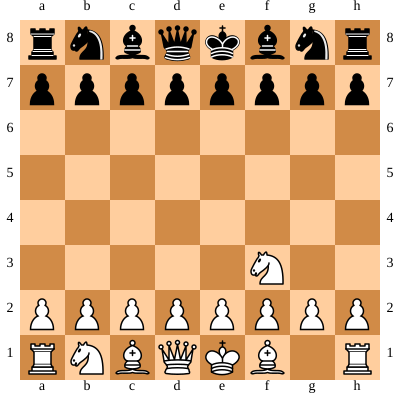

In [ ]:
movehistory = []
board = chess.Board()
mov = selectmove(3,movehistory)
board.push(mov)
SVG(chess.svg.board(board=board,size=400))

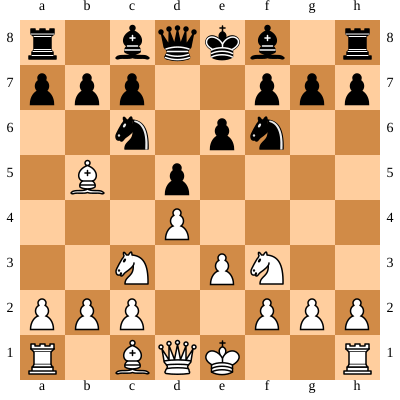

In [ ]:
mov = selectmove(3)
board.push(mov)
SVG(chess.svg.board(board=board,size=400))

To make a human move you can use:

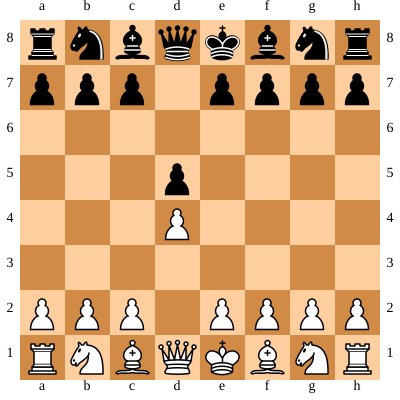

time: 27 ms


In [ ]:
board.push_san("d5")
SVG(chess.svg.board(board=board,size=400))

## Selfplay and Tests

In this section, we test the different approaches : Quiescence_Search, alpha beta pruning and minmax only.

Different tests have been conducted, the full game plays are shown below.

### Negamax vs Negamax - same depth
In the following, Negmax is playing against Negamax with the same max research depth for each player

WHITE Turn
Move in UCI format: g1f3
Nodes per depth: {1: 20, 2: 400, 3: 8902, 4: 197281}
Time taken by Move: 18.160144090652466


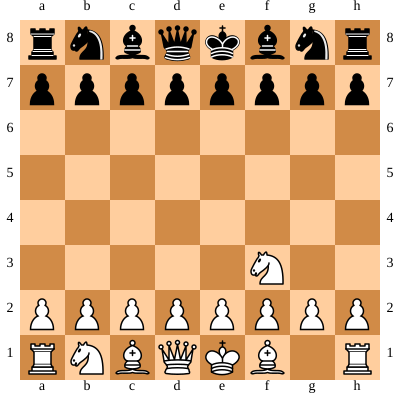



BLACK Turn
Move in UCI format: b8c6
Nodes per depth: {1: 20, 2: 440, 3: 9748, 4: 233491}
Time taken by Move: 21.548065423965454


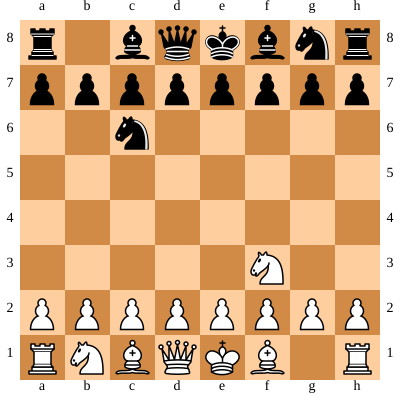



WHITE Turn
Move in UCI format: b1c3
Nodes per depth: {1: 22, 2: 482, 3: 11533, 4: 275527}
Time taken by Move: 24.9306902885437


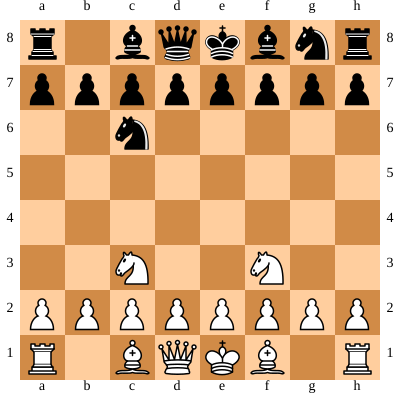



BLACK Turn
Move in UCI format: g8f6
Nodes per depth: {1: 22, 2: 526, 3: 12588, 4: 320666}
Time taken by Move: 29.77072048187256


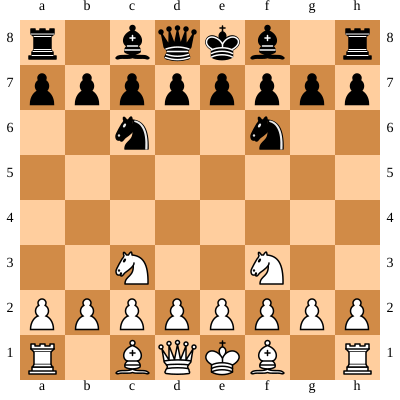



WHITE Turn
Move in UCI format: h1g1
Nodes per depth: {1: 24, 2: 572, 3: 14717, 4: 373496}
Time taken by Move: 33.967626333236694


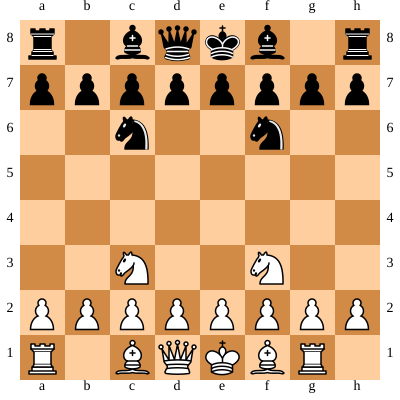



BLACK Turn
Move in UCI format: h8g8
Nodes per depth: {1: 24, 2: 548, 3: 14094, 4: 349722}
Time taken by Move: 32.02374815940857


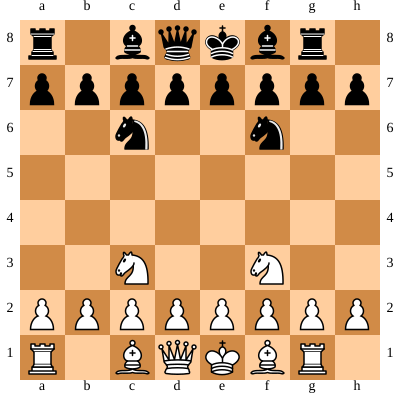



WHITE Turn
Move in UCI format: g1h1
Nodes per depth: {1: 23, 2: 525, 3: 13204, 4: 327233}
Time taken by Move: 29.87568473815918


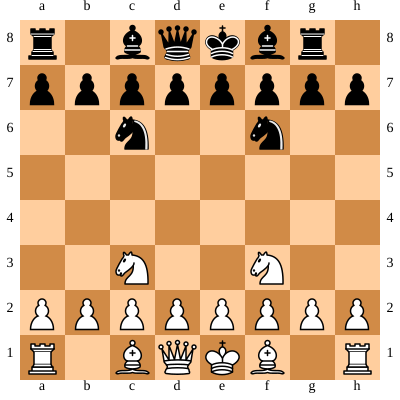



BLACK Turn
Move in UCI format: g8h8
Nodes per depth: {1: 23, 2: 548, 3: 13788, 4: 349494}
Time taken by Move: 32.333648920059204


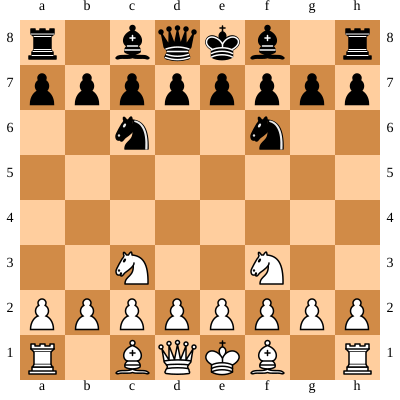



WHITE Turn
Move in UCI format: h1g1
Nodes per depth: {1: 24, 2: 572, 3: 14717, 4: 373496}
Time taken by Move: 34.28754663467407


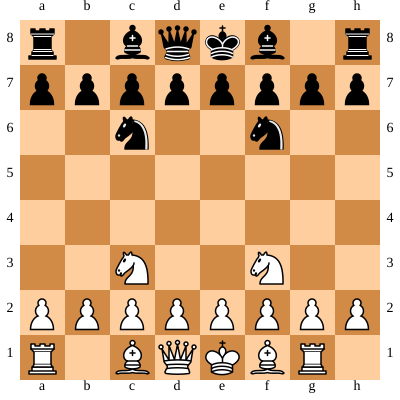



BLACK Turn
Move in UCI format: h8g8
Nodes per depth: {1: 24, 2: 548, 3: 14094, 4: 349722}
Time taken by Move: 32.41042923927307


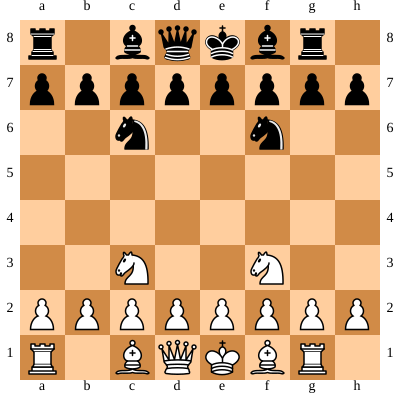



WHITE Turn
Move in UCI format: g1h1
Nodes per depth: {1: 23, 2: 525, 3: 13204, 4: 327233}
Time taken by Move: 30.121846675872803


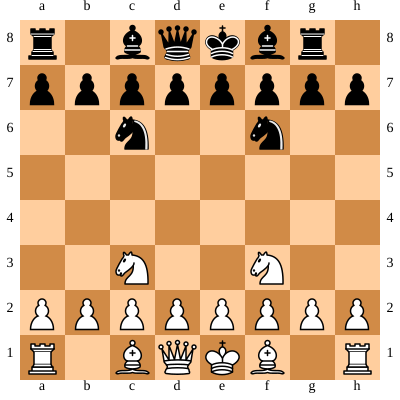



BLACK Turn
Move in UCI format: g8h8
Nodes per depth: {1: 23, 2: 548, 3: 13788, 4: 349494}
Time taken by Move: 32.371954679489136


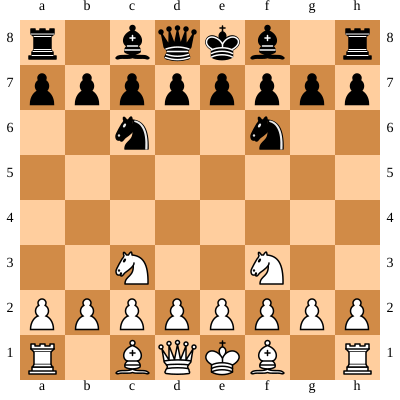



WHITE Turn
Move in UCI format: h1g1
Nodes per depth: {1: 24, 2: 572, 3: 14717, 4: 373496}
Time taken by Move: 37.20358324050903


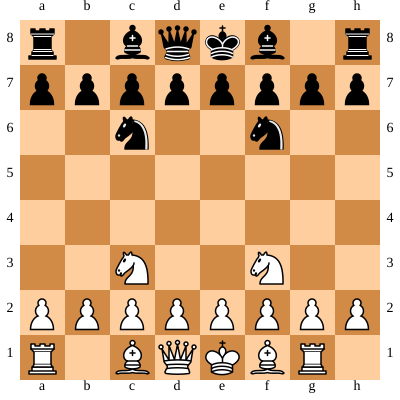



[Event "Example"]
[Site "Linz"]
[Date "2022-01-29"]
[Round "1"]
[White "MyChess"]
[Black "MyChess"]
[Result "1/2-1/2"]

1. Nf3 Nc6 2. Nc3 Nf6 3. Rg1 Rg8 4. Rh1 Rh8 5. Rg1 Rg8 6. Rh1 Rh8 7. Rg1 1/2-1/2


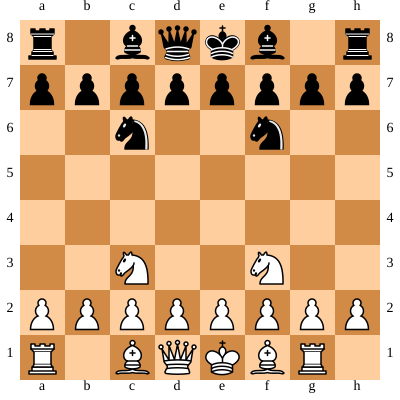

In [ ]:
import chess.pgn
import datetime
import time



movehistory1 =[]
movehistory2 = []
movehistory = []
game = chess.pgn.Game()
game.headers["Event"] = "Example"
game.headers["Site"] = "Linz"
game.headers["Date"] = str(datetime.datetime.now().date())
game.headers["Round"] = 1
game.headers["White"] = "MyChess"
game.headers["Black"] = "MyChess"
board = chess.Board()
while not board.is_game_over(claim_draw=True):
    start = time.time()
    nodes_per_depth = dict()
    if board.turn:
        
        print("WHITE Turn")
        move = selectmove_negamax(4,movehistory)
        board.push(move)       
    else:
        print("BLACK Turn")
        move = selectmove_negamax(4,movehistory)
        board.push(move)  
    end = time.time()
    print("Move in UCI format:", move)
    print("Nodes per depth:", nodes_per_depth)
    print("Time taken by Move:", end-start) 
    display(SVG(chess.svg.board(board, size=400)))  
    print("\n")

game.add_line(movehistory)
game.headers["Result"] = str(board.result(claim_draw=True))
print(game)
print(game, file=open("selftest.pgn", "w"), end="\n\n")

SVG(chess.svg.board(board=board,size=400))

In [ ]:
game.add_line(movehistory1)
print(game)

[Event "Example"]
[Site "Linz"]
[Date "2022-01-29"]
[Round "1"]
[White "MyChess"]
[Black "MyChess"]
[Result "1/2-1/2"]

1. Nf3 ( 1. Nf3 Nc3 2. Rg1 Rh1 3. Rg1 Rh1 4. Rg1 ) ( 1. Nf3 Nc3 2. Rg1 Rh1 3. Rg1 Rh1 4. Rg1 ) 1... Nf6 2. Ne5 d6 3. Nc4 d5 4. Ne5 Nbd7 5. d4 Nxe5 6. dxe5 Ne4 7. Qd4 c5 8. Qa4+ Bd7 9. Qa3 e6 10. Bf4 c4 11. b4 Qb6 12. e3 Bxb4+ 13. Nc3 Bxc3+ 14. Kd1 Bxa1 15. Ke2 Bb2 16. f3 Bxa3 17. fxe4 dxe4 18. Kf2 Qb1 19. Kg1 Qxc2 20. Bg5 Qxa2 21. Bf4 Bc5 22. Bg5 Qb3 23. Bf4 Bxe3+ 24. Bxe3 Qxe3# 1/2-1/2


In [ ]:
print(movehistory1)

[Move.from_uci('g1f3'), Move.from_uci('b1c3'), Move.from_uci('h1g1'), Move.from_uci('g1h1'), Move.from_uci('h1g1'), Move.from_uci('g1h1'), Move.from_uci('h1g1')]


### Negamax vs Negamax - depth : 4 - 3
In the following, Negmax with max depth 4 is playing agaist Negamax with max depth 3

WHITE Turn
Move in UCI format: g1f3
Nodes per depth: {1: 20, 2: 400, 3: 8902, 4: 197281}
Time taken by Move: 18.57419753074646


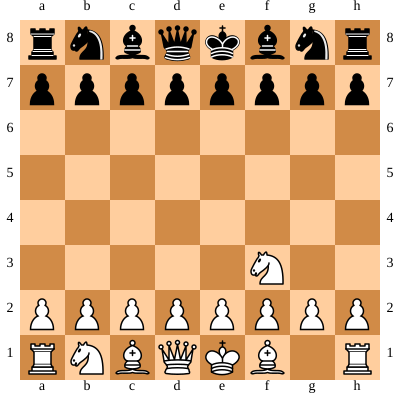



BLACK Turn
Move in UCI format: g8f6
Nodes per depth: {1: 20, 2: 440, 3: 9748}
Time taken by Move: 0.9256978034973145


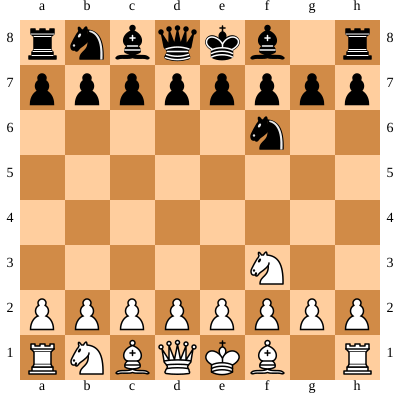



WHITE Turn
Move in UCI format: b1c3
Nodes per depth: {1: 22, 2: 482, 3: 11542, 4: 275111}
Time taken by Move: 25.318642139434814


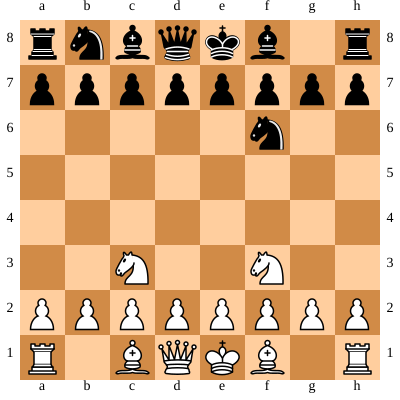



BLACK Turn
Move in UCI format: b8c6
Nodes per depth: {1: 22, 2: 526, 3: 12546}
Time taken by Move: 1.1545863151550293


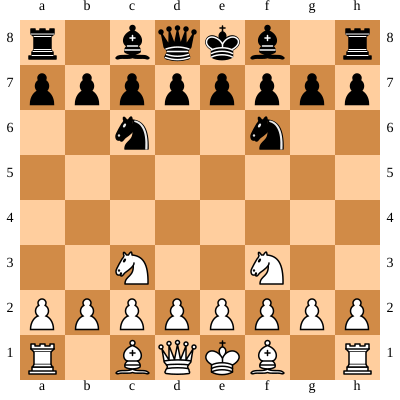



WHITE Turn
Move in UCI format: h1g1
Nodes per depth: {1: 24, 2: 572, 3: 14717, 4: 373496}
Time taken by Move: 34.09926509857178


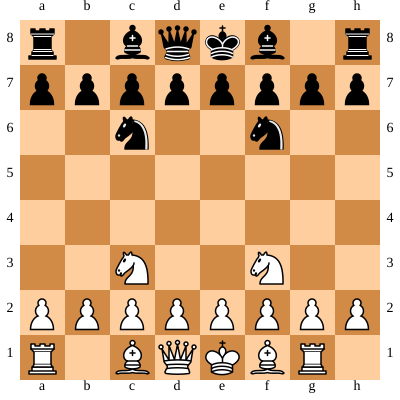



BLACK Turn
Move in UCI format: f6g4
Nodes per depth: {1: 24, 2: 548, 3: 14094}
Time taken by Move: 1.306236743927002


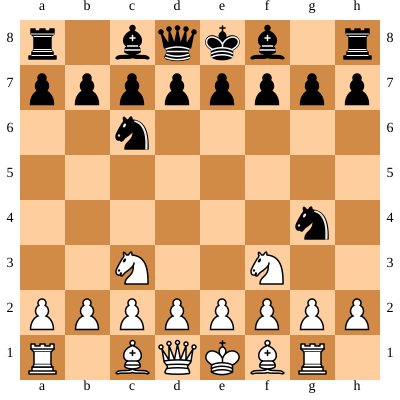



WHITE Turn
Move in UCI format: h2h3
Nodes per depth: {1: 22, 2: 590, 3: 14442, 4: 391812}
Time taken by Move: 35.797497510910034


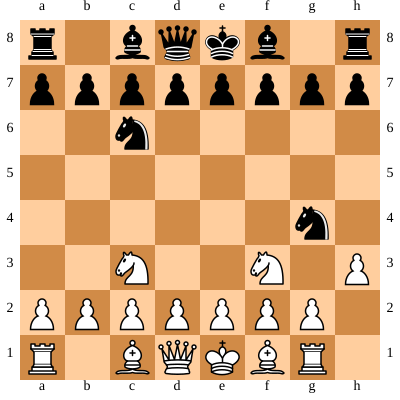



BLACK Turn
Move in UCI format: g4f6
Nodes per depth: {1: 27, 2: 620, 3: 16997}
Time taken by Move: 1.5929224491119385


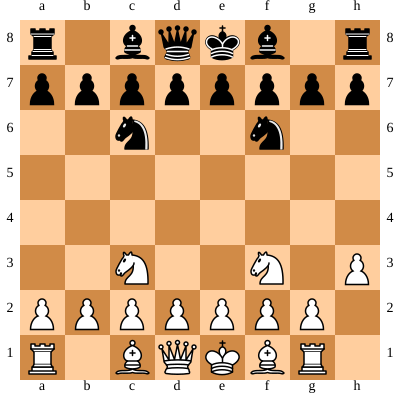



WHITE Turn
Move in UCI format: h3h4
Nodes per depth: {1: 23, 2: 548, 3: 13644, 4: 345753}
Time taken by Move: 32.33398222923279


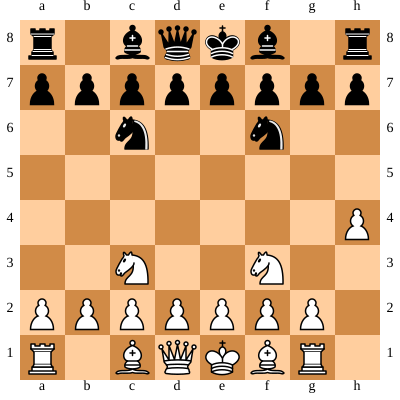



BLACK Turn
Move in UCI format: f6g4
Nodes per depth: {1: 24, 2: 523, 3: 13425}
Time taken by Move: 1.2415878772735596


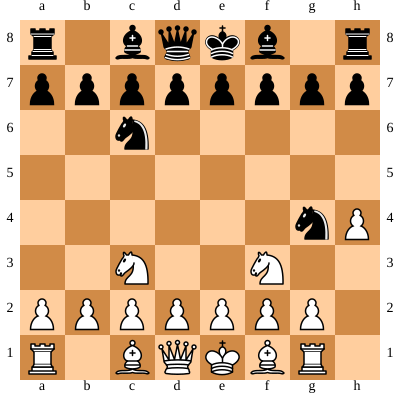



WHITE Turn
Move in UCI format: e2e4
Nodes per depth: {1: 21, 2: 562, 3: 13363, 4: 360946}
Time taken by Move: 33.65324354171753


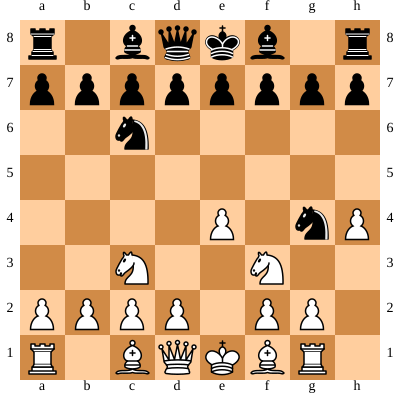



BLACK Turn
Move in UCI format: e7e5
Nodes per depth: {1: 27, 2: 733, 3: 20150}
Time taken by Move: 1.8693885803222656


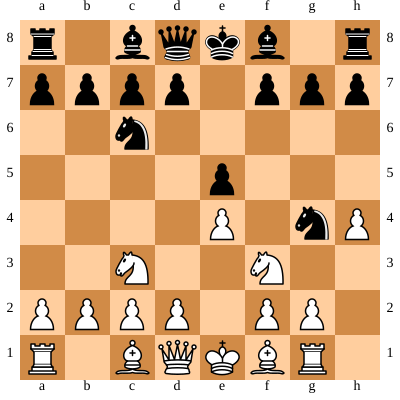



WHITE Turn
Move in UCI format: f1b5
Nodes per depth: {1: 26, 2: 879, 3: 24441, 4: 832146}
Time taken by Move: 77.52300763130188


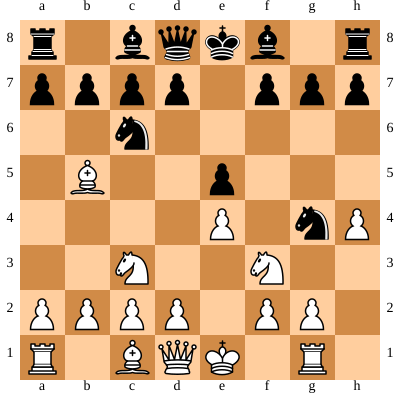



BLACK Turn
Move in UCI format: c6e7
Nodes per depth: {1: 33, 2: 966, 3: 31861}
Time taken by Move: 2.9670345783233643


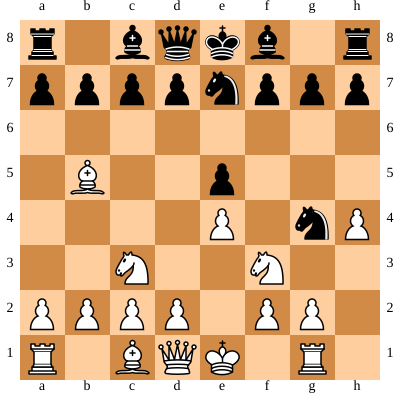



WHITE Turn
Move in UCI format: d2d3
Nodes per depth: {1: 30, 2: 687, 3: 21215, 4: 536260}
Time taken by Move: 49.35578799247742


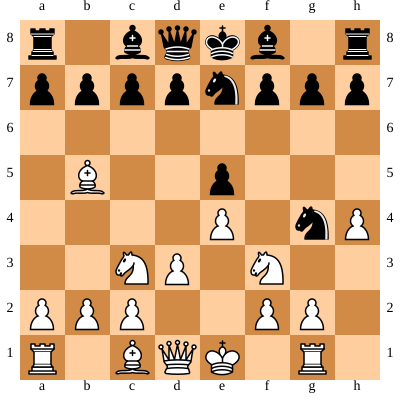



BLACK Turn
Move in UCI format: a7a6
Nodes per depth: {1: 23, 2: 784, 3: 19325}
Time taken by Move: 1.8134949207305908


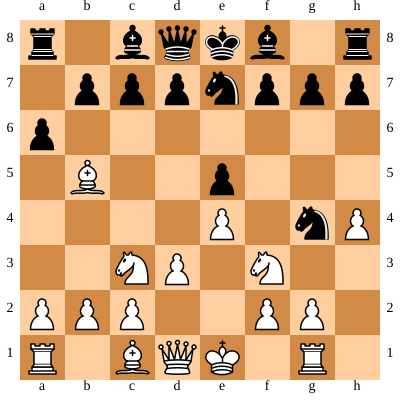



WHITE Turn
Move in UCI format: b5a4
Nodes per depth: {1: 34, 2: 800, 3: 28147, 4: 722496}
Time taken by Move: 69.97057437896729


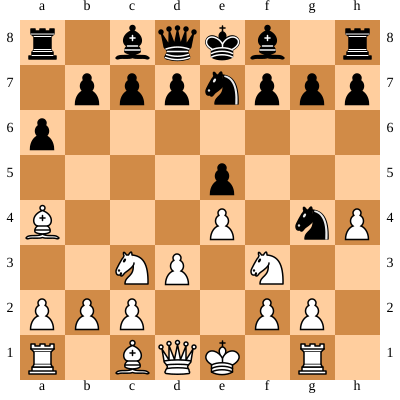



BLACK Turn
Move in UCI format: h8g8
Nodes per depth: {1: 24, 2: 768, 3: 19476}
Time taken by Move: 1.833559513092041


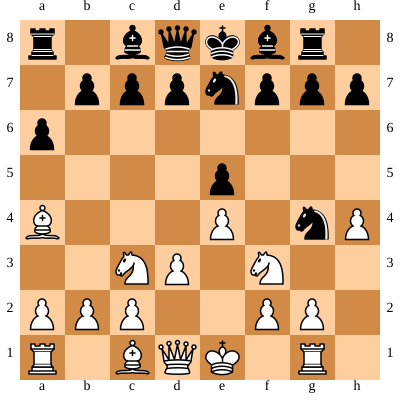



WHITE Turn
Move in UCI format: e1f1
Nodes per depth: {1: 32, 2: 720, 3: 24149, 4: 590316}
Time taken by Move: 54.744821310043335


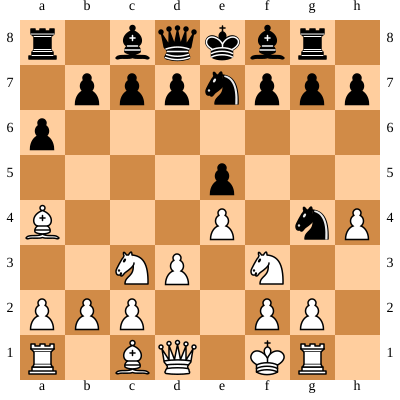



BLACK Turn
Move in UCI format: g8h8
Nodes per depth: {1: 23, 2: 681, 3: 16705}
Time taken by Move: 1.586064338684082


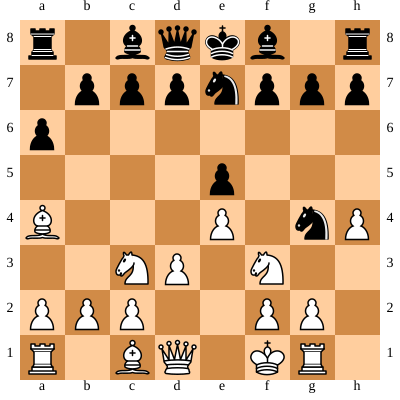



WHITE Turn
Move in UCI format: c1g5
Nodes per depth: {1: 32, 2: 751, 3: 23465, 4: 598454}
Time taken by Move: 55.696357011795044


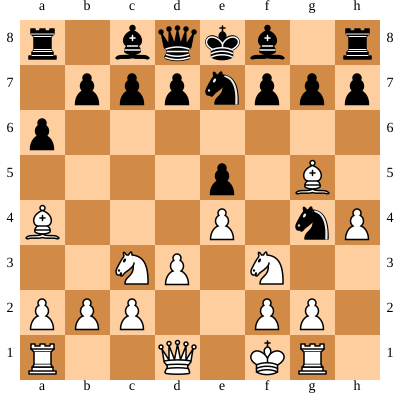



BLACK Turn
Move in UCI format: f7f6
Nodes per depth: {1: 23, 2: 768, 3: 18850}
Time taken by Move: 1.8044953346252441


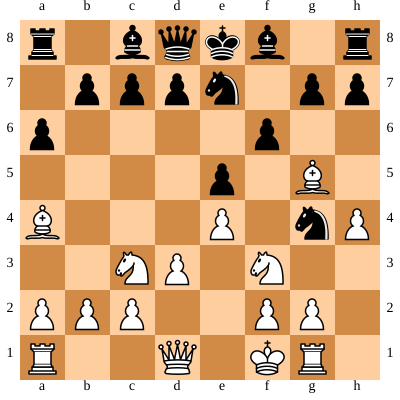



WHITE Turn
Move in UCI format: g5d2
Nodes per depth: {1: 35, 2: 792, 3: 26185, 4: 643652}
Time taken by Move: 60.144195318222046


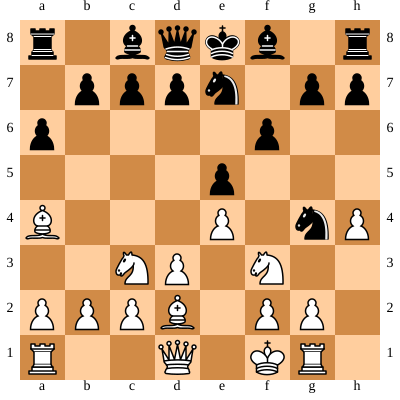



BLACK Turn
Move in UCI format: h8g8
Nodes per depth: {1: 23, 2: 722, 3: 17645}
Time taken by Move: 1.6846659183502197


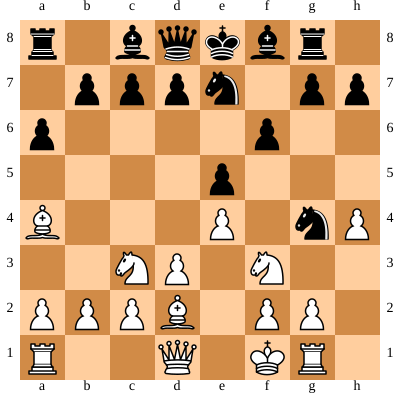



WHITE Turn
Move in UCI format: d3d4
Nodes per depth: {1: 34, 2: 734, 3: 23687, 4: 561610}
Time taken by Move: 51.956584215164185


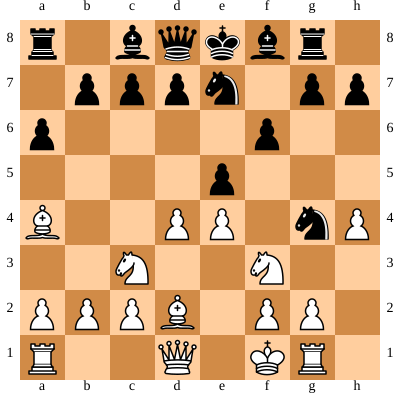



BLACK Turn
Move in UCI format: e5d4
Nodes per depth: {1: 23, 2: 722, 3: 17734}
Time taken by Move: 1.6874206066131592


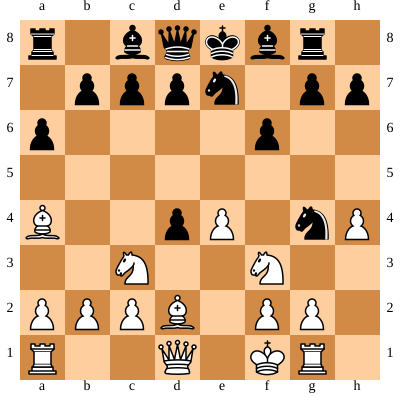



WHITE Turn
Move in UCI format: f3d4
Nodes per depth: {1: 34, 2: 825, 3: 27240, 4: 704315}
Time taken by Move: 64.85401201248169


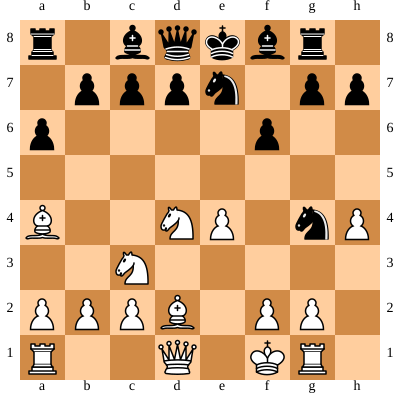



BLACK Turn
Move in UCI format: f6f5
Nodes per depth: {1: 23, 2: 848, 3: 20834}
Time taken by Move: 1.9378387928009033


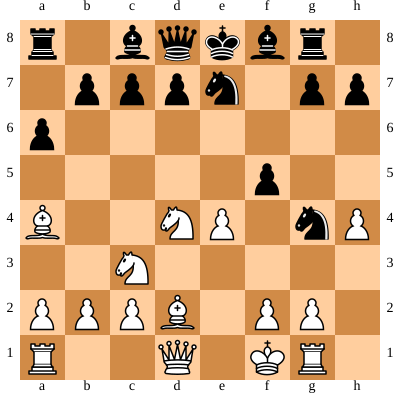



WHITE Turn
Move in UCI format: e4f5
Nodes per depth: {1: 41, 2: 958, 3: 35904, 4: 895748}
Time taken by Move: 82.09232330322266


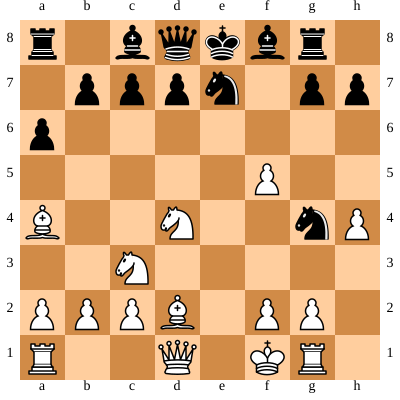



BLACK Turn
Move in UCI format: h7h5
Nodes per depth: {1: 23, 2: 850, 3: 20832}
Time taken by Move: 1.9316682815551758


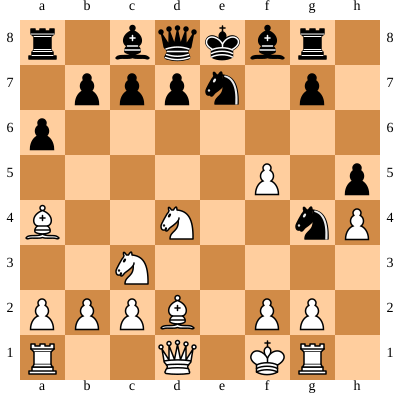



WHITE Turn
Move in UCI format: a4b3
Nodes per depth: {1: 39, 2: 797, 3: 28760, 4: 660079}
Time taken by Move: 60.05053758621216


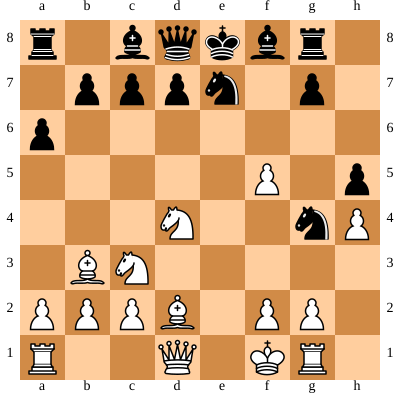



BLACK Turn
Move in UCI format: g8h8
Nodes per depth: {1: 22, 2: 809, 3: 19219}
Time taken by Move: 1.7729871273040771


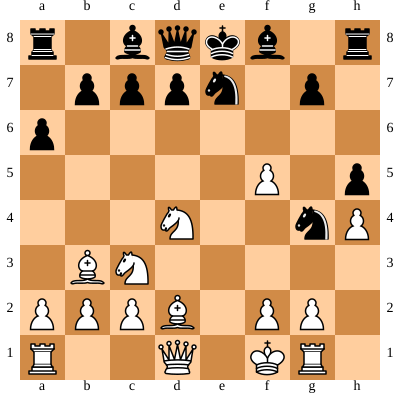



WHITE Turn
Move in UCI format: d2g5
Nodes per depth: {1: 40, 2: 963, 3: 36447, 4: 936466}
Time taken by Move: 84.89333915710449


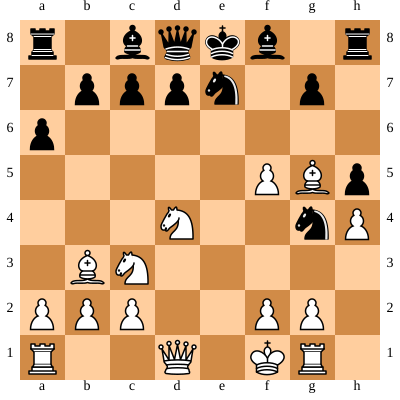



BLACK Turn
Move in UCI format: g4h2
Nodes per depth: {1: 24, 2: 958, 3: 24087}
Time taken by Move: 2.213632822036743


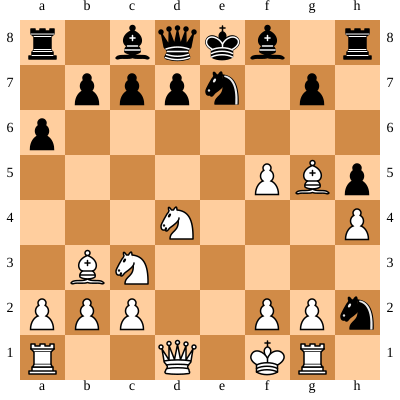



WHITE Turn
Move in UCI format: f1e2
Nodes per depth: {1: 2, 2: 42, 3: 1826, 4: 42388}
Time taken by Move: 3.9234695434570312


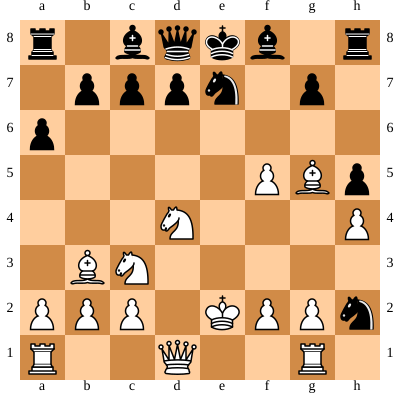



BLACK Turn
Move in UCI format: h2g4
Nodes per depth: {1: 21, 2: 921, 3: 21679}
Time taken by Move: 2.0319859981536865


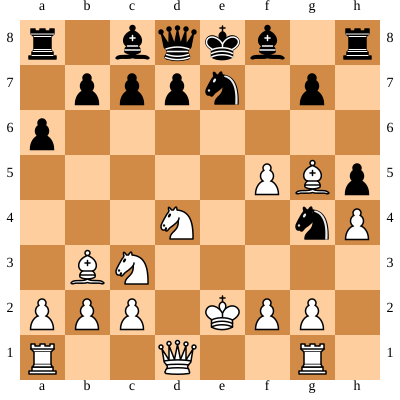



WHITE Turn
Move in UCI format: c3e4
Nodes per depth: {1: 44, 2: 1042, 3: 46165, 4: 1171948}
Time taken by Move: 106.7813413143158


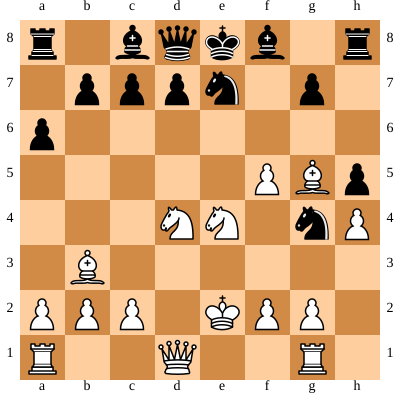



BLACK Turn
Move in UCI format: d7d5
Nodes per depth: {1: 24, 2: 1132, 3: 27806}
Time taken by Move: 2.5878753662109375


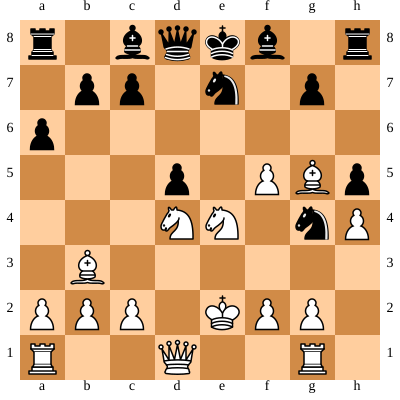



WHITE Turn
Move in UCI format: b3a4
Nodes per depth: {1: 44, 2: 1208, 3: 53278, 4: 1580577}
Time taken by Move: 145.25601196289062


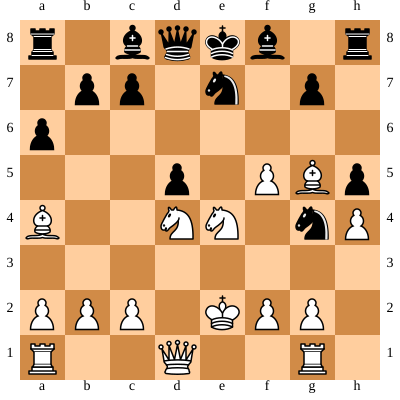



BLACK Turn
Move in UCI format: e8f7
Nodes per depth: {1: 6, 2: 280, 3: 7800}
Time taken by Move: 0.7625014781951904


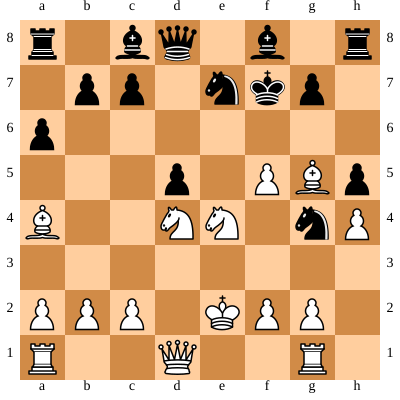



WHITE Turn
Move in UCI format: d4e6
Nodes per depth: {1: 48, 2: 1346, 3: 63514, 4: 1921115}
Time taken by Move: 175.6156723499298


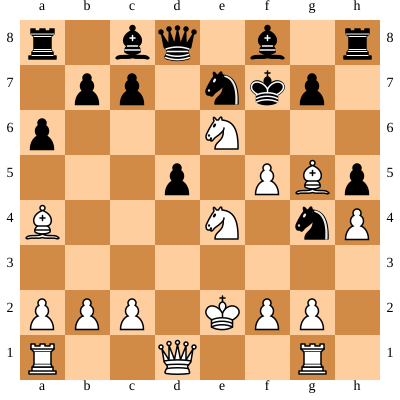



BLACK Turn
Move in UCI format: c8e6
Nodes per depth: {1: 29, 2: 1494, 3: 44263}
Time taken by Move: 4.069680690765381


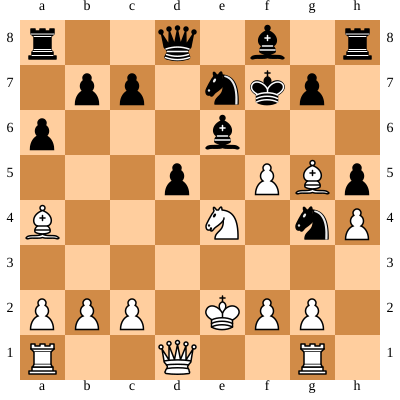



WHITE Turn
Move in UCI format: f5e6
Nodes per depth: {1: 46, 2: 1470, 3: 66573, 4: 2203545}
Time taken by Move: 199.5477294921875


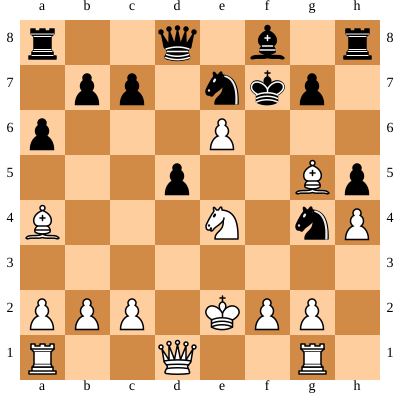



BLACK Turn
Move in UCI format: f7e6
Nodes per depth: {1: 3, 2: 132, 3: 3897}
Time taken by Move: 0.3831369876861572


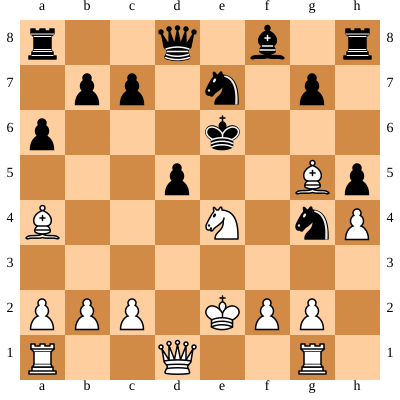



WHITE Turn
Move in UCI format: a4b3
Nodes per depth: {1: 44, 2: 1363, 3: 59075, 4: 1877500}
Time taken by Move: 169.33526515960693


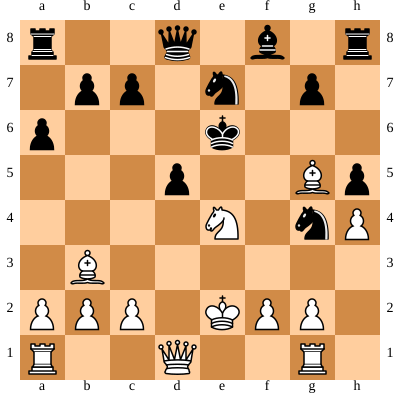



BLACK Turn
Move in UCI format: e6f7
Nodes per depth: {1: 32, 2: 1321, 3: 40834}
Time taken by Move: 3.7428245544433594


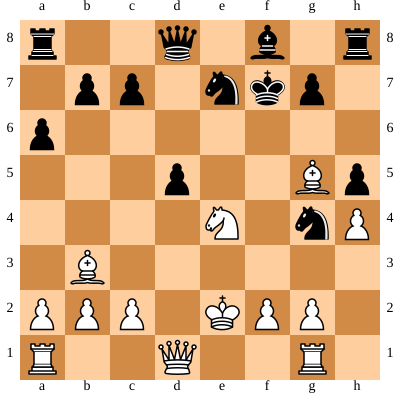



WHITE Turn
Move in UCI format: e2f1
Nodes per depth: {1: 41, 2: 1238, 3: 50591, 4: 1579956}
Time taken by Move: 142.24023127555847


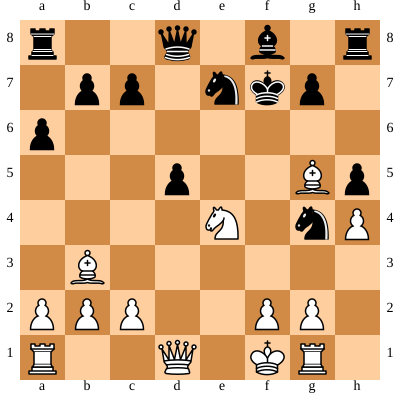



BLACK Turn
Move in UCI format: f7g8
Nodes per depth: {1: 32, 2: 1158, 3: 35005}
Time taken by Move: 3.1082422733306885


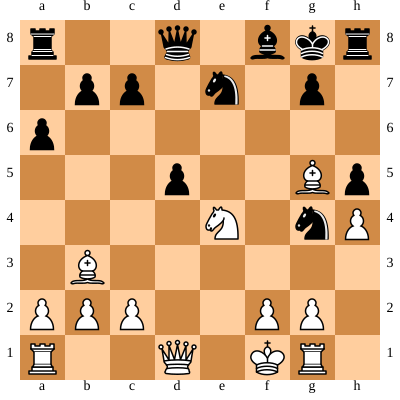



WHITE Turn
Move in UCI format: d1d3
Nodes per depth: {1: 38, 2: 995, 3: 35861, 4: 1020569}
Time taken by Move: 91.78417778015137


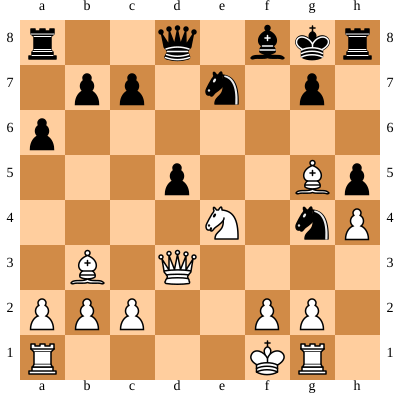



BLACK Turn
Move in UCI format: d8d7
Nodes per depth: {1: 28, 2: 1131, 3: 31993}
Time taken by Move: 2.9124114513397217


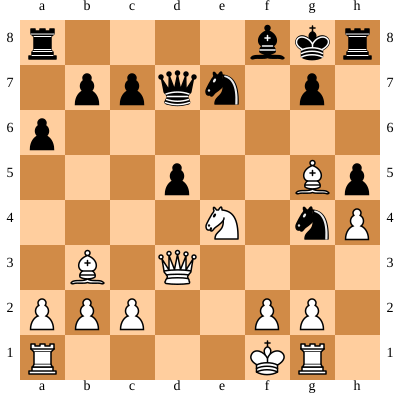



WHITE Turn
Move in UCI format: e4c5
Nodes per depth: {1: 43, 2: 1378, 3: 55534, 4: 1831321}
Time taken by Move: 164.9278588294983


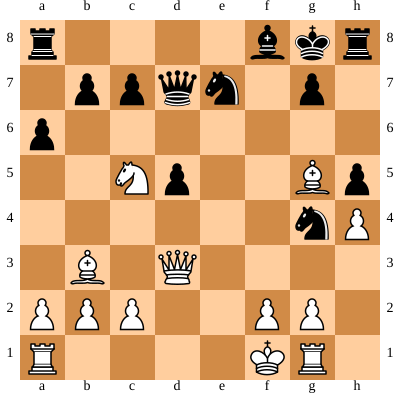



BLACK Turn
Move in UCI format: d7d6
Nodes per depth: {1: 32, 2: 1399, 3: 43747}
Time taken by Move: 3.9849064350128174


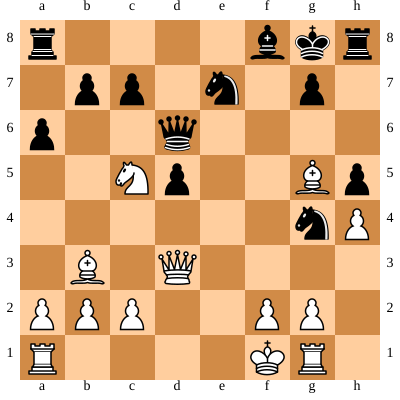



WHITE Turn
Move in UCI format: g5e7
Nodes per depth: {1: 47, 2: 1623, 3: 69080, 4: 2347551}
Time taken by Move: 210.95246005058289


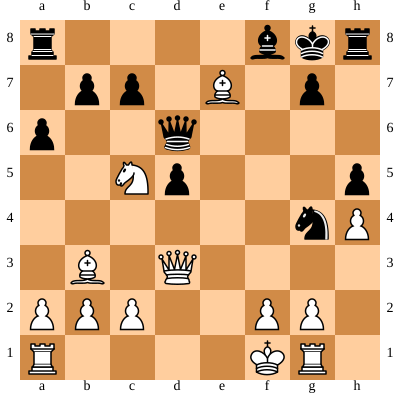



BLACK Turn
Move in UCI format: f8e7
Nodes per depth: {1: 35, 2: 1467, 3: 47297}
Time taken by Move: 4.26603627204895


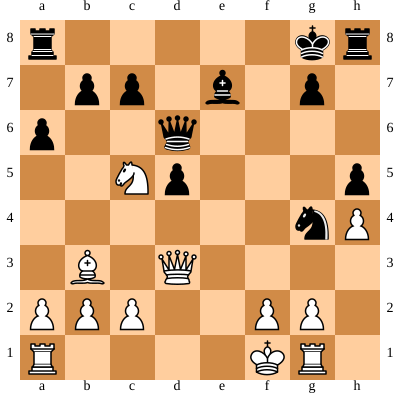



WHITE Turn
Move in UCI format: d3d5
Nodes per depth: {1: 40, 2: 1512, 3: 55734, 4: 2118303}
Time taken by Move: 186.20248699188232


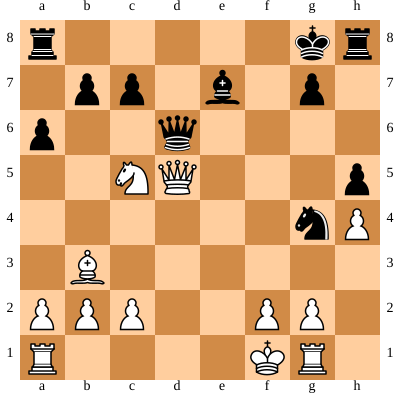



BLACK Turn
Move in UCI format: d6d5
Nodes per depth: {1: 4, 2: 142, 3: 5054}
Time taken by Move: 0.4801182746887207


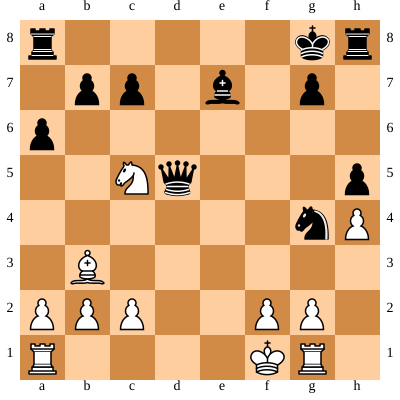



WHITE Turn
Move in UCI format: b3d5
Nodes per depth: {1: 24, 2: 847, 3: 19117, 4: 715056}
Time taken by Move: 62.85787582397461


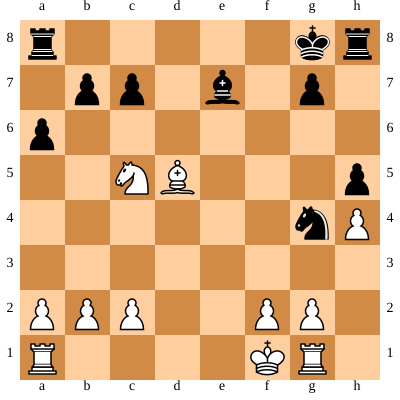



BLACK Turn
Move in UCI format: g8h7
Nodes per depth: {1: 2, 2: 66, 3: 1950}
Time taken by Move: 0.19144892692565918


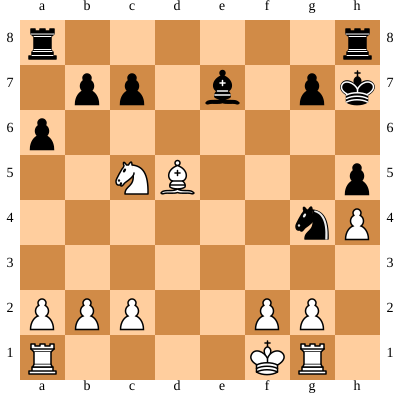



WHITE Turn
Move in UCI format: d5e4
Nodes per depth: {1: 33, 2: 1086, 3: 32954, 4: 1036022}
Time taken by Move: 88.67328953742981


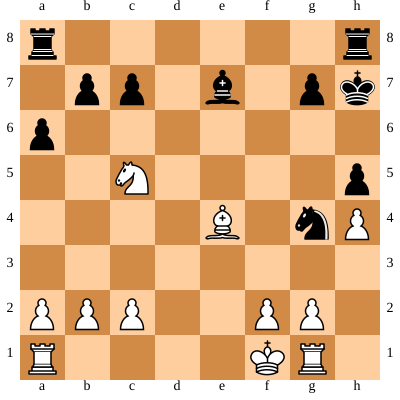



BLACK Turn
Move in UCI format: g7g6
Nodes per depth: {1: 3, 2: 92, 3: 2863}
Time taken by Move: 0.2809939384460449


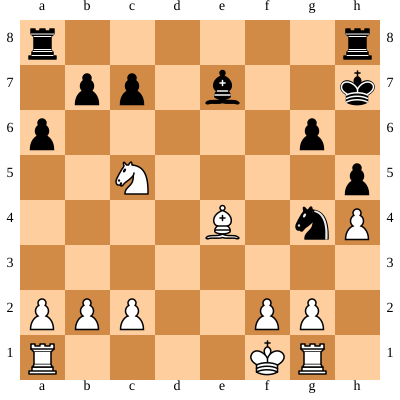



WHITE Turn
Move in UCI format: c5b7
Nodes per depth: {1: 30, 2: 982, 3: 28177, 4: 887522}
Time taken by Move: 75.7148551940918


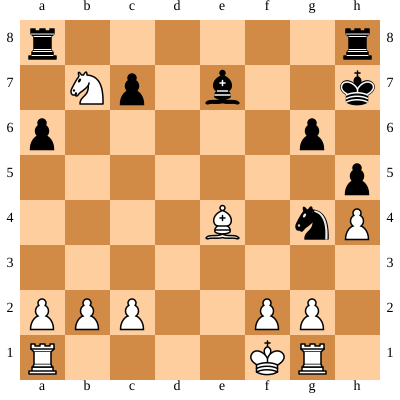



BLACK Turn
Move in UCI format: h8b8
Nodes per depth: {1: 34, 2: 838, 3: 25845}
Time taken by Move: 2.2448182106018066


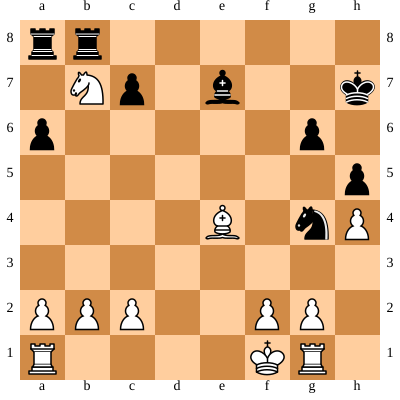



WHITE Turn
Move in UCI format: b7a5
Nodes per depth: {1: 26, 2: 765, 3: 19945, 4: 594354}
Time taken by Move: 50.60753893852234


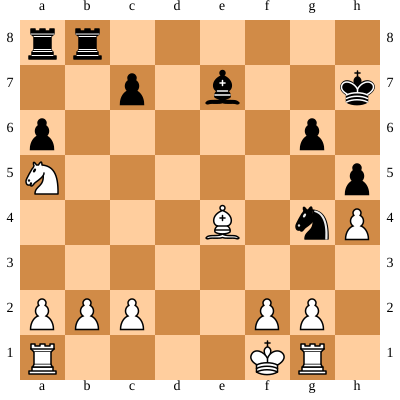



BLACK Turn
Move in UCI format: g4h2
Nodes per depth: {1: 34, 2: 896, 3: 29073}
Time taken by Move: 2.512145757675171


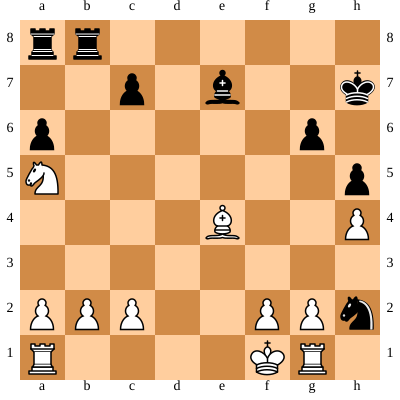



WHITE Turn
Move in UCI format: f1e2
Nodes per depth: {1: 2, 2: 62, 3: 2021, 4: 61055}
Time taken by Move: 5.209626197814941


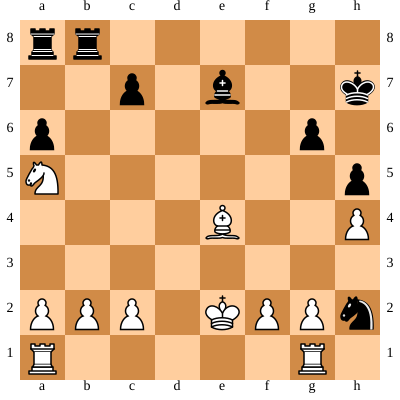



BLACK Turn
Move in UCI format: a8a7
Nodes per depth: {1: 31, 2: 1154, 3: 34975}
Time taken by Move: 3.047297477722168


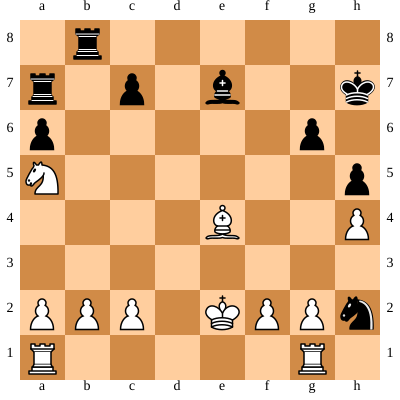



WHITE Turn
Move in UCI format: a5c6
Nodes per depth: {1: 38, 2: 1217, 3: 43642, 4: 1301767}
Time taken by Move: 110.56212878227234


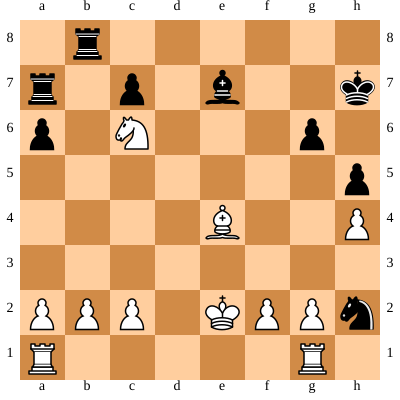



BLACK Turn
Move in UCI format: h2f3
Nodes per depth: {1: 32, 2: 1227, 3: 35346}
Time taken by Move: 3.047257423400879


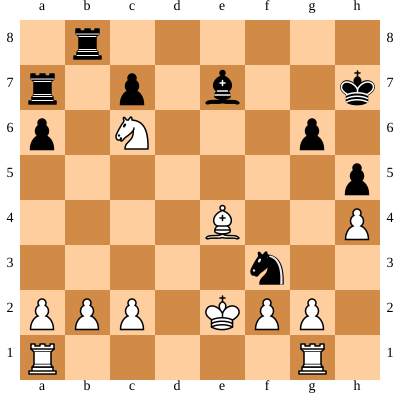



WHITE Turn
Move in UCI format: g2f3
Nodes per depth: {1: 38, 2: 1332, 3: 46732, 4: 1478915}
Time taken by Move: 125.15493607521057


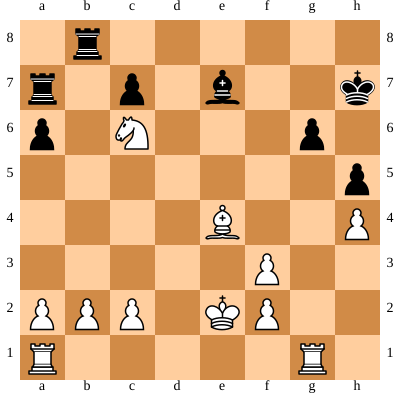



BLACK Turn
Move in UCI format: b8b4
Nodes per depth: {1: 29, 2: 1172, 3: 29515}
Time taken by Move: 2.509167432785034


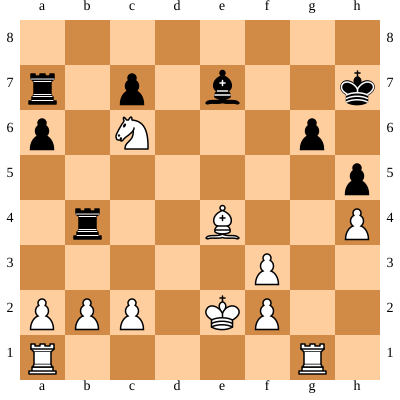



WHITE Turn
Move in UCI format: e4g6
Nodes per depth: {1: 40, 2: 939, 3: 34255, 4: 827009}
Time taken by Move: 69.91848516464233


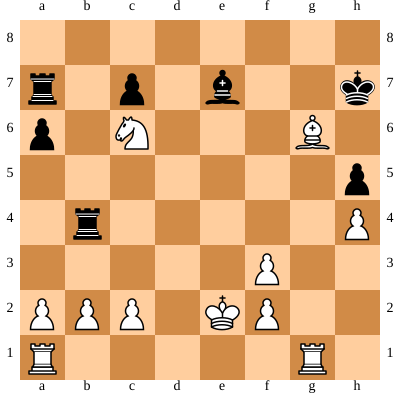



BLACK Turn
Move in UCI format: h7g8
Nodes per depth: {1: 4, 2: 168, 3: 3928}
Time taken by Move: 0.37959933280944824


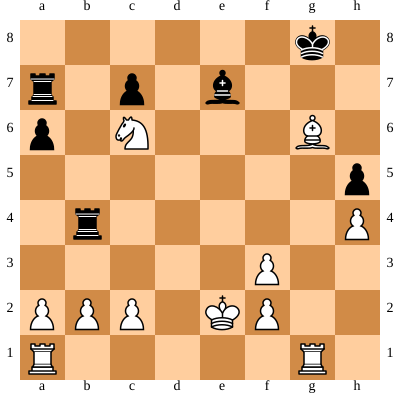



WHITE Turn
Move in UCI format: g6h5
Nodes per depth: {1: 42, 2: 905, 3: 34218, 4: 747619}
Time taken by Move: 64.13571882247925


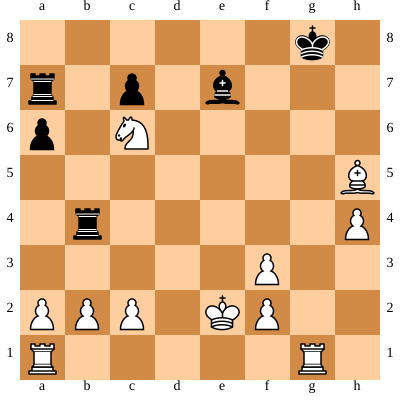



BLACK Turn
Move in UCI format: g8h8
Nodes per depth: {1: 5, 2: 204, 3: 4524}
Time taken by Move: 0.4183967113494873


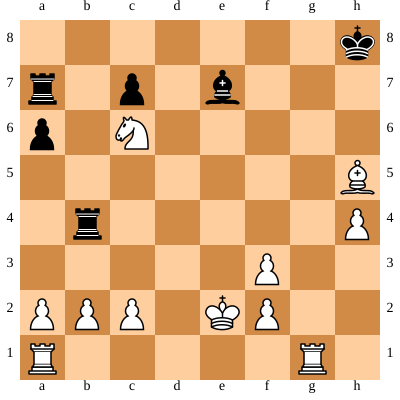



WHITE Turn
Move in UCI format: c6a7
Nodes per depth: {1: 42, 2: 980, 3: 36484, 4: 853119}
Time taken by Move: 71.70860457420349


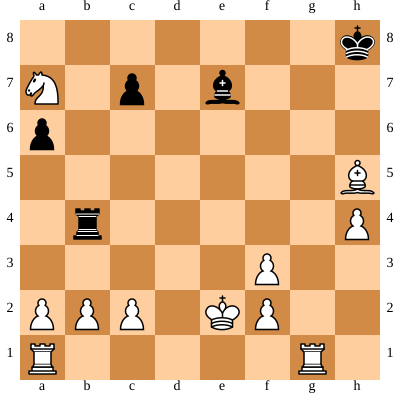



BLACK Turn
Move in UCI format: b4b2
Nodes per depth: {1: 24, 2: 848, 3: 19830}
Time taken by Move: 1.69685697555542


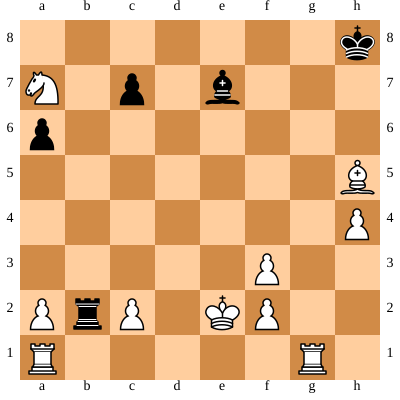



WHITE Turn
Move in UCI format: h5g6
Nodes per depth: {1: 34, 2: 738, 3: 22620, 4: 485183}
Time taken by Move: 40.66968512535095


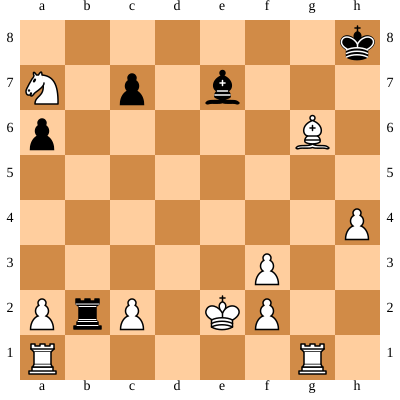



BLACK Turn
Move in UCI format: e7h4
Nodes per depth: {1: 23, 2: 775, 3: 17069}
Time taken by Move: 1.4747047424316406


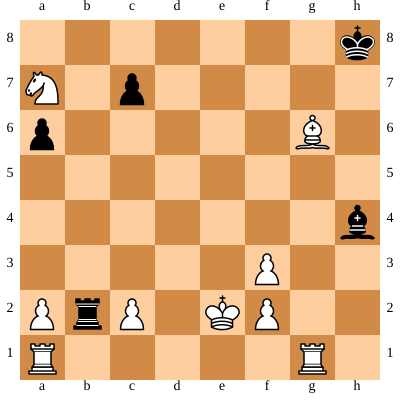



WHITE Turn
Move in UCI format: g1h1
Nodes per depth: {1: 34, 2: 656, 3: 20763, 4: 412211}
Time taken by Move: 34.26849961280823


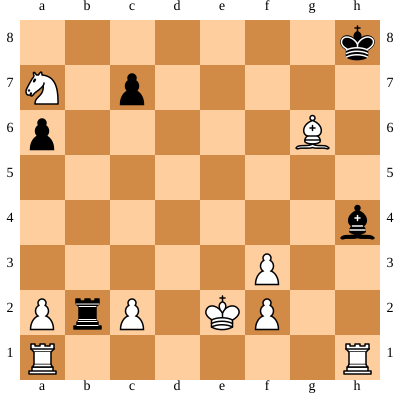



BLACK Turn
Move in UCI format: h8g7
Nodes per depth: {1: 14, 2: 453, 3: 7746}
Time taken by Move: 0.690575361251831


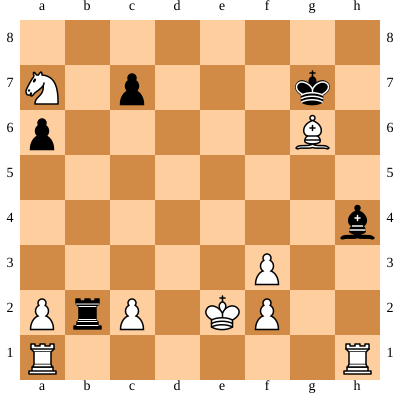



WHITE Turn
Move in UCI format: h1h4
Nodes per depth: {1: 34, 2: 802, 3: 25514, 4: 570460}
Time taken by Move: 46.96495819091797


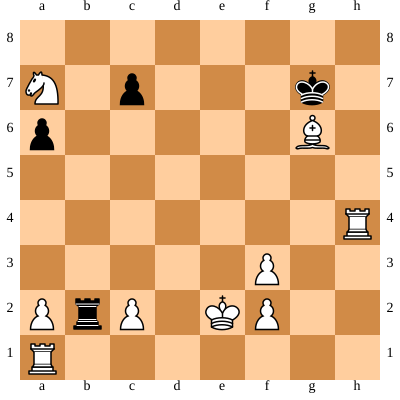



BLACK Turn
Move in UCI format: g7g6
Nodes per depth: {1: 16, 2: 602, 3: 10061}
Time taken by Move: 0.8559114933013916


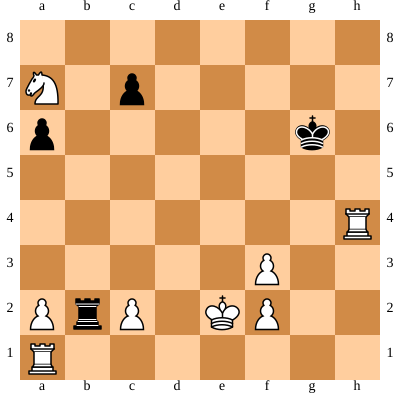



WHITE Turn
Move in UCI format: h4c4
Nodes per depth: {1: 33, 2: 528, 3: 16145, 4: 271261}
Time taken by Move: 21.893588542938232


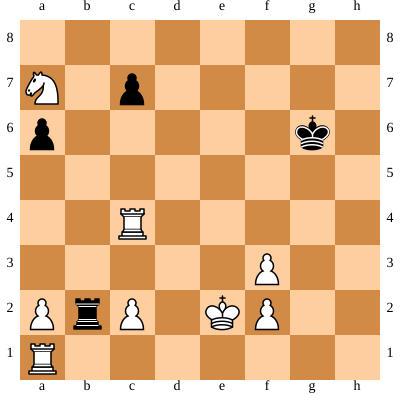



BLACK Turn
Move in UCI format: g6h6
Nodes per depth: {1: 20, 2: 569, 3: 9990}
Time taken by Move: 0.8330061435699463


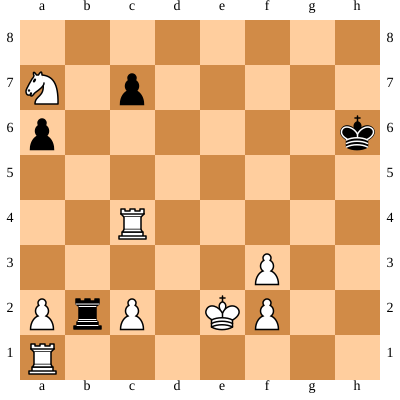



WHITE Turn
Move in UCI format: c4c7
Nodes per depth: {1: 30, 2: 447, 3: 12769, 4: 198361}
Time taken by Move: 15.86576533317566


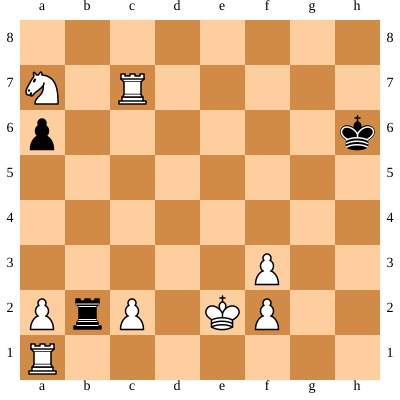



BLACK Turn
Move in UCI format: h6g6
Nodes per depth: {1: 13, 2: 370, 3: 5188}
Time taken by Move: 0.4357726573944092


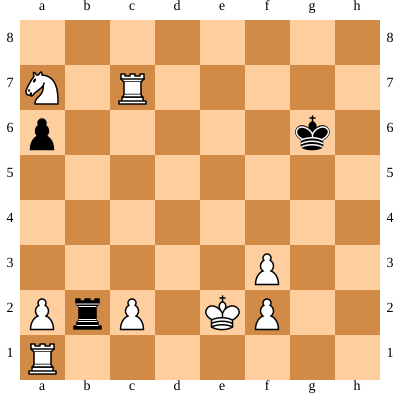



WHITE Turn
Move in UCI format: a1g1
Nodes per depth: {1: 30, 2: 421, 3: 12254, 4: 184452}
Time taken by Move: 14.853326797485352


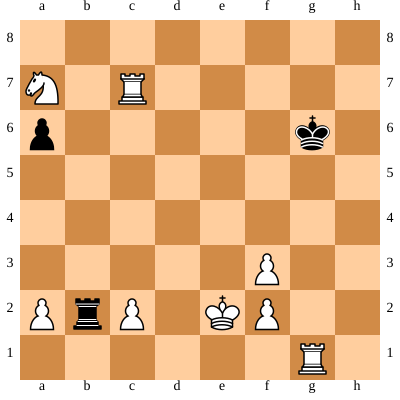



BLACK Turn
Move in UCI format: g6f6
Nodes per depth: {1: 4, 2: 148, 3: 1743}
Time taken by Move: 0.16593194007873535


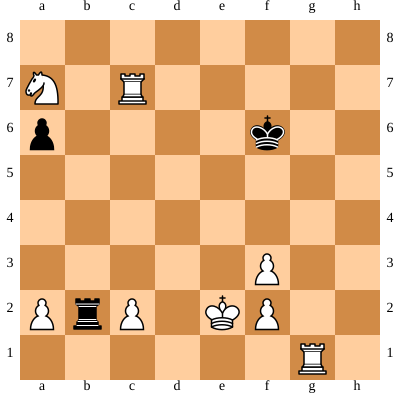



WHITE Turn
Move in UCI format: a2a3
Nodes per depth: {1: 37, 2: 465, 3: 15515, 4: 222524}
Time taken by Move: 18.05199122428894


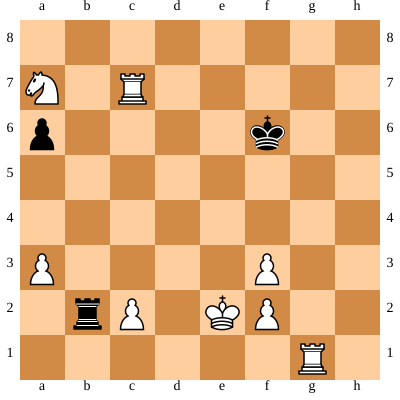



BLACK Turn
Move in UCI format: b2a2
Nodes per depth: {1: 13, 2: 448, 3: 6341}
Time taken by Move: 0.5463354587554932


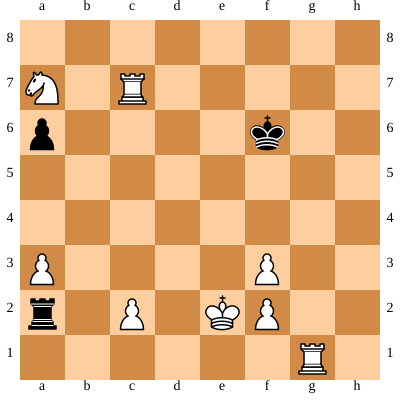



WHITE Turn
Move in UCI format: c7c6
Nodes per depth: {1: 36, 2: 292, 3: 8975, 4: 94617}
Time taken by Move: 7.895346641540527


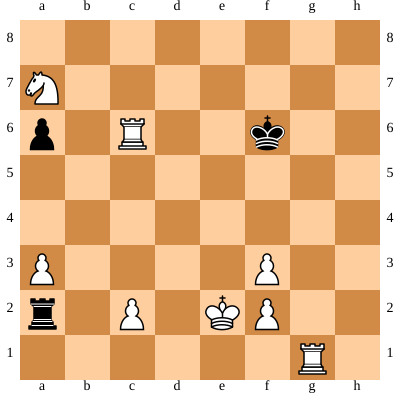



BLACK Turn
Move in UCI format: f6f7
Nodes per depth: {1: 4, 2: 144, 3: 1191}
Time taken by Move: 0.12490129470825195


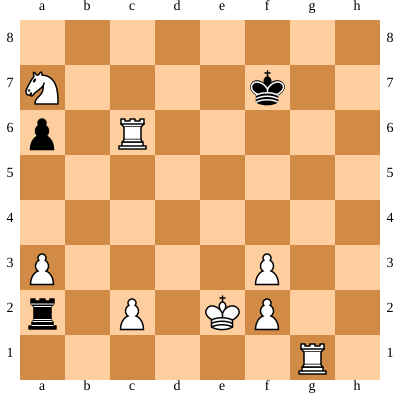



WHITE Turn
Move in UCI format: c6c7
Nodes per depth: {1: 36, 2: 292, 3: 8997, 4: 92424}
Time taken by Move: 7.644424676895142


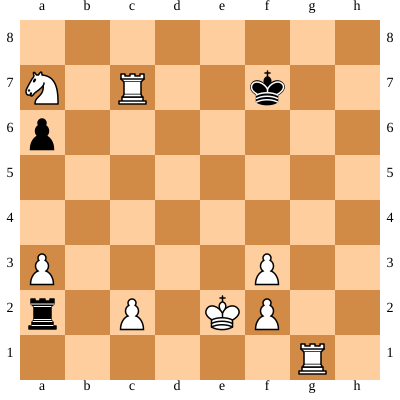



BLACK Turn
Move in UCI format: f7f8
Nodes per depth: {1: 4, 2: 144, 3: 1105}
Time taken by Move: 0.11098384857177734


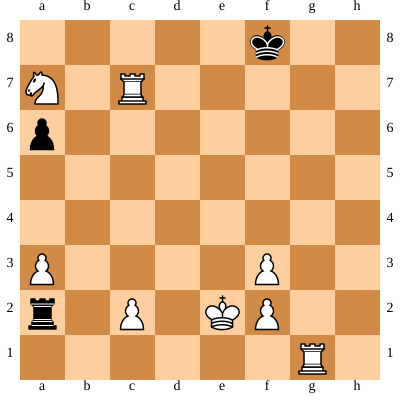



WHITE Turn
Move in UCI format: g1b1
Nodes per depth: {1: 36, 2: 220, 3: 6535, 4: 59334}
Time taken by Move: 5.039247989654541


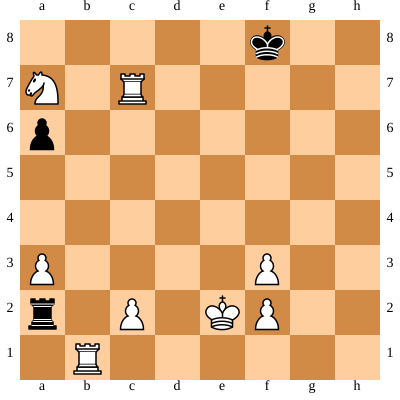



BLACK Turn
Move in UCI format: a2c2
Nodes per depth: {1: 7, 2: 217, 3: 1838}
Time taken by Move: 0.17586374282836914


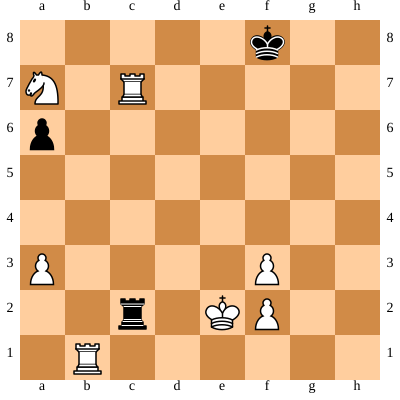



WHITE Turn
Move in UCI format: c7c2
Nodes per depth: {1: 6, 2: 76, 3: 2057, 4: 25870}
Time taken by Move: 2.147170066833496


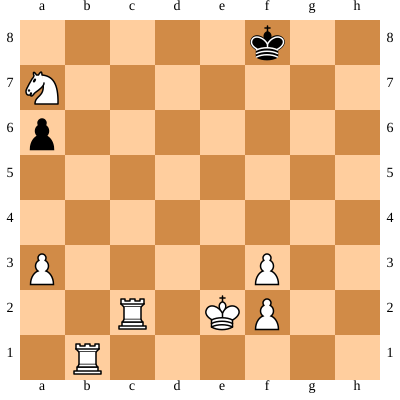



BLACK Turn
Move in UCI format: f8g7
Nodes per depth: {1: 6, 2: 210, 3: 1458}
Time taken by Move: 0.13058066368103027


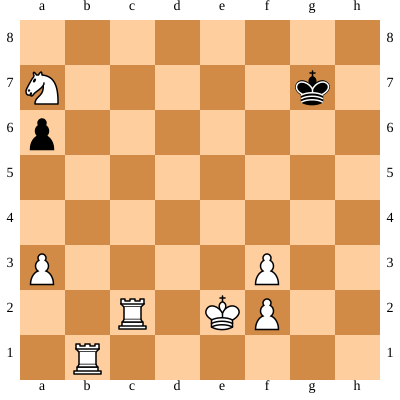



WHITE Turn
Move in UCI format: c2c7
Nodes per depth: {1: 35, 2: 293, 3: 9697, 4: 61412}
Time taken by Move: 5.094552278518677


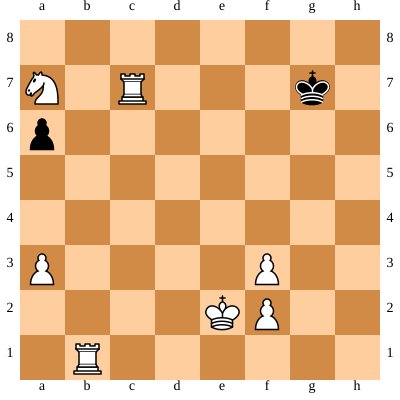



BLACK Turn
Move in UCI format: g7g6
Nodes per depth: {1: 6, 2: 228, 3: 960}
Time taken by Move: 0.10840845108032227


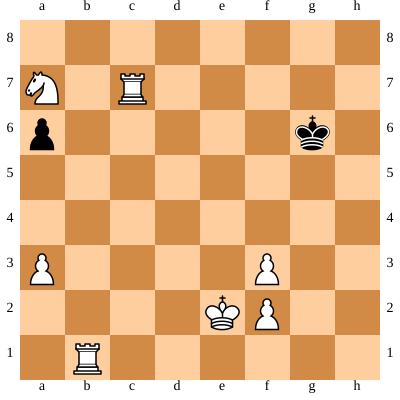



WHITE Turn
Move in UCI format: b1b6
Nodes per depth: {1: 38, 2: 231, 3: 8241, 4: 47249}
Time taken by Move: 4.0311667919158936


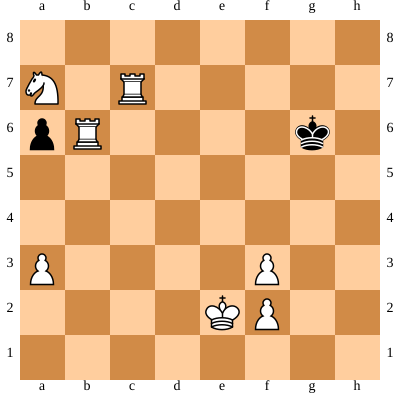



BLACK Turn
Move in UCI format: g6g5
Nodes per depth: {1: 3, 2: 114, 3: 480}
Time taken by Move: 0.061521291732788086


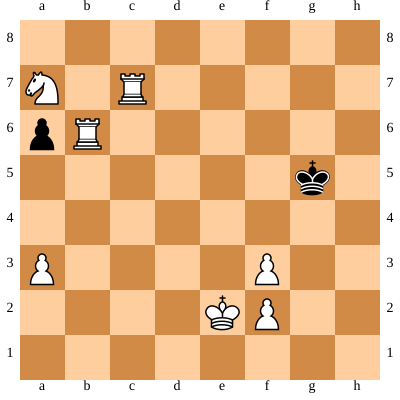



WHITE Turn
Move in UCI format: c7c5
Nodes per depth: {1: 38, 2: 197, 3: 6958, 4: 29243}
Time taken by Move: 2.6368141174316406


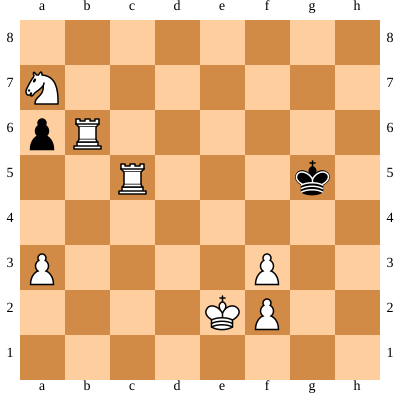



BLACK Turn
Move in UCI format: g5h4
Nodes per depth: {1: 2, 2: 76, 3: 153}
Time taken by Move: 0.02503490447998047


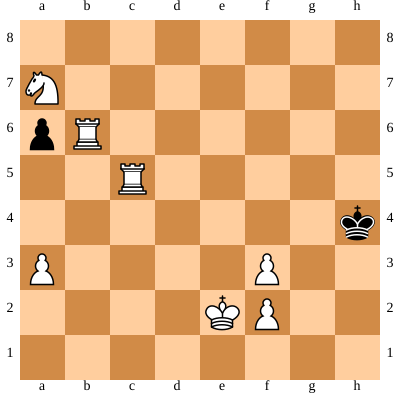



WHITE Turn
Move in UCI format: b6h6
Nodes per depth: {1: 39, 2: 90, 3: 3244, 4: 10679}
Time taken by Move: 1.0143978595733643


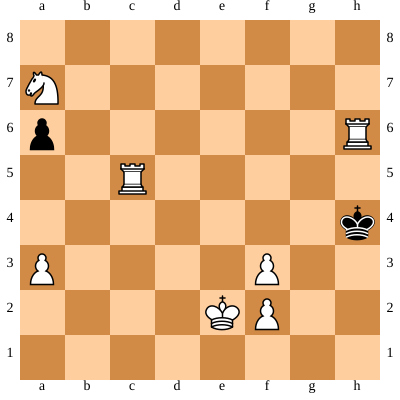



[Event "Example"]
[Site "Linz"]
[Date "2022-01-29"]
[Round "1"]
[White "MyChess"]
[Black "MyChess"]
[Result "1-0"]

1. Nf3 Nf6 2. Nc3 Nc6 3. Rg1 Ng4 4. h3 Nf6 5. h4 Ng4 6. e4 e5 7. Bb5 Ne7 8. d3 a6 9. Ba4 Rg8 10. Kf1 Rh8 11. Bg5 f6 12. Bd2 Rg8 13. d4 exd4 14. Nxd4 f5 15. exf5 h5 16. Bb3 Rh8 17. Bg5 Nh2+ 18. Ke2 Ng4 19. Ne4 d5 20. Ba4+ Kf7 21. Ne6 Bxe6 22. fxe6+ Kxe6 23. Bb3 Kf7 24. Kf1 Kg8 25. Qd3 Qd7 26. Nc5 Qd6 27. Bxe7 Bxe7 28. Qxd5+ Qxd5 29. Bxd5+ Kh7 30. Be4+ g6 31. Nxb7 Rhb8 32. Na5 Nh2+ 33. Ke2 Ra7 34. Nc6 Nf3 35. gxf3 Rb4 36. Bxg6+ Kg8 37. Bxh5+ Kh8 38. Nxa7 Rxb2 39. Bg6 Bxh4 40. Rh1 Kg7 41. Rxh4 Kxg6 42. Rc4 Kh6 43. Rxc7 Kg6 44. Rg1+ Kf6 45. a3 Ra2 46. Rc6+ Kf7 47. Rc7+ Kf8 48. Rb1 Rxc2+ 49. Rxc2 Kg7 50. Rc7+ Kg6 51. Rb6+ Kg5 52. Rc5+ Kh4 53. Rh6# 1-0


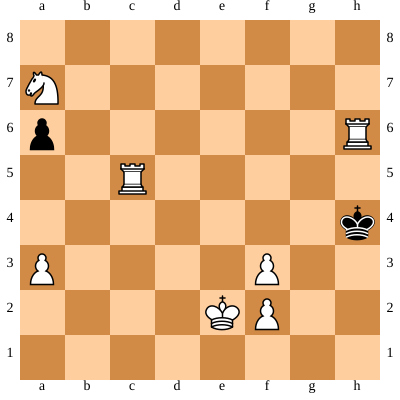

In [ ]:
import chess.pgn
import datetime
import time



movehistory = []
game = chess.pgn.Game()
game.headers["Event"] = "Example"
game.headers["Site"] = "Linz"
game.headers["Date"] = str(datetime.datetime.now().date())
game.headers["Round"] = 1
game.headers["White"] = "MyChess"
game.headers["Black"] = "MyChess"
board = chess.Board()
while not board.is_game_over(claim_draw=True):
    start = time.time()
    nodes_per_depth = dict()
    if board.turn:
        
        print("WHITE Turn")
        move = selectmove_negamax(4,movehistory)
        board.push(move)       
    else:
        print("BLACK Turn")
        move = selectmove_negamax(3,movehistory)
        board.push(move)  
    end = time.time()
    print("Move in UCI format:", move)
    print("Nodes per depth:", nodes_per_depth)
    print("Time taken by Move:", end-start) 
    display(SVG(chess.svg.board(board, size=400)))  
    print("\n")

game.add_line(movehistory)
game.headers["Result"] = str(board.result(claim_draw=True))
print(game)
print(game, file=open("selftest.pgn", "w"), end="\n\n")

SVG(chess.svg.board(board=board,size=400))

### Negamax_ab vs Negamax_ab
In the following, the players are using the alpha beta pruning

WHITE Turn
Move in UCI format: g1f3
Nodes per depth: {1: 20, 2: 63, 3: 694}
Time taken by Move: 0.06553006172180176


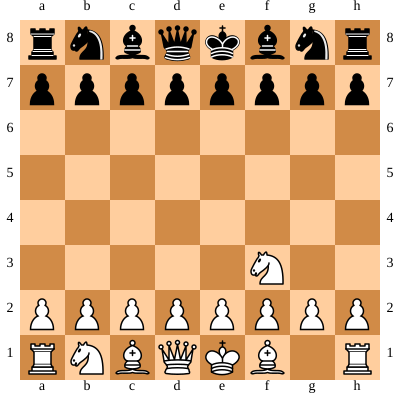



BLACK Turn
Move in UCI format: g8f6
Nodes per depth: {1: 20, 2: 93, 3: 938}
Time taken by Move: 0.10005760192871094


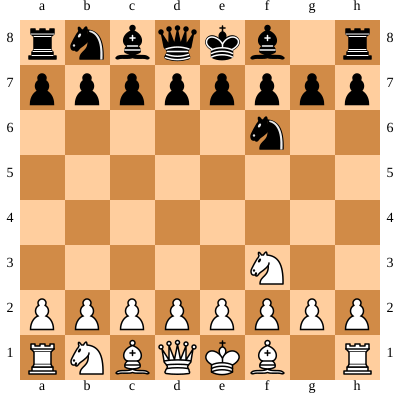



WHITE Turn
Move in UCI format: f3e5
Nodes per depth: {1: 22, 2: 67, 3: 823}
Time taken by Move: 0.09154367446899414


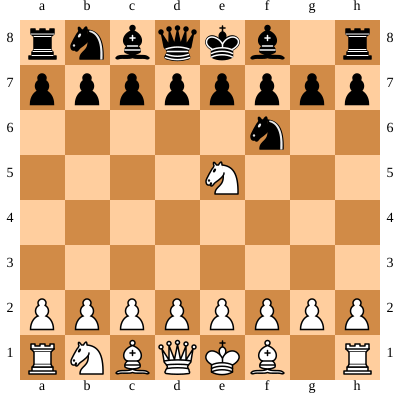



BLACK Turn
Move in UCI format: d7d6
Nodes per depth: {1: 21, 2: 211, 3: 2423}
Time taken by Move: 0.23816442489624023


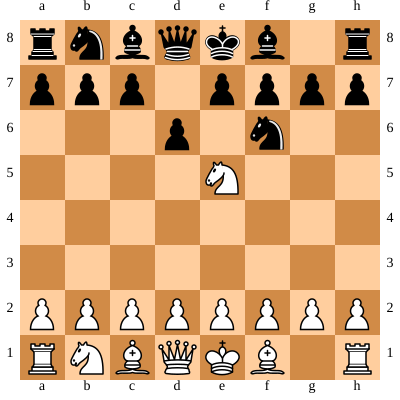



WHITE Turn
Move in UCI format: e5c4
Nodes per depth: {1: 27, 2: 429, 3: 2652}
Time taken by Move: 0.2722961902618408


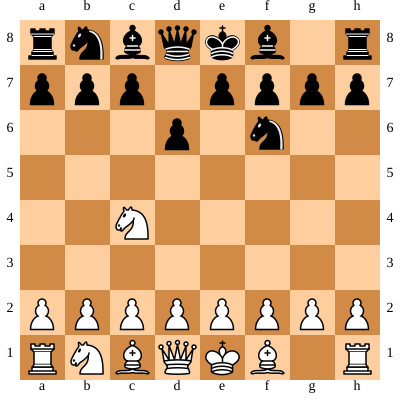



BLACK Turn
Move in UCI format: c8e6
Nodes per depth: {1: 30, 2: 224, 3: 3225}
Time taken by Move: 0.3227882385253906


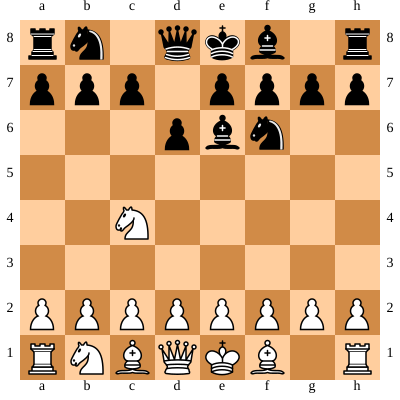



WHITE Turn
Move in UCI format: e2e3
Nodes per depth: {1: 24, 2: 337, 3: 2724}
Time taken by Move: 0.28655147552490234


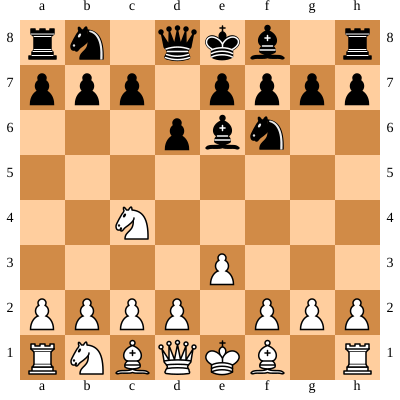



BLACK Turn
Move in UCI format: b8c6
Nodes per depth: {1: 31, 2: 238, 3: 4416}
Time taken by Move: 0.4308645725250244


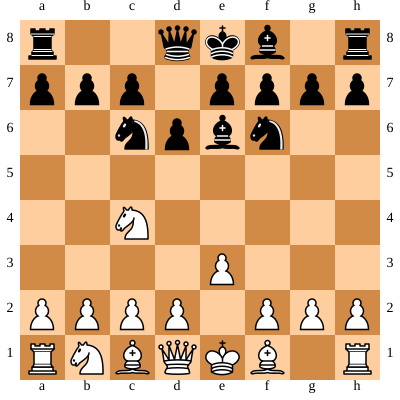



WHITE Turn
Move in UCI format: b1c3
Nodes per depth: {1: 29, 2: 549, 3: 4010}
Time taken by Move: 0.40796351432800293


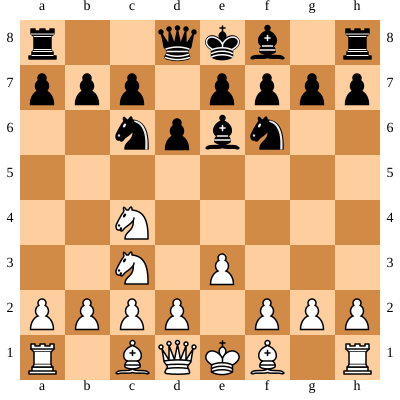



BLACK Turn
Move in UCI format: f6g4
Nodes per depth: {1: 34, 2: 270, 3: 5278}
Time taken by Move: 0.4914562702178955


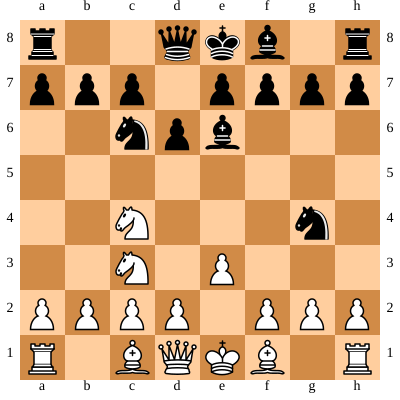



WHITE Turn
Move in UCI format: c4d6
Nodes per depth: {1: 31, 2: 392, 3: 6529}
Time taken by Move: 0.6338615417480469


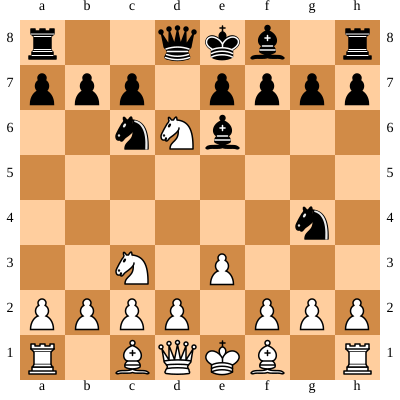



BLACK Turn
Move in UCI format: e7d6
Nodes per depth: {1: 4, 2: 97, 3: 2022}
Time taken by Move: 0.18489503860473633


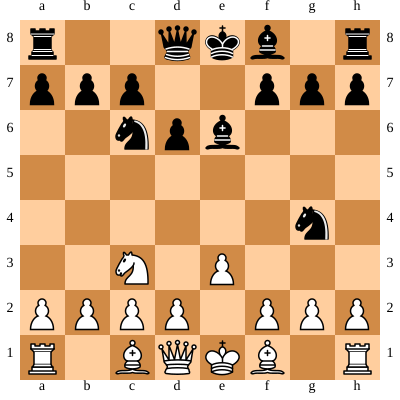



WHITE Turn
Move in UCI format: f1b5
Nodes per depth: {1: 29, 2: 700, 3: 9547}
Time taken by Move: 0.9039692878723145


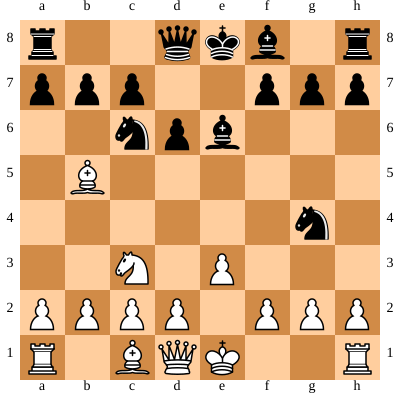



BLACK Turn
Move in UCI format: d8d7
Nodes per depth: {1: 36, 2: 189, 3: 789}
Time taken by Move: 0.08667731285095215


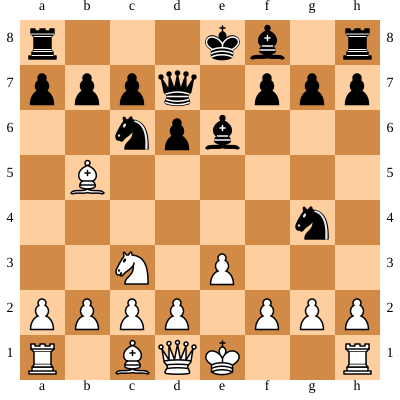



WHITE Turn
Move in UCI format: b5c6
Nodes per depth: {1: 33, 2: 234, 3: 2798}
Time taken by Move: 0.2858254909515381


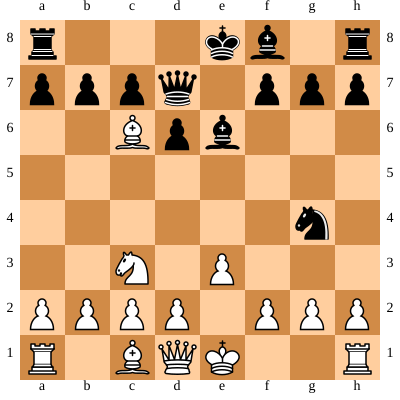



BLACK Turn
Move in UCI format: d7c6
Nodes per depth: {1: 32, 2: 126, 3: 1132}
Time taken by Move: 0.11179423332214355


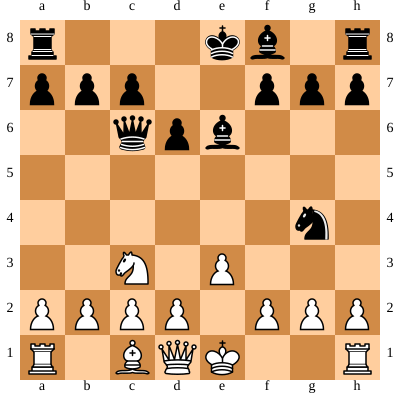



WHITE Turn
Move in UCI format: d2d4
Nodes per depth: {1: 27, 2: 827, 3: 9435}
Time taken by Move: 0.9189972877502441


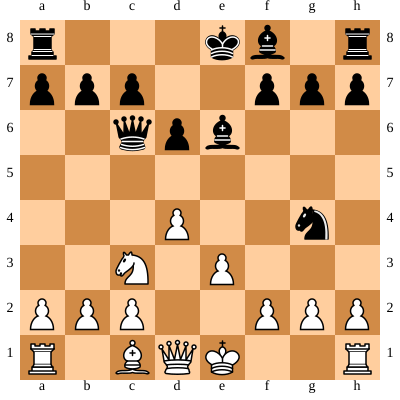



BLACK Turn
Move in UCI format: c6g2
Nodes per depth: {1: 45, 2: 226, 3: 7723}
Time taken by Move: 0.7417116165161133


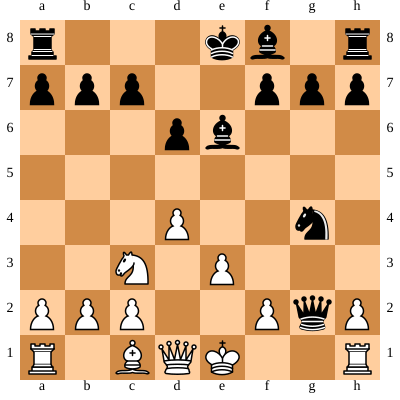



WHITE Turn
Move in UCI format: h1f1
Nodes per depth: {1: 27, 2: 712, 3: 8174}
Time taken by Move: 0.7677004337310791


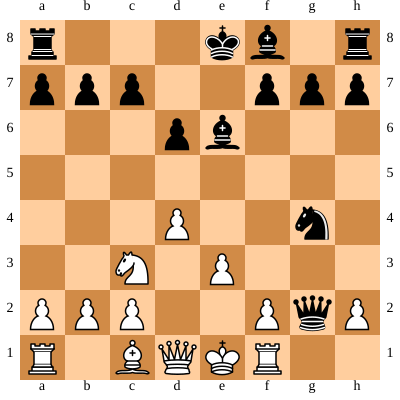



BLACK Turn
Move in UCI format: g4h2
Nodes per depth: {1: 46, 2: 210, 3: 6927}
Time taken by Move: 0.6508665084838867


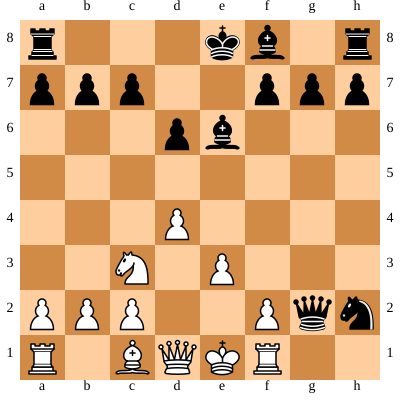



WHITE Turn
Move in UCI format: e1e2
Nodes per depth: {1: 26, 2: 614, 3: 4489}
Time taken by Move: 0.43783140182495117


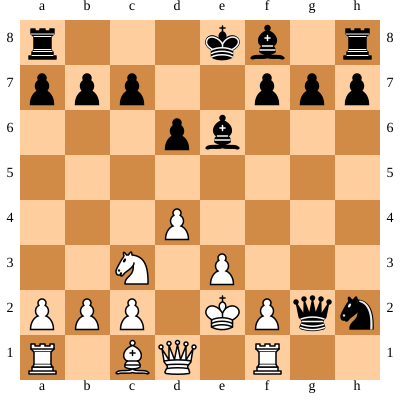



BLACK Turn
Move in UCI format: g2f3
Nodes per depth: {1: 47, 2: 196, 3: 5733}
Time taken by Move: 0.5543398857116699


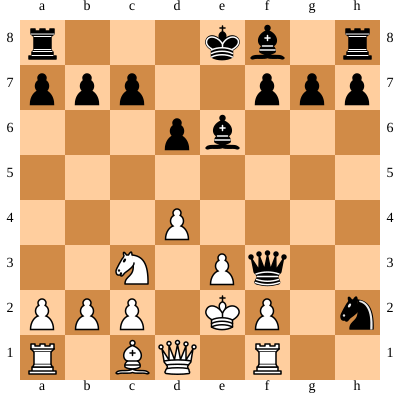



WHITE Turn
Move in UCI format: e2e1
Nodes per depth: {1: 3, 2: 133, 3: 1009}
Time taken by Move: 0.1093442440032959


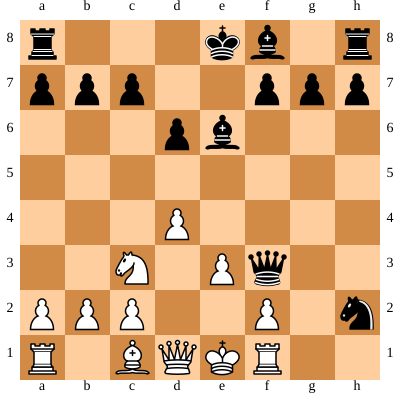



BLACK Turn
Move in UCI format: f3d1
Nodes per depth: {1: 49, 2: 455, 3: 14721}
Time taken by Move: 1.340212345123291


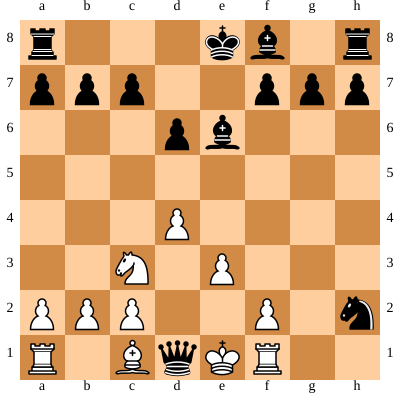



WHITE Turn
Move in UCI format: c3d1
Nodes per depth: {1: 2, 2: 68, 3: 310}
Time taken by Move: 0.03718113899230957


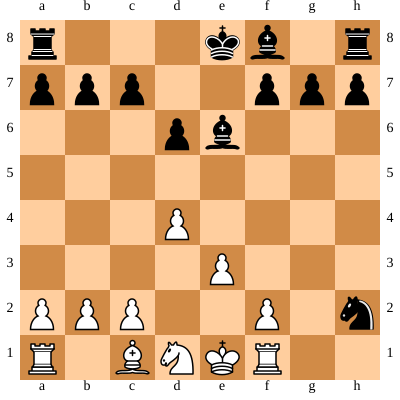



BLACK Turn
Move in UCI format: e6c4
Nodes per depth: {1: 34, 2: 113, 3: 2663}
Time taken by Move: 0.25107359886169434


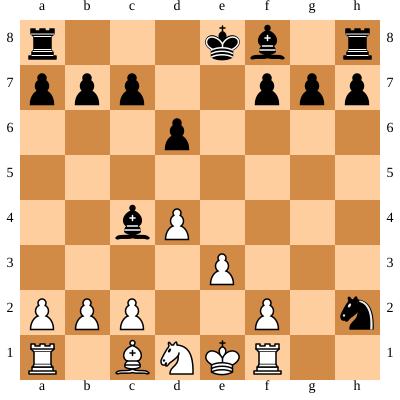



WHITE Turn
Move in UCI format: d1c3
Nodes per depth: {1: 15, 2: 316, 3: 1847}
Time taken by Move: 0.20207953453063965


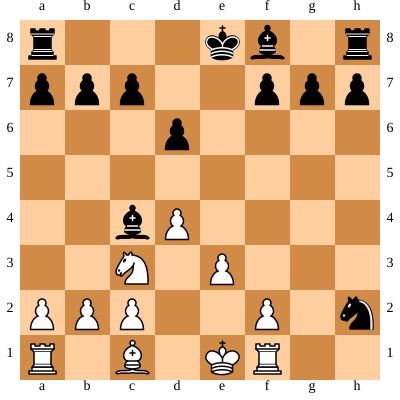



BLACK Turn
Move in UCI format: h2f1
Nodes per depth: {1: 34, 2: 240, 3: 4711}
Time taken by Move: 0.4300870895385742


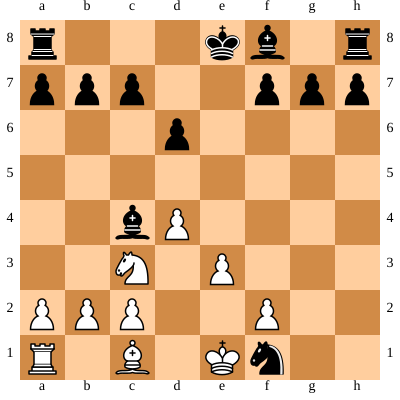



WHITE Turn
Move in UCI format: e3e4
Nodes per depth: {1: 18, 2: 257, 3: 1408}
Time taken by Move: 0.14647245407104492


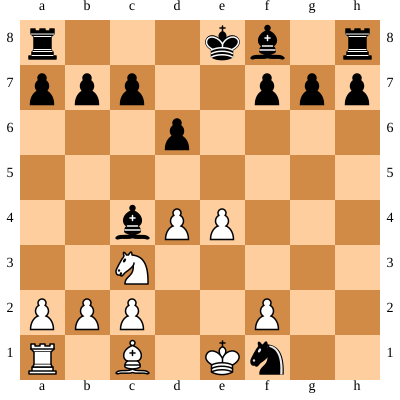



BLACK Turn
Move in UCI format: e8c8
Nodes per depth: {1: 34, 2: 410, 3: 9576}
Time taken by Move: 0.9059367179870605


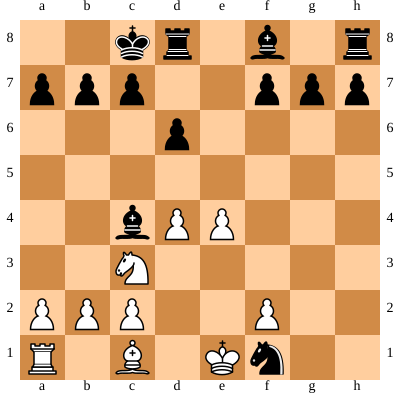



WHITE Turn
Move in UCI format: c1f4
Nodes per depth: {1: 21, 2: 155, 3: 1225}
Time taken by Move: 0.12242460250854492


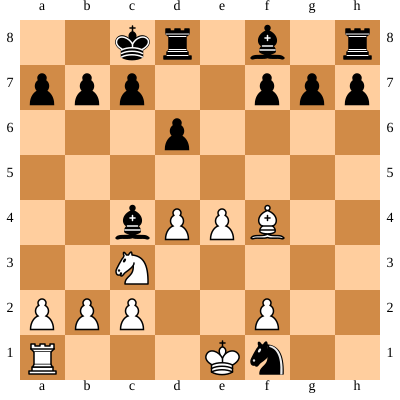



BLACK Turn
Move in UCI format: d8e8
Nodes per depth: {1: 31, 2: 283, 3: 6130}
Time taken by Move: 0.5697333812713623


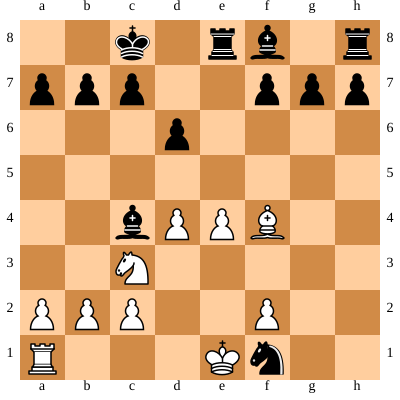



WHITE Turn
Move in UCI format: b2b3
Nodes per depth: {1: 26, 2: 409, 3: 2978}
Time taken by Move: 0.2955493927001953


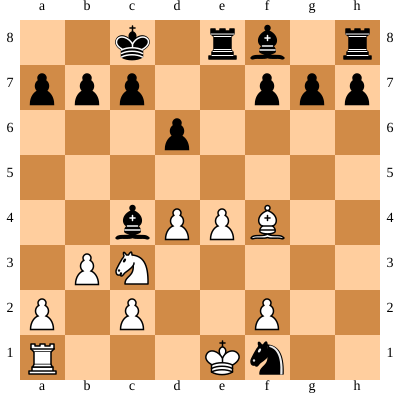



BLACK Turn
Move in UCI format: c4a6
Nodes per depth: {1: 34, 2: 570, 3: 9796}
Time taken by Move: 0.9409046173095703


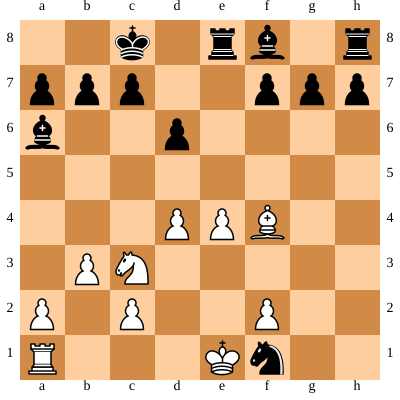



WHITE Turn
Move in UCI format: a1d1
Nodes per depth: {1: 25, 2: 344, 3: 2524}
Time taken by Move: 0.24830961227416992


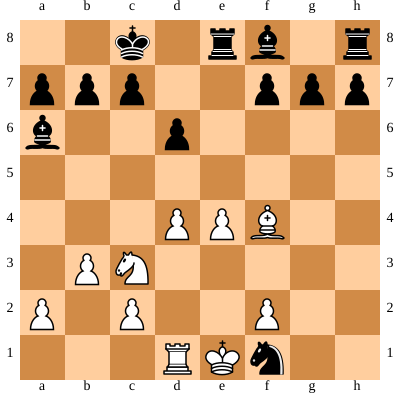



BLACK Turn
Move in UCI format: c8b8
Nodes per depth: {1: 29, 2: 244, 3: 4551}
Time taken by Move: 0.42119359970092773


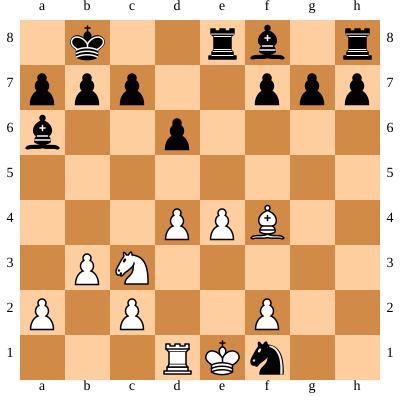



WHITE Turn
Move in UCI format: d4d5
Nodes per depth: {1: 25, 2: 286, 3: 2477}
Time taken by Move: 0.24603772163391113


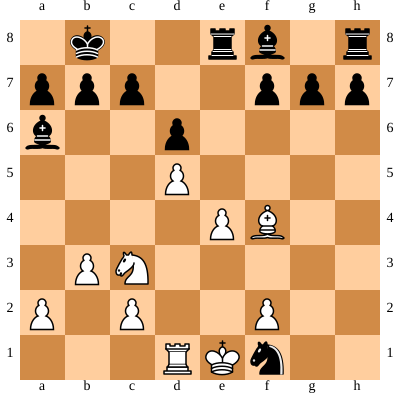



BLACK Turn
Move in UCI format: f7f5
Nodes per depth: {1: 28, 2: 287, 3: 5036}
Time taken by Move: 0.4666581153869629


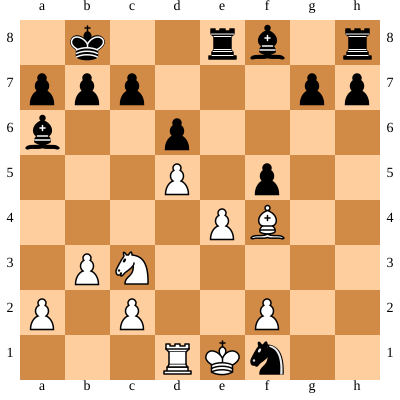



WHITE Turn
Move in UCI format: b3b4
Nodes per depth: {1: 24, 2: 437, 3: 3546}
Time taken by Move: 0.34990882873535156


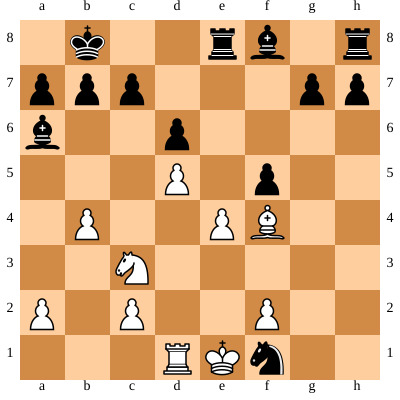



BLACK Turn
Move in UCI format: f5e4
Nodes per depth: {1: 27, 2: 274, 3: 5246}
Time taken by Move: 0.5163443088531494


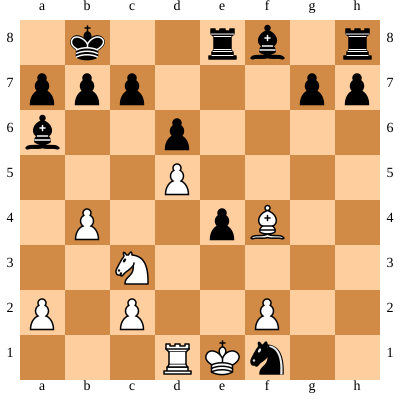



WHITE Turn
Move in UCI format: b4b5
Nodes per depth: {1: 24, 2: 220, 3: 2721}
Time taken by Move: 0.27298879623413086


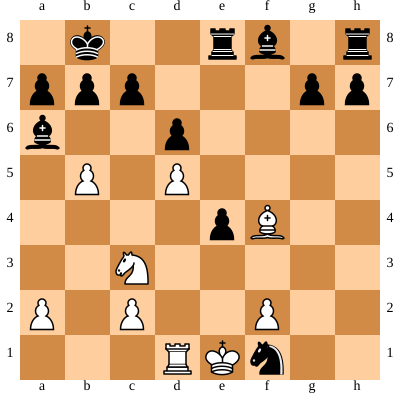



BLACK Turn
Move in UCI format: g7g5
Nodes per depth: {1: 22, 2: 394, 3: 4264}
Time taken by Move: 0.4137732982635498


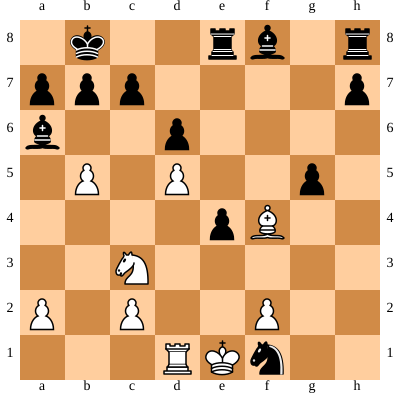



WHITE Turn
Move in UCI format: f4g5
Nodes per depth: {1: 25, 2: 166, 3: 2723}
Time taken by Move: 0.2520287036895752


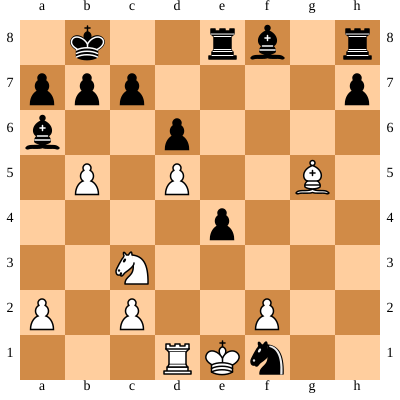



BLACK Turn
Move in UCI format: f8g7
Nodes per depth: {1: 22, 2: 300, 3: 4266}
Time taken by Move: 0.4059169292449951


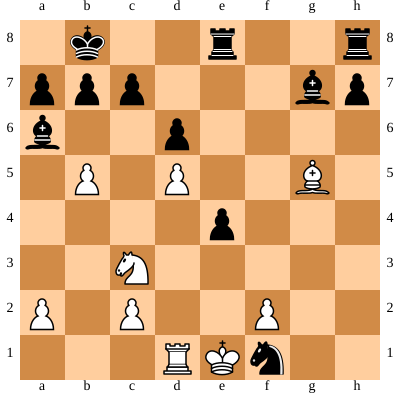



WHITE Turn
Move in UCI format: e1f1
Nodes per depth: {1: 27, 2: 513, 3: 7211}
Time taken by Move: 0.6763129234313965


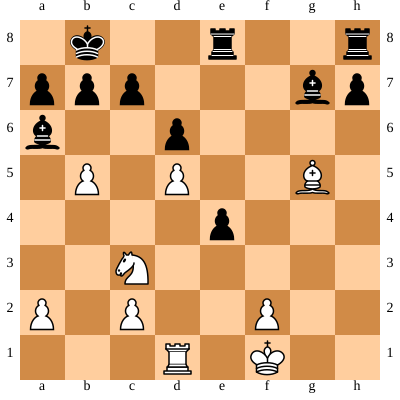



BLACK Turn
Move in UCI format: g7c3
Nodes per depth: {1: 24, 2: 395, 3: 7105}
Time taken by Move: 0.6478269100189209


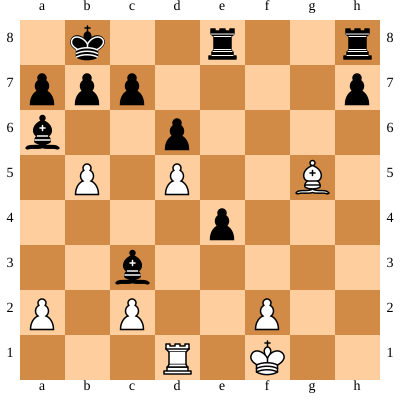



WHITE Turn
Move in UCI format: b5a6
Nodes per depth: {1: 24, 2: 381, 3: 4522}
Time taken by Move: 0.4157581329345703


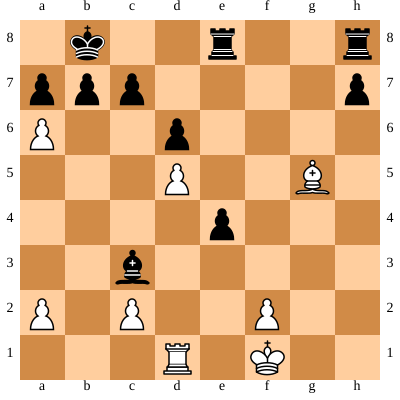



BLACK Turn
Move in UCI format: e8e5
Nodes per depth: {1: 29, 2: 188, 3: 3992}
Time taken by Move: 0.3663020133972168


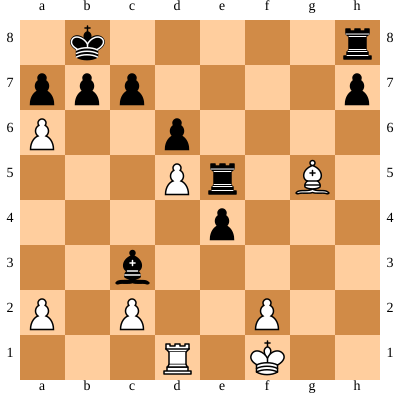



WHITE Turn
Move in UCI format: g5f6
Nodes per depth: {1: 24, 2: 140, 3: 1225}
Time taken by Move: 0.12067914009094238


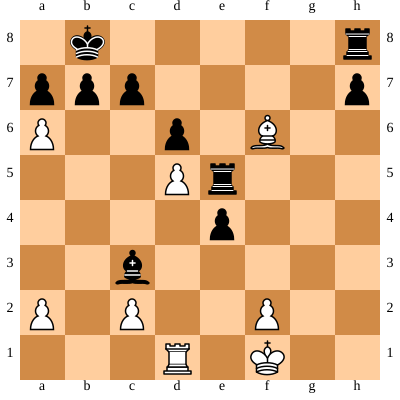



BLACK Turn
Move in UCI format: e5d5
Nodes per depth: {1: 29, 2: 104, 3: 1332}
Time taken by Move: 0.13763213157653809


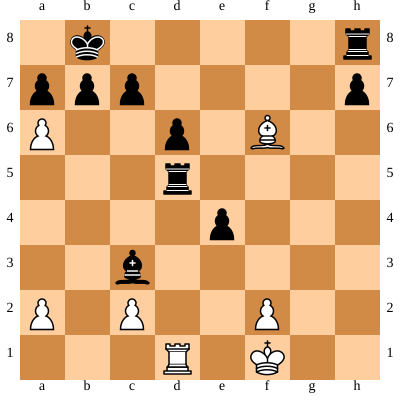



WHITE Turn
Move in UCI format: d1d5
Nodes per depth: {1: 25, 2: 458, 3: 3670}
Time taken by Move: 0.3590855598449707


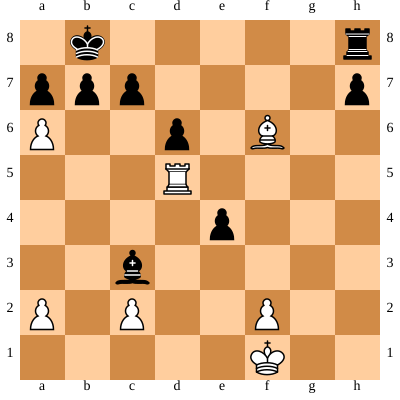



BLACK Turn
Move in UCI format: c3f6
Nodes per depth: {1: 24, 2: 133, 3: 1413}
Time taken by Move: 0.14375662803649902


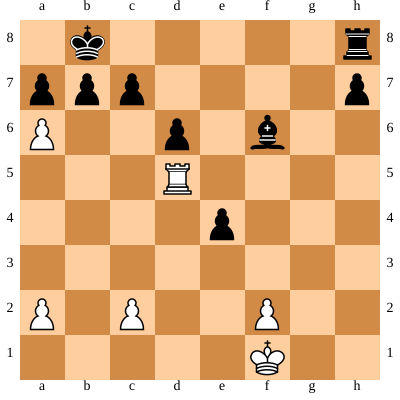



WHITE Turn
Move in UCI format: d5f5
Nodes per depth: {1: 23, 2: 114, 3: 1382}
Time taken by Move: 0.14281129837036133


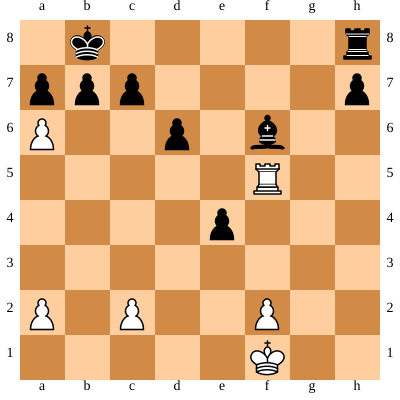



BLACK Turn
Move in UCI format: h8f8
Nodes per depth: {1: 26, 2: 206, 3: 2680}
Time taken by Move: 0.26198911666870117


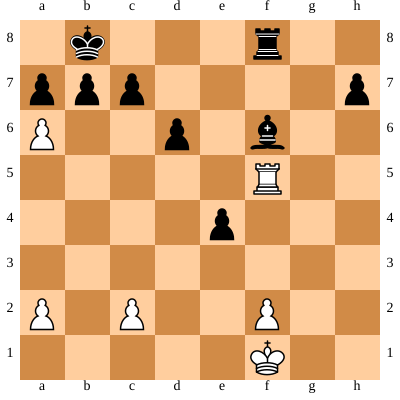



WHITE Turn
Move in UCI format: a6b7
Nodes per depth: {1: 21, 2: 269, 3: 2725}
Time taken by Move: 0.2727532386779785


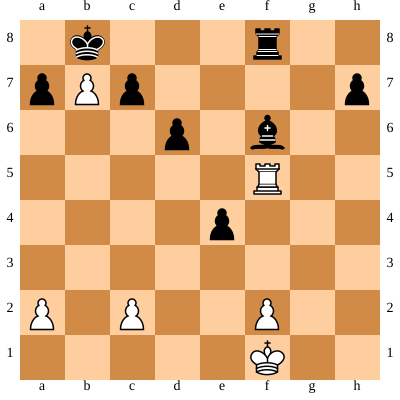



BLACK Turn
Move in UCI format: b8b7
Nodes per depth: {1: 26, 2: 123, 3: 987}
Time taken by Move: 0.11221146583557129


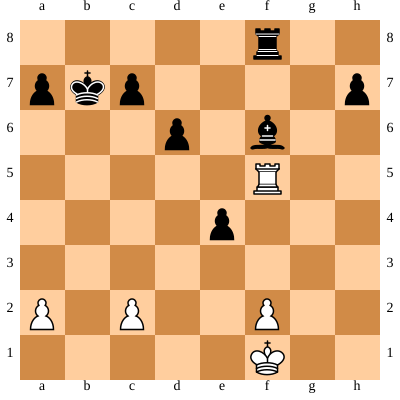



WHITE Turn
Move in UCI format: f5f4
Nodes per depth: {1: 20, 2: 276, 3: 1368}
Time taken by Move: 0.15179872512817383


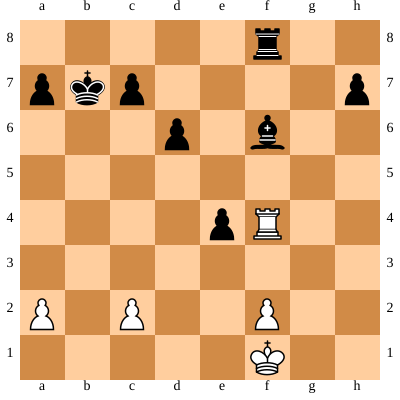



BLACK Turn
Move in UCI format: d6d5
Nodes per depth: {1: 33, 2: 167, 3: 2304}
Time taken by Move: 0.22062468528747559


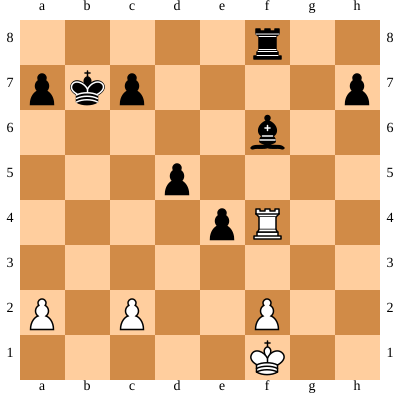



WHITE Turn
Move in UCI format: f4f5
Nodes per depth: {1: 15, 2: 88, 3: 499}
Time taken by Move: 0.061119794845581055


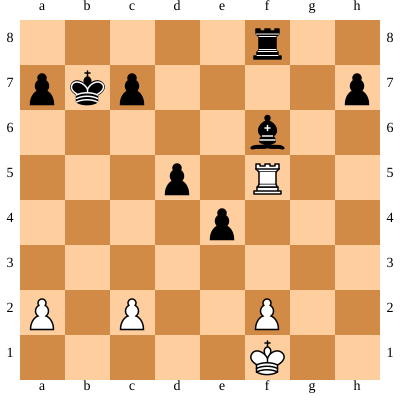



BLACK Turn
Move in UCI format: d5d4
Nodes per depth: {1: 33, 2: 183, 3: 2456}
Time taken by Move: 0.23658466339111328


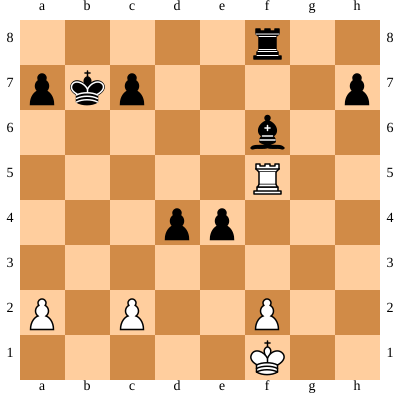



WHITE Turn
Move in UCI format: f5f4
Nodes per depth: {1: 20, 2: 165, 3: 1244}
Time taken by Move: 0.12231802940368652


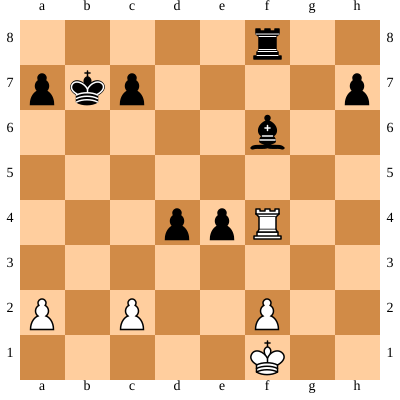



BLACK Turn
Move in UCI format: e4e3
Nodes per depth: {1: 29, 2: 170, 3: 1956}
Time taken by Move: 0.2021322250366211


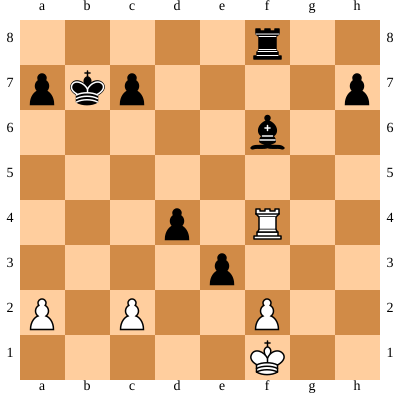



WHITE Turn
Move in UCI format: f2e3
Nodes per depth: {1: 17, 2: 202, 3: 1336}
Time taken by Move: 0.13576531410217285


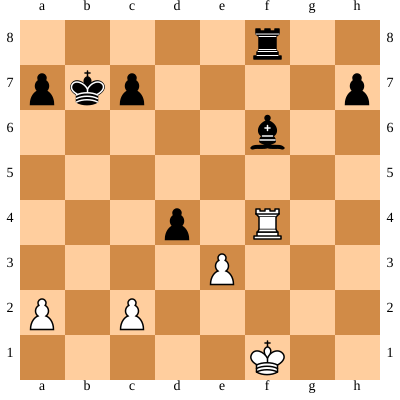



BLACK Turn
Move in UCI format: d4e3
Nodes per depth: {1: 29, 2: 197, 3: 2954}
Time taken by Move: 0.27855587005615234


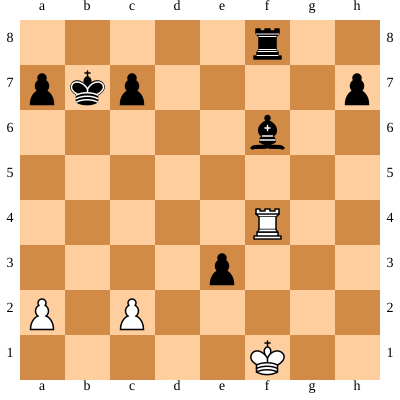



WHITE Turn
Move in UCI format: f1e2
Nodes per depth: {1: 19, 2: 236, 3: 1036}
Time taken by Move: 0.10486197471618652


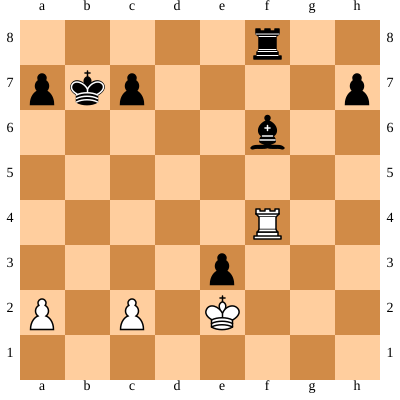



BLACK Turn
Move in UCI format: f6g7
Nodes per depth: {1: 31, 2: 274, 3: 2342}
Time taken by Move: 0.22641539573669434


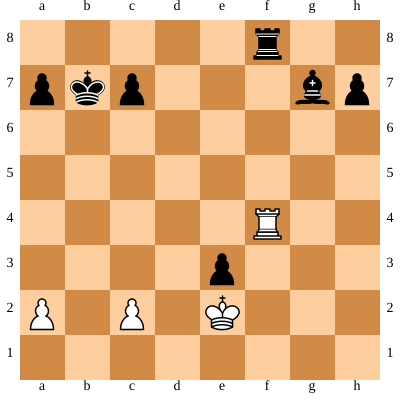



WHITE Turn
Move in UCI format: f4f8
Nodes per depth: {1: 24, 2: 67, 3: 708}
Time taken by Move: 0.08663415908813477


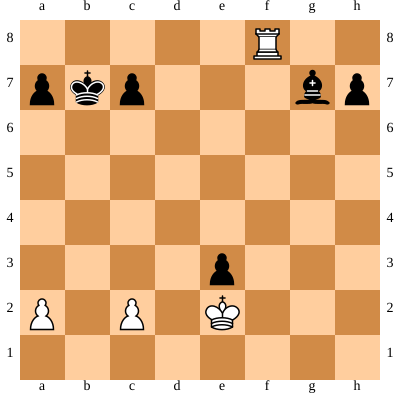



BLACK Turn
Move in UCI format: g7f8
Nodes per depth: {1: 18, 2: 65, 3: 636}
Time taken by Move: 0.07078385353088379


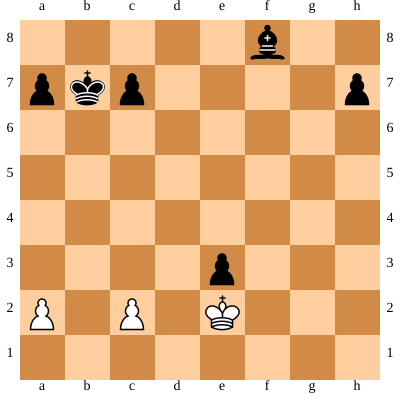



WHITE Turn
Move in UCI format: e2e3
Nodes per depth: {1: 10, 2: 47, 3: 246}
Time taken by Move: 0.03149127960205078


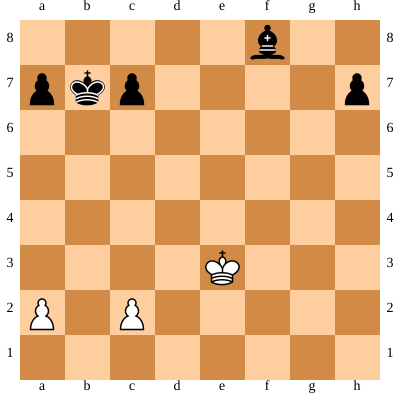



BLACK Turn
Move in UCI format: f8d6
Nodes per depth: {1: 19, 2: 97, 3: 1018}
Time taken by Move: 0.11832833290100098


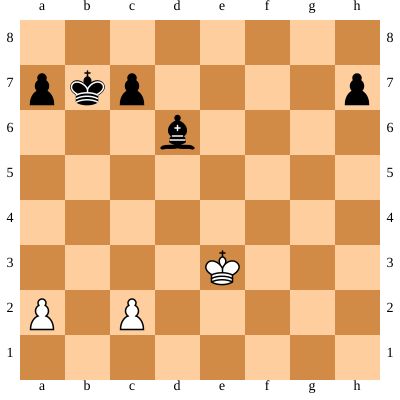



WHITE Turn
Move in UCI format: e3f2
Nodes per depth: {1: 11, 2: 72, 3: 327}
Time taken by Move: 0.05337071418762207


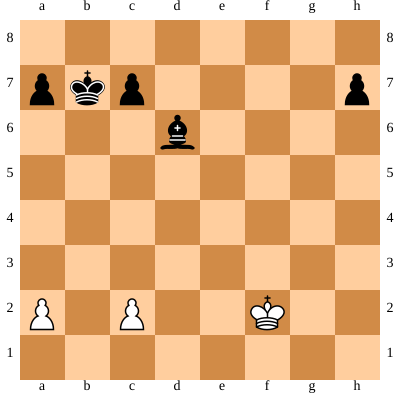



BLACK Turn
Move in UCI format: d6c5
Nodes per depth: {1: 21, 2: 81, 3: 996}
Time taken by Move: 0.11161112785339355


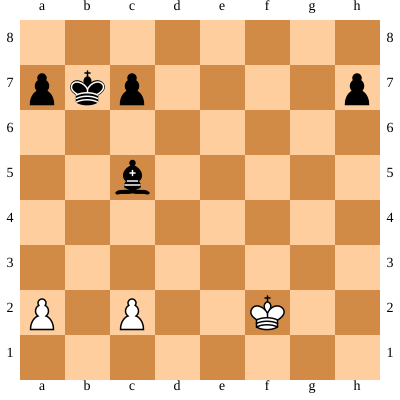



WHITE Turn
Move in UCI format: f2g3
Nodes per depth: {1: 6, 2: 31, 3: 198}
Time taken by Move: 0.02434372901916504


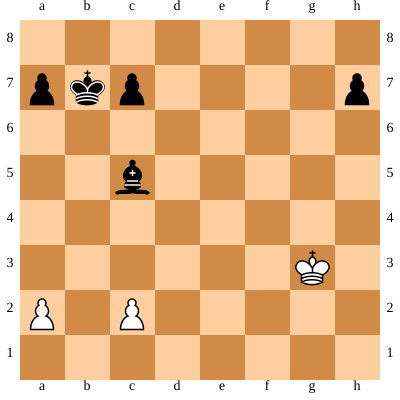



BLACK Turn
Move in UCI format: b7c8
Nodes per depth: {1: 21, 2: 126, 3: 1356}
Time taken by Move: 0.15229344367980957


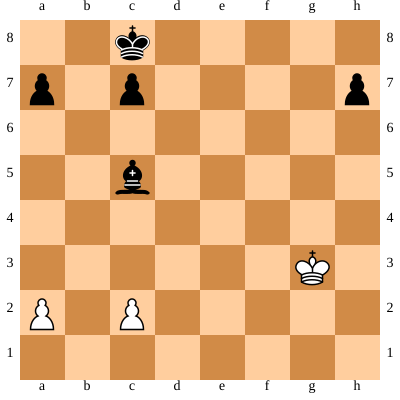



WHITE Turn
Move in UCI format: g3h3
Nodes per depth: {1: 11, 2: 56, 3: 287}
Time taken by Move: 0.04523754119873047


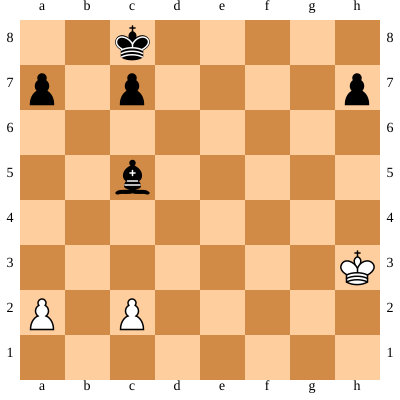



BLACK Turn
Move in UCI format: c8b8
Nodes per depth: {1: 19, 2: 81, 3: 814}
Time taken by Move: 0.09462404251098633


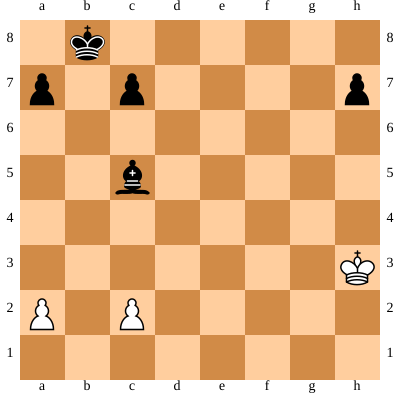



WHITE Turn
Move in UCI format: h3g3
Nodes per depth: {1: 9, 2: 71, 3: 405}
Time taken by Move: 0.0544583797454834


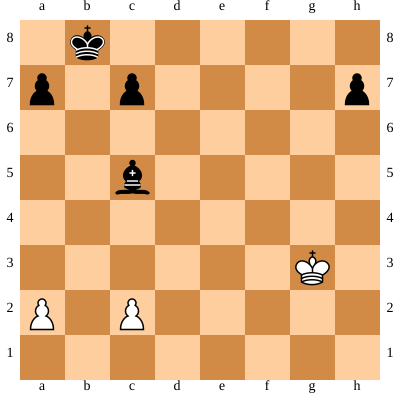



BLACK Turn
Move in UCI format: b8c8
Nodes per depth: {1: 18, 2: 108, 3: 1115}
Time taken by Move: 0.1346416473388672


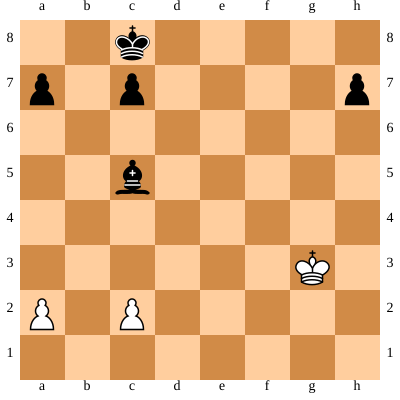



WHITE Turn
Move in UCI format: g3h3
Nodes per depth: {1: 11, 2: 56, 3: 287}
Time taken by Move: 0.037774085998535156


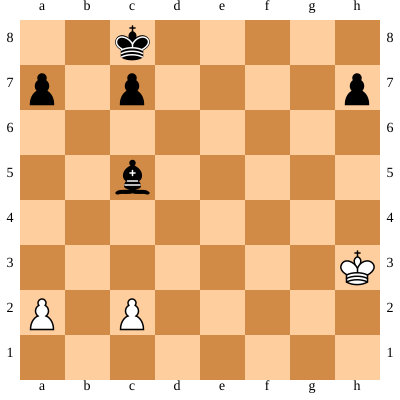



BLACK Turn
Move in UCI format: c8b8
Nodes per depth: {1: 19, 2: 81, 3: 814}
Time taken by Move: 0.09958744049072266


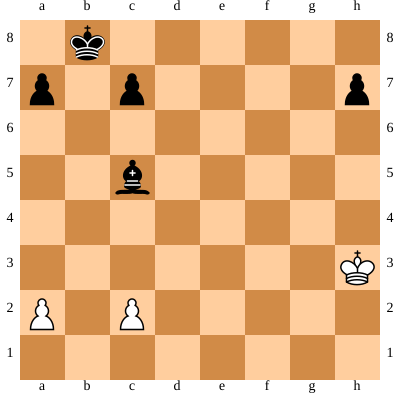



WHITE Turn
Move in UCI format: h3g3
Nodes per depth: {1: 9, 2: 71, 3: 405}
Time taken by Move: 0.05360007286071777


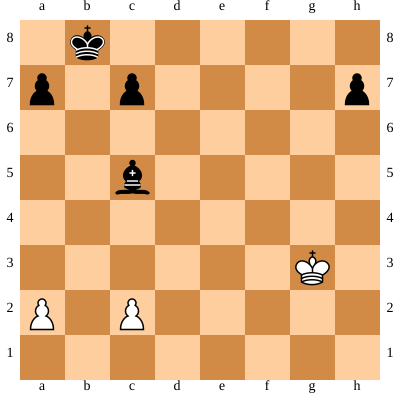



[Event "Example"]
[Site "Linz"]
[Date "2022-01-30"]
[Round "1"]
[White "MyChess"]
[Black "MyChess"]
[Result "1/2-1/2"]

1. Nf3 Nf6 2. Ne5 d6 3. Nc4 Be6 4. e3 Nc6 5. Nc3 Ng4 6. Nxd6+ exd6 7. Bb5 Qd7 8. Bxc6 Qxc6 9. d4 Qxg2 10. Rf1 Nxh2 11. Ke2 Qf3+ 12. Ke1 Qxd1+ 13. Nxd1 Bc4 14. Nc3 Nxf1 15. e4 O-O-O 16. Bf4 Re8 17. b3 Ba6 18. Rd1 Kb8 19. d5 f5 20. b4 fxe4 21. b5 g5 22. Bxg5 Bg7 23. Kxf1 Bxc3 24. bxa6 Re5 25. Bf6 Rxd5 26. Rxd5 Bxf6 27. Rf5 Rf8 28. axb7 Kxb7 29. Rf4 d5 30. Rf5 d4 31. Rf4 e3 32. fxe3 dxe3 33. Ke2 Bg7 34. Rxf8 Bxf8 35. Kxe3 Bd6 36. Kf2 Bc5+ 37. Kg3 Kc8 38. Kh3 Kb8 39. Kg3 Kc8 40. Kh3 Kb8 41. Kg3 1/2-1/2


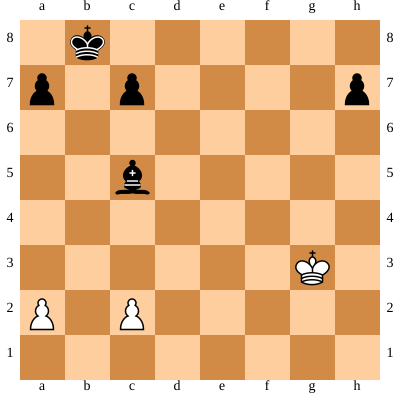

In [ ]:
import chess.pgn
import datetime
import time



movehistory =[]
game = chess.pgn.Game()
game.headers["Event"] = "Example"
game.headers["Site"] = "Linz"
game.headers["Date"] = str(datetime.datetime.now().date())
game.headers["Round"] = 1
game.headers["White"] = "MyChess"
game.headers["Black"] = "MyChess"
board = chess.Board()
while not board.is_game_over(claim_draw=True):
    start = time.time()
    nodes_per_depth = dict()
    if board.turn:
        
        print("WHITE Turn")
        move = selectmove_ab(3,movehistory)
        board.push(move)       
    else:
        print("BLACK Turn")
        move = selectmove_ab(3,movehistory)
        board.push(move)  
    end = time.time()
    print("Move in UCI format:", move)
    print("Nodes per depth:", nodes_per_depth)
    print("Time taken by Move:", end-start) 
    display(SVG(chess.svg.board(board, size=400)))  
    print("\n")

game.add_line(movehistory)
game.headers["Result"] = str(board.result(claim_draw=True))
print(game)
print(game, file=open("selftest.pgn", "w"), end="\n\n")

SVG(chess.svg.board(board=board,size=400))

### Negamax_ab - Negamax_ab - depth : 3 - 4
Next, we're testing the max depth effect on the alpha beta pruning

WHITE Turn
Move in UCI format: g1f3
Nodes per depth: {1: 20, 2: 63, 3: 694}
Time taken by Move: 0.10281062126159668


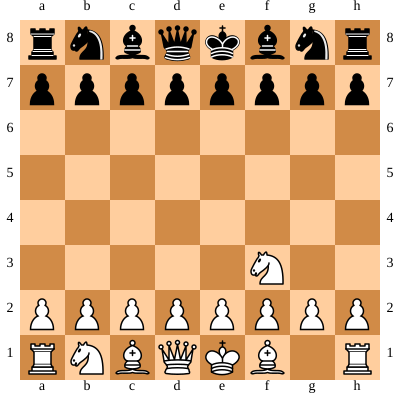



BLACK Turn
Move in UCI format: b8c6
Nodes per depth: {1: 20, 2: 89, 3: 673, 4: 3038}
Time taken by Move: 0.30905985832214355


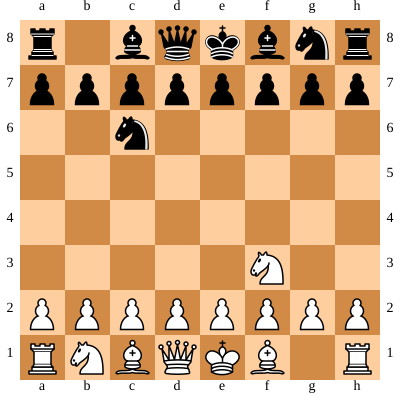



WHITE Turn
Move in UCI format: f3g5
Nodes per depth: {1: 22, 2: 55, 3: 872}
Time taken by Move: 0.08726859092712402


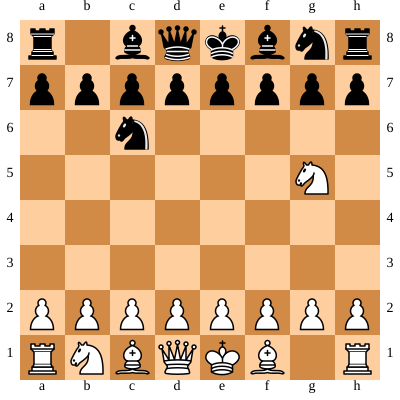



BLACK Turn
Move in UCI format: e7e5
Nodes per depth: {1: 21, 2: 204, 3: 2408, 4: 10663}
Time taken by Move: 1.0895326137542725


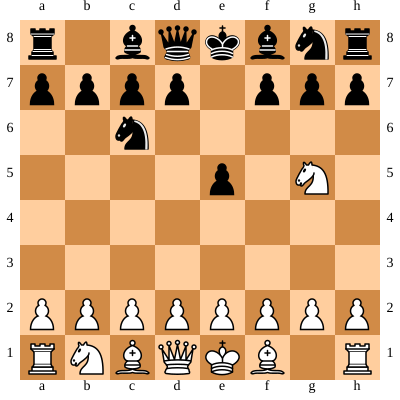



WHITE Turn
Move in UCI format: d2d3
Nodes per depth: {1: 25, 2: 272, 3: 1805}
Time taken by Move: 0.17403244972229004


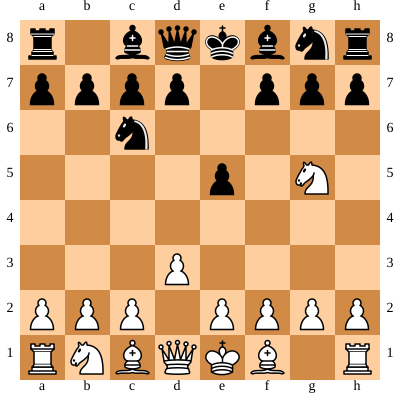



BLACK Turn
Move in UCI format: h7h6
Nodes per depth: {1: 30, 2: 300, 3: 4842, 4: 20326}
Time taken by Move: 2.025327205657959


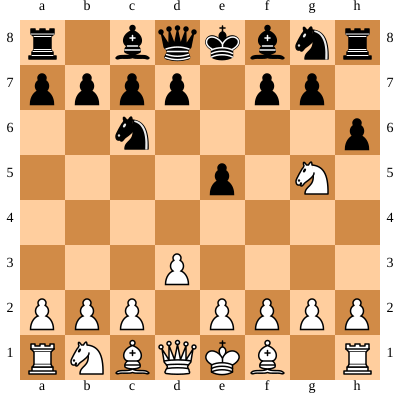



WHITE Turn
Move in UCI format: g5e4
Nodes per depth: {1: 30, 2: 351, 3: 3461}
Time taken by Move: 0.33237385749816895


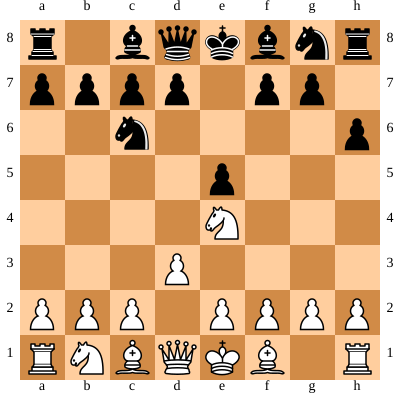



BLACK Turn
Move in UCI format: g8e7
Nodes per depth: {1: 30, 2: 204, 3: 2829, 4: 18979}
Time taken by Move: 1.846517562866211


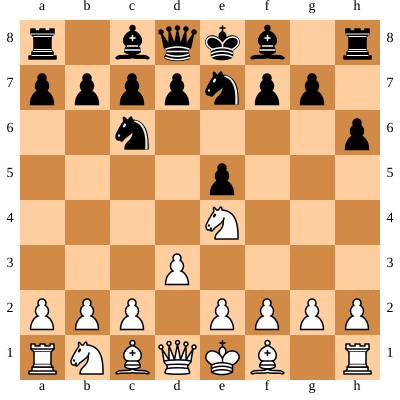



WHITE Turn
Move in UCI format: b1c3
Nodes per depth: {1: 32, 2: 371, 3: 5866}
Time taken by Move: 0.5555624961853027


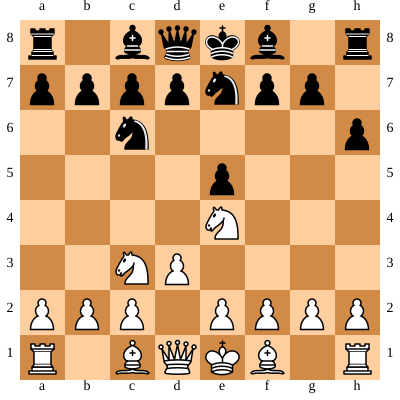



BLACK Turn
Move in UCI format: d7d5
Nodes per depth: {1: 22, 2: 266, 3: 2699, 4: 24868}
Time taken by Move: 2.3407435417175293


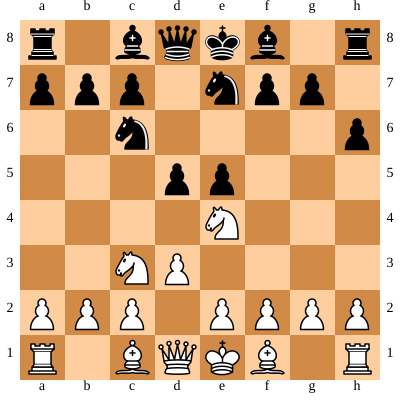



WHITE Turn
Move in UCI format: e4c5
Nodes per depth: {1: 31, 2: 412, 3: 5792}
Time taken by Move: 0.5358126163482666


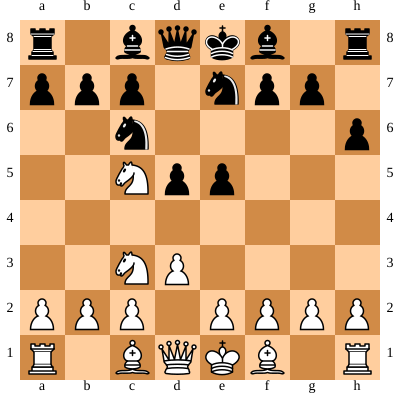



BLACK Turn
Move in UCI format: e7f5
Nodes per depth: {1: 28, 2: 341, 3: 5395, 4: 30175}
Time taken by Move: 2.9229071140289307


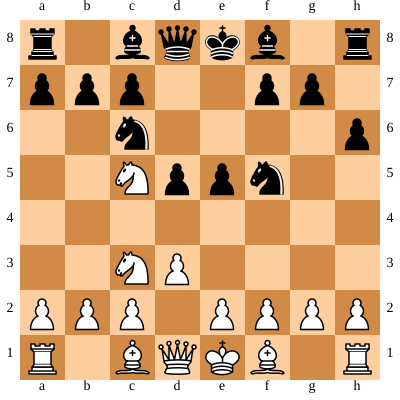



WHITE Turn
Move in UCI format: c5b3
Nodes per depth: {1: 34, 2: 360, 3: 5016}
Time taken by Move: 0.4694702625274658


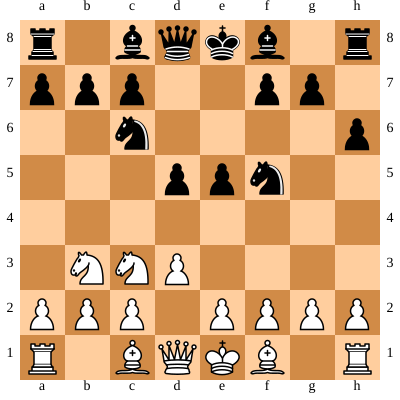



BLACK Turn
Move in UCI format: f8b4
Nodes per depth: {1: 39, 2: 271, 3: 6844, 4: 25565}
Time taken by Move: 2.5572385787963867


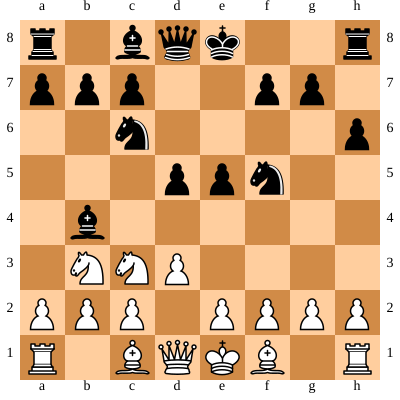



WHITE Turn
Move in UCI format: c1d2
Nodes per depth: {1: 24, 2: 666, 3: 5483}
Time taken by Move: 0.5428605079650879


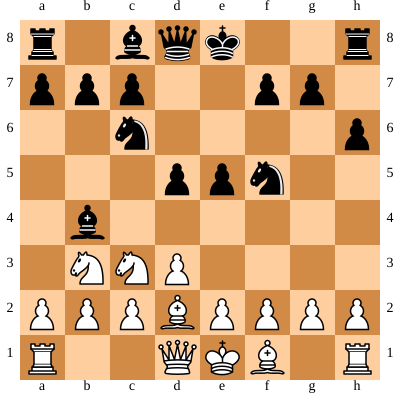



BLACK Turn
Move in UCI format: d5d4
Nodes per depth: {1: 43, 2: 233, 3: 5622, 4: 26150}
Time taken by Move: 2.5777127742767334


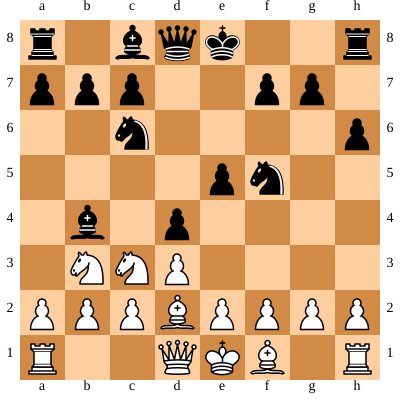



WHITE Turn
Move in UCI format: e2e4
Nodes per depth: {1: 29, 2: 804, 3: 8773}
Time taken by Move: 0.8434820175170898


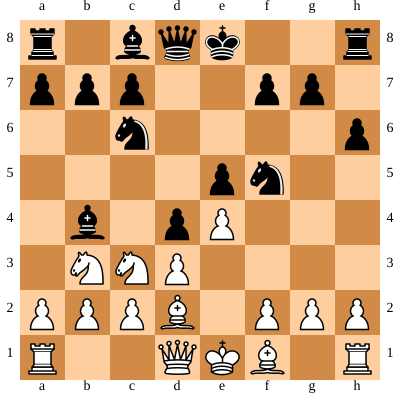



BLACK Turn
Move in UCI format: d4e3
Nodes per depth: {1: 42, 2: 590, 3: 16833, 4: 123426}
Time taken by Move: 11.861710786819458


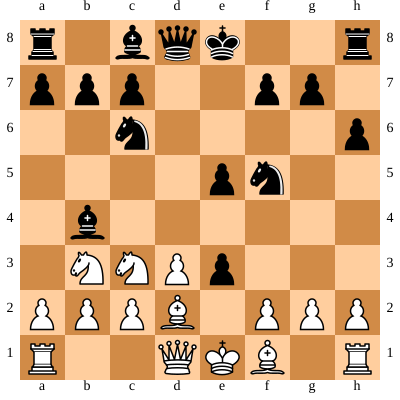



WHITE Turn
Move in UCI format: d2e3
Nodes per depth: {1: 33, 2: 779, 3: 9418}
Time taken by Move: 0.9012715816497803


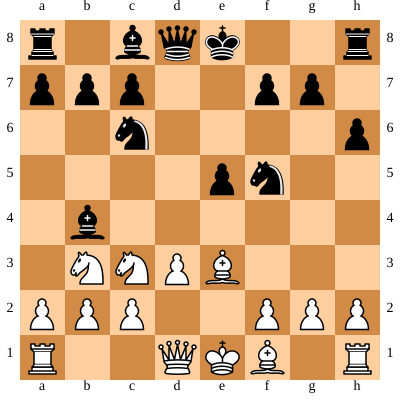



BLACK Turn
Move in UCI format: f5e3
Nodes per depth: {1: 45, 2: 372, 3: 11434, 4: 43271}
Time taken by Move: 4.284411907196045


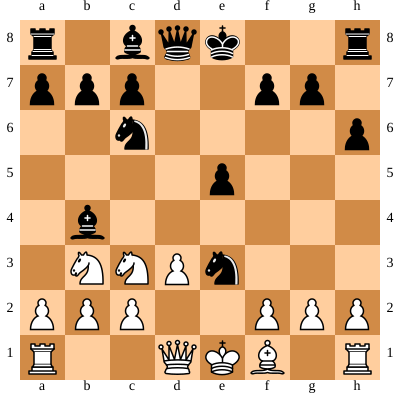



WHITE Turn
Move in UCI format: f2e3
Nodes per depth: {1: 28, 2: 802, 3: 8959}
Time taken by Move: 0.8706622123718262


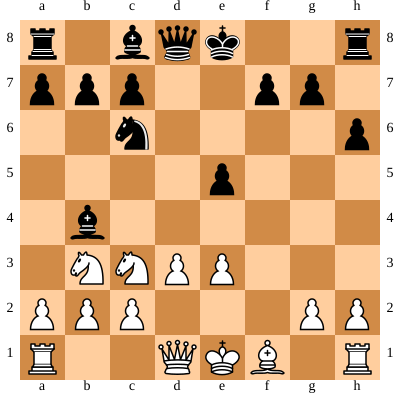



BLACK Turn
Move in UCI format: b4c3
Nodes per depth: {1: 43, 2: 365, 3: 11822, 4: 32960}
Time taken by Move: 3.400557041168213


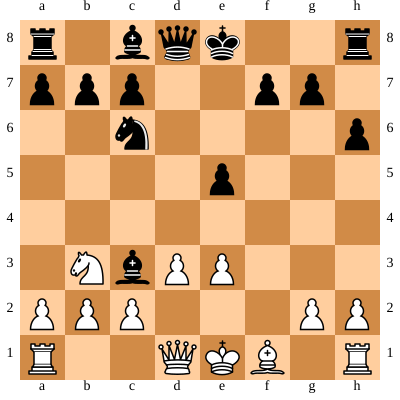



WHITE Turn
Move in UCI format: b2c3
Nodes per depth: {1: 5, 2: 172, 3: 1329}
Time taken by Move: 0.13400912284851074


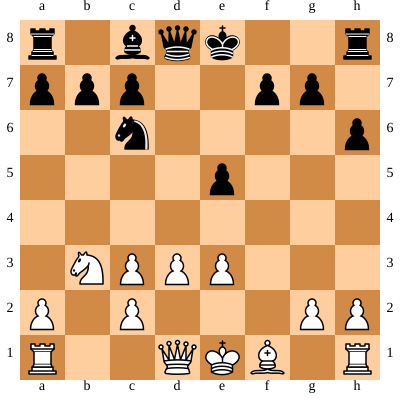



BLACK Turn
Move in UCI format: d8h4
Nodes per depth: {1: 37, 2: 300, 3: 4959, 4: 24632}
Time taken by Move: 2.4237008094787598


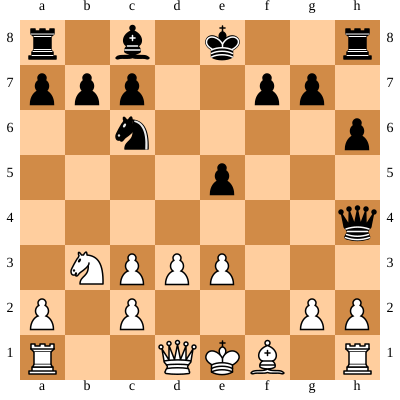



WHITE Turn
Move in UCI format: g2g3
Nodes per depth: {1: 3, 2: 139, 3: 1013}
Time taken by Move: 0.11194229125976562


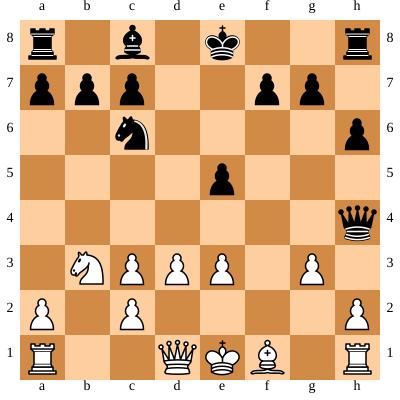



BLACK Turn
Move in UCI format: h4g4
Nodes per depth: {1: 45, 2: 578, 3: 13642, 4: 180395}
Time taken by Move: 16.66474199295044


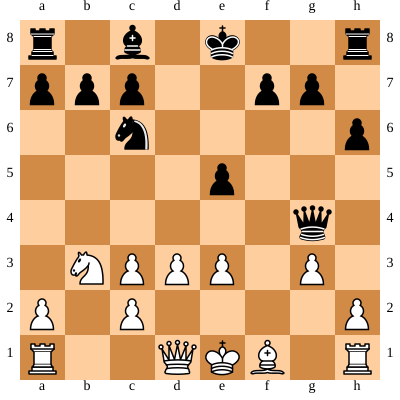



WHITE Turn
Move in UCI format: e3e4
Nodes per depth: {1: 26, 2: 568, 3: 7203}
Time taken by Move: 0.6967849731445312


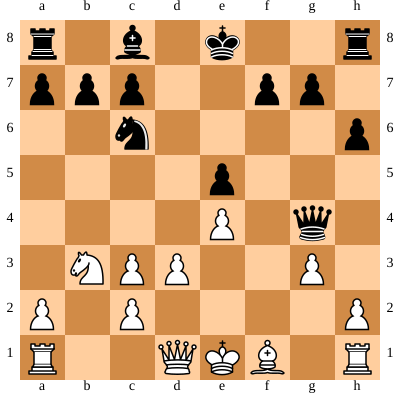



BLACK Turn
Move in UCI format: g4d1
Nodes per depth: {1: 41, 2: 192, 3: 5418, 4: 30173}
Time taken by Move: 2.9025936126708984


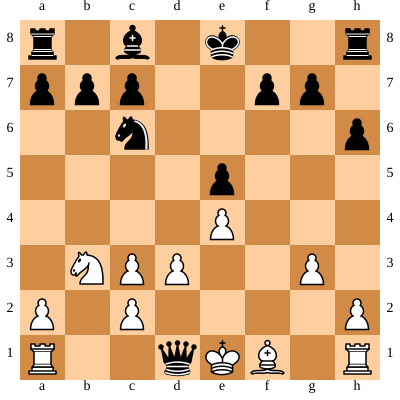



WHITE Turn
Move in UCI format: a1d1
Nodes per depth: {1: 3, 2: 99, 3: 705}
Time taken by Move: 0.07689070701599121


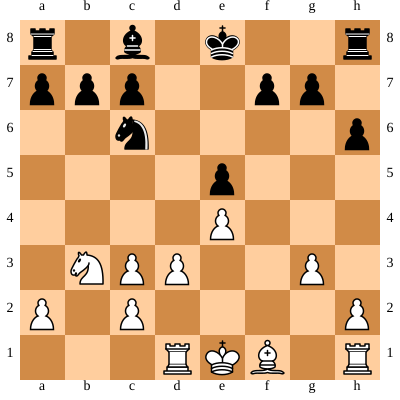



BLACK Turn
Move in UCI format: c8g4
Nodes per depth: {1: 29, 2: 177, 3: 2184, 4: 10692}
Time taken by Move: 1.0216660499572754


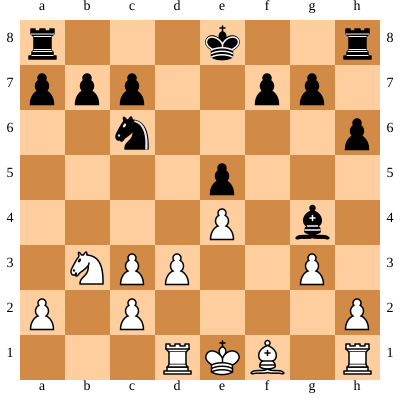



WHITE Turn
Move in UCI format: f1e2
Nodes per depth: {1: 22, 2: 378, 3: 3169}
Time taken by Move: 0.30666303634643555


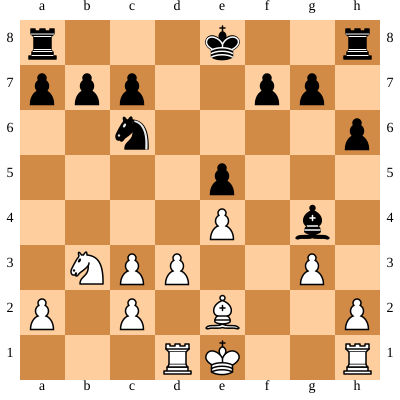



BLACK Turn
Move in UCI format: g4e2
Nodes per depth: {1: 35, 2: 305, 3: 4668, 4: 31835}
Time taken by Move: 3.015665054321289


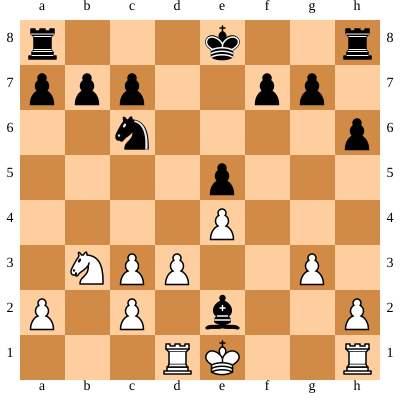



WHITE Turn
Move in UCI format: e1e2
Nodes per depth: {1: 22, 2: 329, 3: 3369}
Time taken by Move: 0.31899595260620117


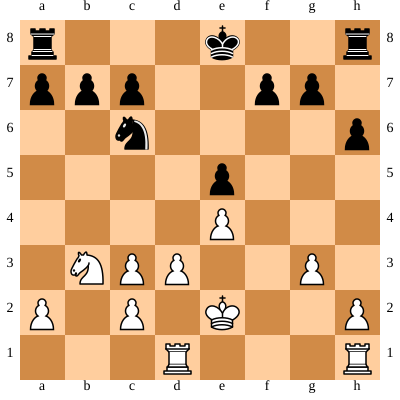



BLACK Turn
Move in UCI format: e8g8
Nodes per depth: {1: 27, 2: 423, 3: 3520, 4: 38409}
Time taken by Move: 3.4704794883728027


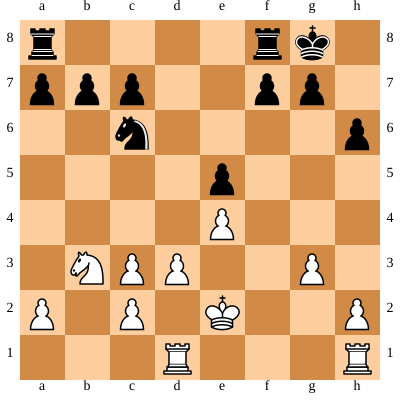



WHITE Turn
Move in UCI format: h1f1
Nodes per depth: {1: 29, 2: 120, 3: 1884}
Time taken by Move: 0.18898558616638184


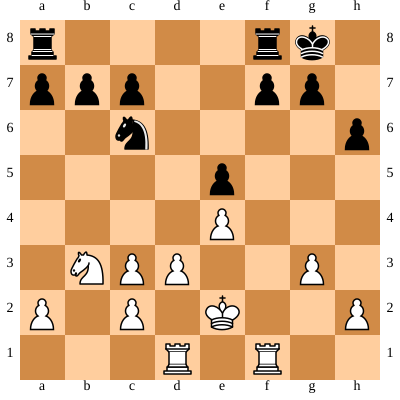



BLACK Turn
Move in UCI format: f8e8
Nodes per depth: {1: 25, 2: 119, 3: 1428, 4: 15918}
Time taken by Move: 1.470475435256958


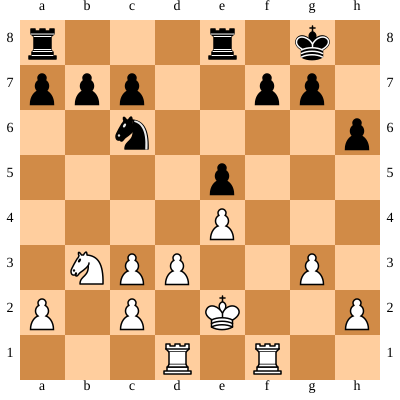



WHITE Turn
Move in UCI format: b3c5
Nodes per depth: {1: 32, 2: 212, 3: 3887}
Time taken by Move: 0.3818814754486084


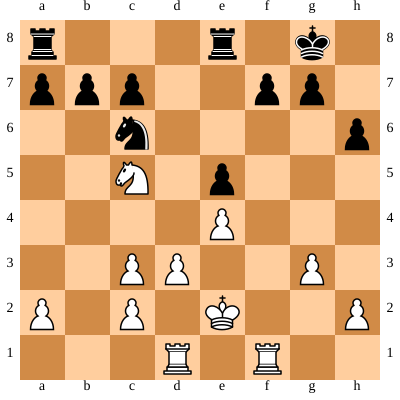



BLACK Turn
Move in UCI format: a8b8
Nodes per depth: {1: 27, 2: 227, 3: 1964, 4: 20059}
Time taken by Move: 1.8186354637145996


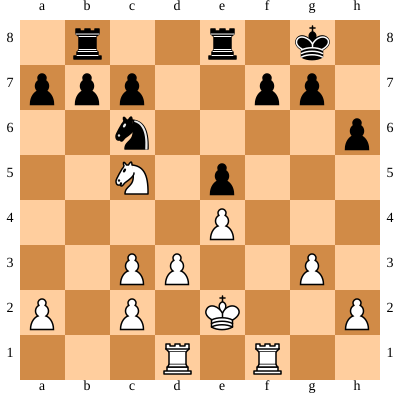



WHITE Turn
Move in UCI format: c5d7
Nodes per depth: {1: 32, 2: 190, 3: 3486}
Time taken by Move: 0.3361072540283203


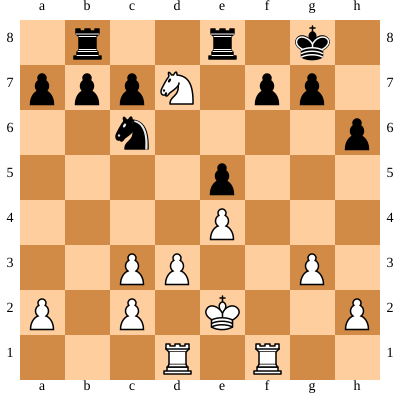



BLACK Turn
Move in UCI format: b8d8
Nodes per depth: {1: 24, 2: 151, 3: 1996, 4: 11331}
Time taken by Move: 1.0683567523956299


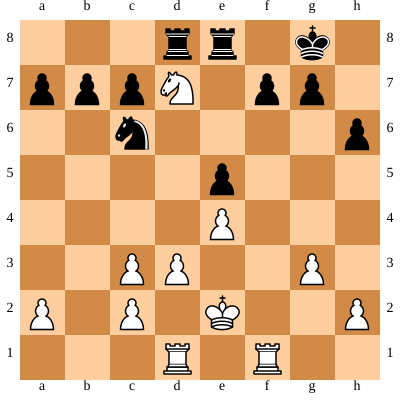



WHITE Turn
Move in UCI format: d7c5
Nodes per depth: {1: 32, 2: 342, 3: 3869}
Time taken by Move: 0.3724503517150879


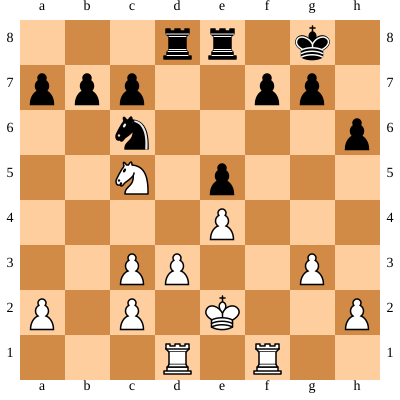



BLACK Turn
Move in UCI format: b7b6
Nodes per depth: {1: 28, 2: 283, 3: 2891, 4: 23146}
Time taken by Move: 2.1322929859161377


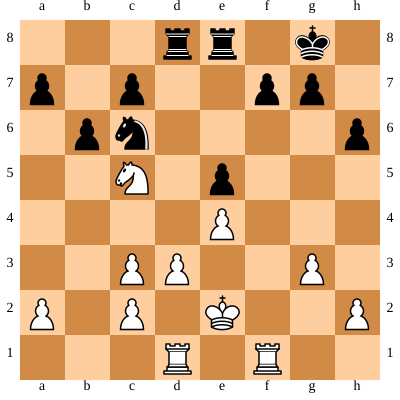



WHITE Turn
Move in UCI format: c5b3
Nodes per depth: {1: 32, 2: 510, 3: 6158}
Time taken by Move: 0.5826354026794434


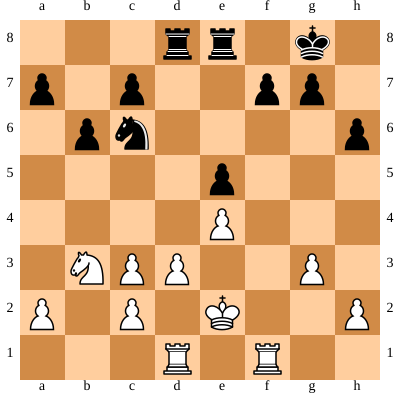



BLACK Turn
Move in UCI format: b6b5
Nodes per depth: {1: 27, 2: 552, 3: 7390, 4: 65659}
Time taken by Move: 6.059753894805908


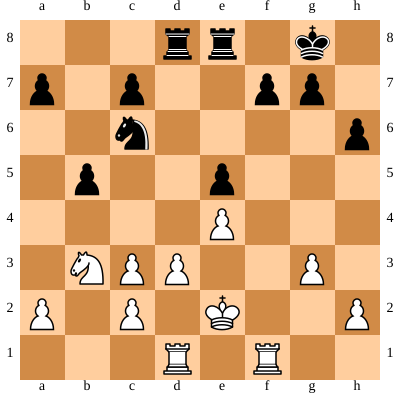



WHITE Turn
Move in UCI format: b3c5
Nodes per depth: {1: 32, 2: 385, 3: 4887}
Time taken by Move: 0.46645379066467285


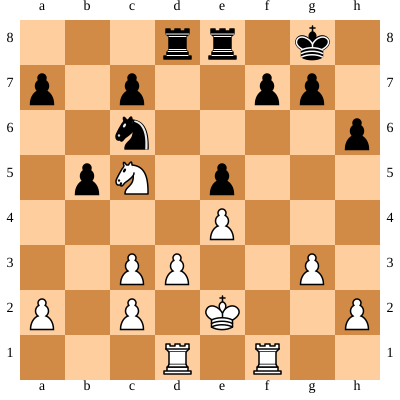



BLACK Turn
Move in UCI format: b5b4
Nodes per depth: {1: 27, 2: 282, 3: 4123, 4: 34952}
Time taken by Move: 3.197064161300659


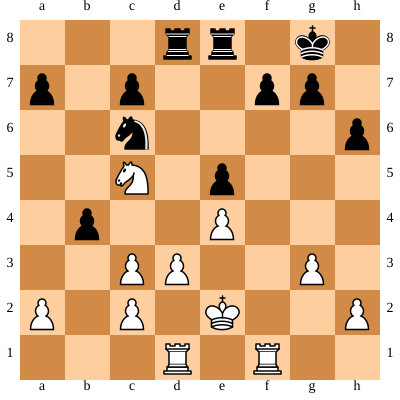



WHITE Turn
Move in UCI format: c3b4
Nodes per depth: {1: 33, 2: 595, 3: 7880}
Time taken by Move: 0.757164716720581


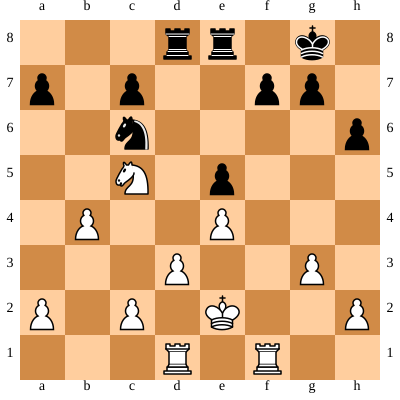



BLACK Turn
Move in UCI format: c6b4
Nodes per depth: {1: 26, 2: 338, 3: 5680, 4: 47921}
Time taken by Move: 4.347038984298706


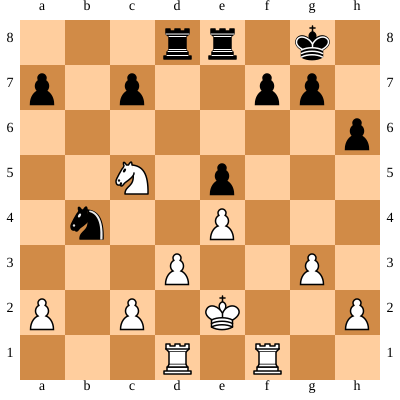



WHITE Turn
Move in UCI format: c5b7
Nodes per depth: {1: 33, 2: 504, 3: 7219}
Time taken by Move: 0.6771199703216553


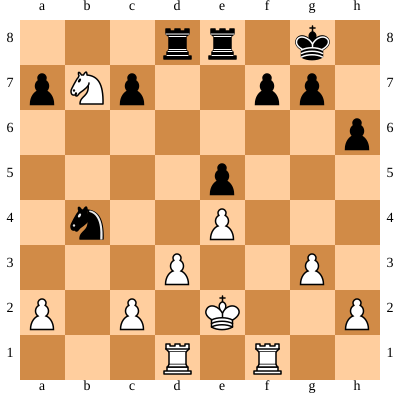



BLACK Turn
Move in UCI format: d8b8
Nodes per depth: {1: 29, 2: 178, 3: 2511, 4: 19475}
Time taken by Move: 1.782236099243164


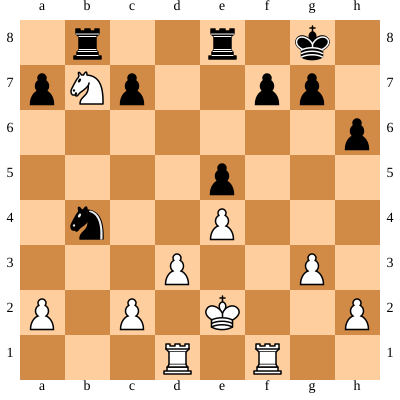



WHITE Turn
Move in UCI format: b7c5
Nodes per depth: {1: 31, 2: 365, 3: 5216}
Time taken by Move: 0.49001383781433105


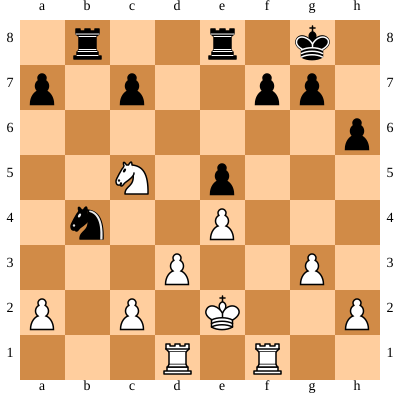



BLACK Turn
Move in UCI format: b4c2
Nodes per depth: {1: 28, 2: 327, 3: 4441, 4: 45491}
Time taken by Move: 4.1383750438690186


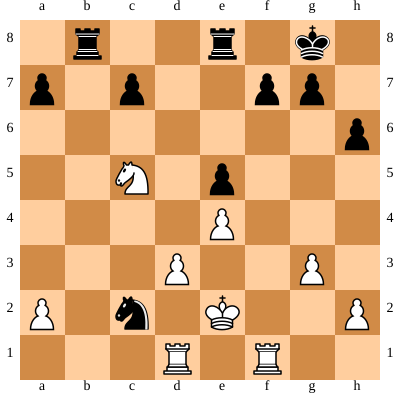



WHITE Turn
Move in UCI format: c5b3
Nodes per depth: {1: 29, 2: 456, 3: 6004}
Time taken by Move: 0.5707554817199707


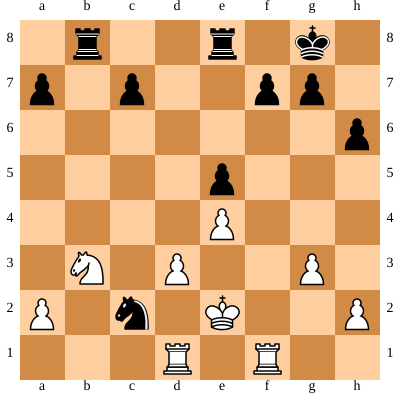



BLACK Turn
Move in UCI format: b8d8
Nodes per depth: {1: 31, 2: 388, 3: 7487, 4: 63569}
Time taken by Move: 5.832928657531738


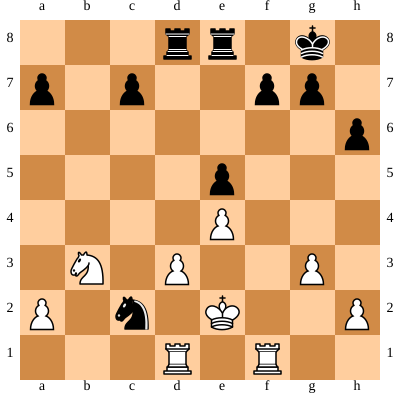



WHITE Turn
Move in UCI format: e2d2
Nodes per depth: {1: 29, 2: 462, 3: 5094}
Time taken by Move: 0.47368454933166504


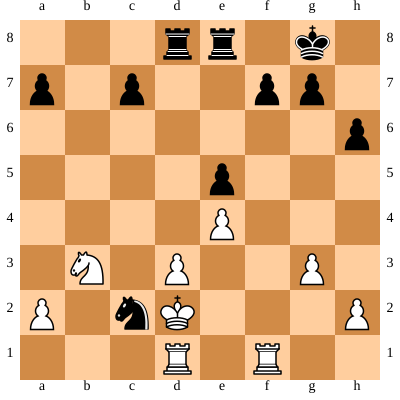



BLACK Turn
Move in UCI format: c2b4
Nodes per depth: {1: 29, 2: 240, 3: 3209, 4: 33336}
Time taken by Move: 3.0439908504486084


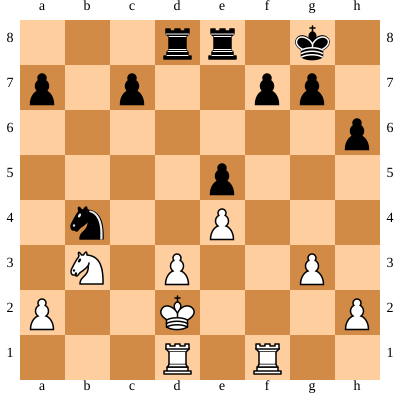



WHITE Turn
Move in UCI format: b3c1
Nodes per depth: {1: 29, 2: 411, 3: 4854}
Time taken by Move: 0.4710047245025635


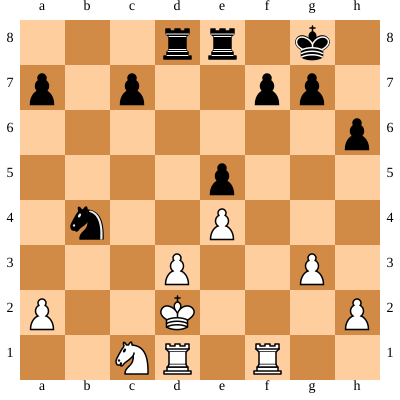



BLACK Turn
Move in UCI format: a7a6
Nodes per depth: {1: 29, 2: 243, 3: 4334, 4: 27661}
Time taken by Move: 2.5935218334198


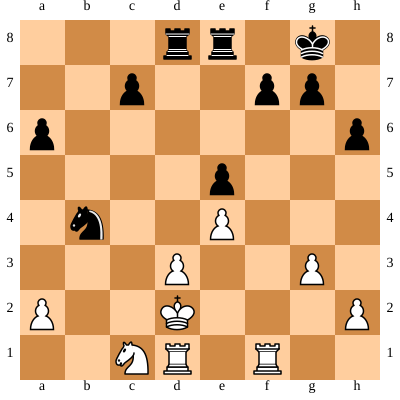



WHITE Turn
Move in UCI format: f1f5
Nodes per depth: {1: 22, 2: 333, 3: 2787}
Time taken by Move: 0.2839343547821045


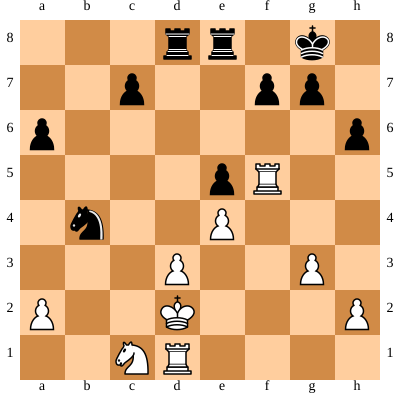



BLACK Turn
Move in UCI format: e8e7
Nodes per depth: {1: 26, 2: 364, 3: 5650, 4: 33613}
Time taken by Move: 3.070993661880493


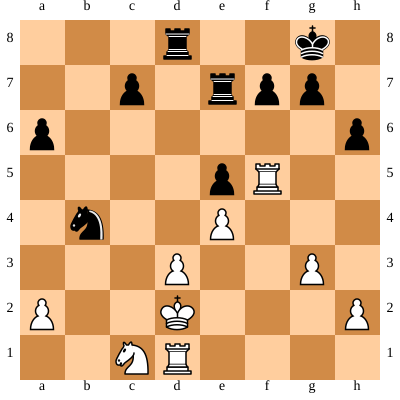



WHITE Turn
Move in UCI format: g3g4
Nodes per depth: {1: 25, 2: 383, 3: 3461}
Time taken by Move: 0.3405332565307617


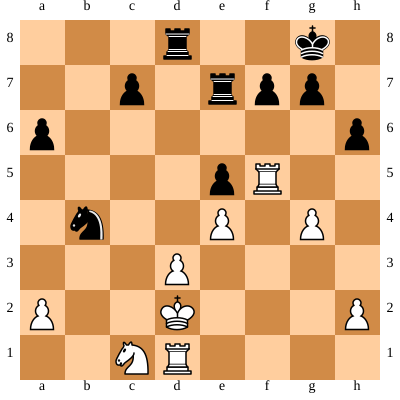



BLACK Turn
Move in UCI format: e7e8
Nodes per depth: {1: 28, 2: 256, 3: 4160, 4: 22005}
Time taken by Move: 2.0756747722625732


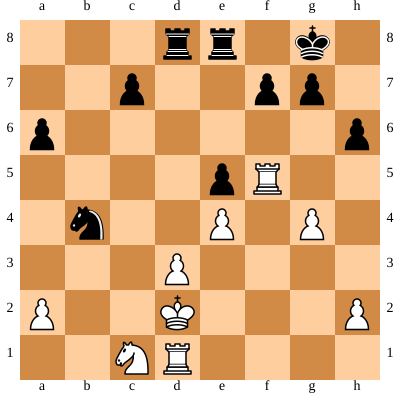



WHITE Turn
Move in UCI format: d2e2
Nodes per depth: {1: 25, 2: 412, 3: 3081}
Time taken by Move: 0.3059720993041992


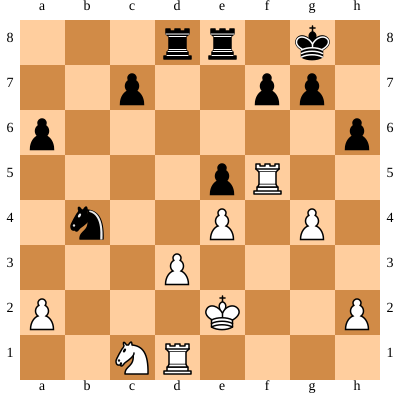



BLACK Turn
Move in UCI format: e8e7
Nodes per depth: {1: 26, 2: 344, 3: 5600, 4: 40063}
Time taken by Move: 3.7478432655334473


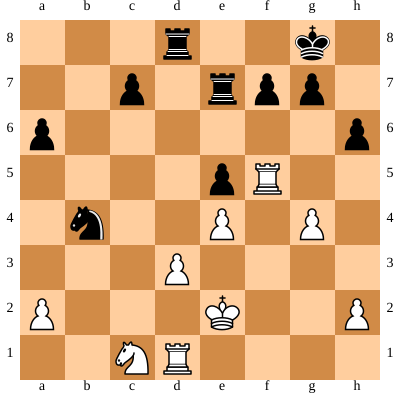



WHITE Turn
Move in UCI format: e2f1
Nodes per depth: {1: 27, 2: 362, 3: 3615}
Time taken by Move: 0.3551185131072998


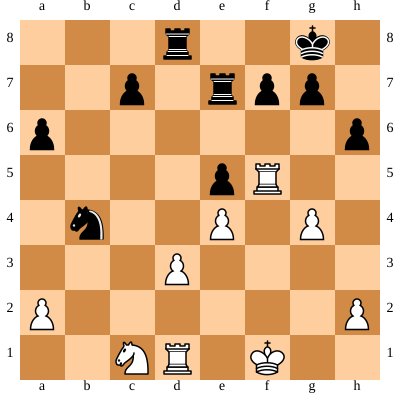



BLACK Turn
Move in UCI format: b4c2
Nodes per depth: {1: 28, 2: 327, 3: 5672, 4: 35345}
Time taken by Move: 3.2881476879119873


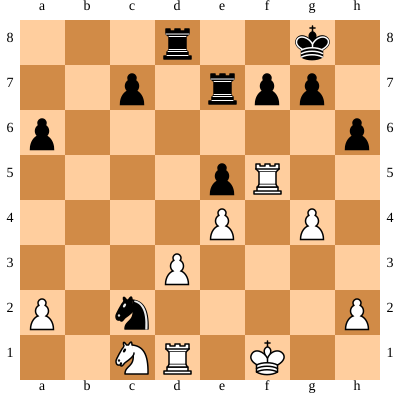



WHITE Turn
Move in UCI format: f1g1
Nodes per depth: {1: 22, 2: 383, 3: 2964}
Time taken by Move: 0.30960536003112793


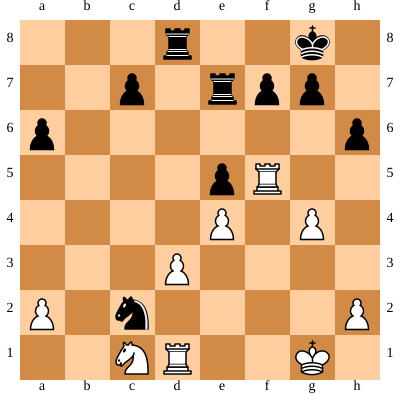



BLACK Turn
Move in UCI format: c2e3
Nodes per depth: {1: 29, 2: 349, 3: 5562, 4: 30811}
Time taken by Move: 2.8635342121124268


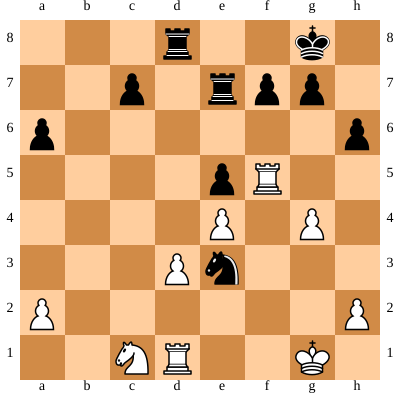



WHITE Turn
Move in UCI format: d1e1
Nodes per depth: {1: 22, 2: 508, 3: 3610}
Time taken by Move: 0.3776371479034424


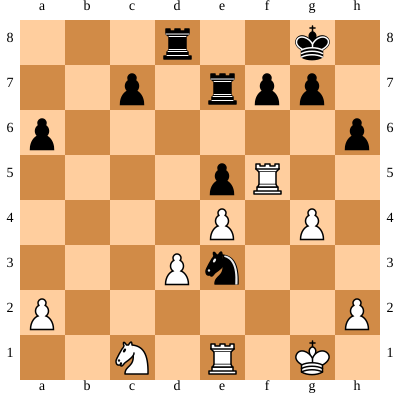



BLACK Turn
Move in UCI format: e3f5
Nodes per depth: {1: 31, 2: 273, 3: 4926, 4: 40868}
Time taken by Move: 3.7548930644989014


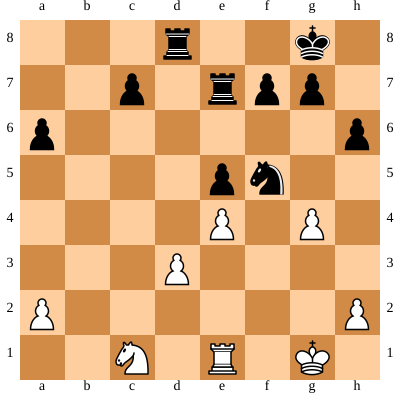



WHITE Turn
Move in UCI format: e4f5
Nodes per depth: {1: 18, 2: 262, 3: 3308}
Time taken by Move: 0.32245826721191406


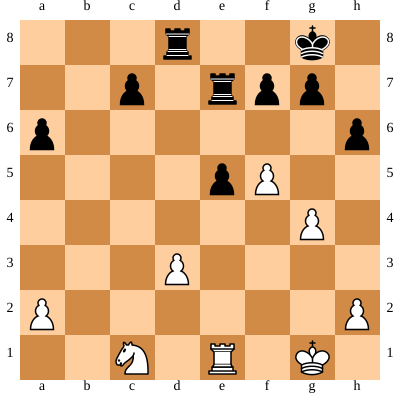



BLACK Turn
Move in UCI format: g8h8
Nodes per depth: {1: 24, 2: 180, 3: 2469, 4: 15941}
Time taken by Move: 1.504255771636963


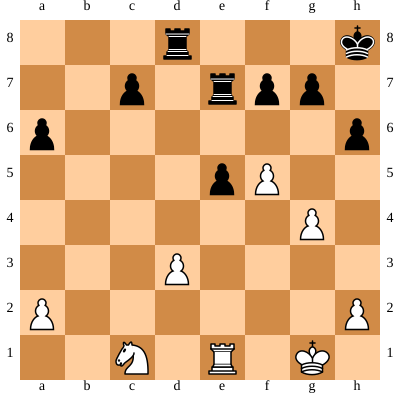



WHITE Turn
Move in UCI format: e1e4
Nodes per depth: {1: 19, 2: 135, 3: 1226}
Time taken by Move: 0.12451529502868652


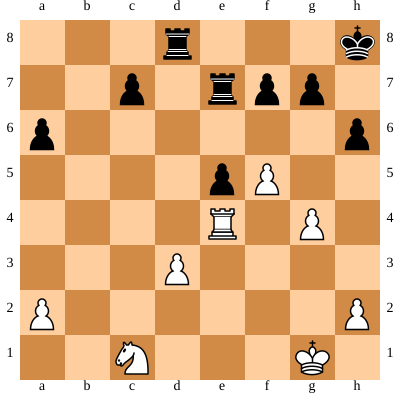



BLACK Turn
Move in UCI format: d8d4
Nodes per depth: {1: 23, 2: 271, 3: 2973, 4: 17196}
Time taken by Move: 1.5722060203552246


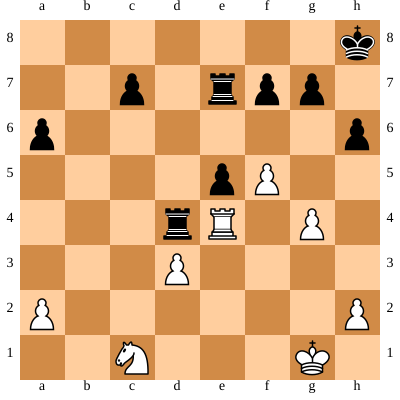



WHITE Turn
Move in UCI format: c1b3
Nodes per depth: {1: 18, 2: 209, 3: 1372}
Time taken by Move: 0.1487894058227539


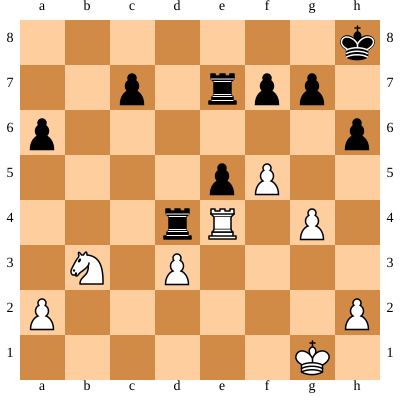



BLACK Turn
Move in UCI format: d4d3
Nodes per depth: {1: 21, 2: 222, 3: 2104, 4: 12975}
Time taken by Move: 1.1934971809387207


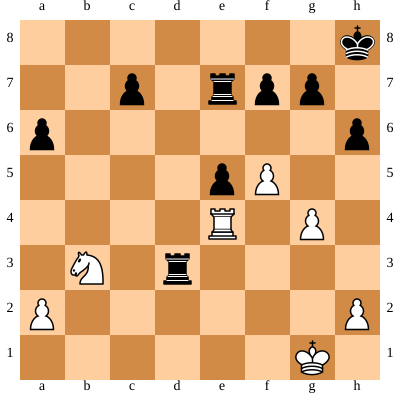



WHITE Turn
Move in UCI format: e4e1
Nodes per depth: {1: 25, 2: 272, 3: 2075}
Time taken by Move: 0.1991431713104248


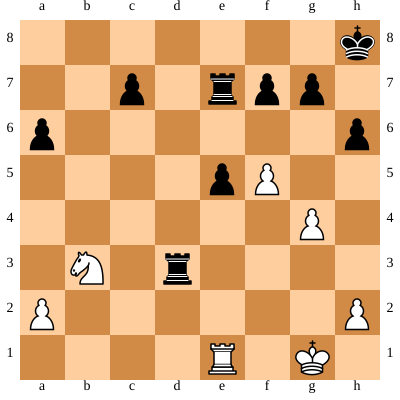



BLACK Turn
Move in UCI format: h8g8
Nodes per depth: {1: 26, 2: 110, 3: 1609, 4: 12494}
Time taken by Move: 1.1277964115142822


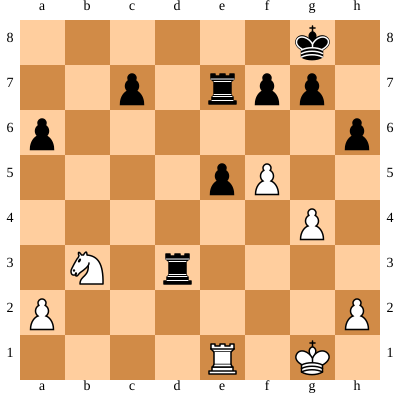



WHITE Turn
Move in UCI format: b3c5
Nodes per depth: {1: 25, 2: 132, 3: 2050}
Time taken by Move: 0.2027733325958252


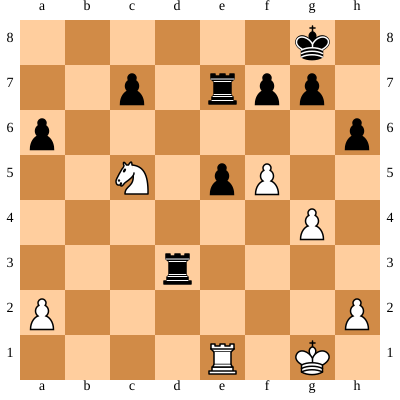



BLACK Turn
Move in UCI format: d3d2
Nodes per depth: {1: 27, 2: 300, 3: 3964, 4: 29493}
Time taken by Move: 2.645676612854004


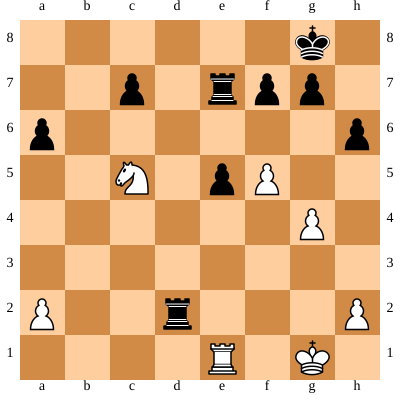



WHITE Turn
Move in UCI format: a2a3
Nodes per depth: {1: 25, 2: 315, 3: 3299}
Time taken by Move: 0.31157970428466797


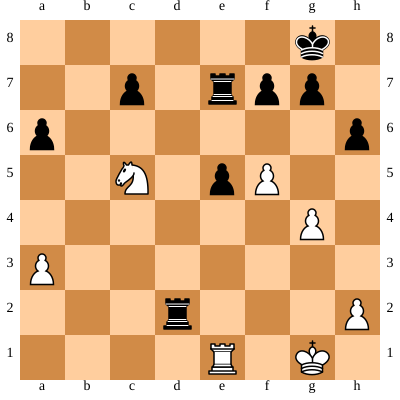



BLACK Turn
Move in UCI format: d2a2
Nodes per depth: {1: 27, 2: 228, 3: 3327, 4: 21929}
Time taken by Move: 1.9814741611480713


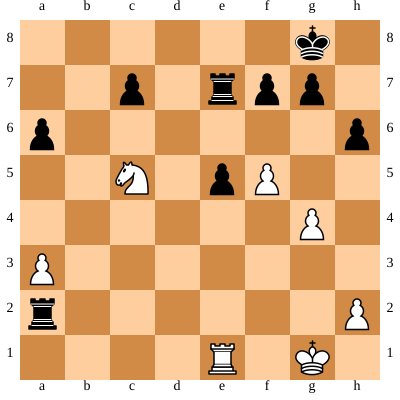



WHITE Turn
Move in UCI format: c5a6
Nodes per depth: {1: 24, 2: 189, 3: 2025}
Time taken by Move: 0.20968317985534668


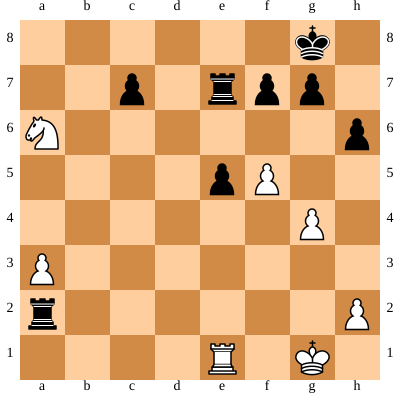



BLACK Turn
Move in UCI format: a2a3
Nodes per depth: {1: 22, 2: 99, 3: 1311, 4: 6316}
Time taken by Move: 0.6015703678131104


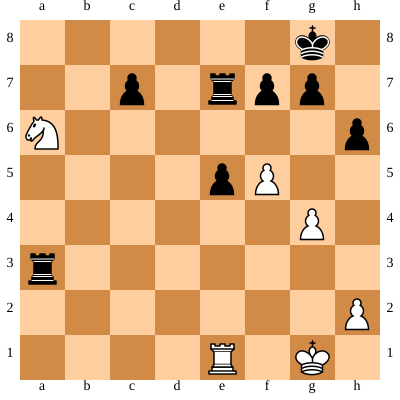



WHITE Turn
Move in UCI format: a6c5
Nodes per depth: {1: 21, 2: 107, 3: 1420}
Time taken by Move: 0.14105701446533203


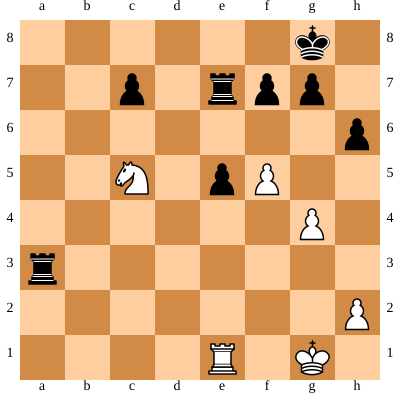



BLACK Turn
Move in UCI format: a3c3
Nodes per depth: {1: 26, 2: 264, 3: 4096, 4: 31625}
Time taken by Move: 2.782999277114868


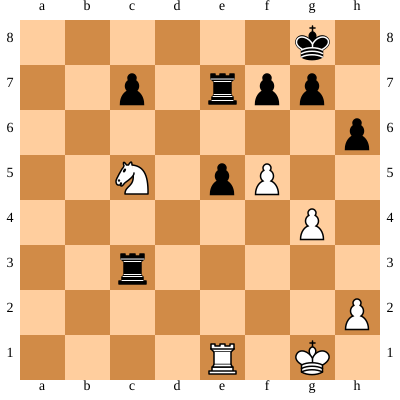



WHITE Turn
Move in UCI format: c5a6
Nodes per depth: {1: 25, 2: 236, 3: 2712}
Time taken by Move: 0.26656103134155273


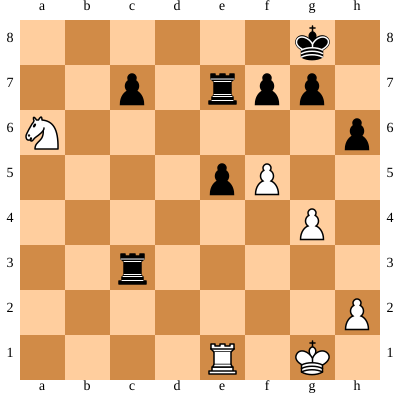



BLACK Turn
Move in UCI format: c7c5
Nodes per depth: {1: 25, 2: 217, 3: 3041, 4: 17097}
Time taken by Move: 1.5758569240570068


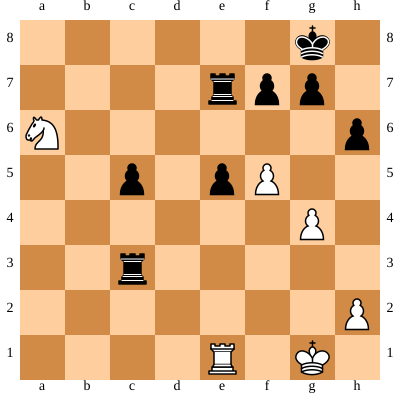



WHITE Turn
Move in UCI format: a6b8
Nodes per depth: {1: 21, 2: 371, 3: 2712}
Time taken by Move: 0.2724318504333496


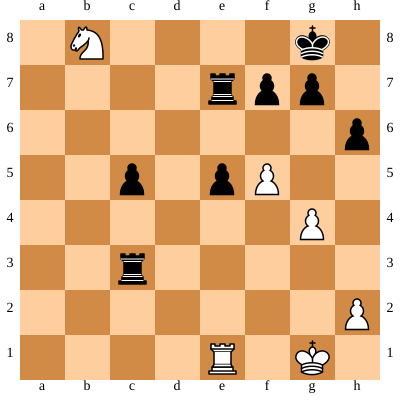



BLACK Turn
Move in UCI format: c3c4
Nodes per depth: {1: 25, 2: 136, 3: 1767, 4: 8665}
Time taken by Move: 0.8147003650665283


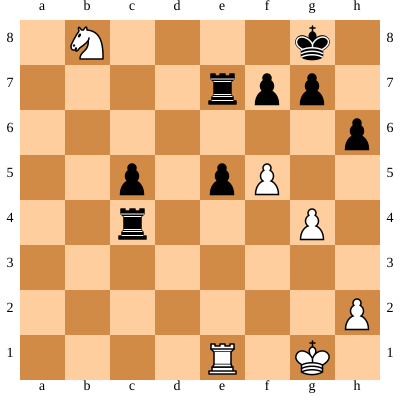



WHITE Turn
Move in UCI format: h2h3
Nodes per depth: {1: 20, 2: 256, 3: 1913}
Time taken by Move: 0.1894969940185547


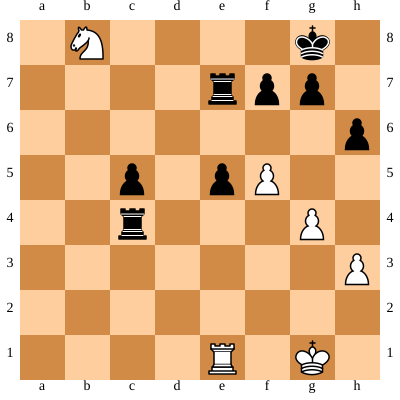



BLACK Turn
Move in UCI format: c4c3
Nodes per depth: {1: 23, 2: 135, 3: 1617, 4: 8473}
Time taken by Move: 0.7949075698852539


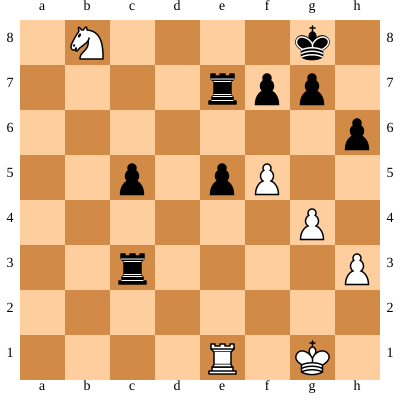



WHITE Turn
Move in UCI format: b8c6
Nodes per depth: {1: 20, 2: 239, 3: 2082}
Time taken by Move: 0.20829200744628906


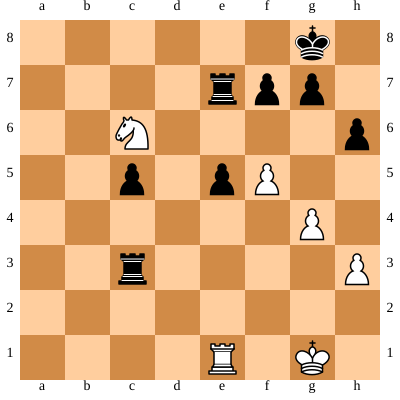



BLACK Turn
Move in UCI format: e7e8
Nodes per depth: {1: 25, 2: 148, 3: 1628, 4: 10463}
Time taken by Move: 0.9703407287597656


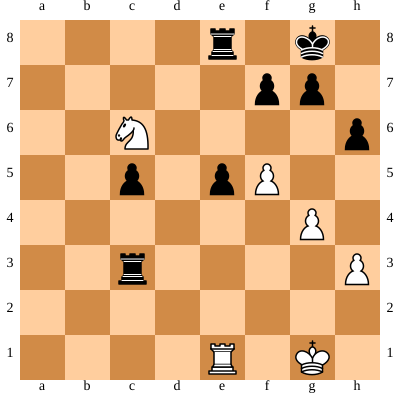



WHITE Turn
Move in UCI format: c6e5
Nodes per depth: {1: 25, 2: 300, 3: 2929}
Time taken by Move: 0.2821354866027832


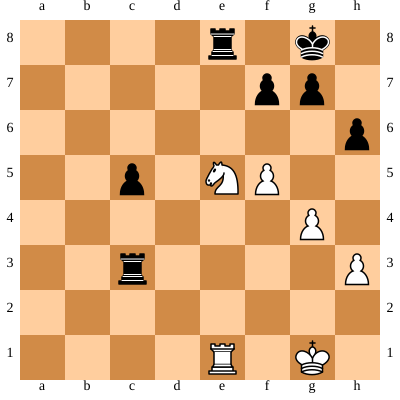



BLACK Turn
Move in UCI format: f7f6
Nodes per depth: {1: 26, 2: 366, 3: 5797, 4: 16751}
Time taken by Move: 1.601224660873413


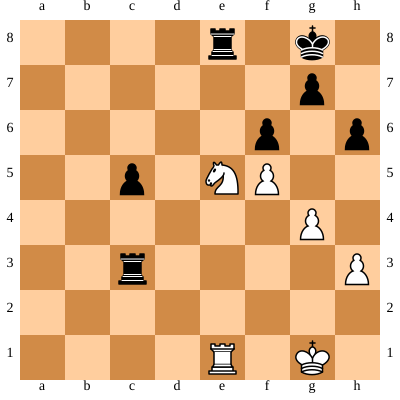



WHITE Turn
Move in UCI format: e5f3
Nodes per depth: {1: 22, 2: 392, 3: 4010}
Time taken by Move: 0.37305736541748047


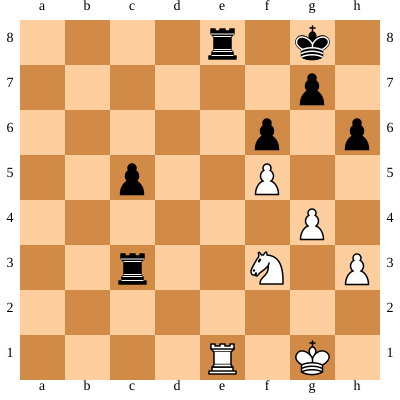



BLACK Turn
Move in UCI format: e8e1
Nodes per depth: {1: 28, 2: 282, 3: 5044, 4: 16472}
Time taken by Move: 1.5736286640167236


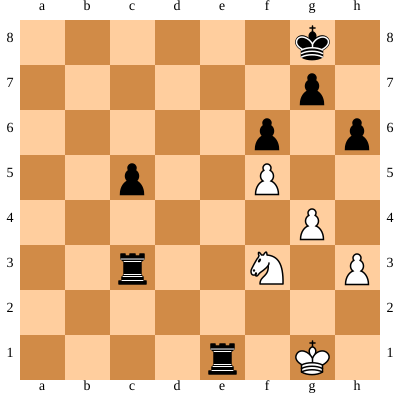



WHITE Turn
Move in UCI format: f3e1
Nodes per depth: {1: 4, 2: 108, 3: 486}
Time taken by Move: 0.0629124641418457


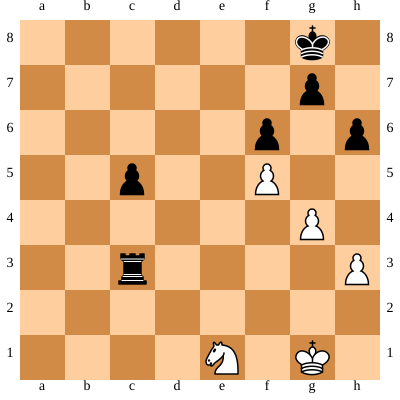



BLACK Turn
Move in UCI format: c3h3
Nodes per depth: {1: 18, 2: 44, 3: 543, 4: 1287}
Time taken by Move: 0.15445208549499512


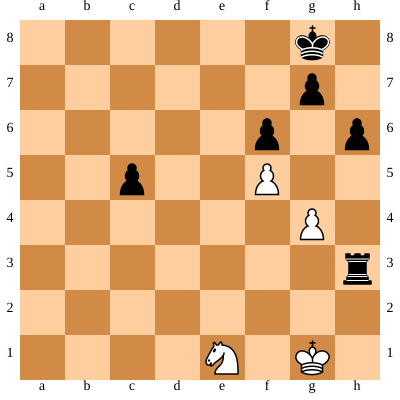



WHITE Turn
Move in UCI format: g1g2
Nodes per depth: {1: 8, 2: 61, 3: 330}
Time taken by Move: 0.045365333557128906


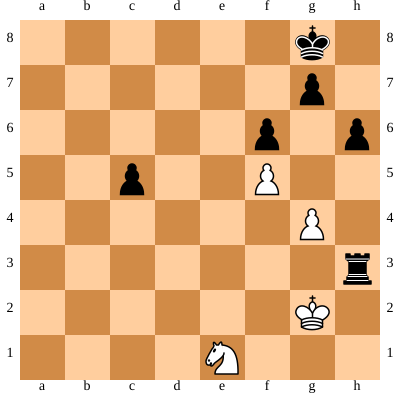



BLACK Turn
Move in UCI format: h3h4
Nodes per depth: {1: 19, 2: 49, 3: 467, 4: 1986}
Time taken by Move: 0.2400505542755127


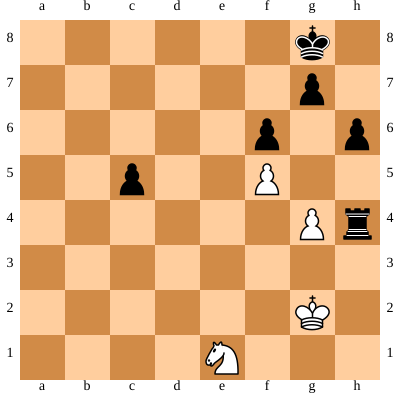



WHITE Turn
Move in UCI format: g2g3
Nodes per depth: {1: 9, 2: 62, 3: 401}
Time taken by Move: 0.053255319595336914


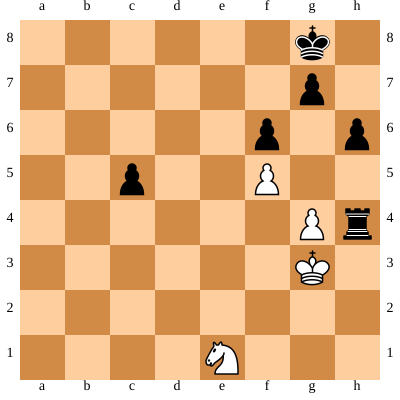



BLACK Turn
Move in UCI format: h4h1
Nodes per depth: {1: 13, 2: 49, 3: 387, 4: 2070}
Time taken by Move: 0.2259988784790039


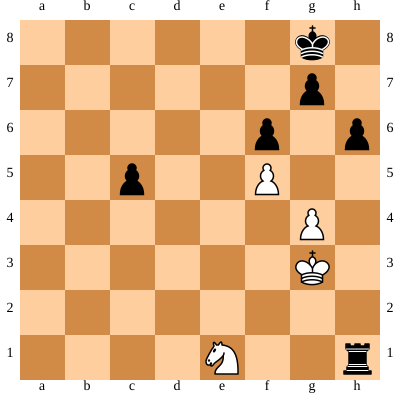



WHITE Turn
Move in UCI format: e1d3
Nodes per depth: {1: 9, 2: 117, 3: 627}
Time taken by Move: 0.07960009574890137


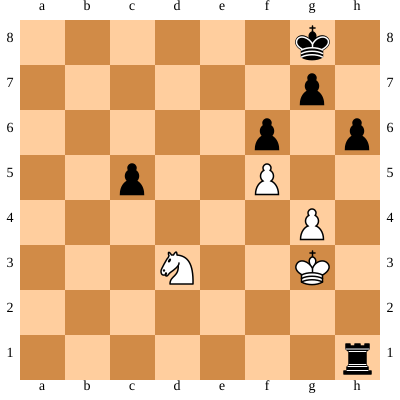



BLACK Turn
Move in UCI format: c5c4
Nodes per depth: {1: 19, 2: 104, 3: 1368, 4: 5909}
Time taken by Move: 0.5725889205932617


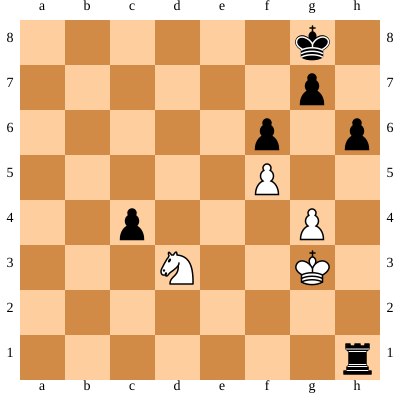



WHITE Turn
Move in UCI format: g3g2
Nodes per depth: {1: 13, 2: 124, 3: 850}
Time taken by Move: 0.10019063949584961


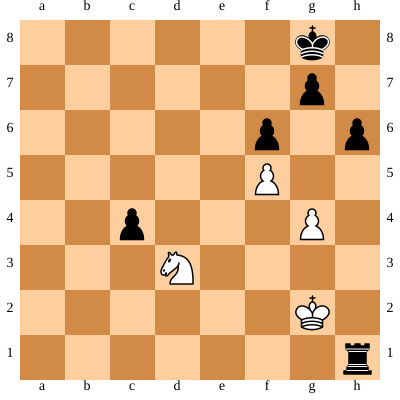



BLACK Turn
Move in UCI format: h1d1
Nodes per depth: {1: 20, 2: 112, 3: 1044, 4: 5438}
Time taken by Move: 0.5274121761322021


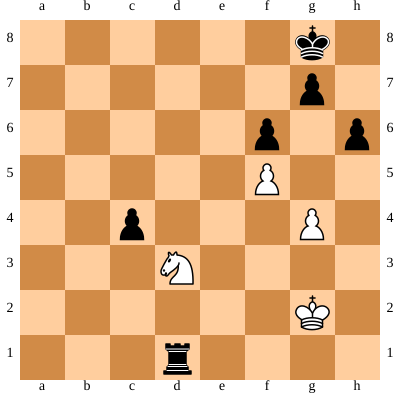



WHITE Turn
Move in UCI format: d3c5
Nodes per depth: {1: 14, 2: 138, 3: 875}
Time taken by Move: 0.09772157669067383


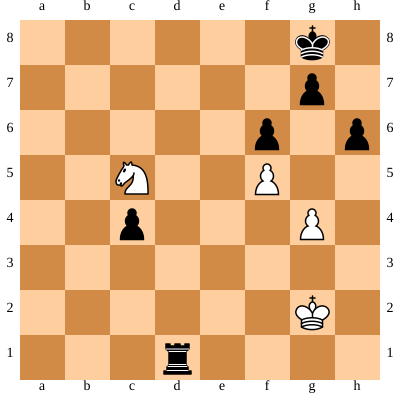



BLACK Turn
Move in UCI format: d1d4
Nodes per depth: {1: 22, 2: 97, 3: 1256, 4: 4511}
Time taken by Move: 0.450589656829834


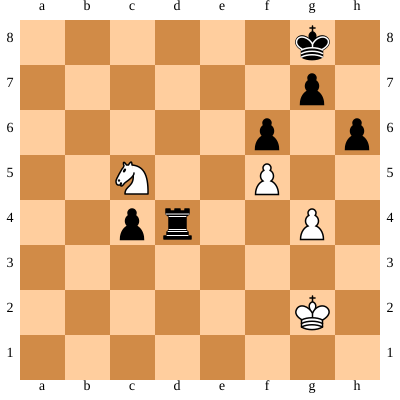



WHITE Turn
Move in UCI format: g2h3
Nodes per depth: {1: 17, 2: 201, 3: 1367}
Time taken by Move: 0.13784050941467285


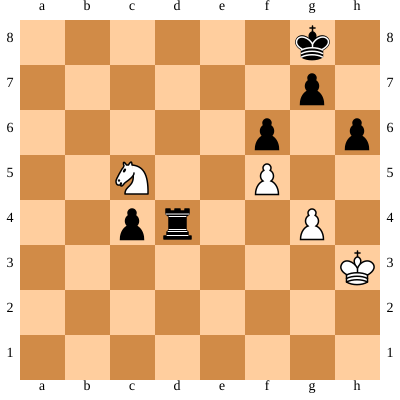



BLACK Turn
Move in UCI format: c4c3
Nodes per depth: {1: 18, 2: 111, 3: 1229, 4: 4800}
Time taken by Move: 0.4569838047027588


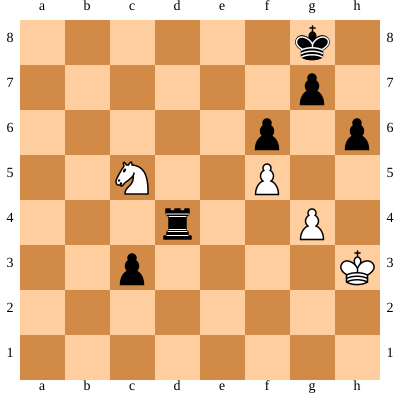



WHITE Turn
Move in UCI format: c5e6
Nodes per depth: {1: 13, 2: 137, 3: 843}
Time taken by Move: 0.10059356689453125


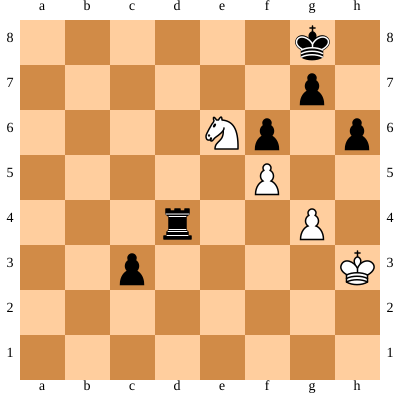



BLACK Turn
Move in UCI format: c3c2
Nodes per depth: {1: 20, 2: 180, 3: 2387, 4: 11276}
Time taken by Move: 1.0283911228179932


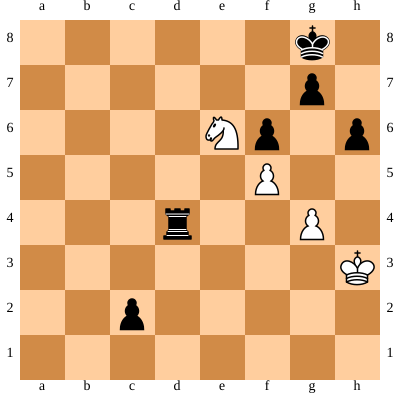



WHITE Turn
Move in UCI format: e6d4
Nodes per depth: {1: 13, 2: 253, 3: 1379}
Time taken by Move: 0.1503918170928955


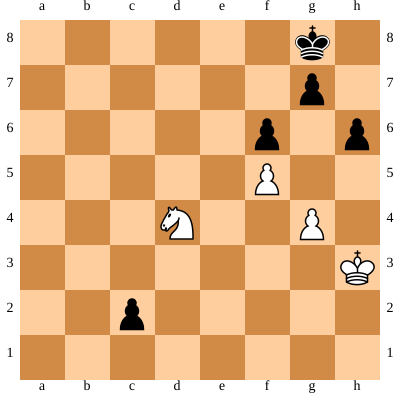



BLACK Turn
Move in UCI format: c2c1q
Nodes per depth: {1: 11, 2: 75, 3: 559, 4: 3741}
Time taken by Move: 0.36091065406799316


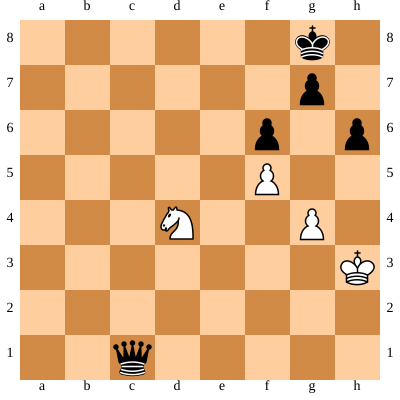



WHITE Turn
Move in UCI format: h3h2
Nodes per depth: {1: 12, 2: 170, 3: 1098}
Time taken by Move: 0.12300872802734375


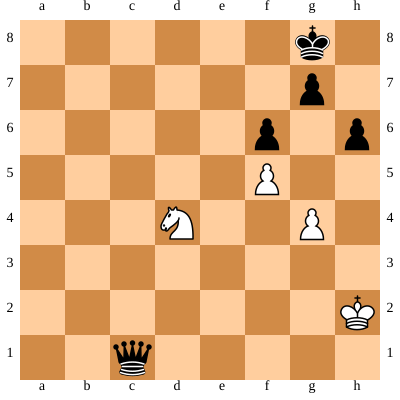



BLACK Turn
Move in UCI format: c1f4
Nodes per depth: {1: 27, 2: 72, 3: 1113, 4: 3636}
Time taken by Move: 0.37837958335876465


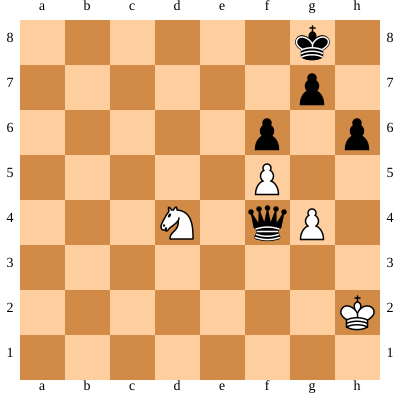



WHITE Turn
Move in UCI format: h2g2
Nodes per depth: {1: 4, 2: 74, 3: 422}
Time taken by Move: 0.05489921569824219


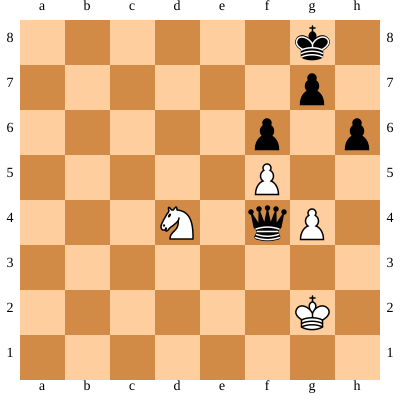



BLACK Turn
Move in UCI format: f4g4
Nodes per depth: {1: 24, 2: 46, 3: 788, 4: 1766}
Time taken by Move: 0.2078087329864502


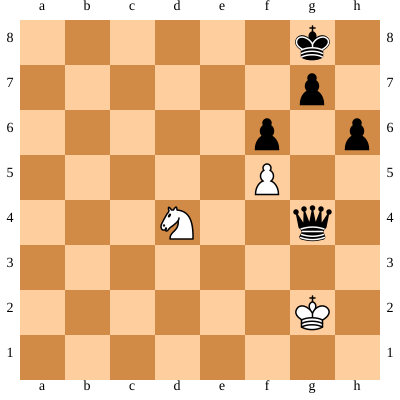



WHITE Turn
Move in UCI format: g2h2
Nodes per depth: {1: 4, 2: 58, 3: 275}
Time taken by Move: 0.03730177879333496


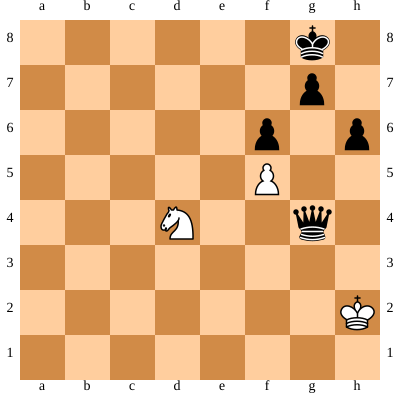



BLACK Turn
Move in UCI format: g4h4
Nodes per depth: {1: 22, 2: 48, 3: 738, 4: 1528}
Time taken by Move: 0.20515704154968262


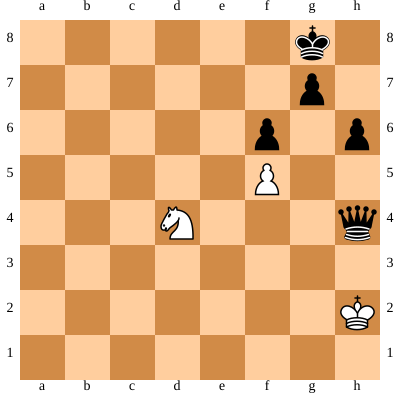



WHITE Turn
Move in UCI format: h2g2
Nodes per depth: {1: 2, 2: 29, 3: 110}
Time taken by Move: 0.015244245529174805


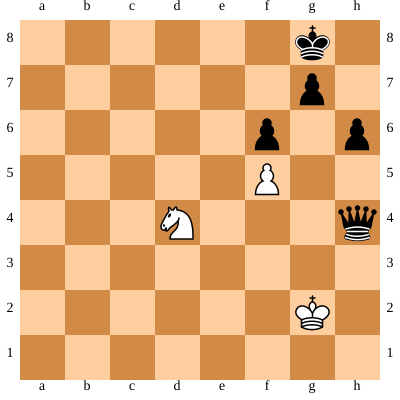



BLACK Turn
Move in UCI format: h4g4
Nodes per depth: {1: 19, 2: 49, 3: 677, 4: 2067}
Time taken by Move: 0.25730419158935547


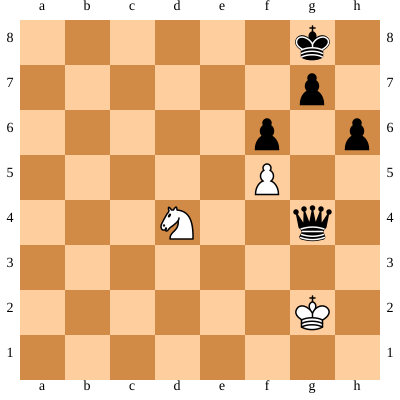



WHITE Turn
Move in UCI format: g2h2
Nodes per depth: {1: 4, 2: 58, 3: 275}
Time taken by Move: 0.03503584861755371


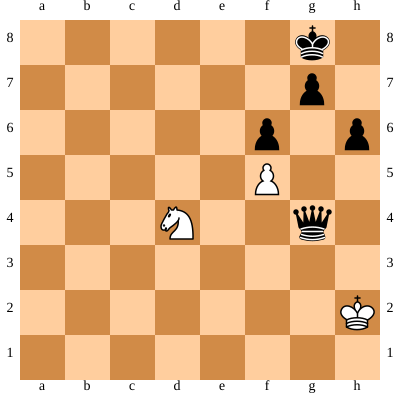



BLACK Turn
Move in UCI format: g4h4
Nodes per depth: {1: 22, 2: 48, 3: 738, 4: 1528}
Time taken by Move: 0.20469284057617188


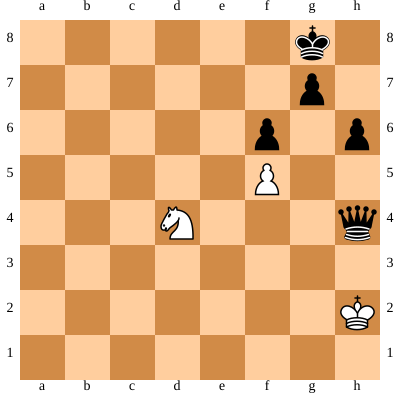



WHITE Turn
Move in UCI format: h2g2
Nodes per depth: {1: 2, 2: 29, 3: 110}
Time taken by Move: 0.016489744186401367


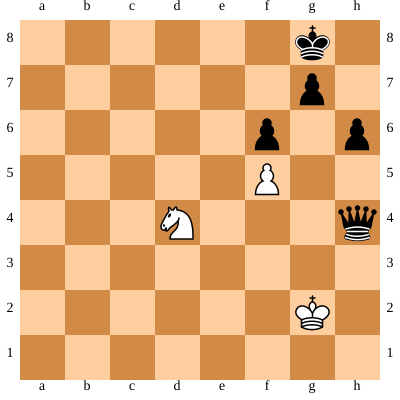



[Event "Example"]
[Site "Linz"]
[Date "2022-01-30"]
[Round "1"]
[White "MyChess"]
[Black "MyChess"]
[Result "1/2-1/2"]

1. Nf3 Nc6 2. Ng5 e5 3. d3 h6 4. Ne4 Nge7 5. Nbc3 d5 6. Nc5 Nf5 7. Nb3 Bb4 8. Bd2 d4 9. e4 dxe3 10. Bxe3 Nxe3 11. fxe3 Bxc3+ 12. bxc3 Qh4+ 13. g3 Qg4 14. e4 Qxd1+ 15. Rxd1 Bg4 16. Be2 Bxe2 17. Kxe2 O-O 18. Rhf1 Rfe8 19. Nc5 Rab8 20. Nd7 Rbd8 21. Nc5 b6 22. Nb3 b5 23. Nc5 b4 24. cxb4 Nxb4 25. Nb7 Rb8 26. Nc5 Nxc2 27. Nb3 Rbd8 28. Kd2 Nb4 29. Nc1 a6 30. Rf5 Re7 31. g4 Ree8 32. Ke2 Re7 33. Kf1 Nc2 34. Kg1 Ne3 35. Re1 Nxf5 36. exf5 Kh8 37. Re4 Rd4 38. Nb3 Rxd3 39. Re1 Kg8 40. Nc5 Rd2 41. a3 Ra2 42. Nxa6 Rxa3 43. Nc5 Rc3 44. Na6 c5 45. Nb8 Rc4 46. h3 Rc3 47. Nc6 Re8 48. Nxe5 f6 49. Nf3 Rxe1+ 50. Nxe1 Rxh3 51. Kg2 Rh4 52. Kg3 Rh1 53. Nd3 c4 54. Kg2 Rd1 55. Nc5 Rd4 56. Kh3 c3 57. Ne6 c2 58. Nxd4 c1=Q 59. Kh2 Qf4+ 60. Kg2 Qxg4+ 61. Kh2 Qh4+ 62. Kg2 Qg4+ 63. Kh2 Qh4+ 64. Kg2 1/2-1/2


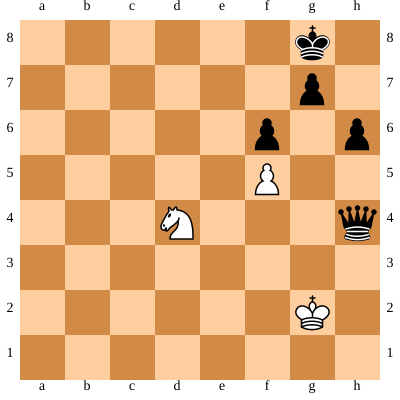

In [ ]:
import chess.pgn
import datetime
import time



movehistory =[]
game = chess.pgn.Game()
game.headers["Event"] = "Example"
game.headers["Site"] = "Linz"
game.headers["Date"] = str(datetime.datetime.now().date())
game.headers["Round"] = 1
game.headers["White"] = "MyChess"
game.headers["Black"] = "MyChess"
board = chess.Board()
while not board.is_game_over(claim_draw=True):
    start = time.time()
    nodes_per_depth = dict()
    if board.turn:
        
        print("WHITE Turn")
        move = selectmove_ab(3,movehistory)
        board.push(move)       
    else:
        print("BLACK Turn")
        move = selectmove_ab(4,movehistory)
        board.push(move)  
    end = time.time()
    print("Move in UCI format:", move)
    print("Nodes per depth:", nodes_per_depth)
    print("Time taken by Move:", end-start) 
    display(SVG(chess.svg.board(board, size=400)))  
    print("\n")

game.add_line(movehistory)
game.headers["Result"] = str(board.result(claim_draw=True))
print(game)
print(game, file=open("selftest.pgn", "w"), end="\n\n")

SVG(chess.svg.board(board=board,size=400))

### Quiescence vs Quiescence - same depth
Below, 2 quiescence search algorithms are confronting each other with max search depth of 3 for the minmax

WHITE Turn
Move in UCI format: g1f3
Nodes per depth: {1: 20, 2: 63, 3: 1406, 4: 12}
Time taken by Move: 0.08099627494812012


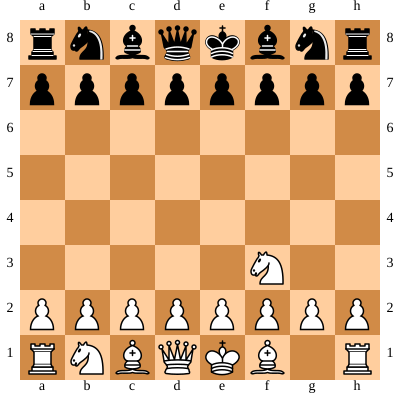



BLACK Turn
Move in UCI format: g8f6
Nodes per depth: {1: 20, 2: 93, 3: 1876, 4: 61, 5: 61}
Time taken by Move: 0.13138175010681152


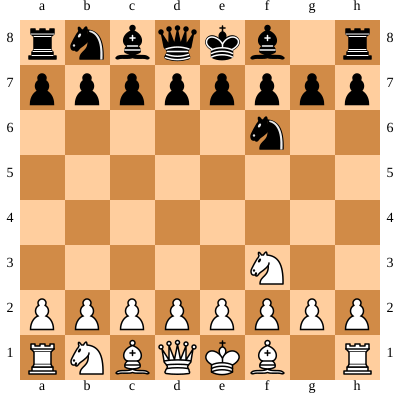



WHITE Turn
Move in UCI format: b1c3
Nodes per depth: {1: 22, 2: 97, 3: 2256, 4: 151, 5: 50, 6: 53, 7: 50, 8: 27, 9: 35, 10: 10, 11: 6, 12: 2, 13: 1, 14: 2, 15: 3, 16: 2, 17: 1}
Time taken by Move: 0.20740604400634766


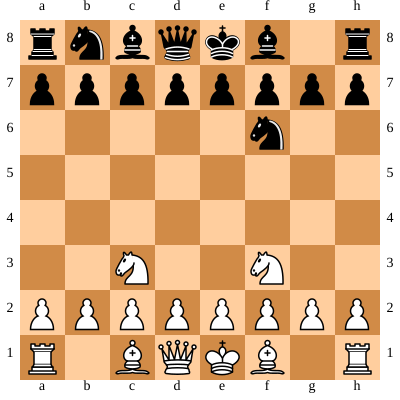



BLACK Turn
Move in UCI format: b8c6
Nodes per depth: {1: 22, 2: 122, 3: 3034, 4: 242, 5: 252, 6: 155, 7: 177, 8: 140, 9: 199, 10: 161, 11: 202, 12: 125, 13: 129, 14: 58, 15: 59, 16: 32, 17: 33, 18: 13, 19: 18, 20: 14, 21: 8, 22: 2}
Time taken by Move: 0.4891984462738037


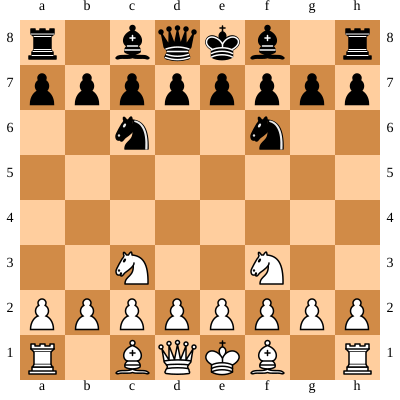



WHITE Turn
Move in UCI format: e2e3
Nodes per depth: {1: 24, 2: 342, 3: 9378, 4: 1157, 5: 1222, 6: 850, 7: 1014, 8: 930, 9: 848, 10: 706, 11: 569, 12: 382, 13: 266, 14: 184, 15: 118, 16: 83, 17: 63, 18: 34, 19: 22, 20: 6}
Time taken by Move: 1.8864154815673828


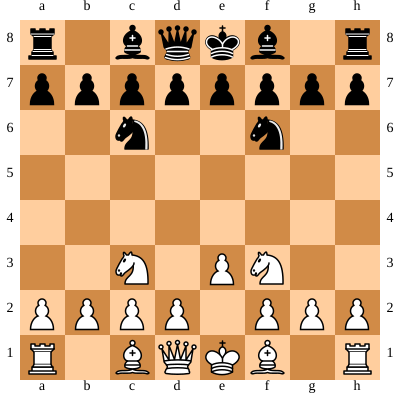



BLACK Turn
Move in UCI format: e7e6
Nodes per depth: {1: 24, 2: 342, 3: 9118, 4: 1142, 5: 1266, 6: 1092, 7: 1402, 8: 1022, 9: 1155, 10: 926, 11: 917, 12: 538, 13: 412, 14: 235, 15: 167, 16: 123, 17: 95, 18: 67, 19: 40, 20: 22, 21: 5}
Time taken by Move: 2.2249531745910645


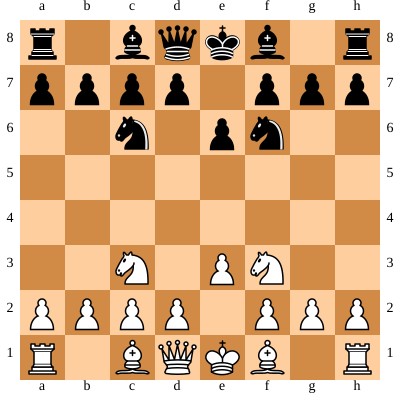



WHITE Turn
Move in UCI format: d2d4
Nodes per depth: {1: 31, 2: 372, 3: 12128, 4: 1369, 5: 1657, 6: 1147, 7: 1404, 8: 1031, 9: 928, 10: 664, 11: 654, 12: 481, 13: 336, 14: 252, 15: 168, 16: 113, 17: 67, 18: 44, 19: 28, 20: 16, 21: 10, 22: 6, 23: 5}
Time taken by Move: 2.4385080337524414


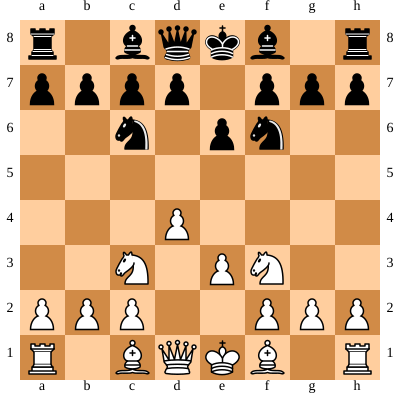



BLACK Turn
Move in UCI format: d7d5
Nodes per depth: {1: 31, 2: 202, 3: 6152, 4: 809, 5: 1259, 6: 1320, 7: 1687, 8: 1728, 9: 2022, 10: 2269, 11: 1953, 12: 1610, 13: 1388, 14: 912, 15: 750, 16: 414, 17: 220, 18: 145, 19: 136, 20: 77, 21: 91, 22: 44, 23: 42, 24: 15, 25: 10, 26: 1}
Time taken by Move: 3.3818516731262207


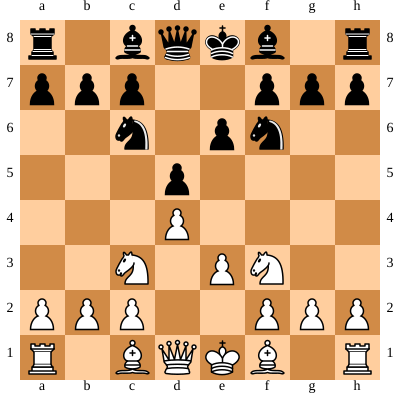



WHITE Turn
Move in UCI format: f1b5
Nodes per depth: {1: 33, 2: 148, 3: 5284, 4: 777, 5: 964, 6: 905, 7: 1004, 8: 1133, 9: 1549, 10: 1637, 11: 1688, 12: 1959, 13: 1619, 14: 1521, 15: 1167, 16: 845, 17: 615, 18: 400, 19: 236, 20: 102, 21: 106, 22: 37, 23: 31, 24: 13, 25: 14, 26: 6}
Time taken by Move: 3.2033579349517822


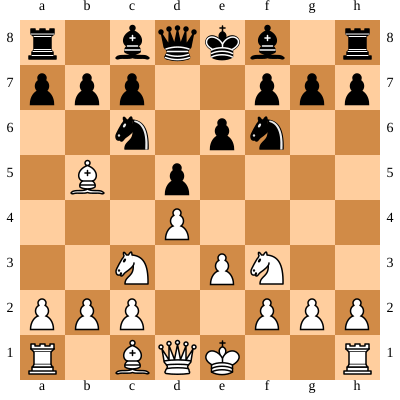



BLACK Turn
Move in UCI format: f8d6
Nodes per depth: {1: 26, 2: 196, 3: 1506, 4: 571, 5: 671, 6: 751, 7: 739, 8: 406, 9: 365, 10: 202, 11: 293, 12: 187, 13: 238, 14: 181, 15: 227, 16: 121, 17: 133, 18: 80, 19: 68, 20: 48, 21: 44, 22: 31, 23: 26, 24: 13, 25: 14, 26: 5, 27: 3}
Time taken by Move: 1.0599241256713867


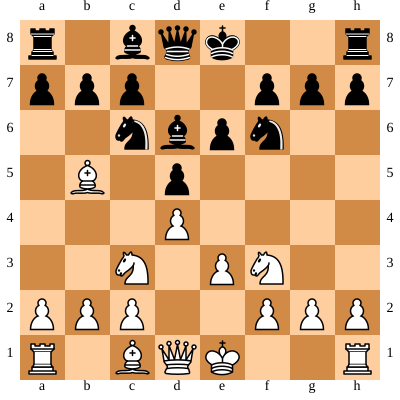



WHITE Turn
Move in UCI format: b5c6
Nodes per depth: {1: 37, 2: 59, 3: 3274, 4: 231, 5: 273, 6: 268, 7: 282, 8: 278, 9: 324, 10: 408, 11: 368, 12: 410, 13: 353, 14: 374, 15: 306, 16: 282, 17: 251, 18: 200, 19: 188, 20: 111, 21: 100, 22: 64, 23: 42, 24: 19, 25: 10, 26: 5}
Time taken by Move: 1.0220074653625488


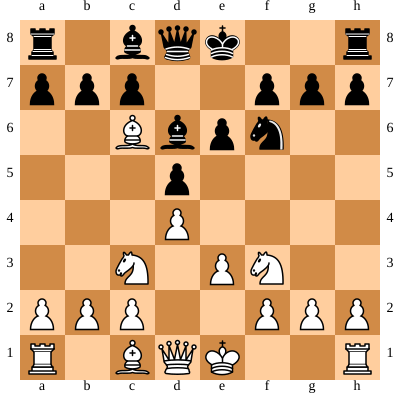



BLACK Turn
Move in UCI format: b7c6
Nodes per depth: {1: 6, 2: 76, 3: 1472, 4: 379, 5: 380, 6: 467, 7: 359, 8: 341, 9: 580, 10: 664, 11: 1149, 12: 987, 13: 1063, 14: 908, 15: 917, 16: 794, 17: 835, 18: 705, 19: 427, 20: 496, 21: 185, 22: 101, 23: 36, 24: 21, 25: 2}
Time taken by Move: 1.9459021091461182


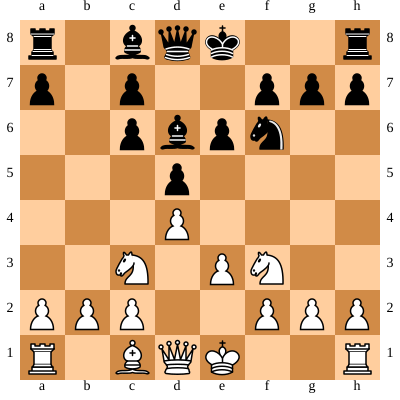



WHITE Turn
Move in UCI format: f3e5
Nodes per depth: {1: 31, 2: 243, 3: 8866, 4: 1051, 5: 1319, 6: 1285, 7: 1350, 8: 1572, 9: 1658, 10: 1640, 11: 1276, 12: 1077, 13: 804, 14: 568, 15: 448, 16: 474, 17: 390, 18: 339, 19: 238, 20: 137, 21: 86, 22: 42, 23: 30, 24: 16, 25: 11, 26: 8, 27: 1}
Time taken by Move: 2.9700701236724854


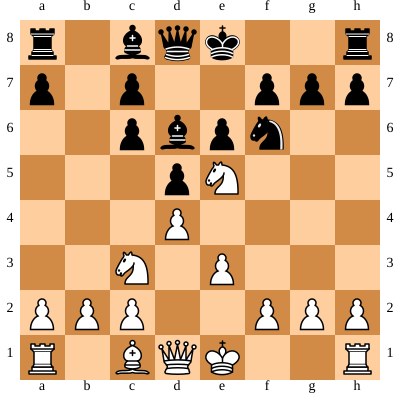



BLACK Turn
Move in UCI format: c8b7
Nodes per depth: {1: 29, 2: 283, 3: 8262, 4: 2224, 5: 2596, 6: 3278, 7: 2250, 8: 2018, 9: 2068, 10: 1434, 11: 1267, 12: 856, 13: 909, 14: 671, 15: 875, 16: 618, 17: 530, 18: 359, 19: 244, 20: 140, 21: 86, 22: 41, 23: 11, 24: 2, 25: 1, 26: 1}
Time taken by Move: 4.035017490386963


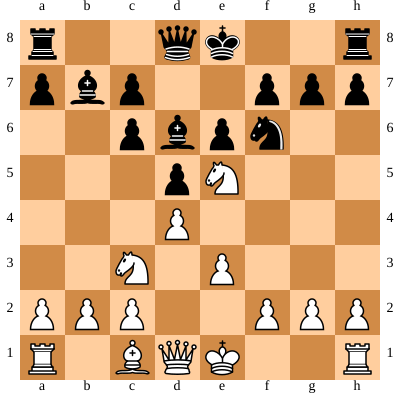



WHITE Turn
Move in UCI format: d1f3
Nodes per depth: {1: 39, 2: 573, 3: 17944, 4: 3057, 5: 5214, 6: 2041, 7: 2598, 8: 1963, 9: 2461, 10: 2176, 11: 2099, 12: 1259, 13: 1019, 14: 562, 15: 493, 16: 256, 17: 198, 18: 122, 19: 98, 20: 44, 21: 51, 22: 24, 23: 25, 24: 9, 25: 6, 26: 1}
Time taken by Move: 5.253920555114746


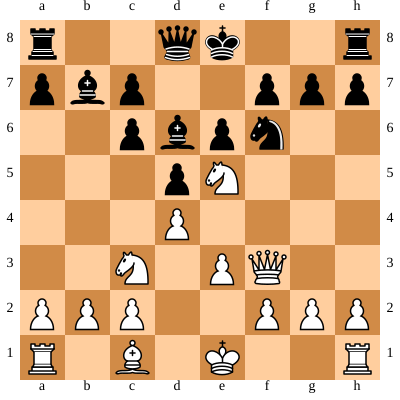



BLACK Turn
Move in UCI format: e8g8
Nodes per depth: {1: 31, 2: 665, 3: 22246, 4: 7138, 5: 7234, 6: 16259, 7: 7345, 8: 10884, 9: 6268, 10: 6482, 11: 4055, 12: 4103, 13: 2859, 14: 3061, 15: 2059, 16: 2182, 17: 1640, 18: 1580, 19: 1258, 20: 1222, 21: 933, 22: 652, 23: 386, 24: 245, 25: 86, 26: 15, 27: 6}
Time taken by Move: 14.870548009872437


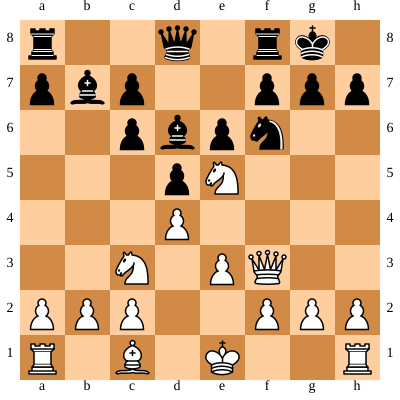



WHITE Turn
Move in UCI format: e1g1
Nodes per depth: {1: 43, 2: 381, 3: 14902, 4: 2770, 5: 6936, 6: 3383, 7: 6360, 8: 4175, 9: 6202, 10: 4565, 11: 5432, 12: 3703, 13: 3589, 14: 2603, 15: 2449, 16: 2003, 17: 1809, 18: 1575, 19: 1371, 20: 910, 21: 692, 22: 396, 23: 309, 24: 152, 25: 74, 26: 19, 27: 2}
Time taken by Move: 10.084786176681519


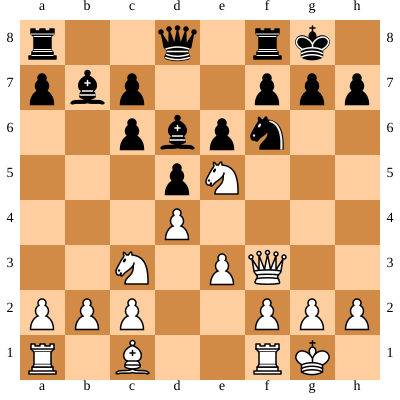



BLACK Turn
Move in UCI format: f6d7
Nodes per depth: {1: 28, 2: 528, 3: 14786, 4: 6107, 5: 7534, 6: 15013, 7: 7988, 8: 11848, 9: 8277, 10: 8511, 11: 7747, 12: 6701, 13: 6752, 14: 5882, 15: 5684, 16: 4983, 17: 4828, 18: 4048, 19: 3724, 20: 2588, 21: 2312, 22: 1362, 23: 1034, 24: 526, 25: 355, 26: 136, 27: 14, 28: 7, 29: 4}
Time taken by Move: 18.669840097427368


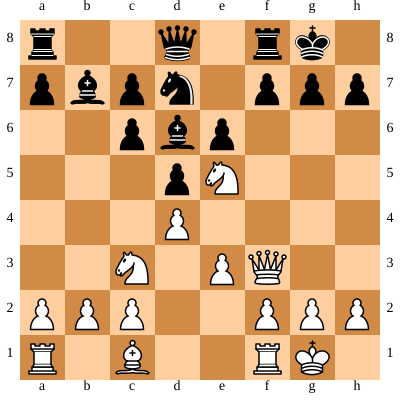



WHITE Turn
Move in UCI format: e5d7
Nodes per depth: {1: 40, 2: 244, 3: 9260, 4: 2337, 5: 5679, 6: 3128, 7: 4438, 8: 3834, 9: 4019, 10: 4751, 11: 3573, 12: 5042, 13: 3358, 14: 4468, 15: 3588, 16: 4022, 17: 2642, 18: 2387, 19: 1499, 20: 1271, 21: 780, 22: 623, 23: 292, 24: 160, 25: 48, 26: 14, 27: 4, 28: 1}
Time taken by Move: 9.525115728378296


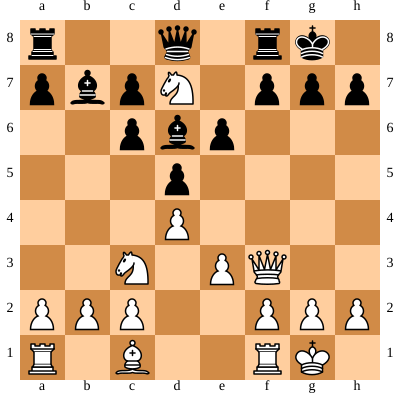



BLACK Turn
Move in UCI format: d8d7
Nodes per depth: {1: 32, 2: 142, 3: 3546, 4: 786, 5: 980, 6: 1456, 7: 859, 8: 984, 9: 737, 10: 598, 11: 590, 12: 492, 13: 493, 14: 551, 15: 499, 16: 610, 17: 505, 18: 626, 19: 501, 20: 496, 21: 358, 22: 347, 23: 205, 24: 123, 25: 23, 26: 15}
Time taken by Move: 2.075901985168457


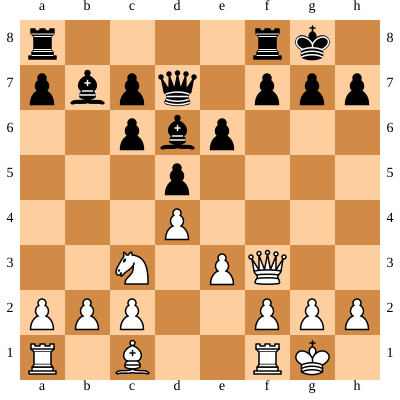



WHITE Turn
Move in UCI format: f1d1
Nodes per depth: {1: 33, 2: 598, 3: 21792, 4: 5867, 5: 8864, 6: 4371, 7: 7160, 8: 4391, 9: 5470, 10: 3633, 11: 3432, 12: 2404, 13: 2325, 14: 1396, 15: 1360, 16: 865, 17: 798, 18: 548, 19: 396, 20: 235, 21: 115, 22: 41, 23: 19}
Time taken by Move: 9.295712232589722


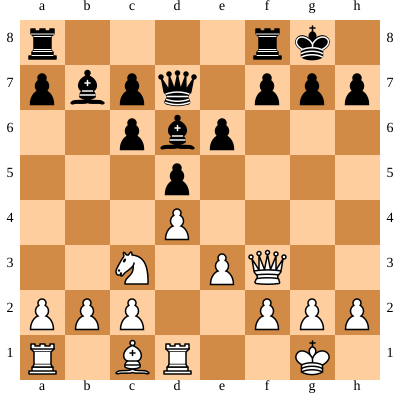



BLACK Turn
Move in UCI format: c6c5
Nodes per depth: {1: 33, 2: 624, 3: 23700, 4: 4568, 5: 5454, 6: 8261, 7: 3865, 8: 5588, 9: 4687, 10: 3025, 11: 2353, 12: 1616, 13: 1359, 14: 1023, 15: 1092, 16: 623, 17: 566, 18: 301, 19: 268, 20: 111, 21: 71, 22: 22, 23: 10}
Time taken by Move: 7.8519127368927


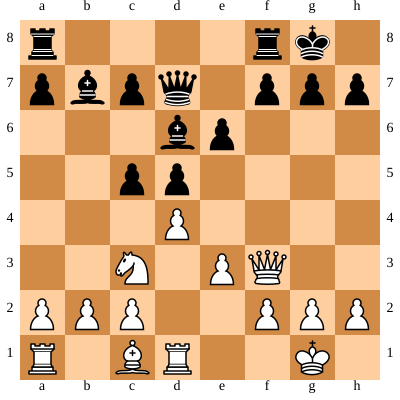



WHITE Turn
Move in UCI format: a1b1
Nodes per depth: {1: 35, 2: 522, 3: 16788, 4: 4999, 5: 12101, 6: 8647, 7: 16024, 8: 11415, 9: 14893, 10: 14837, 11: 13079, 12: 12538, 13: 10055, 14: 9146, 15: 7010, 16: 6296, 17: 5139, 18: 3918, 19: 3187, 20: 1946, 21: 1261, 22: 611, 23: 351, 24: 103, 25: 37, 26: 5}
Time taken by Move: 24.077173709869385


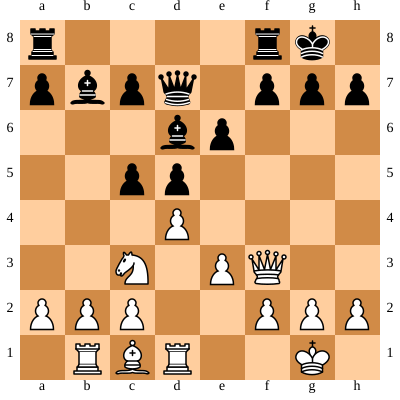



BLACK Turn
Move in UCI format: d7c6
Nodes per depth: {1: 36, 2: 451, 3: 18210, 4: 5551, 5: 6064, 6: 13732, 7: 7390, 8: 14394, 9: 12379, 10: 13513, 11: 12091, 12: 10879, 13: 9854, 14: 8670, 15: 8417, 16: 7664, 17: 6585, 18: 4842, 19: 3892, 20: 2246, 21: 1463, 22: 776, 23: 456, 24: 177, 25: 67, 26: 17, 27: 5}
Time taken by Move: 22.675968885421753


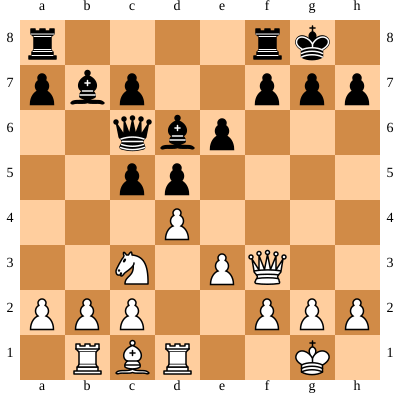



WHITE Turn
Move in UCI format: b1a1
Nodes per depth: {1: 34, 2: 434, 3: 13314, 4: 4571, 5: 10216, 6: 8291, 7: 15637, 8: 13549, 9: 19951, 10: 21144, 11: 19684, 12: 20868, 13: 14979, 14: 16359, 15: 13012, 16: 12524, 17: 9772, 18: 8693, 19: 5064, 20: 3951, 21: 1607, 22: 853, 23: 356, 24: 65, 25: 23, 26: 4}
Time taken by Move: 32.47710132598877


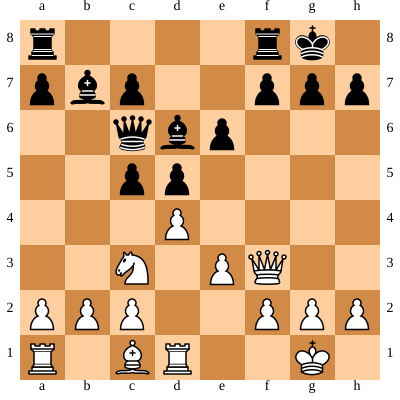



BLACK Turn
Move in UCI format: f8e8
Nodes per depth: {1: 33, 2: 303, 3: 11006, 4: 4016, 5: 5822, 6: 13627, 7: 10519, 8: 18333, 9: 19101, 10: 24768, 11: 24131, 12: 23424, 13: 21859, 14: 19132, 15: 17424, 16: 14717, 17: 11257, 18: 8339, 19: 5355, 20: 3066, 21: 1419, 22: 572, 23: 268, 24: 122, 25: 39, 26: 6}
Time taken by Move: 36.10577845573425


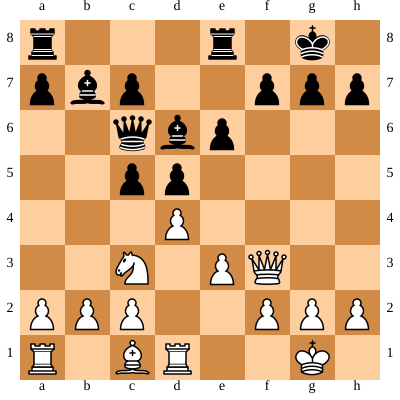



WHITE Turn
Move in UCI format: d1d2
Nodes per depth: {1: 35, 2: 821, 3: 26836, 4: 9327, 5: 22518, 6: 16839, 7: 32172, 8: 24803, 9: 38920, 10: 35673, 11: 39979, 12: 35580, 13: 28859, 14: 24374, 15: 20604, 16: 15493, 17: 14052, 18: 9970, 19: 8407, 20: 4380, 21: 2620, 22: 1132, 23: 461, 24: 168, 25: 45, 26: 6}
Time taken by Move: 58.124032497406006


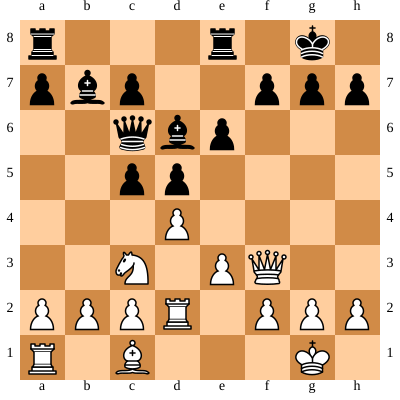



BLACK Turn
Move in UCI format: a8d8
Nodes per depth: {1: 34, 2: 340, 3: 11718, 4: 3861, 5: 5335, 6: 12120, 7: 9189, 8: 16380, 9: 16529, 10: 22755, 11: 23349, 12: 25989, 13: 28410, 14: 28477, 15: 31085, 16: 29878, 17: 25792, 18: 21993, 19: 14452, 20: 9463, 21: 4672, 22: 2707, 23: 879, 24: 341, 25: 86, 26: 25}
Time taken by Move: 48.47594666481018


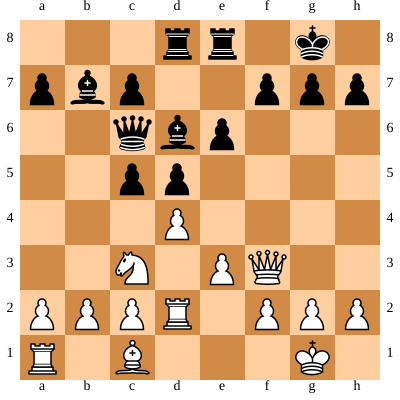



WHITE Turn
Move in UCI format: d2d3
Nodes per depth: {1: 35, 2: 794, 3: 24900, 4: 9128, 5: 22651, 6: 16990, 7: 32108, 8: 23496, 9: 36542, 10: 33326, 11: 41292, 12: 41489, 13: 44977, 14: 49382, 15: 50018, 16: 52479, 17: 53164, 18: 47864, 19: 40455, 20: 27759, 21: 19811, 22: 10864, 23: 6007, 24: 2753, 25: 1024, 26: 279, 27: 103}
Time taken by Move: 96.38940739631653


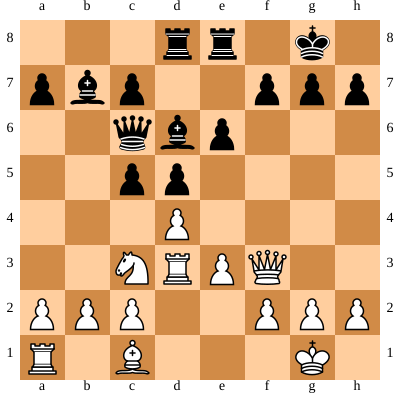



BLACK Turn
Move in UCI format: c5c4
Nodes per depth: {1: 33, 2: 435, 3: 15670, 4: 4804, 5: 5651, 6: 13425, 7: 8593, 8: 15772, 9: 12834, 10: 19139, 11: 17044, 12: 18361, 13: 17299, 14: 16356, 15: 15307, 16: 14798, 17: 12194, 18: 10774, 19: 7048, 20: 5779, 21: 3016, 22: 2139, 23: 800, 24: 336, 25: 26, 26: 10}
Time taken by Move: 32.39822435379028


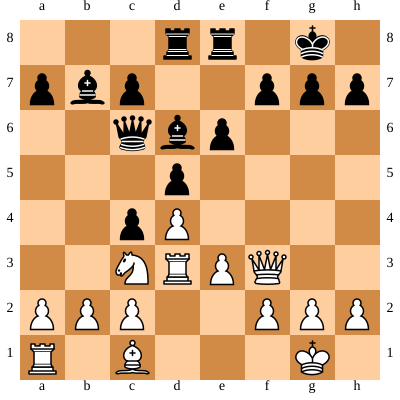



WHITE Turn
Move in UCI format: d3d1
Nodes per depth: {1: 34, 2: 540, 3: 15988, 4: 7426, 5: 13877, 6: 9255, 7: 20497, 8: 10739, 9: 17428, 10: 15556, 11: 21160, 12: 19300, 13: 23190, 14: 21259, 15: 23594, 16: 19742, 17: 22444, 18: 15488, 19: 16139, 20: 8655, 21: 6911, 22: 2770, 23: 1829, 24: 576, 25: 316, 26: 5, 27: 2}
Time taken by Move: 43.536541223526


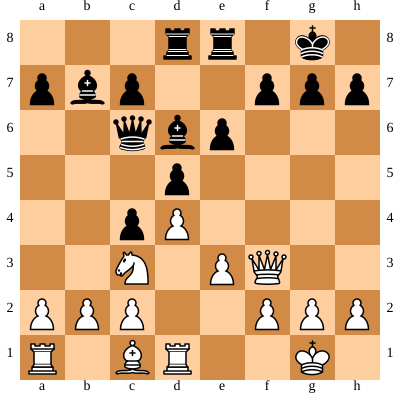



BLACK Turn
Move in UCI format: e6e5
Nodes per depth: {1: 35, 2: 528, 3: 19988, 4: 2436, 5: 2826, 6: 4614, 7: 2936, 8: 4259, 9: 3146, 10: 3282, 11: 2428, 12: 2283, 13: 2242, 14: 2468, 15: 2601, 16: 2880, 17: 2750, 18: 2568, 19: 1996, 20: 1263, 21: 744, 22: 460, 23: 164, 24: 105, 25: 21, 26: 1}
Time taken by Move: 8.100124835968018


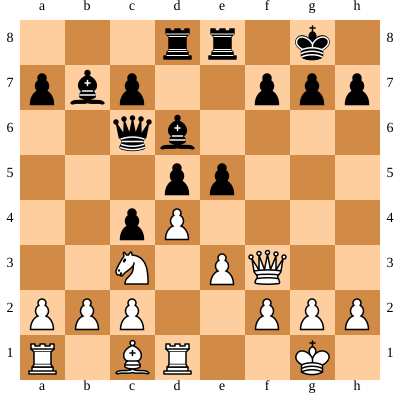



WHITE Turn
Move in UCI format: d4e5
Nodes per depth: {1: 35, 2: 637, 3: 20810, 4: 5004, 5: 13933, 6: 10733, 7: 23075, 8: 21380, 9: 34298, 10: 28810, 11: 37378, 12: 32303, 13: 38455, 14: 32699, 15: 33393, 16: 27225, 17: 29047, 18: 20722, 19: 21452, 20: 11964, 21: 10902, 22: 5561, 23: 4121, 24: 2090, 25: 993, 26: 160, 27: 9}
Time taken by Move: 64.99232316017151


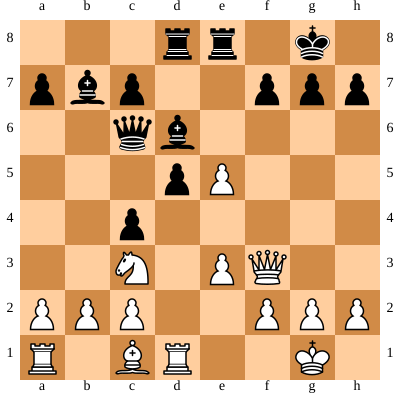



BLACK Turn
Move in UCI format: e8e5
Nodes per depth: {1: 34, 2: 347, 3: 11090, 4: 7144, 5: 11809, 6: 22030, 7: 21608, 8: 29358, 9: 24196, 10: 17760, 11: 17192, 12: 10471, 13: 9784, 14: 6786, 15: 5519, 16: 3707, 17: 2914, 18: 2106, 19: 1725, 20: 1004, 21: 621, 22: 300, 23: 126, 24: 22}
Time taken by Move: 28.905725955963135


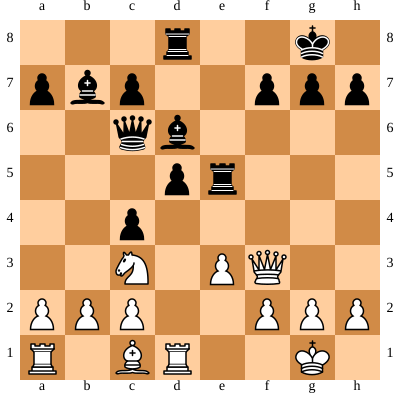



WHITE Turn
Move in UCI format: a1b1
Nodes per depth: {1: 36, 2: 561, 3: 17450, 4: 5438, 5: 12412, 6: 11223, 7: 16046, 8: 10469, 9: 12433, 10: 10987, 11: 11013, 12: 9402, 13: 7765, 14: 5836, 15: 5425, 16: 3772, 17: 3985, 18: 2358, 19: 1928, 20: 776, 21: 326, 22: 104, 23: 30, 24: 2}
Time taken by Move: 20.345374584197998


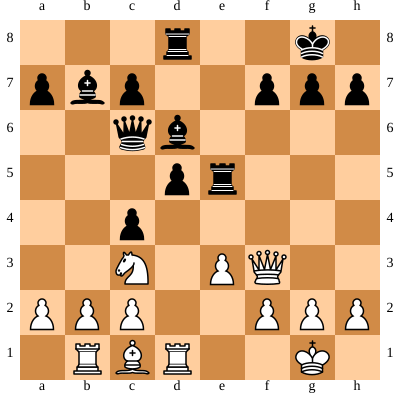



BLACK Turn
Move in UCI format: c6c5
Nodes per depth: {1: 40, 2: 652, 3: 23180, 4: 6077, 5: 8164, 6: 16254, 7: 10615, 8: 8904, 9: 6093, 10: 4625, 11: 4005, 12: 3571, 13: 2656, 14: 2258, 15: 1459, 16: 1363, 17: 754, 18: 548, 19: 292, 20: 97, 21: 26}
Time taken by Move: 12.373976230621338


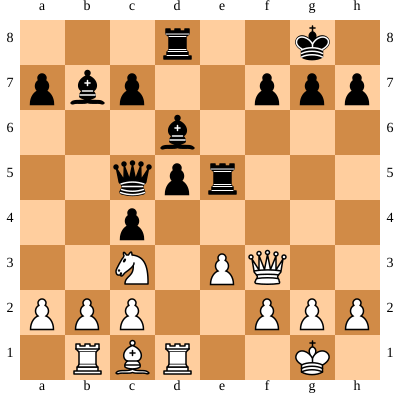



WHITE Turn
Move in UCI format: c3e2
Nodes per depth: {1: 35, 2: 473, 3: 17606, 4: 4780, 5: 10192, 6: 9708, 7: 16729, 8: 11661, 9: 15511, 10: 15819, 11: 17224, 12: 15211, 13: 13048, 14: 11805, 15: 9533, 16: 8278, 17: 5985, 18: 4542, 19: 2754, 20: 1535, 21: 765, 22: 421, 23: 149, 24: 44, 25: 16, 26: 2}
Time taken by Move: 25.71383500099182


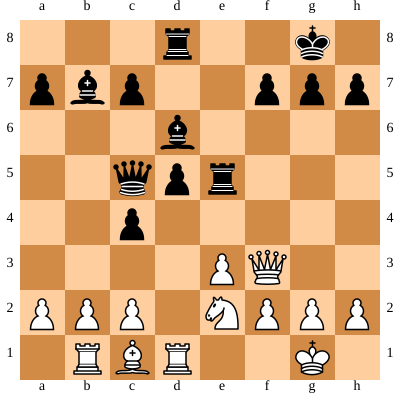



BLACK Turn
Move in UCI format: c5b6
Nodes per depth: {1: 41, 2: 460, 3: 16406, 4: 4470, 5: 6289, 6: 9919, 7: 6481, 8: 8592, 9: 8044, 10: 7550, 11: 7989, 12: 7889, 13: 7493, 14: 6340, 15: 5428, 16: 3995, 17: 3126, 18: 1868, 19: 1121, 20: 633, 21: 346, 22: 128, 23: 27, 24: 10}
Time taken by Move: 14.951549053192139


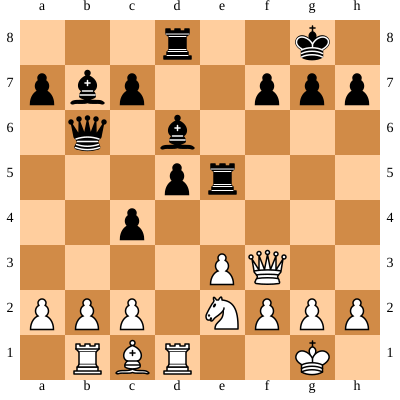



WHITE Turn
Move in UCI format: e2d4
Nodes per depth: {1: 34, 2: 407, 3: 13964, 4: 5601, 5: 9902, 6: 13294, 7: 21137, 8: 23584, 9: 32120, 10: 43331, 11: 48925, 12: 57766, 13: 62976, 14: 66998, 15: 66704, 16: 58456, 17: 54351, 18: 37647, 19: 30337, 20: 15972, 21: 9162, 22: 3179, 23: 1224, 24: 244, 25: 37}
Time taken by Move: 95.54472303390503


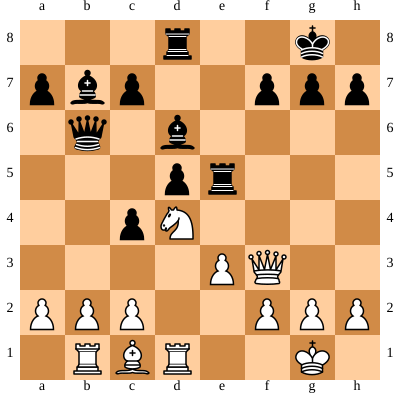



BLACK Turn
Move in UCI format: d6c5
Nodes per depth: {1: 45, 2: 640, 3: 23456, 4: 6745, 5: 12670, 6: 18556, 7: 18033, 8: 27617, 9: 36403, 10: 50868, 11: 57294, 12: 67019, 13: 70891, 14: 69838, 15: 58568, 16: 49612, 17: 31597, 18: 21621, 19: 10588, 20: 4411, 21: 1615, 22: 408, 23: 79, 24: 1}
Time taken by Move: 87.55811929702759


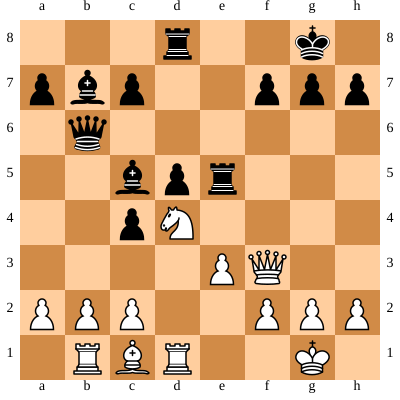



WHITE Turn
Move in UCI format: f3f4
Nodes per depth: {1: 35, 2: 642, 3: 18964, 4: 6400, 5: 10664, 6: 13926, 7: 20532, 8: 23624, 9: 35833, 10: 40340, 11: 55019, 12: 58480, 13: 74324, 14: 71168, 15: 79125, 16: 64878, 17: 63186, 18: 37242, 19: 28234, 20: 11029, 21: 5901, 22: 1518, 23: 438, 24: 137, 25: 5}
Time taken by Move: 99.75907588005066


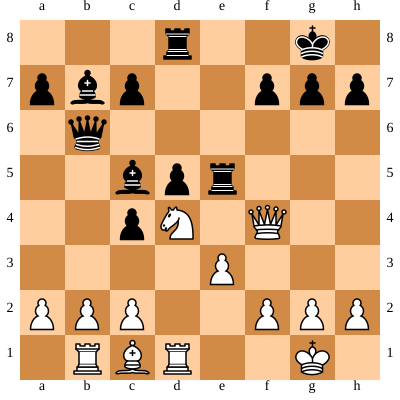



BLACK Turn
Move in UCI format: e5e4
Nodes per depth: {1: 49, 2: 493, 3: 19002, 4: 4904, 5: 7799, 6: 7679, 7: 7054, 8: 10456, 9: 11687, 10: 17630, 11: 21125, 12: 26905, 13: 29262, 14: 30941, 15: 27492, 16: 27855, 17: 21079, 18: 18535, 19: 11398, 20: 7290, 21: 2990, 22: 1103, 23: 236, 24: 11, 25: 4}
Time taken by Move: 42.24624013900757


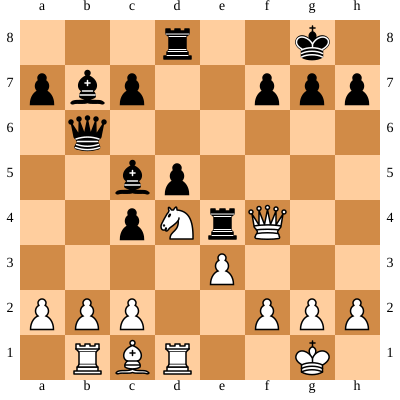



WHITE Turn
Move in UCI format: f4g5
Nodes per depth: {1: 38, 2: 256, 3: 11172, 4: 3540, 5: 6278, 6: 9077, 7: 14494, 8: 16295, 9: 23961, 10: 25737, 11: 32603, 12: 31894, 13: 40848, 14: 36183, 15: 36771, 16: 27608, 17: 23495, 18: 13586, 19: 9826, 20: 4123, 21: 2046, 22: 659, 23: 195, 24: 45}
Time taken by Move: 51.46633982658386


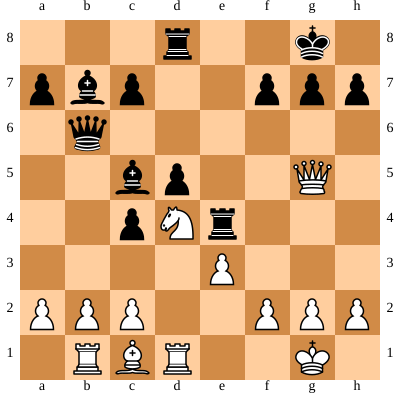



BLACK Turn
Move in UCI format: e4e8
Nodes per depth: {1: 49, 2: 358, 3: 9456, 4: 2008, 5: 2724, 6: 3384, 7: 3634, 8: 5767, 9: 7726, 10: 9455, 11: 12190, 12: 13883, 13: 16360, 14: 15983, 15: 14722, 16: 15032, 17: 12068, 18: 13132, 19: 7734, 20: 7660, 21: 2031, 22: 1336, 23: 135, 24: 27}
Time taken by Move: 24.2220458984375


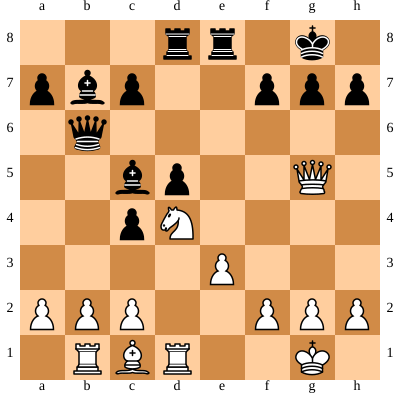



WHITE Turn
Move in UCI format: d4f5
Nodes per depth: {1: 41, 2: 767, 3: 21974, 4: 8151, 5: 14736, 6: 18232, 7: 27848, 8: 27638, 9: 42499, 10: 42087, 11: 61655, 12: 62264, 13: 85839, 14: 74480, 15: 86251, 16: 65510, 17: 65794, 18: 38018, 19: 30312, 20: 11545, 21: 6391, 22: 1514, 23: 382, 24: 94}
Time taken by Move: 108.87090849876404


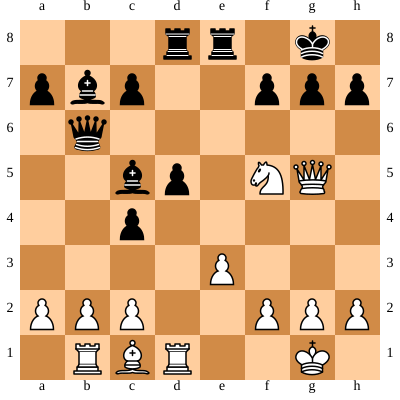



BLACK Turn
Move in UCI format: b6g6
Nodes per depth: {1: 45, 2: 260, 3: 6380, 4: 3005, 5: 4351, 6: 7012, 7: 6238, 8: 8819, 9: 7451, 10: 9517, 11: 9429, 12: 10580, 13: 10087, 14: 10025, 15: 8204, 16: 7098, 17: 4931, 18: 3798, 19: 1967, 20: 1113, 21: 393, 22: 116, 23: 17, 24: 6}
Time taken by Move: 17.896220922470093


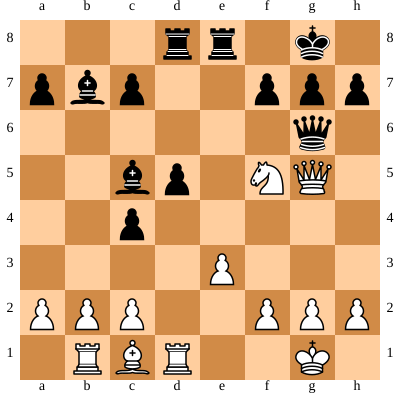



WHITE Turn
Move in UCI format: e3e4
Nodes per depth: {1: 39, 2: 348, 3: 10620, 4: 2689, 5: 4516, 6: 4172, 7: 5967, 8: 4218, 9: 4811, 10: 4797, 11: 4366, 12: 4098, 13: 3744, 14: 3056, 15: 2605, 16: 2192, 17: 1626, 18: 1101, 19: 564, 20: 260, 21: 101, 22: 32, 23: 6}
Time taken by Move: 8.406584739685059


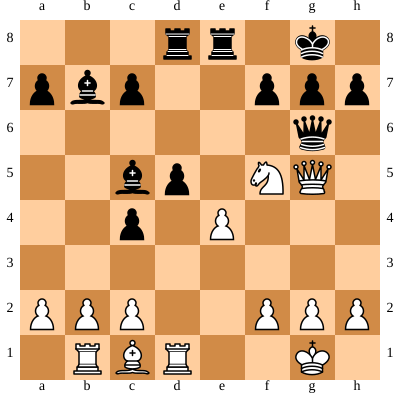



BLACK Turn
Move in UCI format: d5d4
Nodes per depth: {1: 44, 2: 456, 3: 13020, 4: 6378, 5: 12739, 6: 17388, 7: 19814, 8: 21868, 9: 23967, 10: 18929, 11: 21825, 12: 13243, 13: 14636, 14: 8342, 15: 7346, 16: 4977, 17: 3897, 18: 2901, 19: 1869, 20: 1250, 21: 599, 22: 232, 23: 26, 24: 7}
Time taken by Move: 30.193674087524414


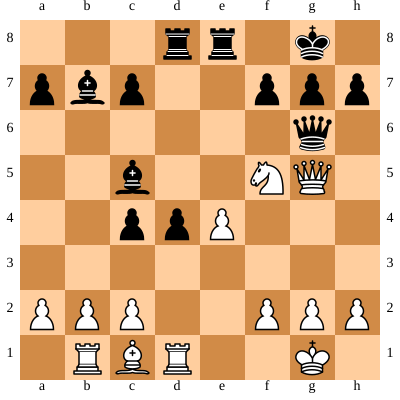



WHITE Turn
Move in UCI format: e4e5
Nodes per depth: {1: 43, 2: 719, 3: 19486, 4: 6828, 5: 15030, 6: 15597, 7: 26387, 8: 20619, 9: 22637, 10: 19313, 11: 18460, 12: 17757, 13: 18103, 14: 16307, 15: 15347, 16: 11099, 17: 10759, 18: 5787, 19: 4503, 20: 1573, 21: 585, 22: 115, 23: 3}
Time taken by Move: 36.29898190498352


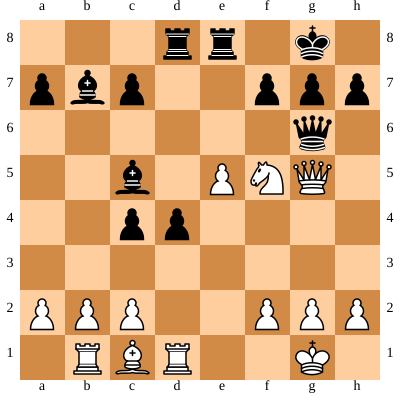



BLACK Turn
Move in UCI format: b7e4
Nodes per depth: {1: 44, 2: 390, 3: 13200, 4: 5804, 5: 10928, 6: 14524, 7: 15469, 8: 15373, 9: 18478, 10: 13930, 11: 17507, 12: 13692, 13: 17597, 14: 14766, 15: 15889, 16: 14168, 17: 11193, 18: 9148, 19: 4753, 20: 2417, 21: 889, 22: 250, 23: 42, 24: 4}
Time taken by Move: 32.09732127189636


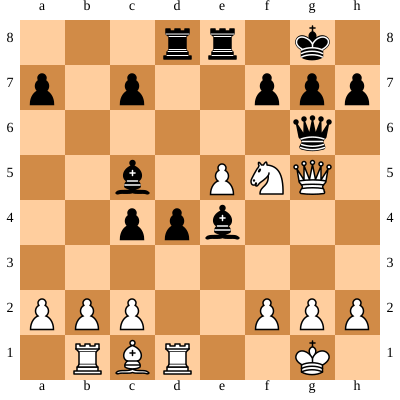



WHITE Turn
Move in UCI format: g2g4
Nodes per depth: {1: 43, 2: 804, 3: 21090, 4: 10841, 5: 25022, 6: 29134, 7: 49659, 8: 52992, 9: 60343, 10: 76682, 11: 82131, 12: 113635, 13: 113081, 14: 143668, 15: 132131, 16: 118796, 17: 99444, 18: 66726, 19: 42531, 20: 18662, 21: 7793, 22: 2641, 23: 522, 24: 99, 25: 5}
Time taken by Move: 178.89073300361633


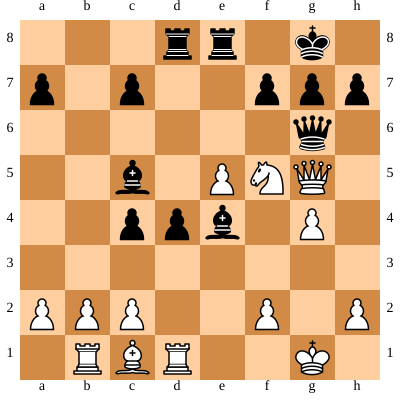



BLACK Turn
Move in UCI format: e4c2
Nodes per depth: {1: 46, 2: 301, 3: 11612, 4: 4461, 5: 8153, 6: 10968, 7: 14055, 8: 13195, 9: 16211, 10: 11907, 11: 16347, 12: 9767, 13: 13896, 14: 7378, 15: 8784, 16: 5090, 17: 5191, 18: 3311, 19: 2683, 20: 1174, 21: 692, 22: 170, 23: 51, 24: 10}
Time taken by Move: 22.6442711353302


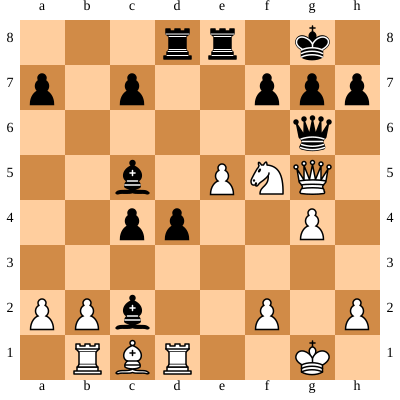



WHITE Turn
Move in UCI format: c1f4
Nodes per depth: {1: 39, 2: 782, 3: 18042, 4: 13437, 5: 31792, 6: 36585, 7: 60168, 8: 58004, 9: 79180, 10: 78909, 11: 92776, 12: 97447, 13: 97643, 14: 93714, 15: 77932, 16: 63563, 17: 49171, 18: 36206, 19: 23280, 20: 13180, 21: 6948, 22: 2757, 23: 801, 24: 286, 25: 8}
Time taken by Move: 143.85964131355286


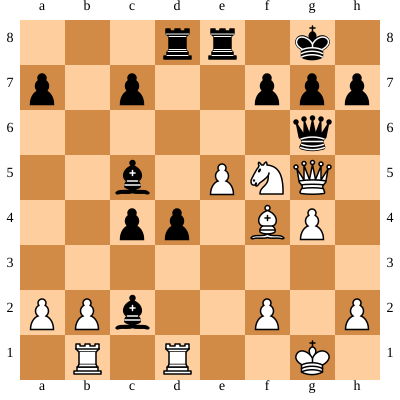



BLACK Turn
Move in UCI format: g6g5
Nodes per depth: {1: 43, 2: 286, 3: 10058, 4: 5207, 5: 9958, 6: 16035, 7: 20059, 8: 25140, 9: 27565, 10: 28907, 11: 29822, 12: 26480, 13: 24508, 14: 16118, 15: 13345, 16: 8226, 17: 6324, 18: 5114, 19: 3691, 20: 2718, 21: 1630, 22: 754, 23: 227, 24: 56}
Time taken by Move: 37.80985760688782


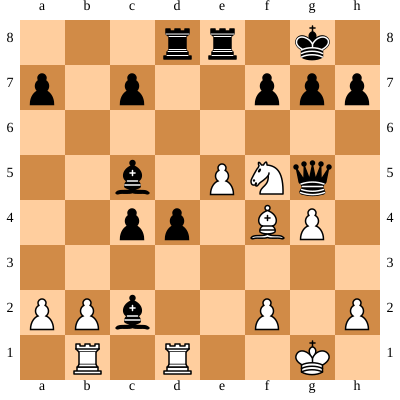



WHITE Turn
Move in UCI format: f4g5
Nodes per depth: {1: 32, 2: 287, 3: 8186, 4: 2231, 5: 2849, 6: 5037, 7: 4511, 8: 5646, 9: 4101, 10: 4666, 11: 2164, 12: 2311, 13: 925, 14: 980, 15: 540, 16: 522, 17: 451, 18: 347, 19: 169, 20: 90, 21: 53}
Time taken by Move: 5.850546360015869


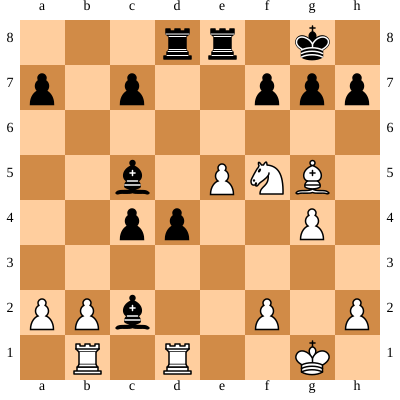



BLACK Turn
Move in UCI format: d8b8
Nodes per depth: {1: 34, 2: 266, 3: 9624, 4: 2794, 5: 4158, 6: 5184, 7: 6832, 8: 8062, 9: 8871, 10: 7158, 11: 6897, 12: 4055, 13: 3351, 14: 1951, 15: 1454, 16: 1207, 17: 1047, 18: 700, 19: 524, 20: 311, 21: 91, 22: 21, 23: 1}
Time taken by Move: 9.95859408378601


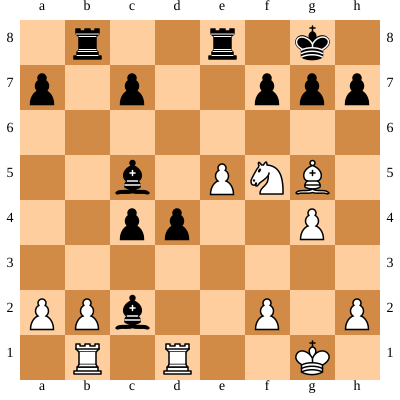



WHITE Turn
Move in UCI format: f5g7
Nodes per depth: {1: 37, 2: 662, 3: 16632, 4: 19932, 5: 37698, 6: 53387, 7: 81083, 8: 124275, 9: 152717, 10: 226781, 11: 213886, 12: 278525, 13: 208893, 14: 216743, 15: 169556, 16: 142318, 17: 116517, 18: 70800, 19: 46771, 20: 16931, 21: 6673, 22: 828, 23: 52}
Time taken by Move: 310.3744604587555


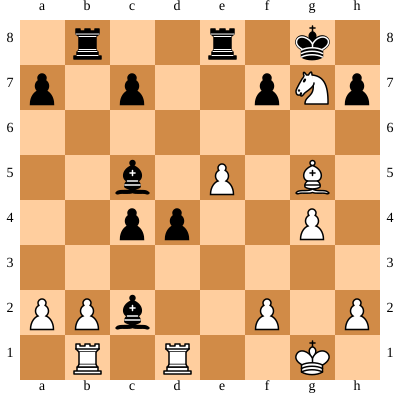



BLACK Turn
Move in UCI format: g8g7
Nodes per depth: {1: 41, 2: 112, 3: 4144, 4: 294, 5: 583, 6: 614, 7: 902, 8: 892, 9: 1289, 10: 759, 11: 1002, 12: 546, 13: 571, 14: 405, 15: 451, 16: 402, 17: 426, 18: 260, 19: 203, 20: 49, 21: 6}
Time taken by Move: 1.686781644821167


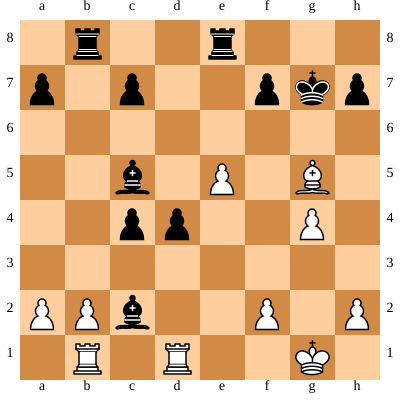



WHITE Turn
Move in UCI format: g5f6
Nodes per depth: {1: 29, 2: 582, 3: 9930, 4: 6674, 5: 7196, 6: 8516, 7: 8287, 8: 11092, 9: 8587, 10: 11143, 11: 6949, 12: 7186, 13: 3684, 14: 2729, 15: 1929, 16: 1664, 17: 1064, 18: 424, 19: 201}
Time taken by Move: 13.655229568481445


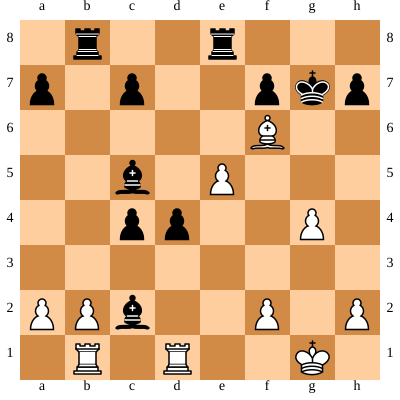



BLACK Turn
Move in UCI format: g7g8
Nodes per depth: {1: 4, 2: 66, 3: 3856, 4: 404, 5: 864, 6: 898, 7: 1599, 8: 1529, 9: 2803, 10: 1569, 11: 1936, 12: 843, 13: 805, 14: 620, 15: 495, 16: 319, 17: 166, 18: 49, 19: 10}
Time taken by Move: 2.405022621154785


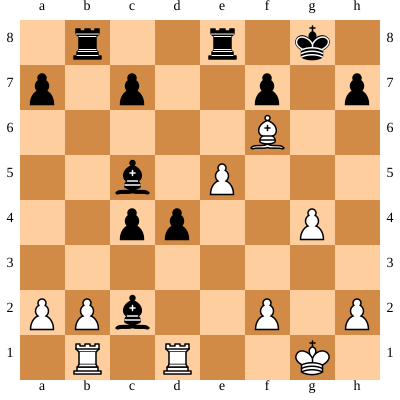



WHITE Turn
Move in UCI format: d1f1
Nodes per depth: {1: 27, 2: 551, 3: 12326, 4: 14175, 5: 13153, 6: 18323, 7: 17357, 8: 28028, 9: 23517, 10: 34354, 11: 20928, 12: 23084, 13: 11410, 14: 9408, 15: 5908, 16: 4184, 17: 2462, 18: 905, 19: 458, 20: 23, 21: 5}
Time taken by Move: 34.71732044219971


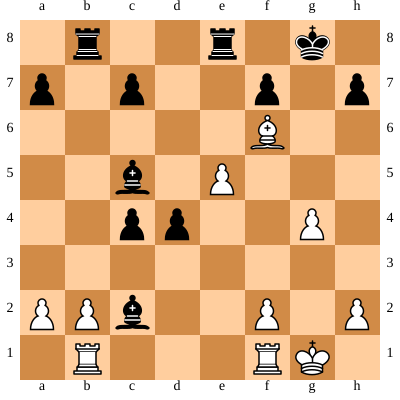



BLACK Turn
Move in UCI format: c2b1
Nodes per depth: {1: 37, 2: 409, 3: 24380, 4: 1250, 5: 2062, 6: 1233, 7: 1937, 8: 868, 9: 1397, 10: 670, 11: 780, 12: 338, 13: 324, 14: 199, 15: 173, 16: 78, 17: 15, 18: 9}
Time taken by Move: 2.892505645751953


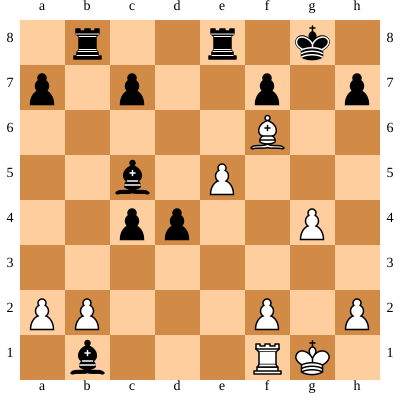



WHITE Turn
Move in UCI format: f1b1
Nodes per depth: {1: 22, 2: 395, 3: 7694, 4: 4726, 5: 4370, 6: 8327, 7: 2748, 8: 4299, 9: 1806, 10: 2375, 11: 1333, 12: 1690, 13: 1155, 14: 1073, 15: 456, 16: 230, 17: 55}
Time taken by Move: 5.463145732879639


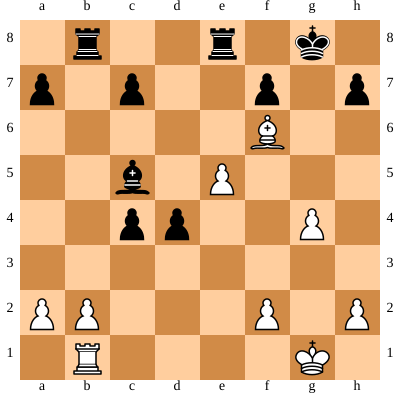



BLACK Turn
Move in UCI format: c4c3
Nodes per depth: {1: 29, 2: 370, 3: 12402, 4: 823, 5: 1473, 6: 352, 7: 565, 8: 152, 9: 212, 10: 136, 11: 140, 12: 119, 13: 103, 14: 77, 15: 15, 16: 6}
Time taken by Move: 1.2944557666778564


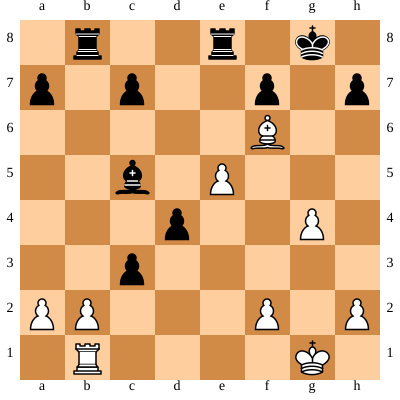



WHITE Turn
Move in UCI format: b2b3
Nodes per depth: {1: 25, 2: 515, 3: 12052, 4: 9604, 5: 7907, 6: 11371, 7: 3026, 8: 4151, 9: 1888, 10: 1896, 11: 549, 12: 450, 13: 247, 14: 176, 15: 74, 16: 28, 17: 5}
Time taken by Move: 6.896585941314697


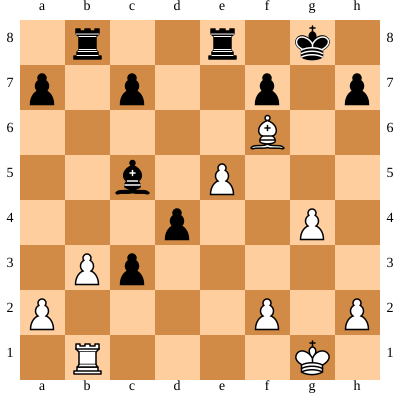



BLACK Turn
Move in UCI format: c3c2
Nodes per depth: {1: 28, 2: 360, 3: 14054, 4: 1032, 5: 1686, 6: 300, 7: 336, 8: 177, 9: 149, 10: 69, 11: 45, 12: 6, 13: 4}
Time taken by Move: 1.327439308166504


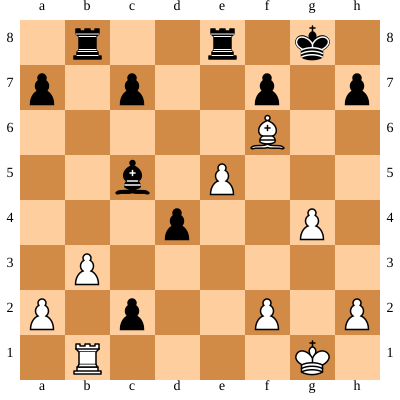



WHITE Turn
Move in UCI format: b1e1
Nodes per depth: {1: 24, 2: 407, 3: 8826, 4: 9040, 5: 2126, 6: 2797, 7: 1151, 8: 1202, 9: 641, 10: 696, 11: 327, 12: 290, 13: 206, 14: 130, 15: 66, 16: 23}
Time taken by Move: 3.3577351570129395


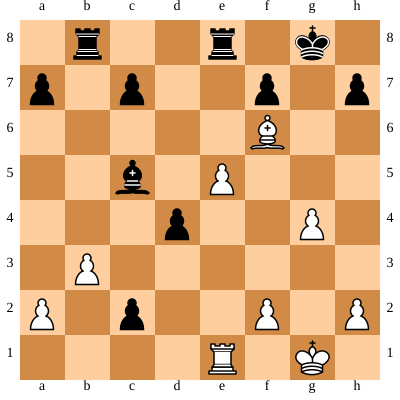



BLACK Turn
Move in UCI format: c5b4
Nodes per depth: {1: 31, 2: 421, 3: 13556, 4: 2708, 5: 5160, 6: 1546, 7: 1994, 8: 674, 9: 762, 10: 342, 11: 400, 12: 235, 13: 155, 14: 96, 15: 16}
Time taken by Move: 2.8686721324920654


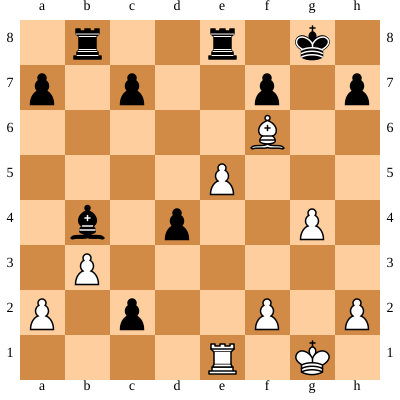



WHITE Turn
Move in UCI format: e1f1
Nodes per depth: {1: 25, 2: 469, 3: 9814, 4: 5584, 5: 3049, 6: 2975, 7: 1632, 8: 1729, 9: 1177, 10: 838, 11: 250, 12: 128, 13: 136, 14: 128, 15: 98, 16: 40}
Time taken by Move: 3.3744678497314453


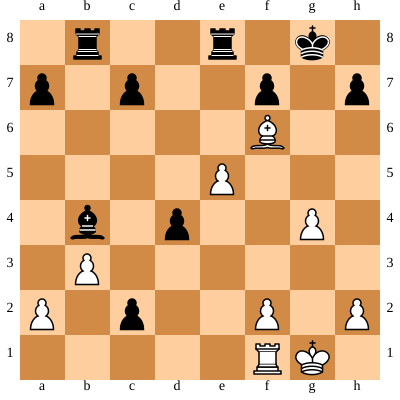



BLACK Turn
Move in UCI format: b4d2
Nodes per depth: {1: 33, 2: 331, 3: 12936, 4: 1642, 5: 2917, 6: 612, 7: 719, 8: 233, 9: 208, 10: 77, 11: 29, 12: 18, 13: 5, 14: 4}
Time taken by Move: 1.7009937763214111


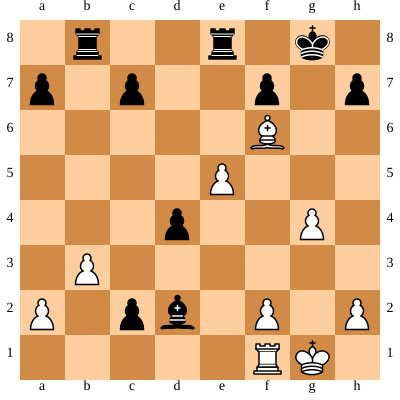



WHITE Turn
Move in UCI format: e5e6
Nodes per depth: {1: 22, 2: 658, 3: 11934, 4: 8925, 5: 5328, 6: 7901, 7: 3289, 8: 3084, 9: 1963, 10: 1462, 11: 970, 12: 578, 13: 401, 14: 192, 15: 79, 16: 36}
Time taken by Move: 6.125516176223755


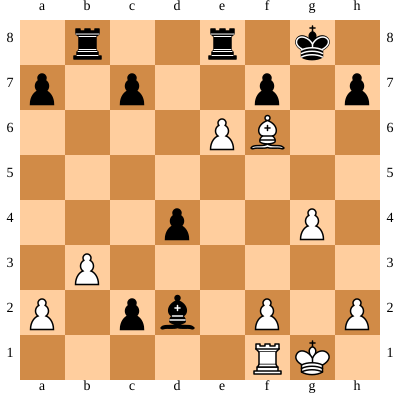



BLACK Turn
Move in UCI format: e8e6
Nodes per depth: {1: 35, 2: 184, 3: 8282, 4: 2385, 5: 5405, 6: 3633, 7: 5626, 8: 2915, 9: 2829, 10: 1270, 11: 757, 12: 382, 13: 262, 14: 163, 15: 44, 16: 4}
Time taken by Move: 4.437796354293823


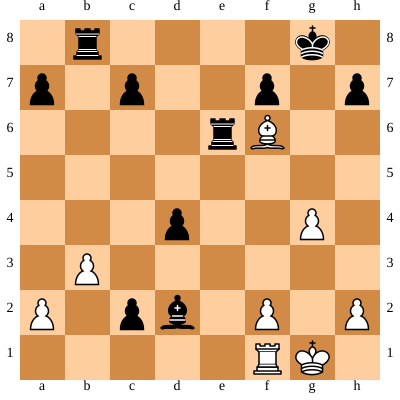



WHITE Turn
Move in UCI format: f6d4
Nodes per depth: {1: 23, 2: 431, 3: 8484, 4: 3673, 5: 2159, 6: 1925, 7: 1102, 8: 800, 9: 538, 10: 385, 11: 306, 12: 225, 13: 154, 14: 45, 15: 5}
Time taken by Move: 2.5397660732269287


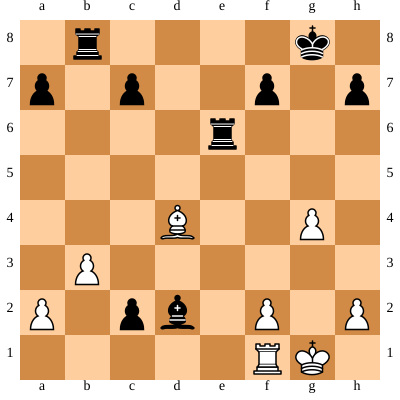



BLACK Turn
Move in UCI format: c2c1q
Nodes per depth: {1: 46, 2: 336, 3: 19878, 4: 1817, 5: 2980, 6: 1137, 7: 1087, 8: 292, 9: 217, 10: 100, 11: 73, 12: 37, 13: 11, 14: 5}
Time taken by Move: 2.2424399852752686


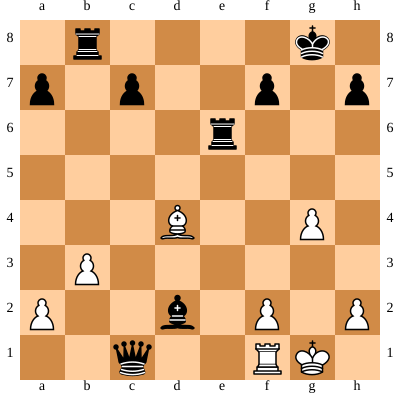



WHITE Turn
Move in UCI format: f1c1
Nodes per depth: {1: 24, 2: 482, 3: 11836, 4: 3182, 5: 2045, 6: 3154, 7: 841, 8: 708, 9: 379, 10: 262, 11: 189, 12: 103, 13: 71, 14: 11, 15: 2}
Time taken by Move: 2.4791078567504883


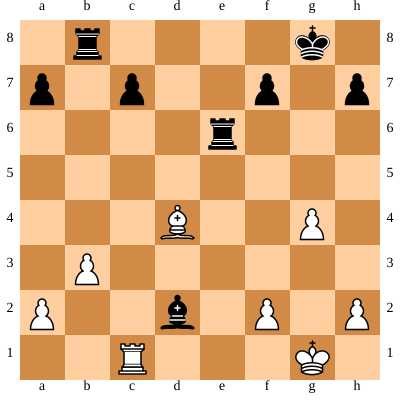



BLACK Turn
Move in UCI format: d2c1
Nodes per depth: {1: 42, 2: 429, 3: 19962, 4: 2656, 5: 2604, 6: 1769, 7: 997, 8: 709, 9: 592, 10: 425, 11: 257, 12: 149, 13: 42, 14: 5}
Time taken by Move: 2.6269707679748535


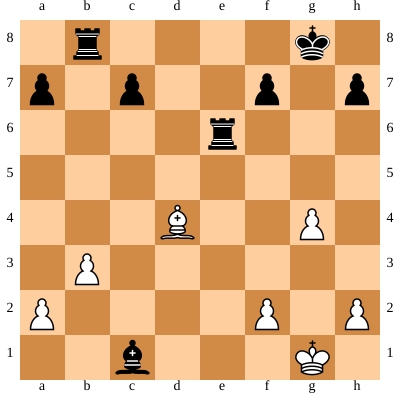



WHITE Turn
Move in UCI format: d4a7
Nodes per depth: {1: 22, 2: 321, 3: 5352, 4: 812, 5: 356, 6: 161, 7: 11, 8: 1}
Time taken by Move: 0.5815427303314209


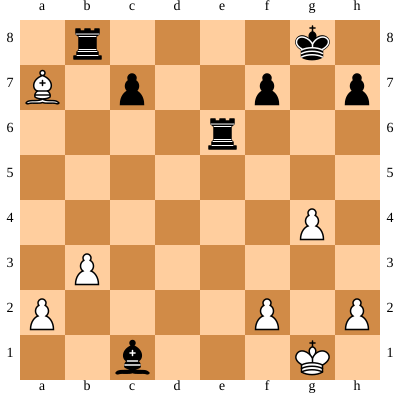



BLACK Turn
Move in UCI format: b8a8
Nodes per depth: {1: 40, 2: 127, 3: 4348, 4: 97, 5: 57, 6: 15, 7: 3}
Time taken by Move: 0.2977442741394043


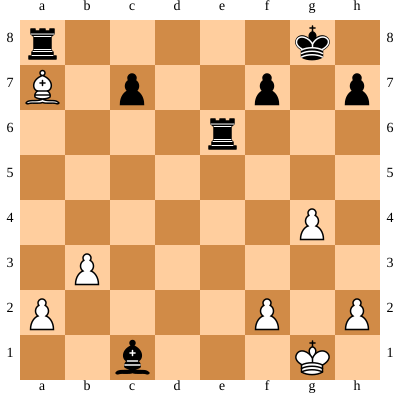



WHITE Turn
Move in UCI format: a7d4
Nodes per depth: {1: 16, 2: 263, 3: 4248, 4: 1692, 5: 444, 6: 429, 7: 79, 8: 33}
Time taken by Move: 0.779592752456665


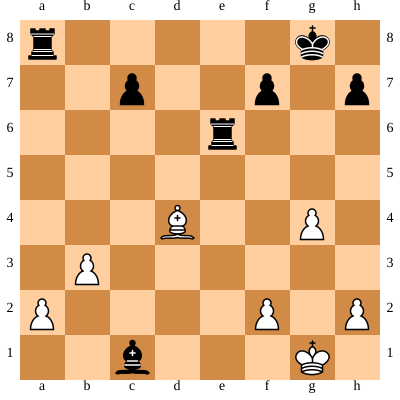



BLACK Turn
Move in UCI format: a8a2
Nodes per depth: {1: 39, 2: 372, 3: 15256, 4: 242, 5: 249, 6: 17, 7: 5}
Time taken by Move: 0.8515303134918213


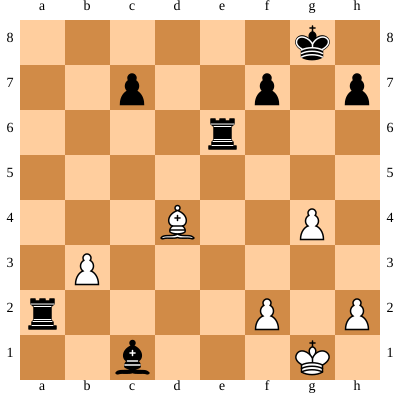



WHITE Turn
Move in UCI format: d4c5
Nodes per depth: {1: 20, 2: 328, 3: 4802, 4: 1763, 5: 645, 6: 493, 7: 70, 8: 27}
Time taken by Move: 0.804875373840332


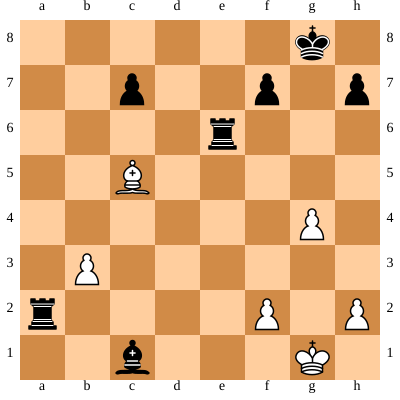



BLACK Turn
Move in UCI format: e6e1
Nodes per depth: {1: 40, 2: 299, 3: 13120, 4: 436, 5: 460, 6: 103, 7: 43, 8: 1, 9: 1}
Time taken by Move: 0.839583158493042


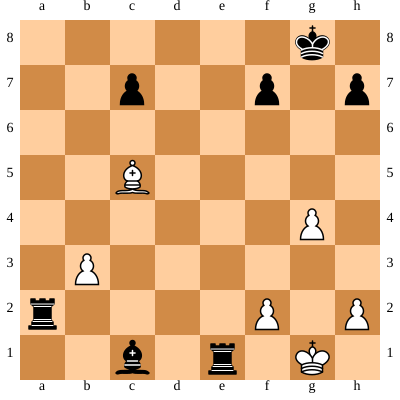



WHITE Turn
Move in UCI format: g1g2
Nodes per depth: {1: 1, 2: 37, 3: 638, 4: 363, 5: 143, 6: 120, 7: 4}
Time taken by Move: 0.20713448524475098


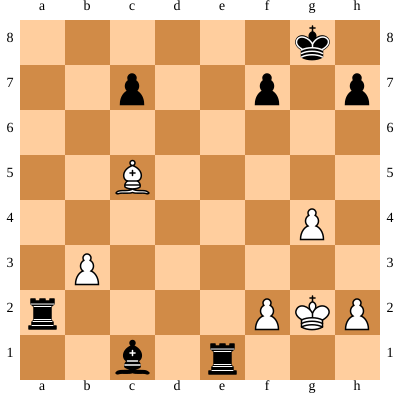



BLACK Turn
Move in UCI format: c1f4
Nodes per depth: {1: 37, 2: 300, 3: 12862, 4: 414, 5: 439, 6: 36, 7: 6}
Time taken by Move: 0.8720920085906982


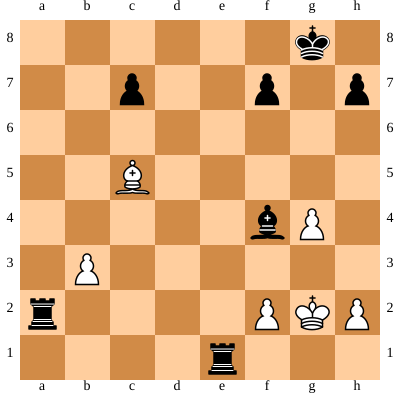



WHITE Turn
Move in UCI format: b3b4
Nodes per depth: {1: 15, 2: 309, 3: 4094, 4: 2364, 5: 1243, 6: 1589, 7: 128, 8: 64}
Time taken by Move: 1.1405847072601318


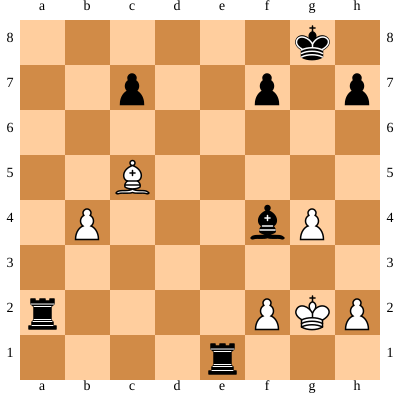



BLACK Turn
Move in UCI format: a2b2
Nodes per depth: {1: 42, 2: 279, 3: 13690, 4: 542, 5: 914, 6: 117, 7: 96, 8: 6, 9: 2}
Time taken by Move: 0.9644570350646973


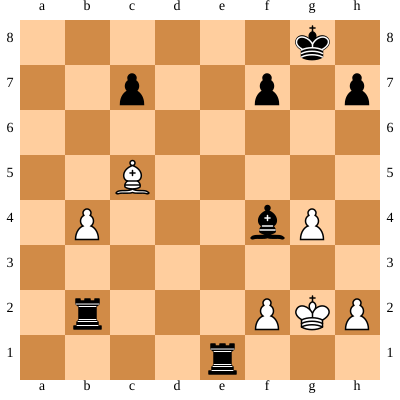



WHITE Turn
Move in UCI format: h2h3
Nodes per depth: {1: 13, 2: 237, 3: 2754, 4: 2044, 5: 1165, 6: 1497, 7: 124, 8: 58, 9: 3}
Time taken by Move: 0.9466147422790527


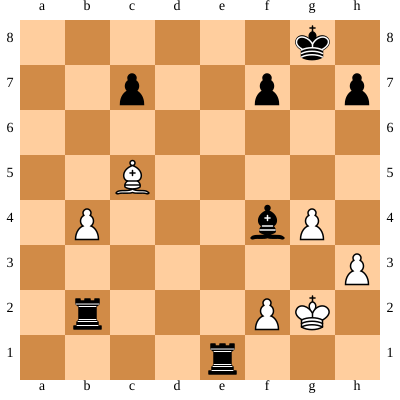



BLACK Turn
Move in UCI format: f4d2
Nodes per depth: {1: 38, 2: 227, 3: 10772, 4: 306, 5: 326, 6: 55, 7: 15, 8: 5}
Time taken by Move: 0.7029244899749756


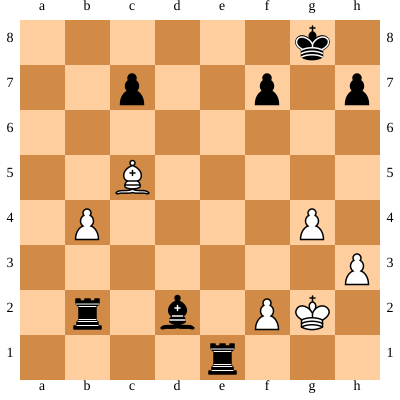



WHITE Turn
Move in UCI format: c5d4
Nodes per depth: {1: 15, 2: 222, 3: 2406, 4: 1486, 5: 674, 6: 694, 7: 168, 8: 50, 9: 1}
Time taken by Move: 0.6849813461303711


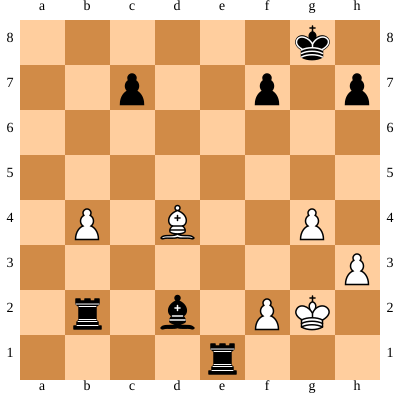



BLACK Turn
Move in UCI format: b2b4
Nodes per depth: {1: 33, 2: 201, 3: 8070, 4: 685, 5: 721, 6: 193, 7: 45, 8: 11, 9: 1}
Time taken by Move: 0.7080063819885254


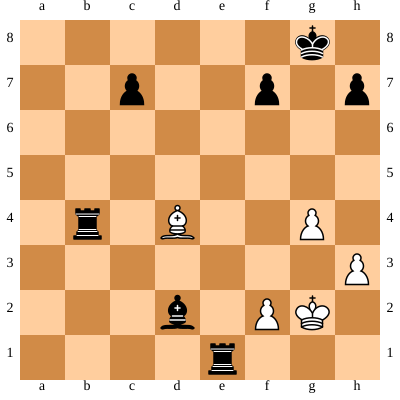



WHITE Turn
Move in UCI format: d4f6
Nodes per depth: {1: 18, 2: 228, 3: 3220, 4: 854, 5: 351, 6: 232, 7: 7, 8: 1}
Time taken by Move: 0.49048376083374023


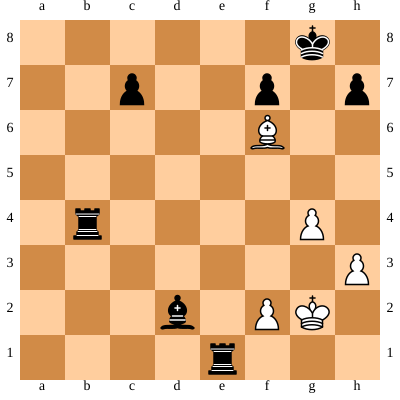



BLACK Turn
Move in UCI format: h7h6
Nodes per depth: {1: 38, 2: 354, 3: 14328, 4: 752, 5: 812, 6: 73, 7: 34}
Time taken by Move: 1.031818151473999


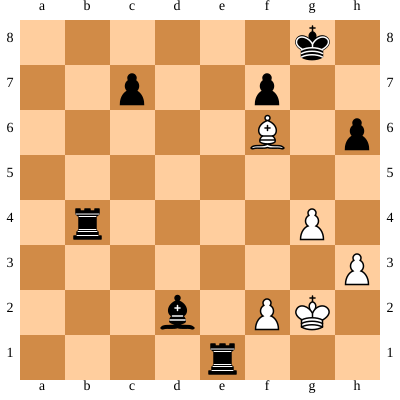



WHITE Turn
Move in UCI format: f6d8
Nodes per depth: {1: 18, 2: 238, 3: 3376, 4: 773, 5: 355, 6: 188, 7: 8}
Time taken by Move: 0.46948909759521484


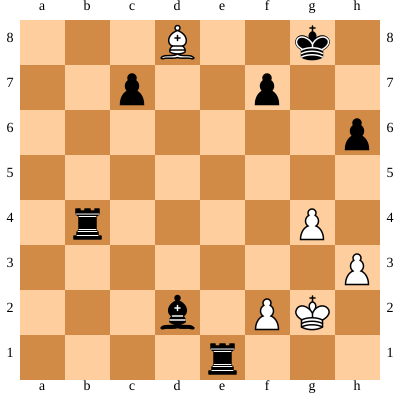



BLACK Turn
Move in UCI format: d2f4
Nodes per depth: {1: 41, 2: 114, 3: 6182, 4: 243, 5: 168, 6: 37, 7: 14, 8: 1}
Time taken by Move: 0.41567444801330566


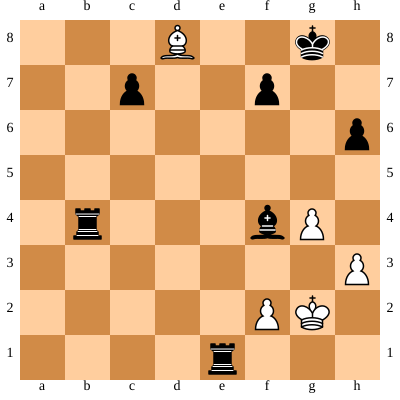



WHITE Turn
Move in UCI format: d8f6
Nodes per depth: {1: 9, 2: 148, 3: 1386, 4: 479, 5: 196, 6: 122, 7: 42, 8: 16}
Time taken by Move: 0.30707240104675293


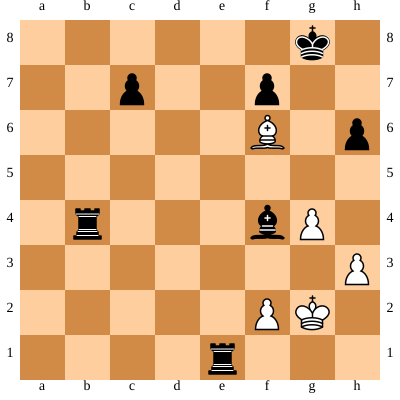



BLACK Turn
Move in UCI format: e1c1
Nodes per depth: {1: 38, 2: 308, 3: 12734, 4: 751, 5: 835, 6: 164, 7: 93, 8: 4, 9: 1}
Time taken by Move: 0.9773094654083252


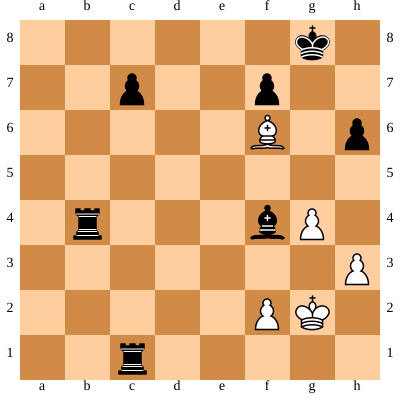



WHITE Turn
Move in UCI format: f6d8
Nodes per depth: {1: 15, 2: 197, 3: 2196, 4: 516, 5: 187, 6: 112, 7: 36, 8: 11, 9: 7}
Time taken by Move: 0.3330686092376709


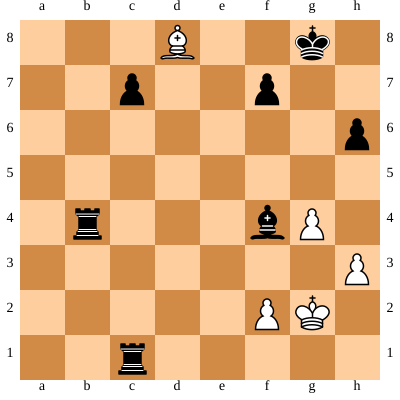



BLACK Turn
Move in UCI format: f4d6
Nodes per depth: {1: 39, 2: 87, 3: 4468, 4: 93, 5: 82, 6: 20, 7: 6}
Time taken by Move: 0.2957589626312256


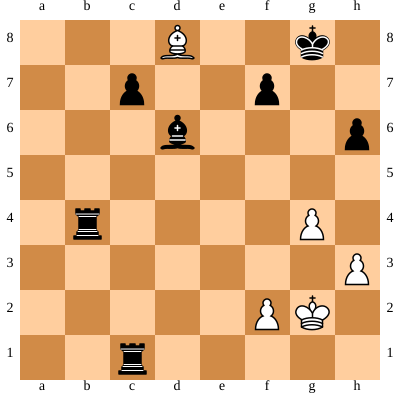



WHITE Turn
Move in UCI format: g4g5
Nodes per depth: {1: 10, 2: 205, 3: 1776, 4: 703, 5: 332, 6: 165, 7: 32, 8: 11, 9: 6}
Time taken by Move: 0.3974423408508301


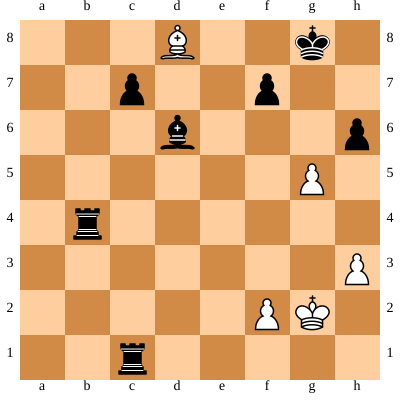



BLACK Turn
Move in UCI format: h6g5
Nodes per depth: {1: 43, 2: 180, 3: 10246, 4: 908, 5: 964, 6: 429, 7: 176, 8: 34, 9: 17}
Time taken by Move: 0.958850622177124


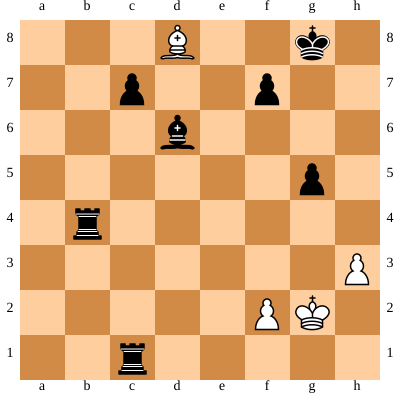



WHITE Turn
Move in UCI format: d8g5
Nodes per depth: {1: 8, 2: 171, 3: 1404, 4: 361, 5: 90, 6: 26, 7: 18}
Time taken by Move: 0.24524188041687012


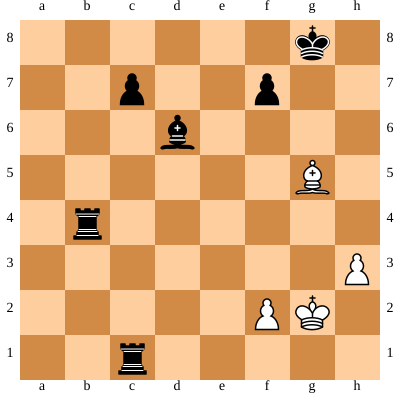



BLACK Turn
Move in UCI format: c1c2
Nodes per depth: {1: 41, 2: 279, 3: 12462, 4: 1557, 5: 1019, 6: 131, 7: 39}
Time taken by Move: 1.1270806789398193


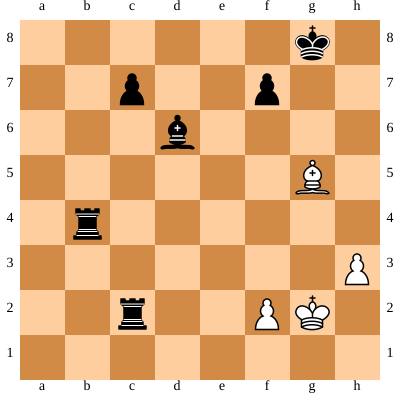



WHITE Turn
Move in UCI format: g5e3
Nodes per depth: {1: 14, 2: 217, 3: 2712, 4: 891, 5: 293, 6: 78, 7: 24, 8: 4}
Time taken by Move: 0.46421074867248535


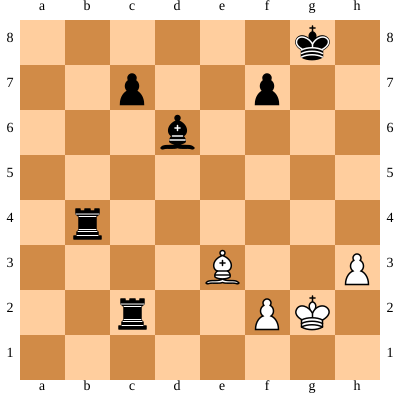



BLACK Turn
Move in UCI format: b4h4
Nodes per depth: {1: 39, 2: 282, 3: 12434, 4: 406, 5: 407, 6: 7, 7: 4}
Time taken by Move: 0.7875218391418457


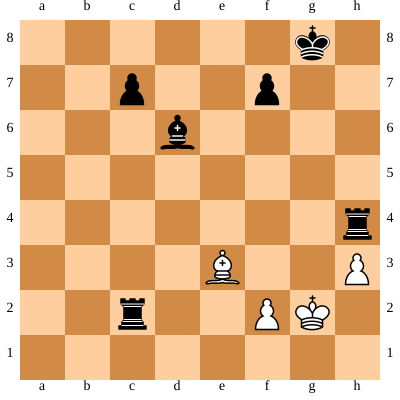



WHITE Turn
Move in UCI format: e3g5
Nodes per depth: {1: 13, 2: 194, 3: 2562, 4: 1042, 5: 563, 6: 706, 7: 207, 8: 122}
Time taken by Move: 0.6306977272033691


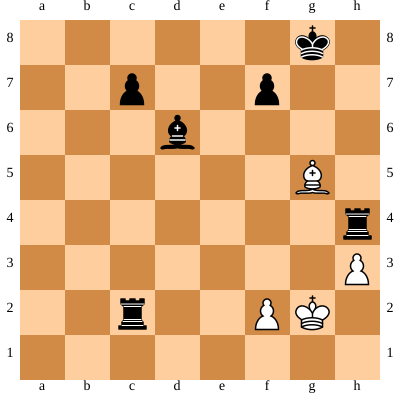



BLACK Turn
Move in UCI format: h4e4
Nodes per depth: {1: 39, 2: 223, 3: 8352, 4: 1057, 5: 1615, 6: 542, 7: 543, 8: 98, 9: 25}
Time taken by Move: 1.0083386898040771


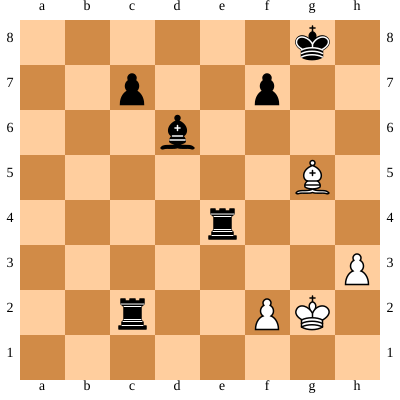



WHITE Turn
Move in UCI format: g2f1
Nodes per depth: {1: 14, 2: 321, 3: 3818, 4: 1835, 5: 763, 6: 329, 7: 58, 8: 9}
Time taken by Move: 0.8199965953826904


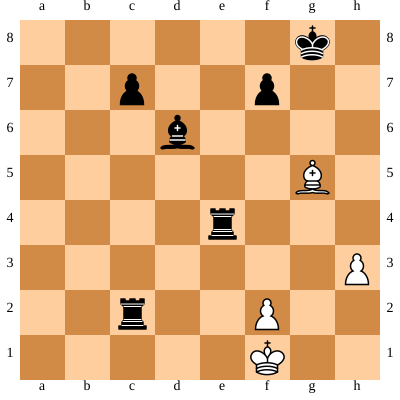



BLACK Turn
Move in UCI format: d6c5
Nodes per depth: {1: 41, 2: 180, 3: 8164, 4: 210, 5: 159, 6: 10, 7: 3}
Time taken by Move: 0.5295834541320801


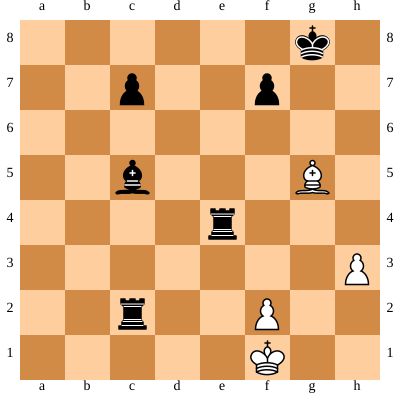



WHITE Turn
Move in UCI format: f2f3
Nodes per depth: {1: 14, 2: 290, 3: 3590, 4: 2089, 5: 589, 6: 494, 7: 153, 8: 15}
Time taken by Move: 0.836756706237793


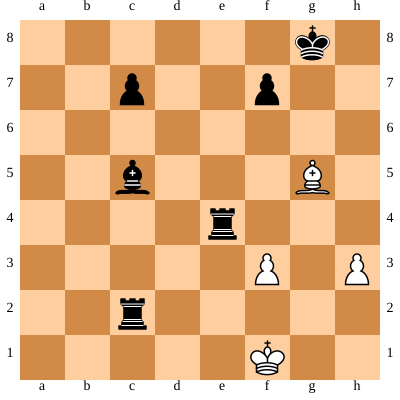



BLACK Turn
Move in UCI format: c2f2
Nodes per depth: {1: 42, 2: 274, 3: 11946, 4: 1969, 5: 1061, 6: 390, 7: 15}
Time taken by Move: 1.3426806926727295


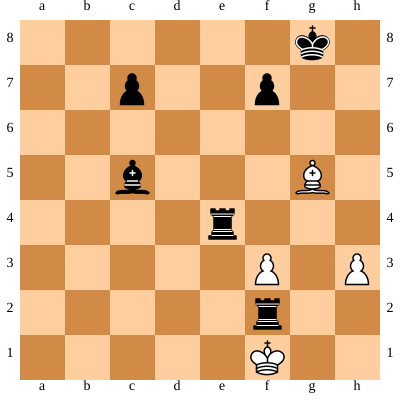



WHITE Turn
Move in UCI format: f1g1
Nodes per depth: {1: 1, 2: 39, 3: 434, 4: 227, 5: 97, 6: 72}
Time taken by Move: 0.14246630668640137


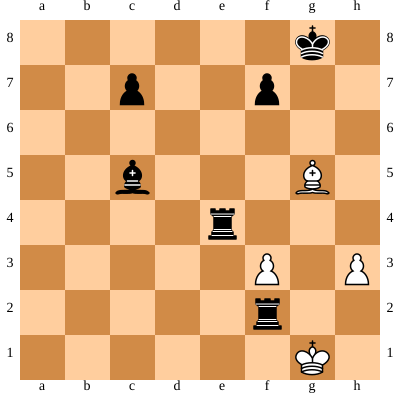



BLACK Turn
Move in UCI format: e4e1
Nodes per depth: {1: 39, 2: 225, 3: 10202, 4: 2653, 5: 1931, 6: 683, 7: 170}
Time taken by Move: 1.5077712535858154


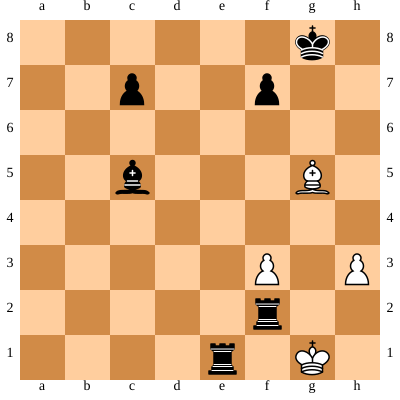



[Event "Example"]
[Site "Linz"]
[Date "2022-01-30"]
[Round "1"]
[White "MyChess"]
[Black "MyChess"]
[Result "0-1"]

1. Nf3 Nf6 2. Nc3 Nc6 3. e3 e6 4. d4 d5 5. Bb5 Bd6 6. Bxc6+ bxc6 7. Ne5 Bb7 8. Qf3 O-O 9. O-O Nd7 10. Nxd7 Qxd7 11. Rd1 c5 12. Rb1 Qc6 13. Ra1 Rfe8 14. Rd2 Rad8 15. Rd3 c4 16. Rd1 e5 17. dxe5 Rxe5 18. Rb1 Qc5 19. Ne2 Qb6 20. Nd4 Bc5 21. Qf4 Re4 22. Qg5 Ree8 23. Nf5 Qg6 24. e4 d4 25. e5 Be4 26. g4 Bxc2 27. Bf4 Qxg5 28. Bxg5 Rb8 29. Nxg7 Kxg7 30. Bf6+ Kg8 31. Rf1 Bxb1 32. Rxb1 c3 33. b3 c2 34. Re1 Bb4 35. Rf1 Bd2 36. e6 Rxe6 37. Bxd4 c1=Q 38. Rxc1 Bxc1 39. Bxa7 Ra8 40. Bd4 Rxa2 41. Bc5 Re1+ 42. Kg2 Bf4 43. b4 Rb2 44. h3 Bd2 45. Bd4 Rxb4 46. Bf6 h6 47. Bd8 Bf4 48. Bf6 Rc1 49. Bd8 Bd6 50. g5 hxg5 51. Bxg5 Rc2 52. Be3 Rh4 53. Bg5 Re4 54. Kf1 Bc5 55. f3 Rf2+ 56. Kg1 Re1# 0-1


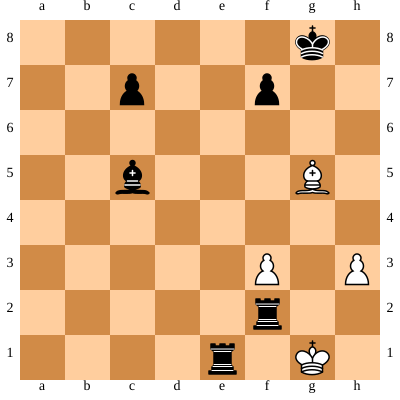

In [ ]:
import chess.pgn
import datetime
import time



movehistory =[]
game = chess.pgn.Game()
game.headers["Event"] = "Example"
game.headers["Site"] = "Linz"
game.headers["Date"] = str(datetime.datetime.now().date())
game.headers["Round"] = 1
game.headers["White"] = "MyChess"
game.headers["Black"] = "MyChess"
board = chess.Board()
while not board.is_game_over(claim_draw=True):
    start = time.time()
    nodes_per_depth = dict()
    if board.turn:
        
        print("WHITE Turn")
        move = selectmove(3,movehistory)
        board.push(move)       
    else:
        print("BLACK Turn")
        move = selectmove(3,movehistory)
        board.push(move)  
    end = time.time()
    print("Move in UCI format:", move)
    print("Nodes per depth:", nodes_per_depth)
    print("Time taken by Move:", end-start) 
    display(SVG(chess.svg.board(board, size=400)))  
    print("\n")

game.add_line(movehistory)
game.headers["Result"] = str(board.result(claim_draw=True))
print(game)
print(game, file=open("selftest.pgn", "w"), end="\n\n")

SVG(chess.svg.board(board=board,size=400))

### Quiescence vs Negamax_ab
In the following, quiescence search in confronting the alpha beta tuning

WHITE Turn
Move in UCI format: g1f3
Nodes per depth: {1: 20, 2: 63, 3: 1406, 4: 12}
Time taken by Move: 0.10809922218322754


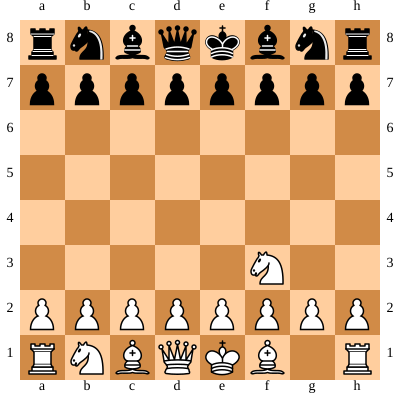



BLACK Turn
Move in UCI format: g8f6
Nodes per depth: {1: 20, 2: 93, 3: 938}
Time taken by Move: 0.14490628242492676


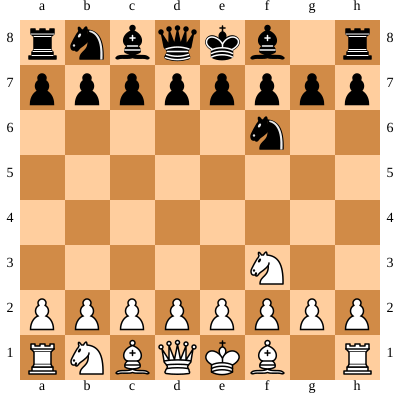



WHITE Turn
Move in UCI format: b1c3
Nodes per depth: {1: 22, 2: 97, 3: 2256, 4: 151, 5: 50, 6: 53, 7: 50, 8: 27, 9: 35, 10: 10, 11: 6, 12: 2, 13: 1, 14: 2, 15: 3, 16: 2, 17: 1}
Time taken by Move: 0.22078633308410645


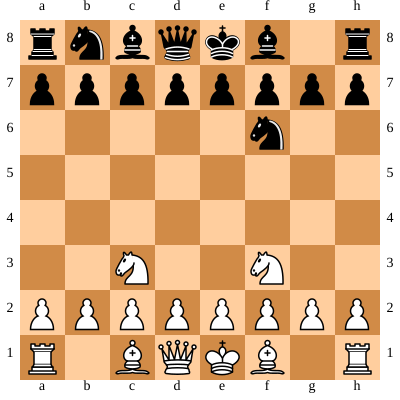



BLACK Turn
Move in UCI format: b8c6
Nodes per depth: {1: 22, 2: 119, 3: 1544}
Time taken by Move: 0.14506745338439941


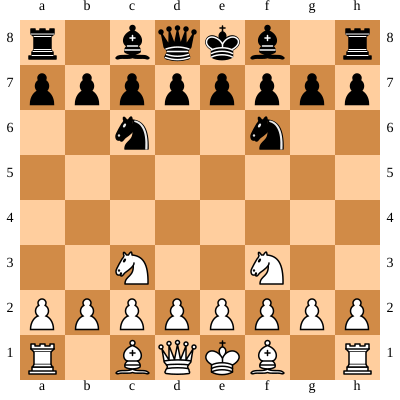



WHITE Turn
Move in UCI format: e2e3
Nodes per depth: {1: 24, 2: 342, 3: 9378, 4: 1157, 5: 1222, 6: 850, 7: 1014, 8: 930, 9: 848, 10: 706, 11: 569, 12: 382, 13: 266, 14: 184, 15: 118, 16: 83, 17: 63, 18: 34, 19: 22, 20: 6}
Time taken by Move: 1.6840455532073975


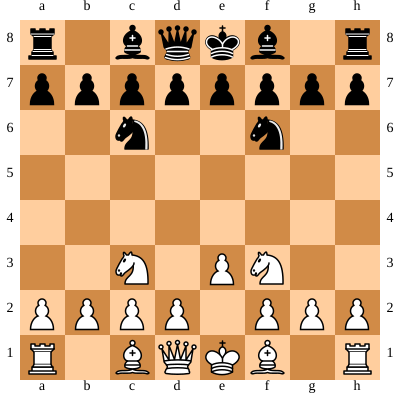



BLACK Turn
Move in UCI format: f6g4
Nodes per depth: {1: 24, 2: 150, 3: 2229}
Time taken by Move: 0.2188093662261963


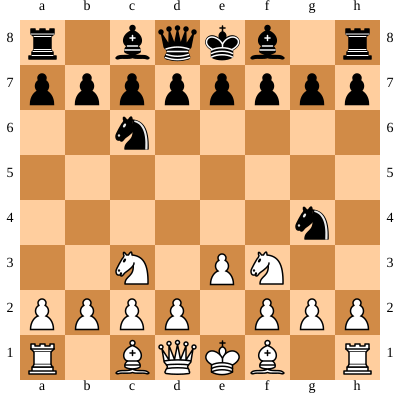



WHITE Turn
Move in UCI format: h2h3
Nodes per depth: {1: 30, 2: 428, 3: 13836, 4: 2810, 5: 4607, 6: 5744, 7: 6557, 8: 4944, 9: 5607, 10: 4015, 11: 3699, 12: 2775, 13: 2490, 14: 1941, 15: 1493, 16: 1023, 17: 912, 18: 536, 19: 479, 20: 226, 21: 206, 22: 93, 23: 79, 24: 38, 25: 10, 26: 4, 27: 2}
Time taken by Move: 7.6899096965789795


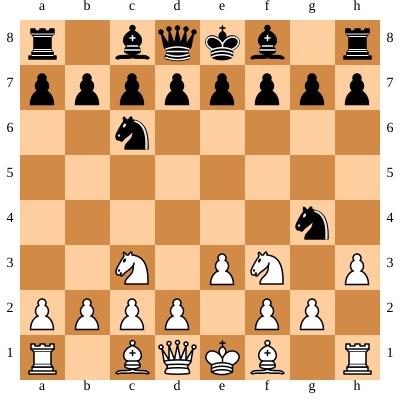



BLACK Turn
Move in UCI format: g4f6
Nodes per depth: {1: 27, 2: 534, 3: 7803}
Time taken by Move: 0.7485966682434082


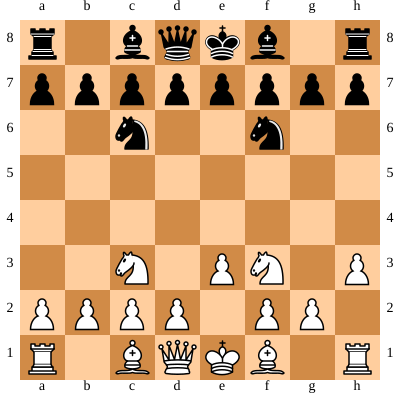



WHITE Turn
Move in UCI format: d2d4
Nodes per depth: {1: 32, 2: 516, 3: 15540, 4: 1463, 5: 1807, 6: 1224, 7: 1446, 8: 1262, 9: 1192, 10: 1113, 11: 909, 12: 760, 13: 606, 14: 541, 15: 535, 16: 323, 17: 334, 18: 173, 19: 182, 20: 88, 21: 107, 22: 42, 23: 36, 24: 2, 25: 2, 26: 2}
Time taken by Move: 2.8345890045166016


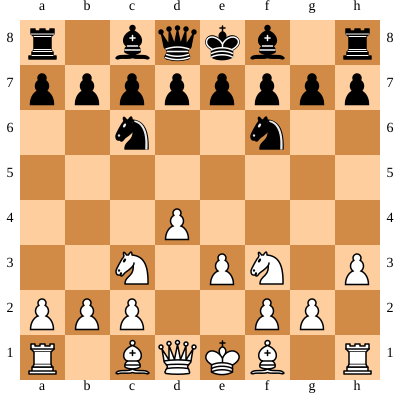



BLACK Turn
Move in UCI format: e7e6
Nodes per depth: {1: 24, 2: 240, 3: 3762}
Time taken by Move: 0.35876941680908203


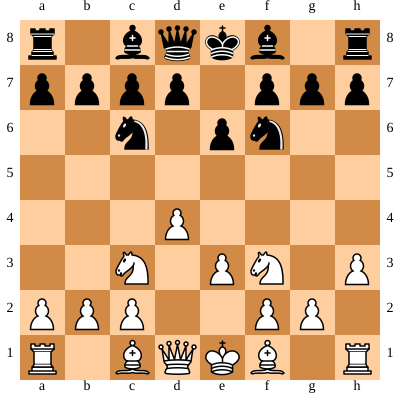



WHITE Turn
Move in UCI format: f1d3
Nodes per depth: {1: 35, 2: 311, 3: 10032, 4: 1532, 5: 1890, 6: 1250, 7: 1532, 8: 1147, 9: 1183, 10: 886, 11: 810, 12: 667, 13: 563, 14: 334, 15: 177, 16: 160, 17: 97, 18: 71, 19: 48, 20: 25, 21: 17, 22: 7, 23: 6, 24: 2}
Time taken by Move: 2.3928635120391846


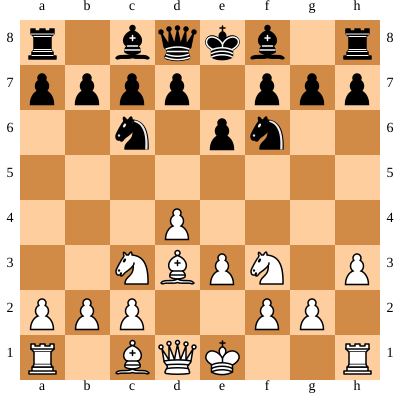



BLACK Turn
Move in UCI format: f8b4
Nodes per depth: {1: 31, 2: 248, 3: 5338}
Time taken by Move: 0.5054688453674316


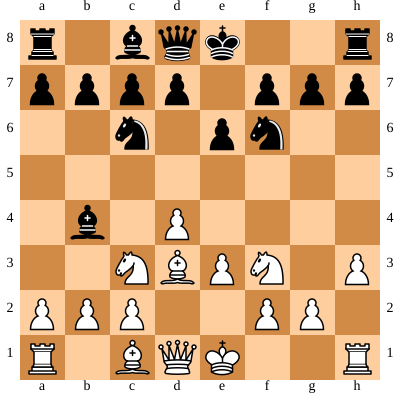



WHITE Turn
Move in UCI format: c1d2
Nodes per depth: {1: 34, 2: 584, 3: 17252, 4: 7050, 5: 13140, 6: 10164, 7: 16189, 8: 13986, 9: 15795, 10: 12774, 11: 12990, 12: 11095, 13: 11892, 14: 7955, 15: 6679, 16: 4235, 17: 3490, 18: 2603, 19: 1737, 20: 981, 21: 550, 22: 233, 23: 123, 24: 13, 25: 11, 26: 3}
Time taken by Move: 22.992905855178833


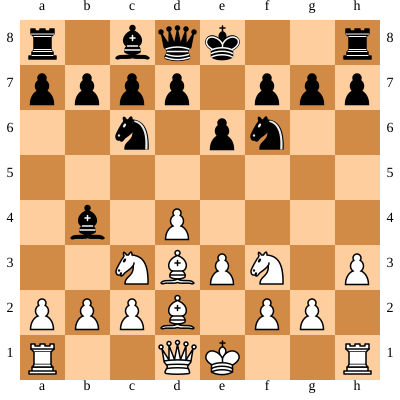



BLACK Turn
Move in UCI format: h7h6
Nodes per depth: {1: 35, 2: 309, 3: 7439}
Time taken by Move: 0.720207929611206


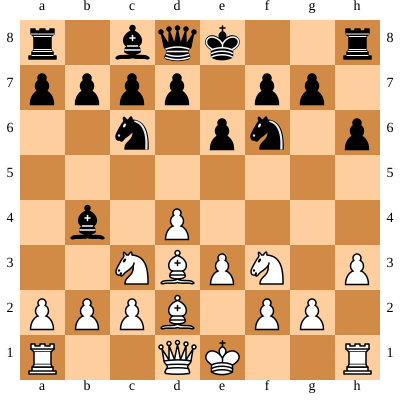



WHITE Turn
Move in UCI format: a2a3
Nodes per depth: {1: 40, 2: 776, 3: 26520, 4: 5641, 5: 9530, 6: 10589, 7: 12988, 8: 15885, 9: 14386, 10: 14216, 11: 12532, 12: 12470, 13: 11073, 14: 9186, 15: 6968, 16: 5777, 17: 4247, 18: 4003, 19: 2465, 20: 2222, 21: 1070, 22: 463, 23: 205, 24: 37, 25: 11}
Time taken by Move: 23.749850511550903


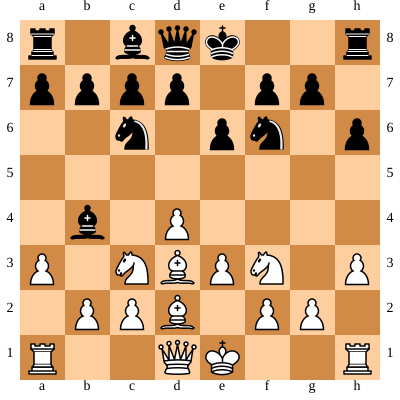



BLACK Turn
Move in UCI format: b4a5
Nodes per depth: {1: 36, 2: 1214, 3: 26056}
Time taken by Move: 2.4647624492645264


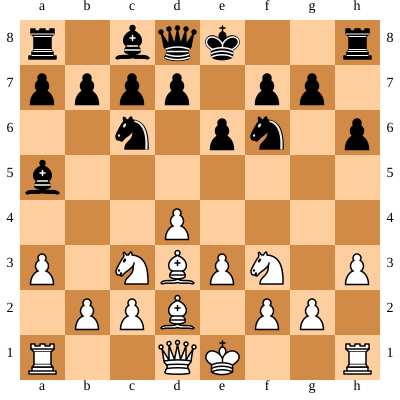



WHITE Turn
Move in UCI format: b2b4
Nodes per depth: {1: 42, 2: 602, 3: 23612, 4: 4520, 5: 7854, 6: 8926, 7: 11544, 8: 13761, 9: 12027, 10: 13327, 11: 10676, 12: 12564, 13: 10039, 14: 10410, 15: 7077, 16: 6766, 17: 4549, 18: 4104, 19: 2351, 20: 1811, 21: 830, 22: 283, 23: 159, 24: 67, 25: 24, 26: 10}
Time taken by Move: 21.331602334976196


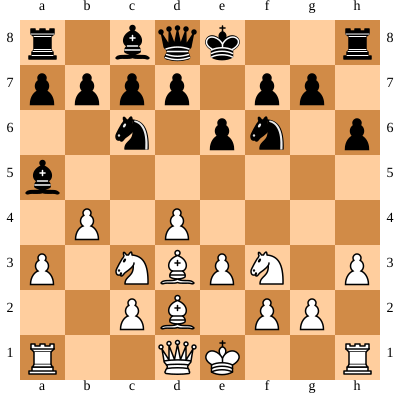



BLACK Turn
Move in UCI format: a5b6
Nodes per depth: {1: 30, 2: 838, 3: 15722}
Time taken by Move: 1.4959139823913574


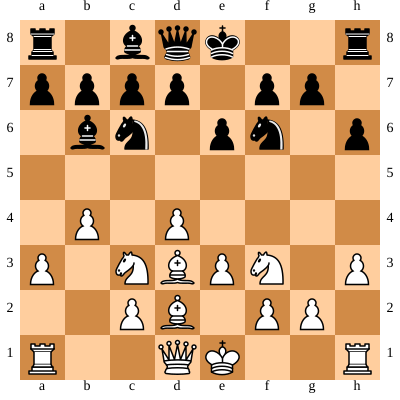



WHITE Turn
Move in UCI format: b4b5
Nodes per depth: {1: 41, 2: 646, 3: 22380, 4: 5176, 5: 7331, 6: 11612, 7: 9996, 8: 15790, 9: 10811, 10: 12798, 11: 11497, 12: 12189, 13: 11361, 14: 11770, 15: 9532, 16: 9464, 17: 7620, 18: 8633, 19: 5798, 20: 4875, 21: 3037, 22: 1348, 23: 931, 24: 430, 25: 171, 26: 57, 27: 29, 28: 4}
Time taken by Move: 25.324640035629272


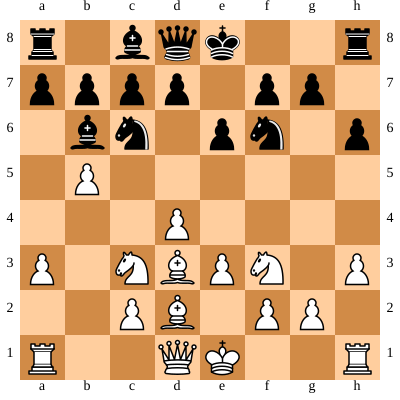



BLACK Turn
Move in UCI format: c6e7
Nodes per depth: {1: 31, 2: 933, 3: 16724}
Time taken by Move: 1.5815532207489014


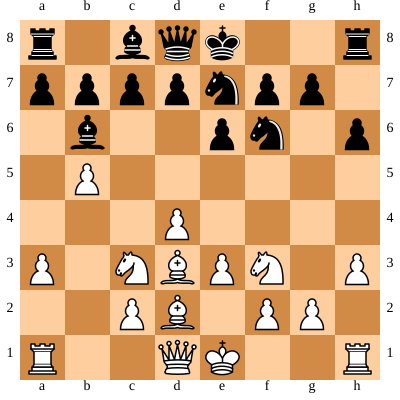



WHITE Turn
Move in UCI format: e1g1
Nodes per depth: {1: 37, 2: 735, 3: 23748, 4: 3551, 5: 5246, 6: 5558, 7: 6820, 8: 8704, 9: 8480, 10: 8221, 11: 9326, 12: 8302, 13: 8722, 14: 8146, 15: 6941, 16: 7191, 17: 5738, 18: 5666, 19: 3792, 20: 3431, 21: 2066, 22: 1562, 23: 679, 24: 376, 25: 132, 26: 15, 27: 14, 28: 1}
Time taken by Move: 18.00870656967163


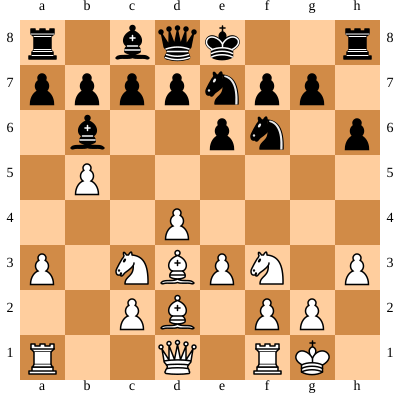



BLACK Turn
Move in UCI format: b6a5
Nodes per depth: {1: 30, 2: 227, 3: 4617}
Time taken by Move: 0.4467298984527588


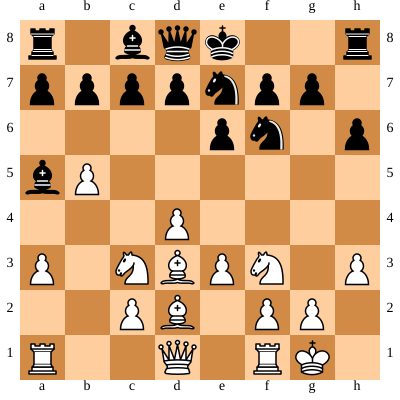



WHITE Turn
Move in UCI format: c3e4
Nodes per depth: {1: 36, 2: 588, 3: 18026, 4: 2459, 5: 4481, 6: 3465, 7: 4809, 8: 4018, 9: 4322, 10: 3916, 11: 3938, 12: 3037, 13: 2637, 14: 1970, 15: 1598, 16: 1332, 17: 1045, 18: 974, 19: 628, 20: 595, 21: 378, 22: 315, 23: 192, 24: 97, 25: 91, 26: 23, 27: 23, 28: 2}
Time taken by Move: 7.515371561050415


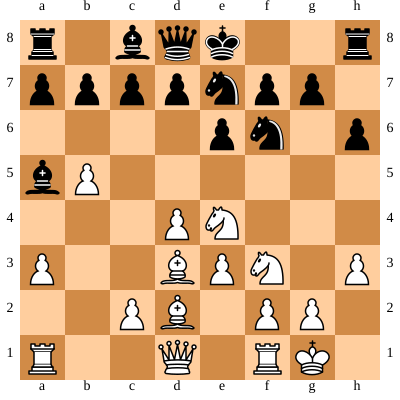



BLACK Turn
Move in UCI format: f6e4
Nodes per depth: {1: 31, 2: 236, 3: 1797}
Time taken by Move: 0.18023061752319336


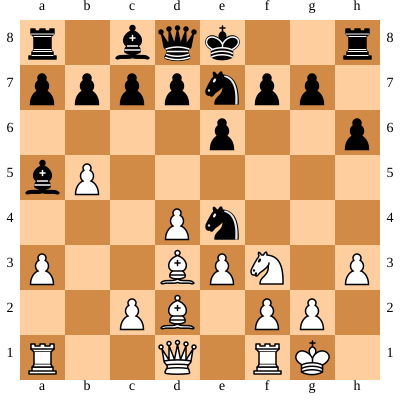



WHITE Turn
Move in UCI format: d3e4
Nodes per depth: {1: 31, 2: 455, 3: 11952, 4: 2068, 5: 4195, 6: 5104, 7: 7442, 8: 8109, 9: 10346, 10: 11534, 11: 12189, 12: 9840, 13: 9217, 14: 6446, 15: 5552, 16: 3778, 17: 2825, 18: 1609, 19: 1004, 20: 355, 21: 260, 22: 81, 23: 39, 24: 3}
Time taken by Move: 15.065803050994873


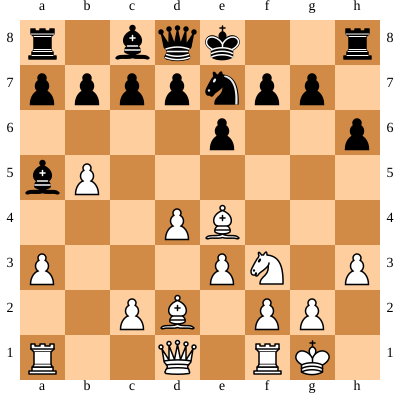



BLACK Turn
Move in UCI format: a5b6
Nodes per depth: {1: 27, 2: 414, 3: 5279}
Time taken by Move: 0.5110998153686523


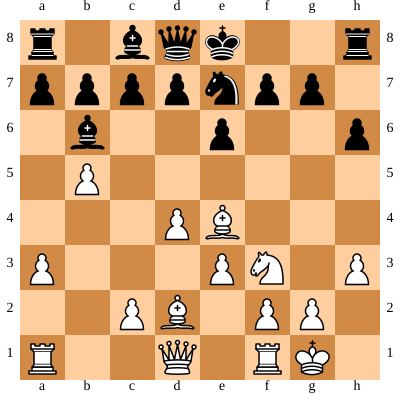



WHITE Turn
Move in UCI format: e4d3
Nodes per depth: {1: 34, 2: 645, 3: 16194, 4: 4109, 5: 4948, 6: 5001, 7: 6276, 8: 7081, 9: 8682, 10: 7821, 11: 10391, 12: 6204, 13: 6065, 14: 4620, 15: 5037, 16: 3500, 17: 3192, 18: 1990, 19: 1593, 20: 651, 21: 434, 22: 135, 23: 65, 24: 10, 25: 3}
Time taken by Move: 13.048462390899658


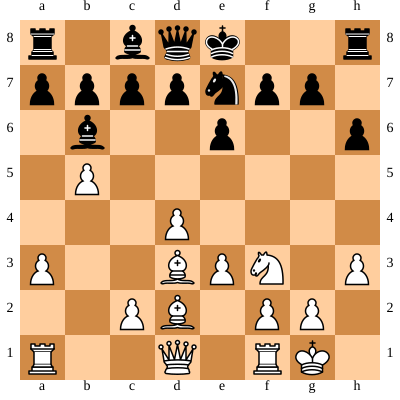



BLACK Turn
Move in UCI format: d7d5
Nodes per depth: {1: 26, 2: 304, 3: 4734}
Time taken by Move: 0.4551877975463867


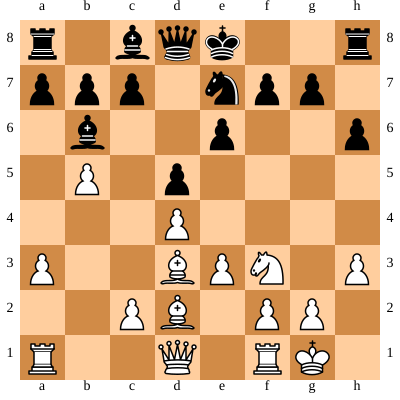



WHITE Turn
Move in UCI format: d2c3
Nodes per depth: {1: 33, 2: 252, 3: 7640, 4: 1162, 5: 1515, 6: 1857, 7: 2281, 8: 2679, 9: 2911, 10: 3182, 11: 3362, 12: 4063, 13: 3897, 14: 4156, 15: 3675, 16: 3536, 17: 2819, 18: 1955, 19: 1414, 20: 772, 21: 572, 22: 349, 23: 154, 24: 90, 25: 11, 26: 2}
Time taken by Move: 6.742635726928711


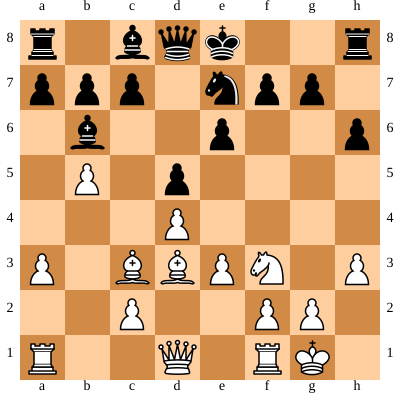



BLACK Turn
Move in UCI format: e8g8
Nodes per depth: {1: 27, 2: 282, 3: 5274}
Time taken by Move: 0.5131897926330566


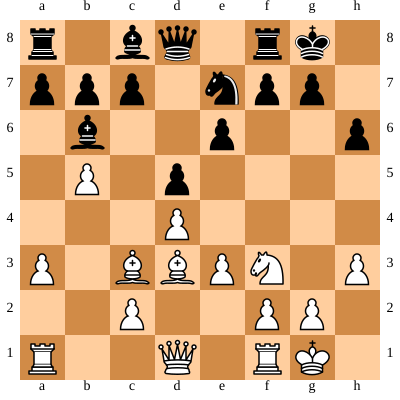



WHITE Turn
Move in UCI format: d1e2
Nodes per depth: {1: 33, 2: 126, 3: 5576, 4: 713, 5: 1005, 6: 1129, 7: 1382, 8: 1239, 9: 1934, 10: 1571, 11: 2246, 12: 2030, 13: 2585, 14: 2531, 15: 2833, 16: 2676, 17: 2430, 18: 2202, 19: 1367, 20: 889, 21: 617, 22: 376, 23: 52, 24: 6, 25: 2}
Time taken by Move: 4.533829689025879


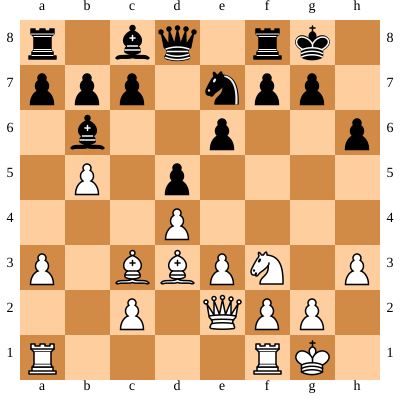



BLACK Turn
Move in UCI format: d8d6
Nodes per depth: {1: 23, 2: 287, 3: 4856}
Time taken by Move: 0.47080421447753906


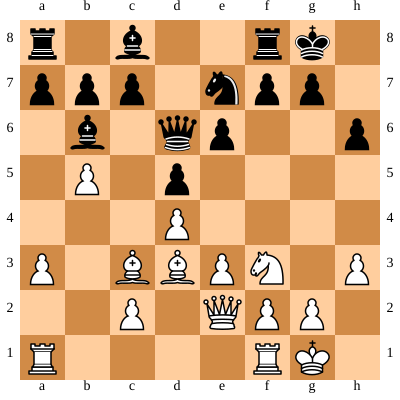



WHITE Turn
Move in UCI format: e3e4
Nodes per depth: {1: 34, 2: 181, 3: 6684, 4: 1557, 5: 2262, 6: 4018, 7: 4575, 8: 7070, 9: 10246, 10: 14280, 11: 21284, 12: 29287, 13: 41265, 14: 50168, 15: 64450, 16: 71463, 17: 82393, 18: 81279, 19: 80480, 20: 71711, 21: 59997, 22: 43813, 23: 29552, 24: 15860, 25: 8114, 26: 3079, 27: 1288, 28: 337, 29: 53}
Time taken by Move: 102.78311276435852


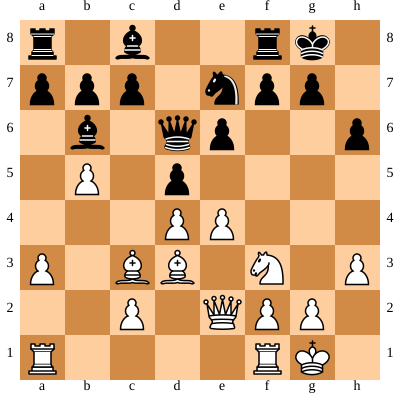



BLACK Turn
Move in UCI format: d6f4
Nodes per depth: {1: 33, 2: 523, 3: 12072}
Time taken by Move: 1.1418390274047852


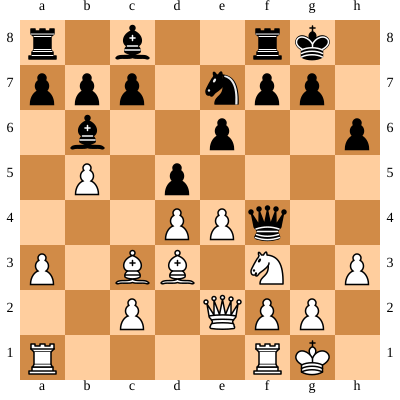



WHITE Turn
Move in UCI format: f3e5
Nodes per depth: {1: 32, 2: 176, 3: 6316, 4: 2433, 5: 3751, 6: 7214, 7: 7330, 8: 12237, 9: 13704, 10: 21104, 11: 22842, 12: 32569, 13: 34064, 14: 43259, 15: 42308, 16: 48348, 17: 42977, 18: 43073, 19: 36672, 20: 32548, 21: 25548, 22: 19314, 23: 13712, 24: 9560, 25: 6577, 26: 3894, 27: 1903, 28: 599, 29: 147}
Time taken by Move: 69.6776614189148


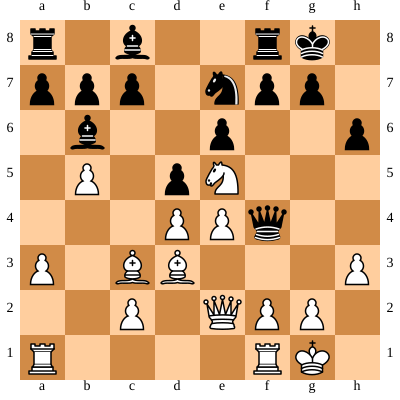



BLACK Turn
Move in UCI format: d5e4
Nodes per depth: {1: 36, 2: 479, 3: 9286}
Time taken by Move: 0.8782646656036377


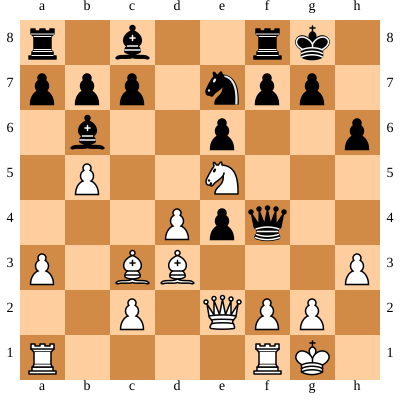



WHITE Turn
Move in UCI format: e2e4
Nodes per depth: {1: 38, 2: 380, 3: 13462, 4: 4890, 5: 9492, 6: 13719, 7: 20266, 8: 28677, 9: 39132, 10: 50056, 11: 59707, 12: 80871, 13: 88838, 14: 115731, 15: 114056, 16: 137900, 17: 122522, 18: 128069, 19: 97205, 20: 79652, 21: 51402, 22: 27079, 23: 12455, 24: 3763, 25: 1336, 26: 213, 27: 69}
Time taken by Move: 170.8485872745514


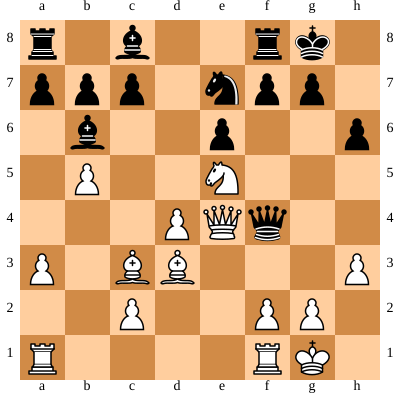



BLACK Turn
Move in UCI format: f4e4
Nodes per depth: {1: 35, 2: 400, 3: 5898}
Time taken by Move: 0.5800361633300781


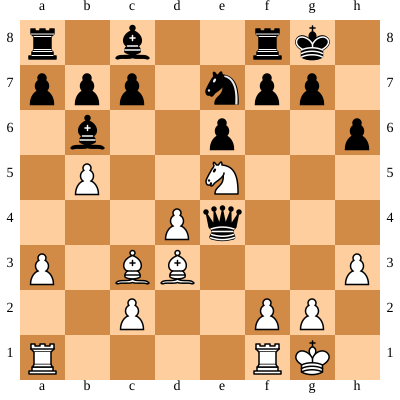



WHITE Turn
Move in UCI format: d3e4
Nodes per depth: {1: 33, 2: 313, 3: 10434, 4: 1699, 5: 2189, 6: 4363, 7: 3969, 8: 8663, 9: 6890, 10: 17864, 11: 9818, 12: 23722, 13: 12729, 14: 28025, 15: 12598, 16: 22966, 17: 8902, 18: 11873, 19: 4039, 20: 3728, 21: 1408, 22: 796, 23: 424, 24: 20}
Time taken by Move: 24.398245334625244


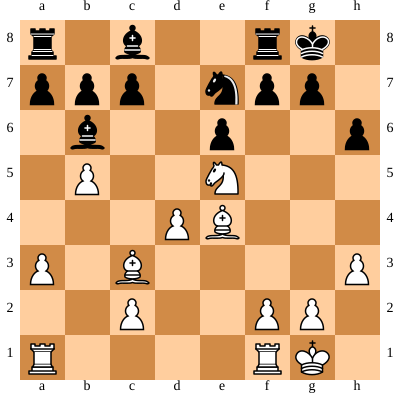



BLACK Turn
Move in UCI format: f8e8
Nodes per depth: {1: 21, 2: 294, 3: 3821}
Time taken by Move: 0.38740015029907227


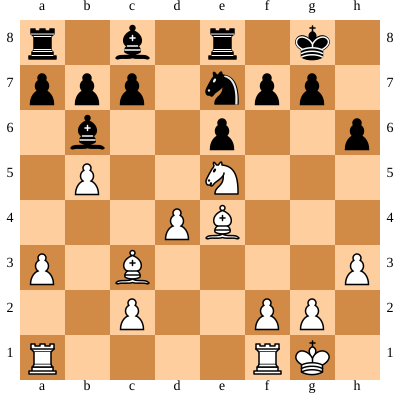



WHITE Turn
Move in UCI format: e5c4
Nodes per depth: {1: 39, 2: 305, 3: 14480, 4: 1996, 5: 3483, 6: 2319, 7: 2786, 8: 2338, 9: 2475, 10: 1582, 11: 1604, 12: 1213, 13: 1249, 14: 800, 15: 701, 16: 429, 17: 276, 18: 96, 19: 31, 20: 9, 21: 3}
Time taken by Move: 4.06279993057251


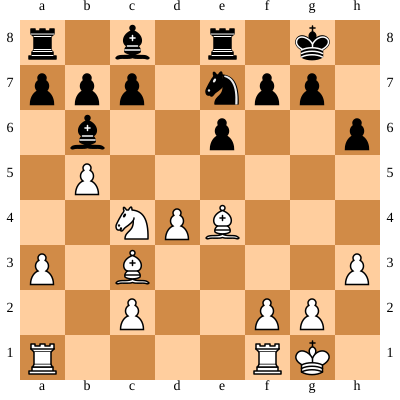



BLACK Turn
Move in UCI format: f7f5
Nodes per depth: {1: 23, 2: 412, 3: 4067}
Time taken by Move: 0.3923673629760742


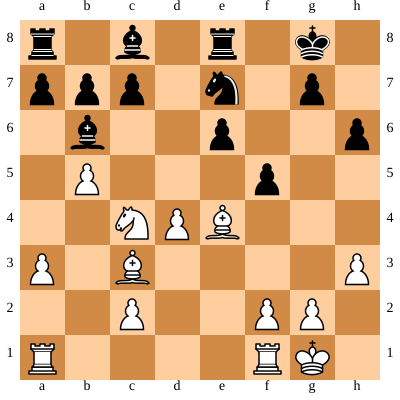



WHITE Turn
Move in UCI format: c4b6
Nodes per depth: {1: 36, 2: 246, 3: 7896, 4: 1280, 5: 1411, 6: 1812, 7: 1427, 8: 2038, 9: 1230, 10: 1047, 11: 729, 12: 582, 13: 442, 14: 324, 15: 207, 16: 75, 17: 9, 18: 4}
Time taken by Move: 2.2182323932647705


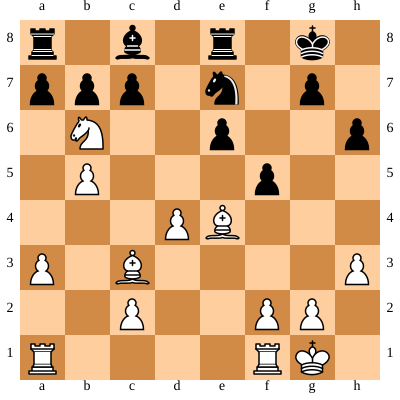



BLACK Turn
Move in UCI format: a7b6
Nodes per depth: {1: 23, 2: 254, 3: 2049}
Time taken by Move: 0.2105422019958496


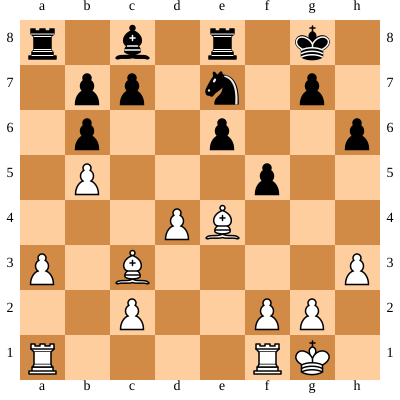



WHITE Turn
Move in UCI format: e4f3
Nodes per depth: {1: 29, 2: 312, 3: 7910, 4: 2981, 5: 4235, 6: 5287, 7: 4772, 8: 3875, 9: 2396, 10: 1546, 11: 1320, 12: 1041, 13: 816, 14: 338, 15: 140, 16: 84, 17: 64, 18: 53, 19: 51, 20: 21, 21: 18, 22: 7}
Time taken by Move: 4.444715738296509


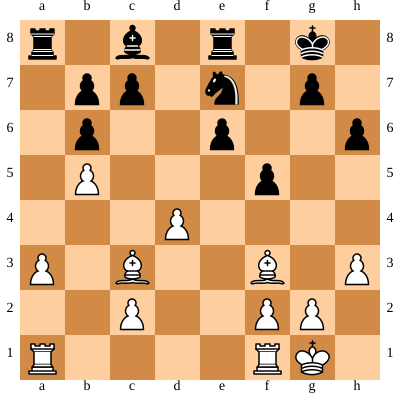



BLACK Turn
Move in UCI format: a8a4
Nodes per depth: {1: 23, 2: 274, 3: 4660}
Time taken by Move: 0.44736218452453613


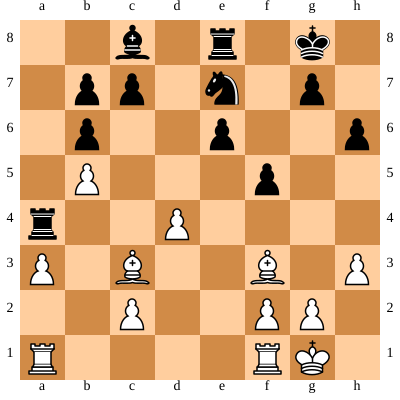



WHITE Turn
Move in UCI format: f3h5
Nodes per depth: {1: 28, 2: 221, 3: 6608, 4: 1590, 5: 2176, 6: 1401, 7: 976, 8: 581, 9: 314, 10: 157, 11: 93, 12: 57, 13: 51, 14: 26}
Time taken by Move: 1.3620705604553223


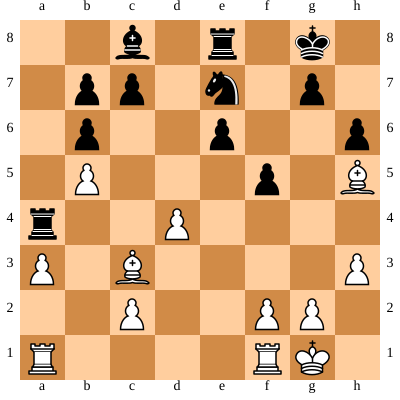



BLACK Turn
Move in UCI format: e8d8
Nodes per depth: {1: 23, 2: 137, 3: 1308}
Time taken by Move: 0.12816262245178223


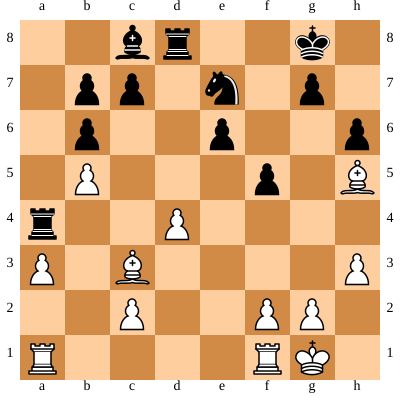



WHITE Turn
Move in UCI format: h5f3
Nodes per depth: {1: 29, 2: 322, 3: 8568, 4: 3125, 5: 3664, 6: 4796, 7: 2541, 8: 3271, 9: 2423, 10: 2116, 11: 1871, 12: 1412, 13: 962, 14: 322, 15: 133, 16: 90, 17: 45, 18: 14, 19: 1}
Time taken by Move: 3.92311692237854


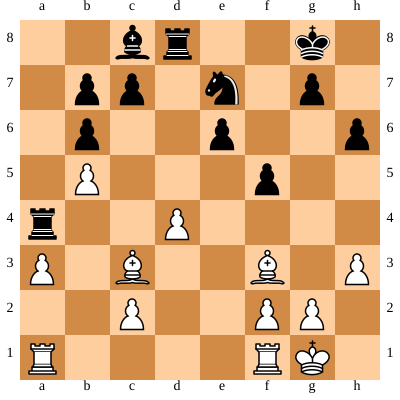



BLACK Turn
Move in UCI format: a4c4
Nodes per depth: {1: 29, 2: 372, 3: 7148}
Time taken by Move: 0.6564946174621582


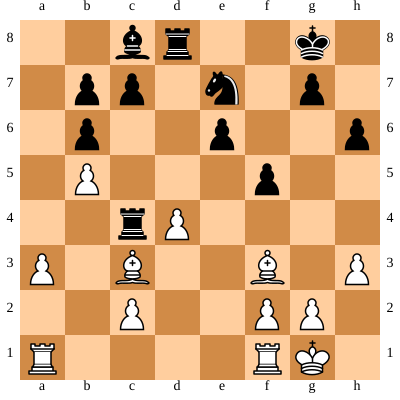



WHITE Turn
Move in UCI format: c3b4
Nodes per depth: {1: 29, 2: 444, 3: 11532, 4: 9410, 5: 11610, 6: 13728, 7: 8417, 8: 9080, 9: 5264, 10: 3809, 11: 2800, 12: 1870, 13: 1263, 14: 533, 15: 294, 16: 122, 17: 94, 18: 25, 19: 16}
Time taken by Move: 9.727315902709961


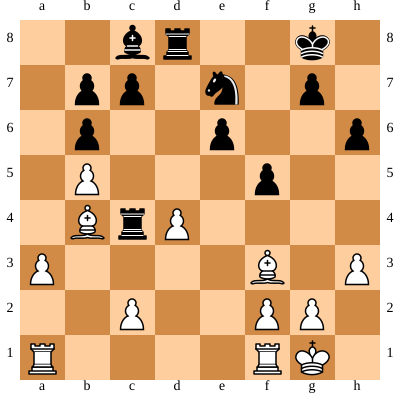



BLACK Turn
Move in UCI format: c7c5
Nodes per depth: {1: 27, 2: 219, 3: 2464}
Time taken by Move: 0.2511119842529297


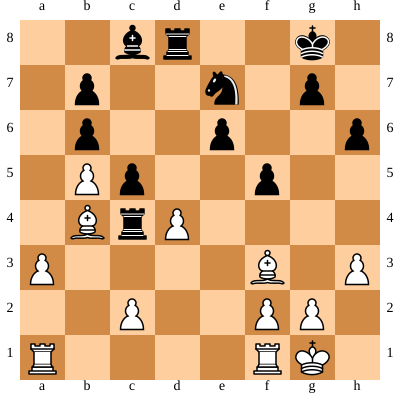



WHITE Turn
Move in UCI format: b5c6
Nodes per depth: {1: 32, 2: 424, 3: 12674, 4: 14246, 5: 22947, 6: 23578, 7: 23822, 8: 18581, 9: 14614, 10: 11703, 11: 7317, 12: 6207, 13: 4142, 14: 2832, 15: 1695, 16: 1039, 17: 730, 18: 381, 19: 238, 20: 87, 21: 34, 22: 11, 23: 10}
Time taken by Move: 20.889830589294434


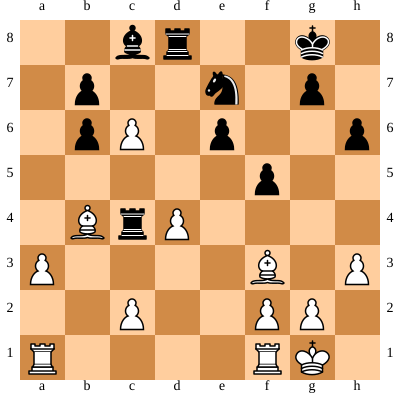



BLACK Turn
Move in UCI format: e7c6
Nodes per depth: {1: 27, 2: 207, 3: 2080}
Time taken by Move: 0.19932985305786133


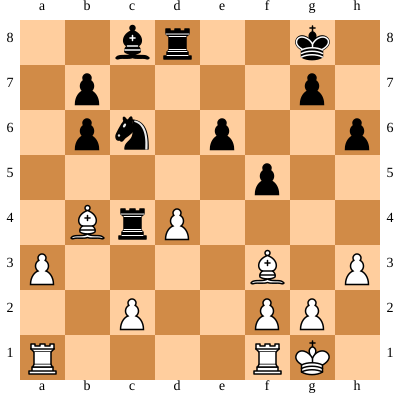



WHITE Turn
Move in UCI format: f3c6
Nodes per depth: {1: 32, 2: 405, 3: 9066, 4: 5833, 5: 6262, 6: 7386, 7: 4494, 8: 4204, 9: 2521, 10: 2102, 11: 1185, 12: 807, 13: 413, 14: 233, 15: 115, 16: 47, 17: 30, 18: 13, 19: 1}
Time taken by Move: 5.221162557601929


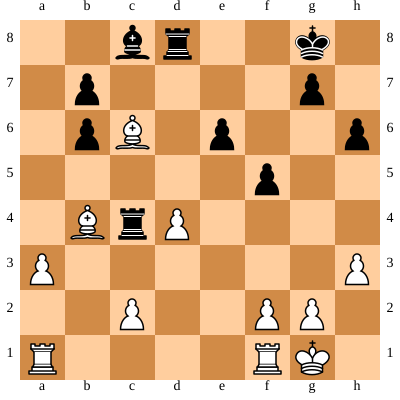



BLACK Turn
Move in UCI format: c4c6
Nodes per depth: {1: 23, 2: 152, 3: 2223}
Time taken by Move: 0.21983766555786133


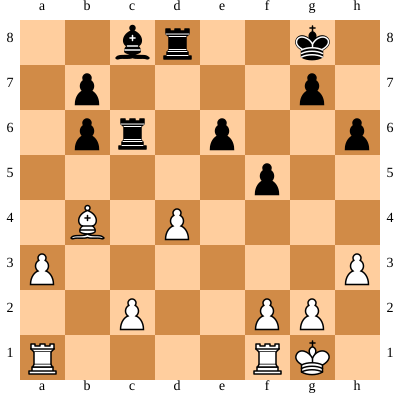



WHITE Turn
Move in UCI format: c2c3
Nodes per depth: {1: 28, 2: 311, 3: 8782, 4: 4953, 5: 3182, 6: 3037, 7: 1492, 8: 1618, 9: 1169, 10: 969, 11: 681, 12: 459, 13: 342, 14: 221, 15: 200, 16: 94, 17: 26}
Time taken by Move: 3.140650749206543


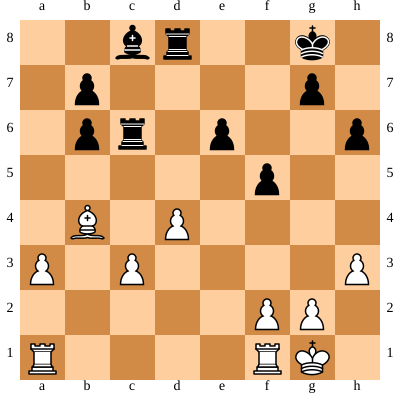



BLACK Turn
Move in UCI format: c6c4
Nodes per depth: {1: 21, 2: 203, 3: 2874}
Time taken by Move: 0.2804718017578125


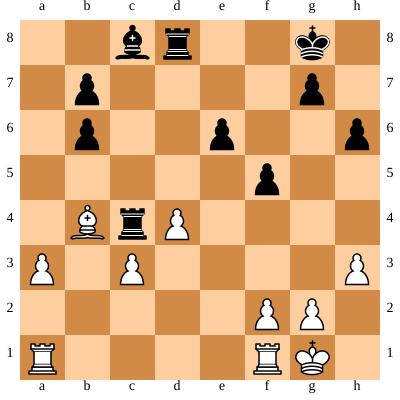



WHITE Turn
Move in UCI format: b4e7
Nodes per depth: {1: 23, 2: 204, 3: 4196, 4: 1603, 5: 1574, 6: 1585, 7: 622, 8: 641, 9: 265, 10: 144, 11: 97, 12: 51, 13: 19, 14: 5, 15: 4}
Time taken by Move: 1.1088216304779053


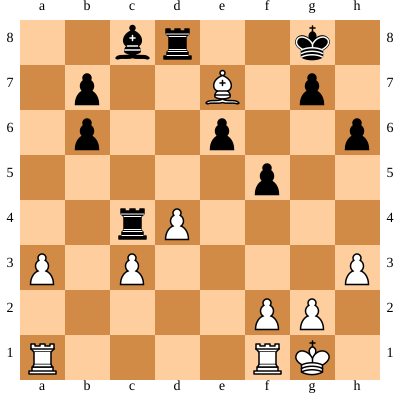



BLACK Turn
Move in UCI format: d8d7
Nodes per depth: {1: 23, 2: 167, 3: 1806}
Time taken by Move: 0.17379450798034668


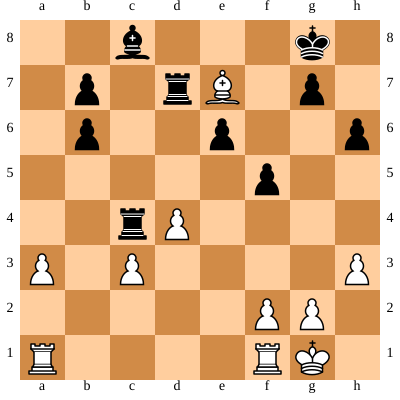



WHITE Turn
Move in UCI format: e7b4
Nodes per depth: {1: 26, 2: 211, 3: 4196, 4: 2715, 5: 2789, 6: 3349, 7: 1975, 8: 2240, 9: 1337, 10: 1042, 11: 753, 12: 297, 13: 149, 14: 48, 15: 25, 16: 2}
Time taken by Move: 2.43451189994812


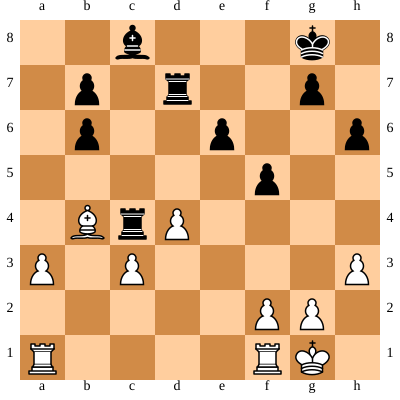



BLACK Turn
Move in UCI format: f5f4
Nodes per depth: {1: 22, 2: 178, 3: 2725}
Time taken by Move: 0.26697802543640137


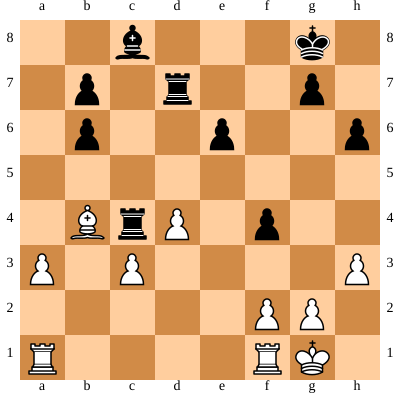



WHITE Turn
Move in UCI format: f1e1
Nodes per depth: {1: 22, 2: 171, 3: 3688, 4: 1649, 5: 1768, 6: 2021, 7: 943, 8: 1247, 9: 729, 10: 888, 11: 671, 12: 562, 13: 358, 14: 200, 15: 115, 16: 21, 17: 15}
Time taken by Move: 1.706972599029541


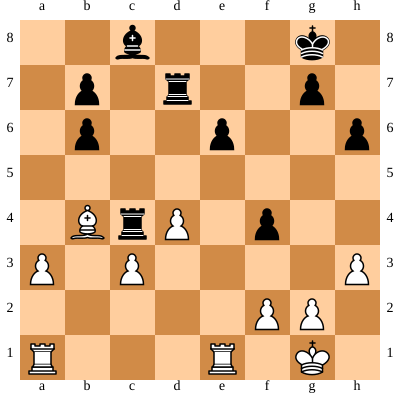



BLACK Turn
Move in UCI format: g8f7
Nodes per depth: {1: 22, 2: 169, 3: 2519}
Time taken by Move: 0.25165700912475586


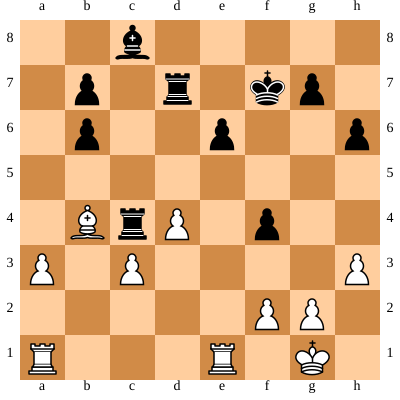



WHITE Turn
Move in UCI format: e1e4
Nodes per depth: {1: 27, 2: 223, 3: 5318, 4: 1406, 5: 1889, 6: 2061, 7: 1949, 8: 2643, 9: 2371, 10: 3516, 11: 2886, 12: 3292, 13: 2436, 14: 2032, 15: 1442, 16: 725, 17: 368, 18: 92, 19: 86, 20: 36}
Time taken by Move: 4.245345115661621


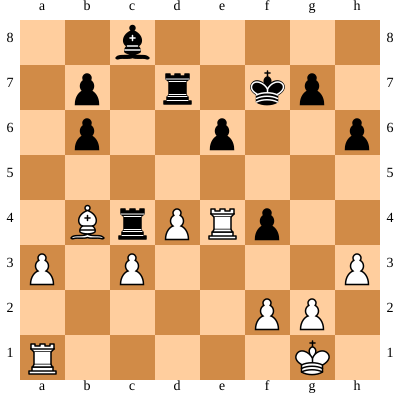



BLACK Turn
Move in UCI format: g7g5
Nodes per depth: {1: 22, 2: 107, 3: 1579}
Time taken by Move: 0.1530284881591797


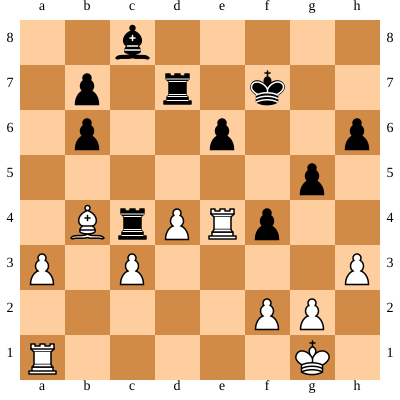



WHITE Turn
Move in UCI format: e4e1
Nodes per depth: {1: 26, 2: 204, 3: 5226, 4: 1310, 5: 2073, 6: 2421, 7: 2256, 8: 2837, 9: 2755, 10: 3387, 11: 2506, 12: 2488, 13: 1305, 14: 701, 15: 392, 16: 254, 17: 89, 18: 74, 19: 9}
Time taken by Move: 3.642289638519287


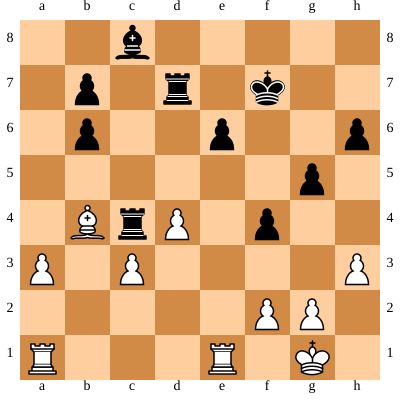



BLACK Turn
Move in UCI format: d7d8
Nodes per depth: {1: 22, 2: 209, 3: 3629}
Time taken by Move: 0.34035468101501465


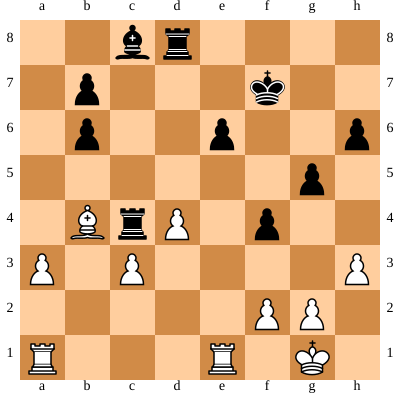



WHITE Turn
Move in UCI format: a1d1
Nodes per depth: {1: 27, 2: 364, 3: 8660, 4: 4036, 5: 5765, 6: 5408, 7: 4921, 8: 5082, 9: 4482, 10: 4634, 11: 3737, 12: 3104, 13: 1681, 14: 983, 15: 343, 16: 66, 17: 15}
Time taken by Move: 6.642254590988159


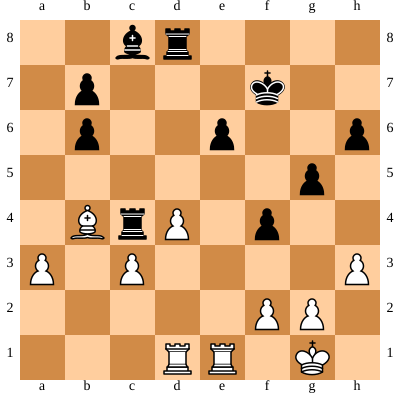



BLACK Turn
Move in UCI format: d8d5
Nodes per depth: {1: 25, 2: 233, 3: 4423}
Time taken by Move: 0.4167900085449219


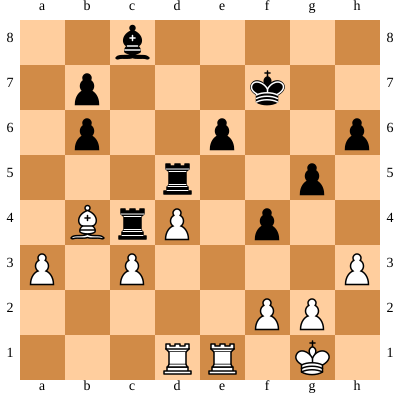



WHITE Turn
Move in UCI format: g1h2
Nodes per depth: {1: 24, 2: 157, 3: 3422, 4: 1610, 5: 2138, 6: 2783, 7: 2889, 8: 3168, 9: 3277, 10: 3449, 11: 2652, 12: 2415, 13: 1674, 14: 875, 15: 458, 16: 92, 17: 21}
Time taken by Move: 3.8385257720947266


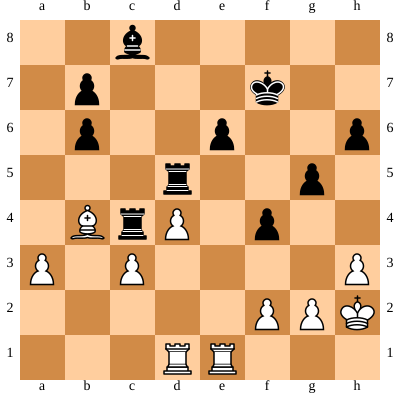



BLACK Turn
Move in UCI format: e6e5
Nodes per depth: {1: 26, 2: 146, 3: 3124}
Time taken by Move: 0.2994711399078369


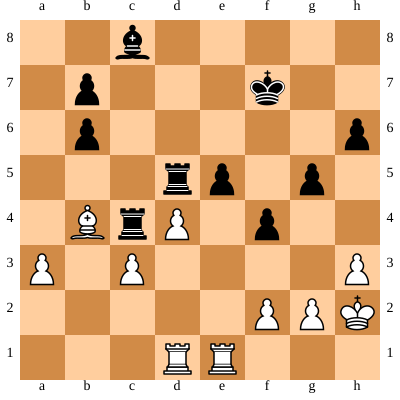



WHITE Turn
Move in UCI format: d4e5
Nodes per depth: {1: 25, 2: 256, 3: 5218, 4: 4031, 5: 6339, 6: 14809, 7: 16181, 8: 29050, 9: 26710, 10: 31995, 11: 25830, 12: 21793, 13: 13177, 14: 6473, 15: 2737, 16: 516, 17: 258}
Time taken by Move: 26.868544101715088


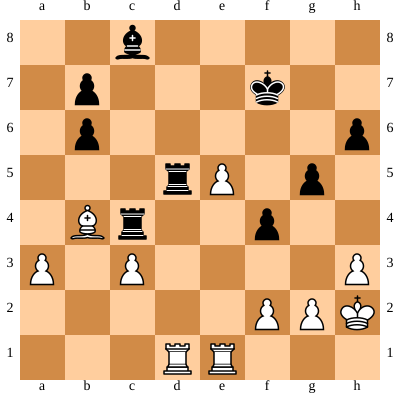



BLACK Turn
Move in UCI format: d5d1
Nodes per depth: {1: 32, 2: 419, 3: 8787}
Time taken by Move: 0.7727158069610596


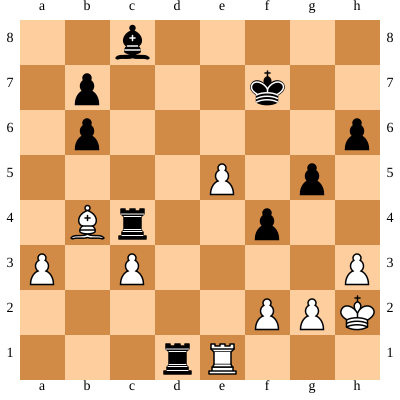



WHITE Turn
Move in UCI format: e1d1
Nodes per depth: {1: 20, 2: 364, 3: 7106, 4: 8464, 5: 9192, 6: 21095, 7: 13576, 8: 21847, 9: 16410, 10: 20921, 11: 13482, 12: 11227, 13: 3264, 14: 1023, 15: 22}
Time taken by Move: 19.24968671798706


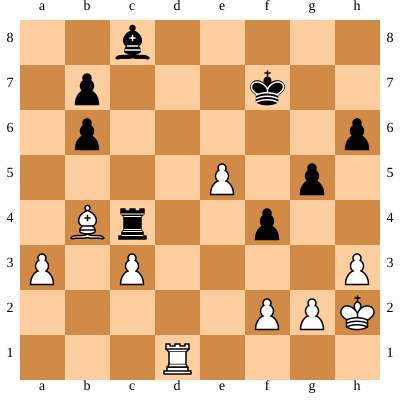



BLACK Turn
Move in UCI format: f4f3
Nodes per depth: {1: 21, 2: 202, 3: 2935}
Time taken by Move: 0.2903938293457031


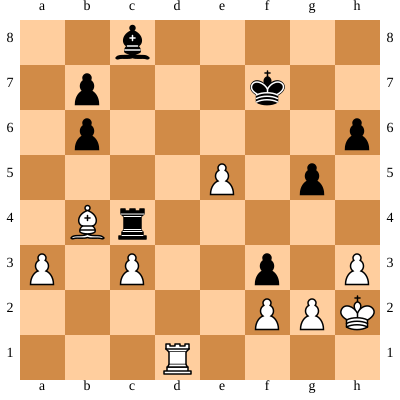



WHITE Turn
Move in UCI format: d1d4
Nodes per depth: {1: 28, 2: 340, 3: 9262, 4: 2588, 5: 3083, 6: 4386, 7: 2770, 8: 2826, 9: 1002, 10: 806, 11: 284, 12: 144, 13: 78, 14: 23}
Time taken by Move: 2.9259488582611084


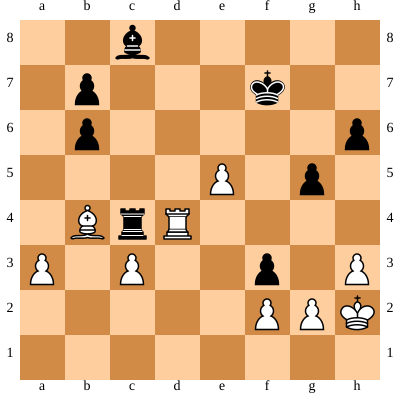



BLACK Turn
Move in UCI format: f3g2
Nodes per depth: {1: 20, 2: 271, 3: 3114}
Time taken by Move: 0.30119752883911133


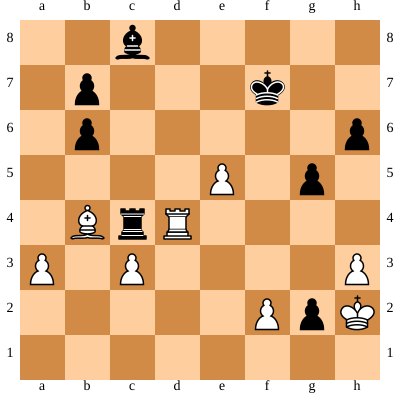



WHITE Turn
Move in UCI format: d4c4
Nodes per depth: {1: 25, 2: 127, 3: 3530, 4: 441, 5: 594, 6: 547, 7: 464, 8: 243, 9: 186, 10: 57, 11: 31, 12: 7, 13: 2}
Time taken by Move: 0.5556740760803223


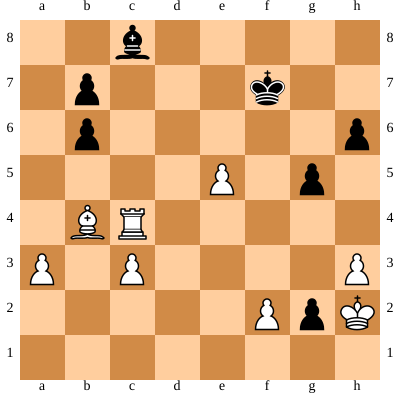



BLACK Turn
Move in UCI format: c8h3
Nodes per depth: {1: 17, 2: 117, 3: 917}
Time taken by Move: 0.10819745063781738


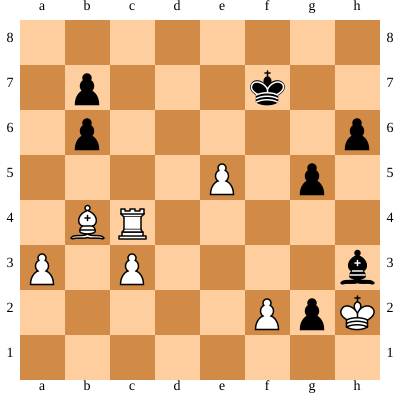



WHITE Turn
Move in UCI format: c4c7
Nodes per depth: {1: 21, 2: 52, 3: 1498, 4: 32, 5: 29}
Time taken by Move: 0.11048579216003418


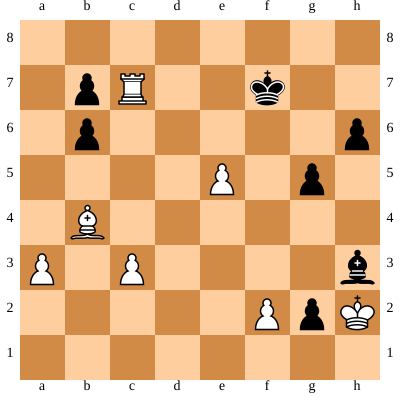



BLACK Turn
Move in UCI format: f7g8
Nodes per depth: {1: 5, 2: 53, 3: 483}
Time taken by Move: 0.0674903392791748


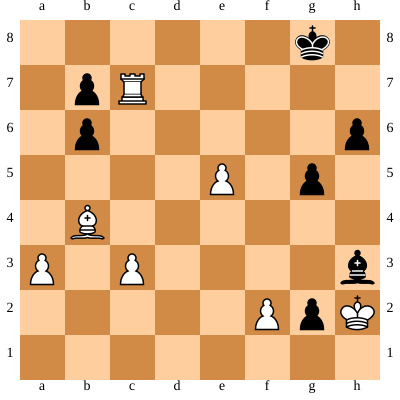



WHITE Turn
Move in UCI format: c7b7
Nodes per depth: {1: 23, 2: 110, 3: 2744, 4: 106, 5: 99, 6: 1}
Time taken by Move: 0.19185090065002441


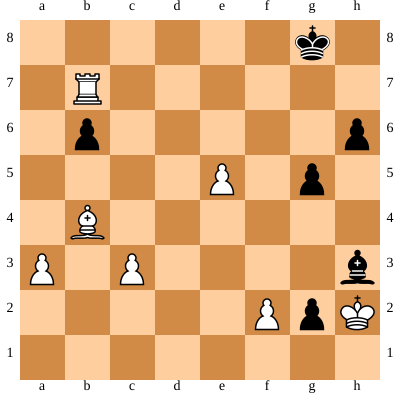



BLACK Turn
Move in UCI format: h3c8
Nodes per depth: {1: 13, 2: 56, 3: 265}
Time taken by Move: 0.037876129150390625


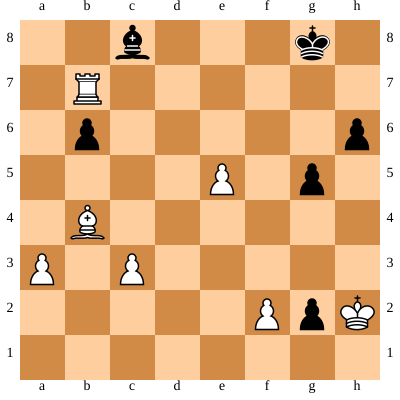



WHITE Turn
Move in UCI format: b7b6
Nodes per depth: {1: 22, 2: 62, 3: 1792, 4: 6, 5: 4}
Time taken by Move: 0.11891889572143555


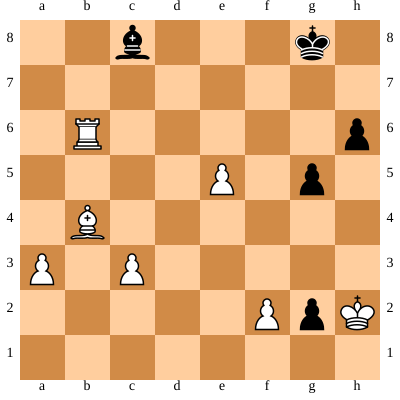



BLACK Turn
Move in UCI format: c8b7
Nodes per depth: {1: 17, 2: 201, 3: 1105}
Time taken by Move: 0.134321928024292


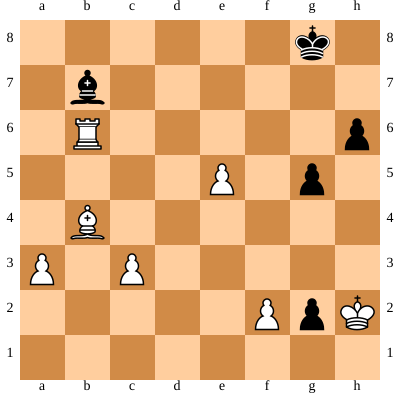



WHITE Turn
Move in UCI format: b6b7
Nodes per depth: {1: 22, 2: 28, 3: 1198, 4: 17, 5: 15}
Time taken by Move: 0.08850502967834473


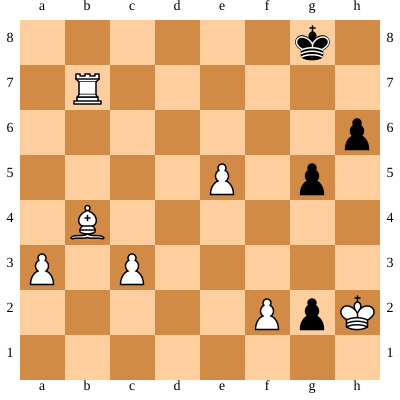



BLACK Turn
Move in UCI format: g5g4
Nodes per depth: {1: 7, 2: 108, 3: 230}
Time taken by Move: 0.036596059799194336


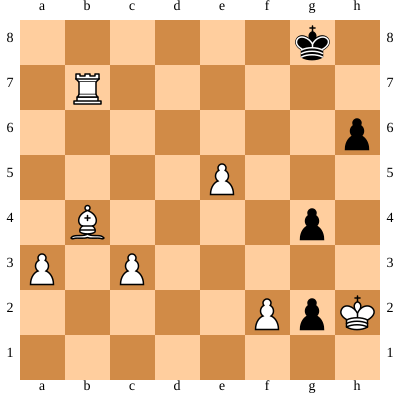



WHITE Turn
Move in UCI format: h2g2
Nodes per depth: {1: 23, 2: 48, 3: 1948, 4: 11, 5: 6}
Time taken by Move: 0.13160181045532227


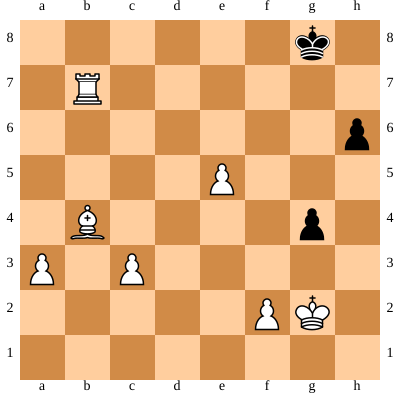



BLACK Turn
Move in UCI format: g8h8
Nodes per depth: {1: 3, 2: 55, 3: 89}
Time taken by Move: 0.013990640640258789


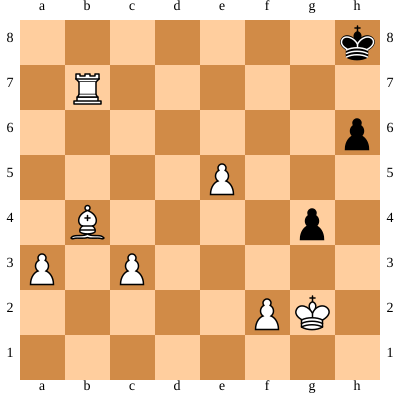



WHITE Turn
Move in UCI format: b4f8
Nodes per depth: {1: 25, 2: 32, 3: 1502, 4: 6, 5: 1}
Time taken by Move: 0.10060596466064453


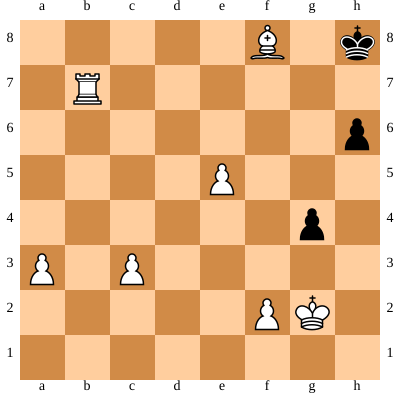



BLACK Turn
Move in UCI format: h6h5
Nodes per depth: {1: 3, 2: 82, 3: 98}
Time taken by Move: 0.019616365432739258


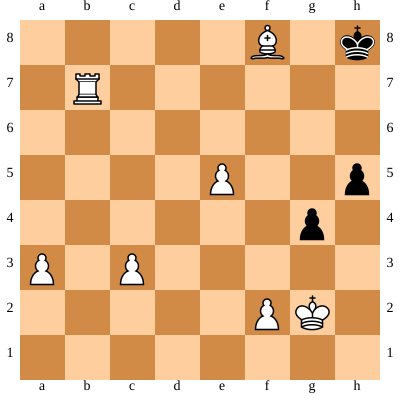



WHITE Turn
Move in UCI format: b7g7
Nodes per depth: {1: 30, 2: 34, 3: 1812, 4: 10, 5: 7}
Time taken by Move: 0.12231063842773438


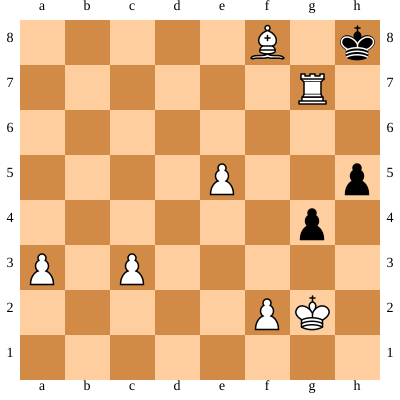



BLACK Turn
Move in UCI format: h5h4
Nodes per depth: {1: 2, 2: 40, 3: 64}
Time taken by Move: 0.013272285461425781


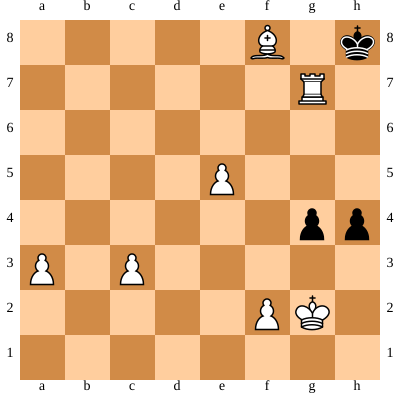



WHITE Turn
Move in UCI format: g7g4
Nodes per depth: {1: 24, 2: 38, 3: 1034, 4: 52, 5: 20, 6: 1, 7: 1}
Time taken by Move: 0.09771060943603516


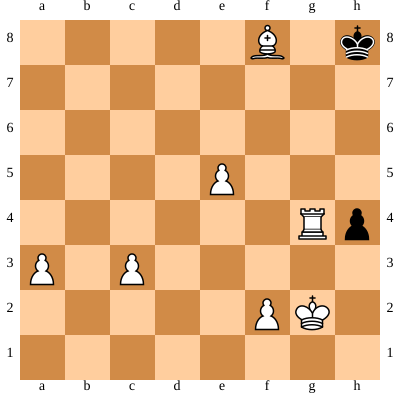



BLACK Turn
Move in UCI format: h4h3
Nodes per depth: {1: 2, 2: 36, 3: 42}
Time taken by Move: 0.008355379104614258


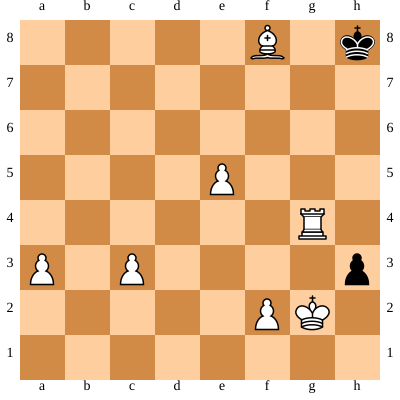



WHITE Turn
Move in UCI format: g2h3
Nodes per depth: {1: 7, 2: 7, 3: 390}
Time taken by Move: 0.02688741683959961


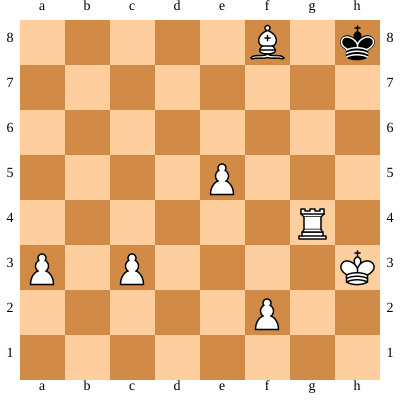



BLACK Turn
Move in UCI format: h8h7
Nodes per depth: {1: 1, 2: 29, 3: 31}
Time taken by Move: 0.005899667739868164


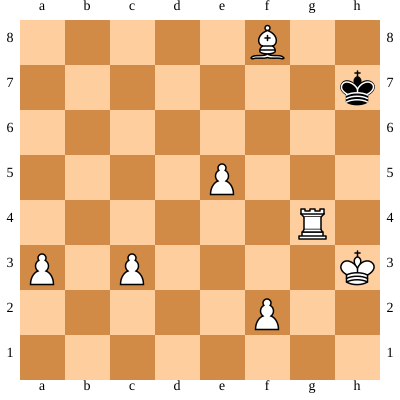



WHITE Turn
Move in UCI format: f8d6
Nodes per depth: {1: 29, 2: 31, 3: 1596, 4: 2}
Time taken by Move: 0.1125490665435791


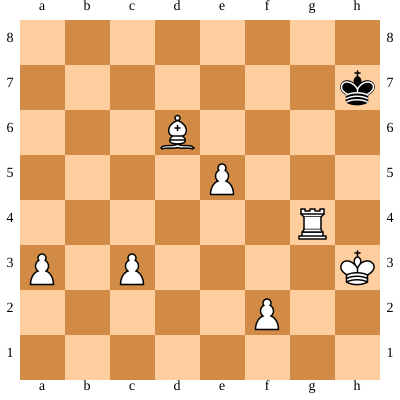



BLACK Turn
Move in UCI format: h7h8
Nodes per depth: {1: 2, 2: 52, 3: 57}
Time taken by Move: 0.009772300720214844


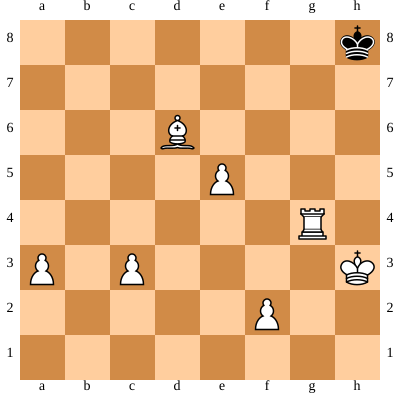



WHITE Turn
Move in UCI format: h3h2
Nodes per depth: {1: 29, 2: 29, 3: 1546, 4: 3}
Time taken by Move: 0.09858202934265137


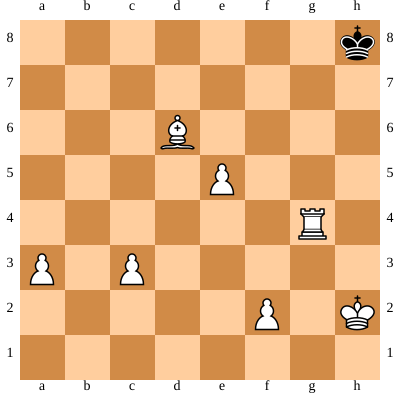



BLACK Turn
Move in UCI format: h8h7
Nodes per depth: {1: 1, 2: 30, 3: 36}
Time taken by Move: 0.0062634944915771484


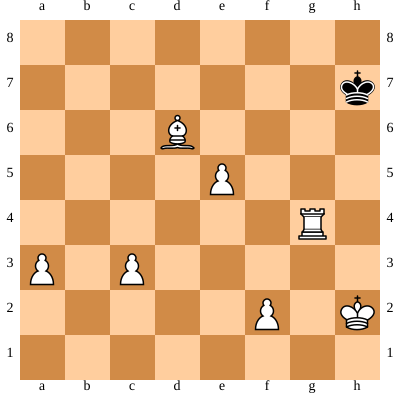



WHITE Turn
Move in UCI format: e5e6
Nodes per depth: {1: 30, 2: 36, 3: 1730, 4: 9}
Time taken by Move: 0.11849641799926758


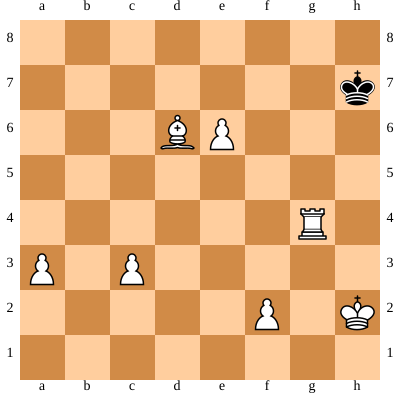



BLACK Turn
Move in UCI format: h7h8
Nodes per depth: {1: 2, 2: 62, 3: 67}
Time taken by Move: 0.013732433319091797


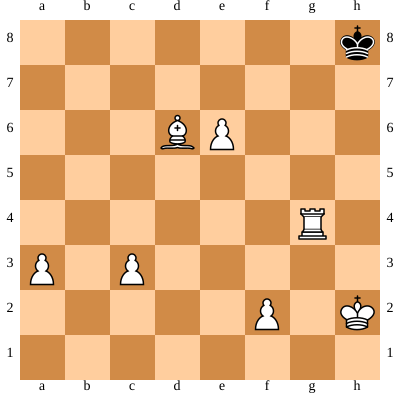



WHITE Turn
Move in UCI format: e6e7
Nodes per depth: {1: 33, 2: 33, 3: 1950}
Time taken by Move: 0.12215042114257812


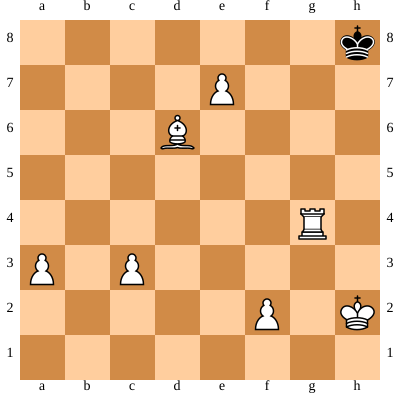



BLACK Turn
Move in UCI format: h8h7
Nodes per depth: {1: 1, 2: 34, 3: 36}
Time taken by Move: 0.007026195526123047


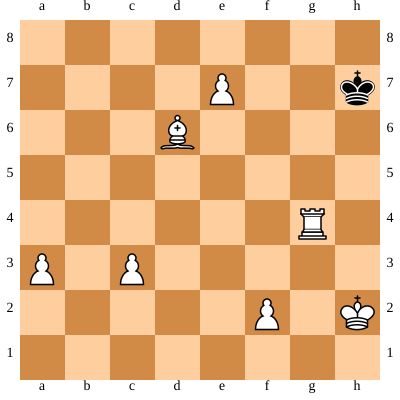



WHITE Turn
Move in UCI format: e7e8q
Nodes per depth: {1: 34, 2: 36, 3: 2316}
Time taken by Move: 0.14769697189331055


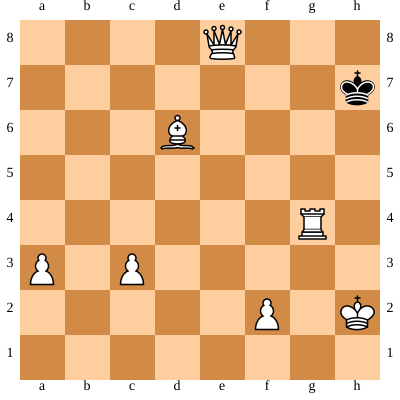



BLACK Turn
Move in UCI format: h7h6
Nodes per depth: {1: 1, 2: 53, 3: 50}
Time taken by Move: 0.009160995483398438


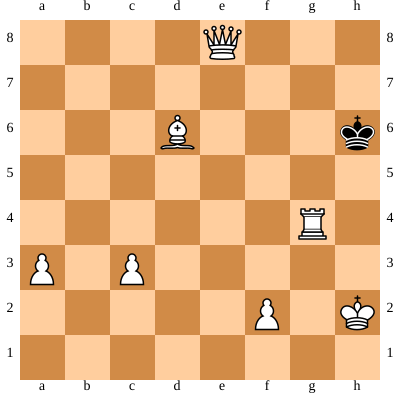



WHITE Turn
Move in UCI format: e8h8
Nodes per depth: {1: 53, 2: 50, 3: 4864}
Time taken by Move: 0.3085181713104248


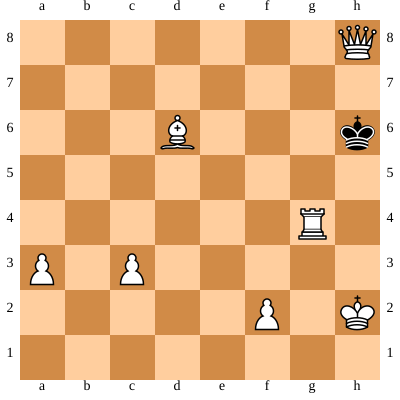



[Event "Example"]
[Site "Linz"]
[Date "2022-01-30"]
[Round "1"]
[White "MyChess"]
[Black "MyChess"]
[Result "1-0"]

1. Nf3 Nf6 2. Nc3 Nc6 3. e3 Ng4 4. h3 Nf6 5. d4 e6 6. Bd3 Bb4 7. Bd2 h6 8. a3 Ba5 9. b4 Bb6 10. b5 Ne7 11. O-O Ba5 12. Ne4 Nxe4 13. Bxe4 Bb6 14. Bd3 d5 15. Bc3 O-O 16. Qe2 Qd6 17. e4 Qf4 18. Ne5 dxe4 19. Qxe4 Qxe4 20. Bxe4 Re8 21. Nc4 f5 22. Nxb6 axb6 23. Bf3 Ra4 24. Bh5 Rd8 25. Bf3 Rc4 26. Bb4 c5 27. bxc6 Nxc6 28. Bxc6 Rxc6 29. c3 Rc4 30. Be7 Rd7 31. Bb4 f4 32. Rfe1 Kf7 33. Re4 g5 34. Ree1 Rd8 35. Rad1 Rd5 36. Kh2 e5 37. dxe5 Rxd1 38. Rxd1 f3 39. Rd4 fxg2 40. Rxc4 Bxh3 41. Rc7+ Kg8 42. Rxb7 Bc8 43. Rxb6 Bb7 44. Rxb7 g4 45. Kxg2 Kh8 46. Bf8 h5 47. Rg7 h4 48. Rxg4 h3+ 49. Kxh3 Kh7 50. Bd6 Kh8 51. Kh2 Kh7 52. e6 Kh8 53. e7 Kh7 54. e8=Q Kh6 55. Qh8# 1-0


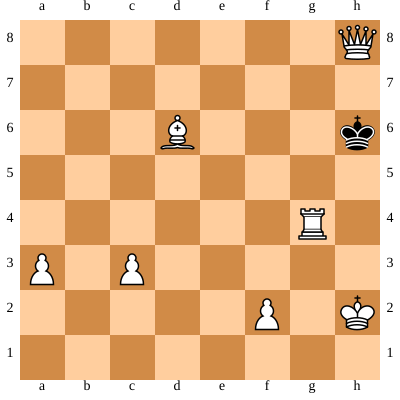

In [ ]:
import chess.pgn
import datetime
import time



movehistory =[]
game = chess.pgn.Game()
game.headers["Event"] = "Example"
game.headers["Site"] = "Linz"
game.headers["Date"] = str(datetime.datetime.now().date())
game.headers["Round"] = 1
game.headers["White"] = "MyChess"
game.headers["Black"] = "MyChess"
board = chess.Board()
while not board.is_game_over(claim_draw=True):
    start = time.time()
    nodes_per_depth = dict()
    if board.turn:
        
        print("WHITE Turn")
        move = selectmove(3,movehistory)
        board.push(move)       
    else:
        print("BLACK Turn")
        move = selectmove_ab(3,movehistory)
        board.push(move)  
    end = time.time()
    print("Move in UCI format:", move)
    print("Nodes per depth:", nodes_per_depth)
    print("Time taken by Move:", end-start) 
    display(SVG(chess.svg.board(board, size=400)))  
    print("\n")

game.add_line(movehistory)
game.headers["Result"] = str(board.result(claim_draw=True))
print(game)
print(game, file=open("selftest.pgn", "w"), end="\n\n")

SVG(chess.svg.board(board=board,size=400))

### Negamaxab vs Quiescence
We perform the reverse test : 
White is using the quiescence search approach
Black is using the Negamax_ab algorithm

WHITE Turn
Move in UCI format: g1f3
Nodes per depth: {1: 20, 2: 63, 3: 694}
Time taken by Move: 0.10189580917358398


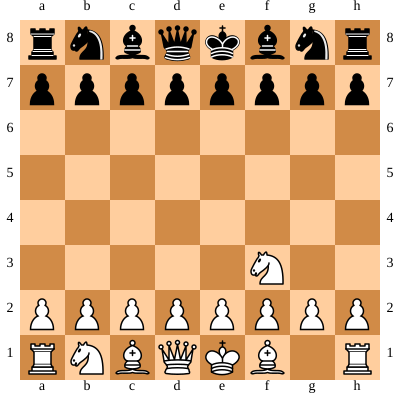



BLACK Turn
Move in UCI format: g8f6
Nodes per depth: {1: 20, 2: 93, 3: 1876, 4: 61, 5: 61}
Time taken by Move: 0.1631486415863037


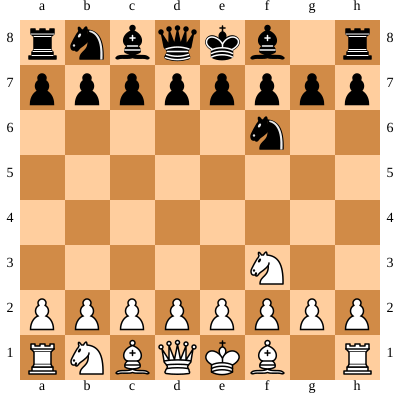



WHITE Turn
Move in UCI format: f3e5
Nodes per depth: {1: 22, 2: 67, 3: 823}
Time taken by Move: 0.0831308364868164


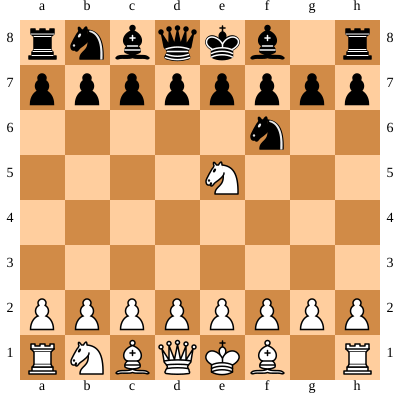



BLACK Turn
Move in UCI format: d7d6
Nodes per depth: {1: 21, 2: 211, 3: 4932, 4: 358, 5: 382, 6: 52, 7: 38, 8: 19, 9: 19, 10: 10, 11: 9, 12: 9, 13: 12, 14: 9, 15: 9, 16: 4, 17: 2}
Time taken by Move: 0.41770315170288086


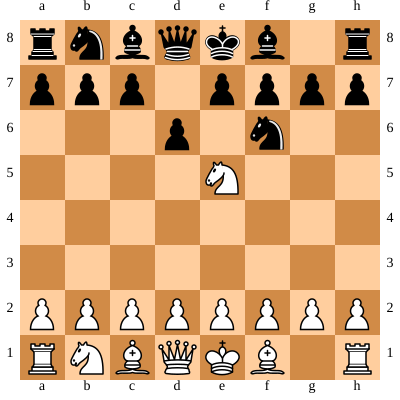



WHITE Turn
Move in UCI format: e5c4
Nodes per depth: {1: 27, 2: 429, 3: 2652}
Time taken by Move: 0.2687675952911377


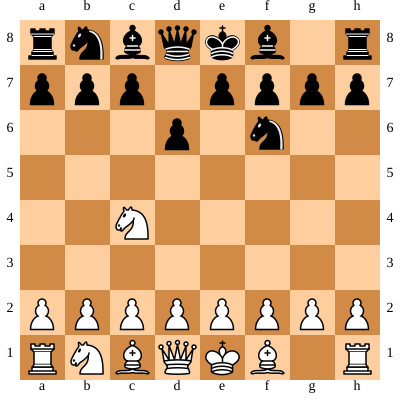



BLACK Turn
Move in UCI format: d6d5
Nodes per depth: {1: 30, 2: 263, 3: 7098, 4: 612, 5: 695, 6: 79, 7: 103, 8: 51, 9: 42, 10: 43, 11: 22, 12: 17, 13: 4, 14: 3, 15: 2, 16: 1}
Time taken by Move: 0.6446797847747803


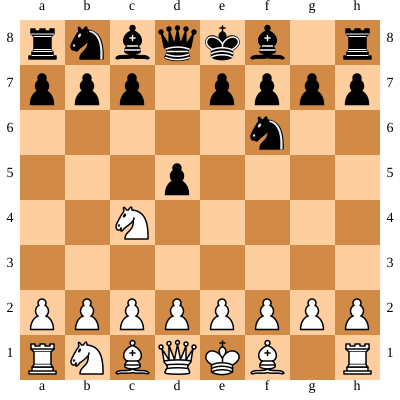



WHITE Turn
Move in UCI format: c4e5
Nodes per depth: {1: 24, 2: 130, 3: 1677}
Time taken by Move: 0.17421388626098633


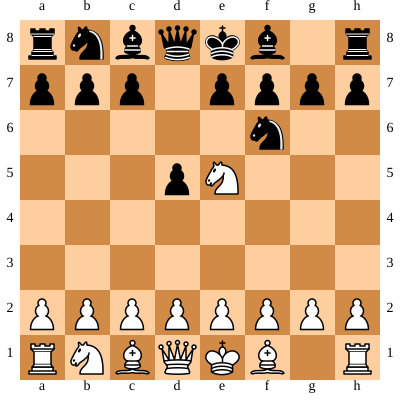



BLACK Turn
Move in UCI format: b8d7
Nodes per depth: {1: 28, 2: 327, 3: 10648, 4: 847, 5: 986, 6: 134, 7: 72, 8: 34, 9: 23, 10: 6}
Time taken by Move: 0.8858139514923096


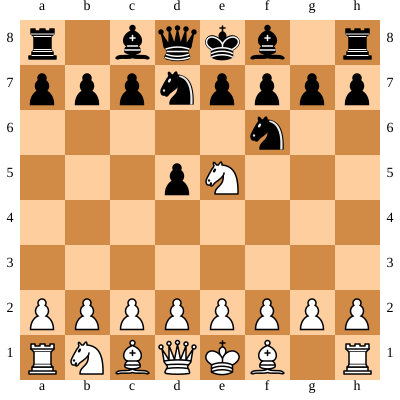



WHITE Turn
Move in UCI format: d2d4
Nodes per depth: {1: 27, 2: 226, 3: 2851}
Time taken by Move: 0.2756490707397461


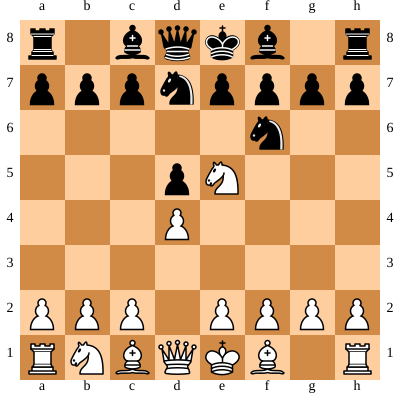



BLACK Turn
Move in UCI format: d7e5
Nodes per depth: {1: 21, 2: 181, 3: 5482, 4: 797, 5: 768, 6: 384, 7: 313, 8: 204, 9: 154, 10: 89, 11: 79, 12: 47, 13: 32, 14: 6, 15: 4}
Time taken by Move: 0.7742867469787598


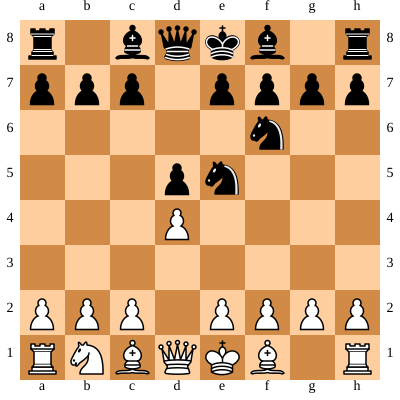



WHITE Turn
Move in UCI format: d4e5
Nodes per depth: {1: 27, 2: 275, 3: 4363}
Time taken by Move: 0.4347050189971924


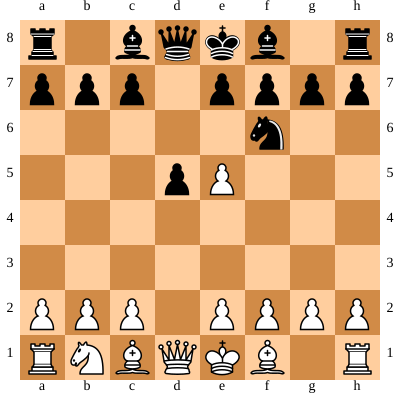



BLACK Turn
Move in UCI format: f6e4
Nodes per depth: {1: 27, 2: 417, 3: 11748, 4: 6958, 5: 11156, 6: 6796, 7: 5606, 8: 5129, 9: 5966, 10: 4526, 11: 4300, 12: 3658, 13: 3603, 14: 2781, 15: 3174, 16: 2270, 17: 2229, 18: 1327, 19: 1085, 20: 525, 21: 394, 22: 192, 23: 158, 24: 73, 25: 47, 26: 30, 27: 3, 28: 2}
Time taken by Move: 10.824321031570435


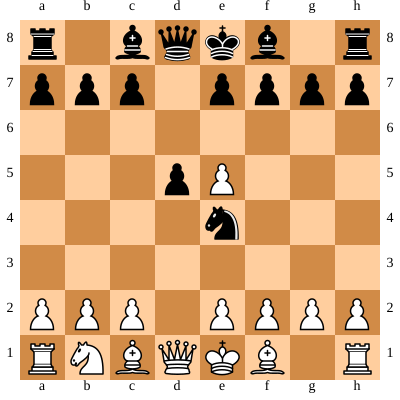



WHITE Turn
Move in UCI format: d1d4
Nodes per depth: {1: 27, 2: 142, 3: 2203}
Time taken by Move: 0.2098407745361328


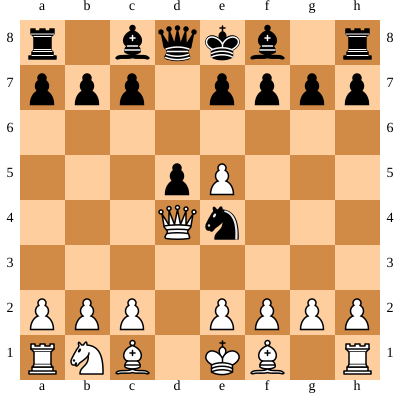



BLACK Turn
Move in UCI format: c7c5
Nodes per depth: {1: 31, 2: 588, 3: 16034, 4: 6652, 5: 8063, 6: 7492, 7: 4237, 8: 3499, 9: 2731, 10: 1837, 11: 1512, 12: 1196, 13: 1275, 14: 646, 15: 636, 16: 220, 17: 143, 18: 66, 19: 21, 20: 11, 21: 7}
Time taken by Move: 6.521769285202026


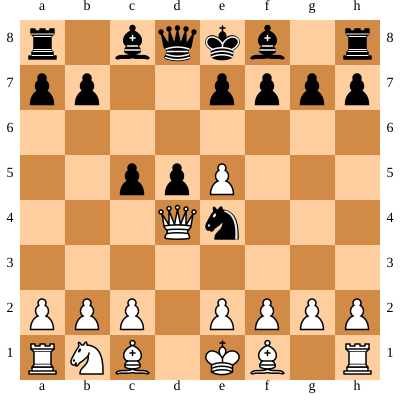



WHITE Turn
Move in UCI format: d4a4
Nodes per depth: {1: 35, 2: 270, 3: 4671}
Time taken by Move: 0.45409512519836426


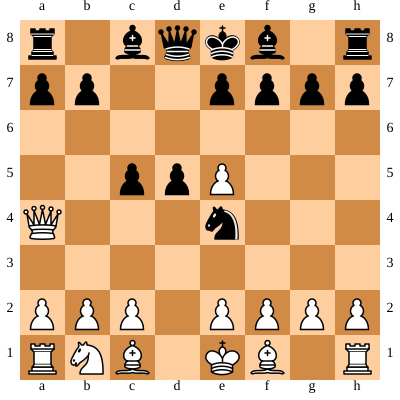



BLACK Turn
Move in UCI format: c8d7
Nodes per depth: {1: 3, 2: 73, 3: 1190, 4: 436, 5: 487, 6: 317, 7: 240, 8: 137, 9: 134, 10: 150, 11: 134, 12: 131, 13: 90, 14: 53, 15: 37, 16: 19, 17: 9, 18: 2, 19: 1}
Time taken by Move: 0.4229443073272705


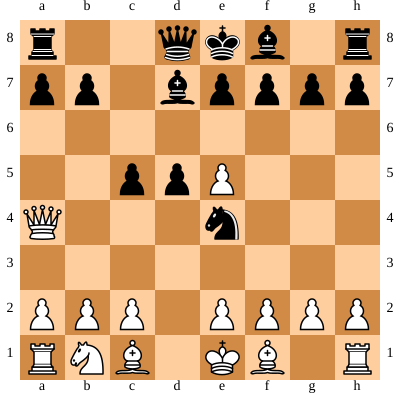



WHITE Turn
Move in UCI format: a4a3
Nodes per depth: {1: 35, 2: 487, 3: 5941}
Time taken by Move: 0.5705723762512207


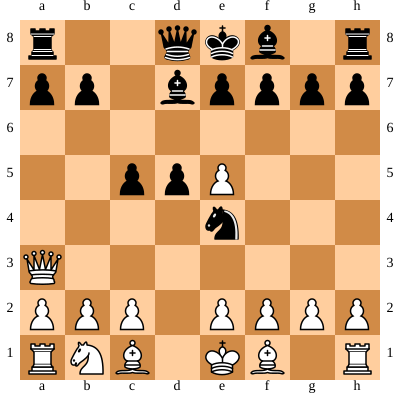



BLACK Turn
Move in UCI format: e7e6
Nodes per depth: {1: 36, 2: 677, 3: 24316, 4: 8185, 5: 9760, 6: 11751, 7: 8812, 8: 11177, 9: 7489, 10: 9321, 11: 6665, 12: 7850, 13: 6384, 14: 6997, 15: 5845, 16: 5626, 17: 4596, 18: 3916, 19: 3195, 20: 2187, 21: 1524, 22: 822, 23: 432, 24: 137, 25: 60, 26: 17, 27: 4}
Time taken by Move: 18.591724157333374


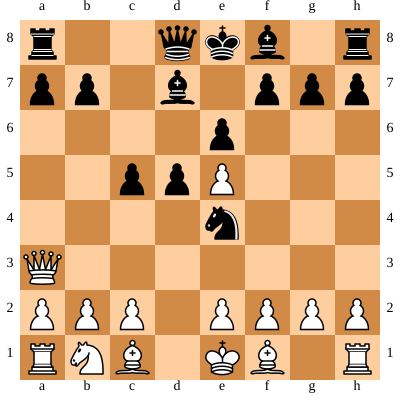



WHITE Turn
Move in UCI format: c1f4
Nodes per depth: {1: 33, 2: 477, 3: 4552}
Time taken by Move: 0.4658477306365967


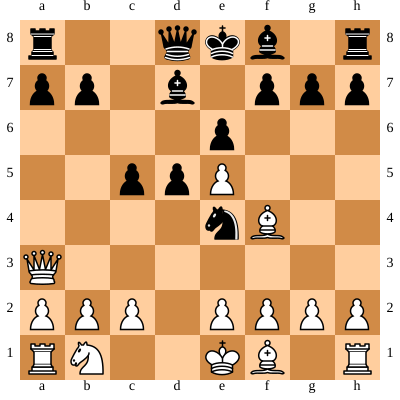



BLACK Turn
Move in UCI format: c5c4
Nodes per depth: {1: 38, 2: 493, 3: 16810, 4: 5163, 5: 7409, 6: 6248, 7: 5425, 8: 5608, 9: 5043, 10: 4696, 11: 3639, 12: 3279, 13: 1896, 14: 1106, 15: 689, 16: 350, 17: 160, 18: 59, 19: 30, 20: 23, 21: 10, 22: 2, 23: 2}
Time taken by Move: 8.168072938919067


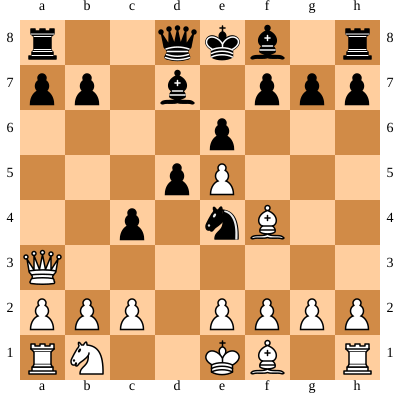



WHITE Turn
Move in UCI format: b2b4
Nodes per depth: {1: 35, 2: 497, 3: 5207}
Time taken by Move: 0.510404109954834


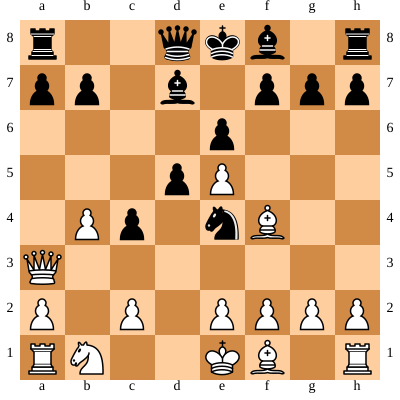



BLACK Turn
Move in UCI format: d8b6
Nodes per depth: {1: 42, 2: 390, 3: 16002, 4: 3210, 5: 6113, 6: 3366, 7: 3047, 8: 2900, 9: 2367, 10: 2054, 11: 1550, 12: 1830, 13: 1086, 14: 1181, 15: 423, 16: 272, 17: 130, 18: 84, 19: 44, 20: 14, 21: 3}
Time taken by Move: 5.034999132156372


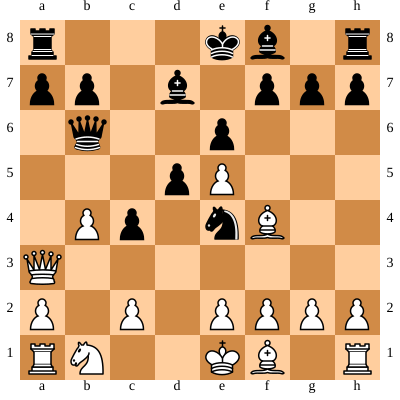



WHITE Turn
Move in UCI format: e2e3
Nodes per depth: {1: 31, 2: 432, 3: 4840}
Time taken by Move: 0.48143959045410156


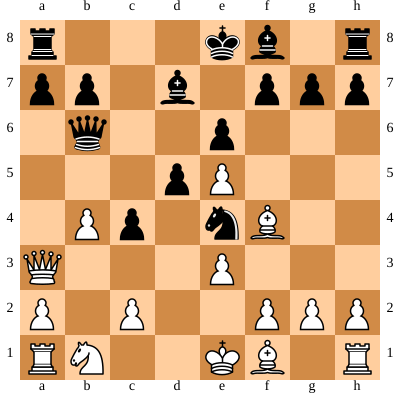



BLACK Turn
Move in UCI format: f8b4
Nodes per depth: {1: 44, 2: 129, 3: 8146, 4: 655, 5: 1448, 6: 1049, 7: 1136, 8: 748, 9: 894, 10: 779, 11: 680, 12: 909, 13: 768, 14: 1059, 15: 749, 16: 702, 17: 425, 18: 183, 19: 102, 20: 65, 21: 17, 22: 4, 23: 1, 24: 1, 25: 1}
Time taken by Move: 2.1348230838775635


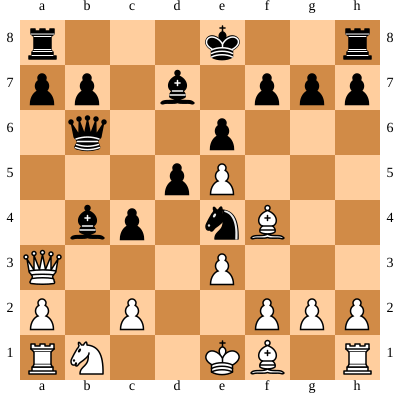



WHITE Turn
Move in UCI format: b1c3
Nodes per depth: {1: 7, 2: 278, 3: 1983}
Time taken by Move: 0.20771408081054688


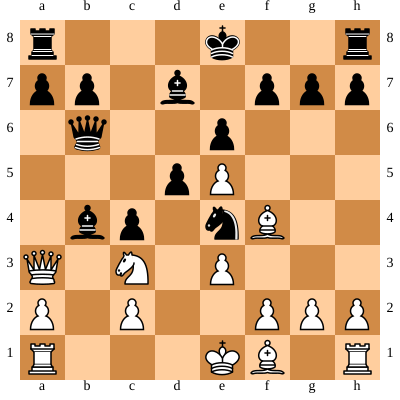



BLACK Turn
Move in UCI format: b4c3
Nodes per depth: {1: 48, 2: 330, 3: 21292, 4: 1519, 5: 2592, 6: 2867, 7: 3125, 8: 2449, 9: 2431, 10: 2508, 11: 2086, 12: 2122, 13: 1633, 14: 1348, 15: 995, 16: 894, 17: 653, 18: 452, 19: 330, 20: 228, 21: 82, 22: 43, 23: 18, 24: 5, 25: 2, 26: 1}
Time taken by Move: 5.07361626625061


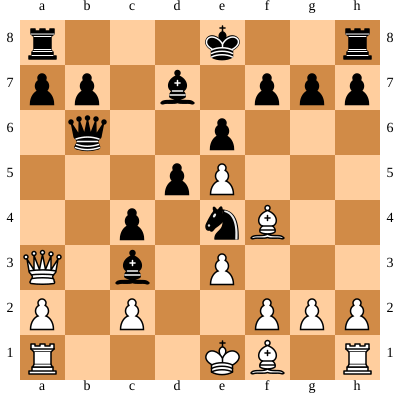



WHITE Turn
Move in UCI format: e1d1
Nodes per depth: {1: 3, 2: 130, 3: 1269}
Time taken by Move: 0.12658357620239258


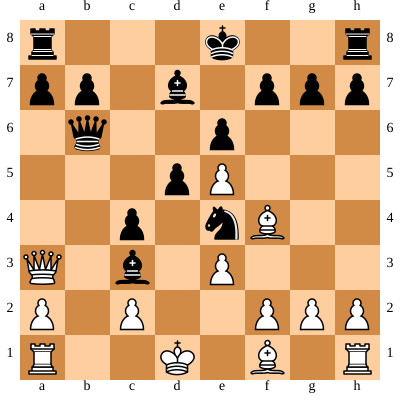



BLACK Turn
Move in UCI format: c3a1
Nodes per depth: {1: 49, 2: 541, 3: 30990, 4: 2423, 5: 4070, 6: 4243, 7: 5666, 8: 6058, 9: 7220, 10: 8548, 11: 9889, 12: 10110, 13: 10380, 14: 8999, 15: 7936, 16: 6181, 17: 4663, 18: 3470, 19: 2013, 20: 1222, 21: 538, 22: 325, 23: 186, 24: 98, 25: 26, 26: 18}
Time taken by Move: 15.576997995376587


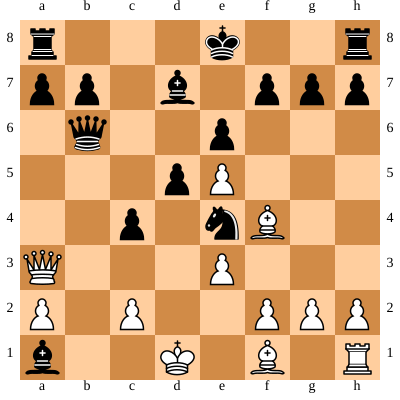



WHITE Turn
Move in UCI format: d1e2
Nodes per depth: {1: 30, 2: 789, 3: 8492}
Time taken by Move: 0.8217628002166748


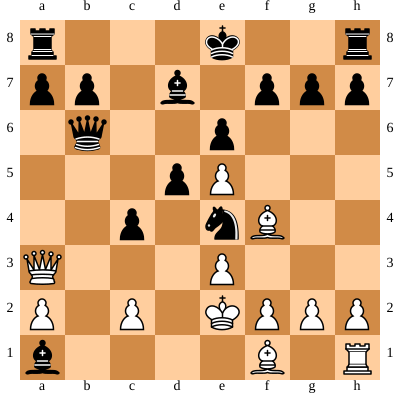



BLACK Turn
Move in UCI format: a1b2
Nodes per depth: {1: 47, 2: 418, 3: 22048, 4: 1572, 5: 2990, 6: 1945, 7: 2470, 8: 1776, 9: 1747, 10: 1612, 11: 1088, 12: 829, 13: 348, 14: 250, 15: 133, 16: 83, 17: 35, 18: 22, 19: 8, 20: 3, 21: 4, 22: 2}
Time taken by Move: 3.4210102558135986


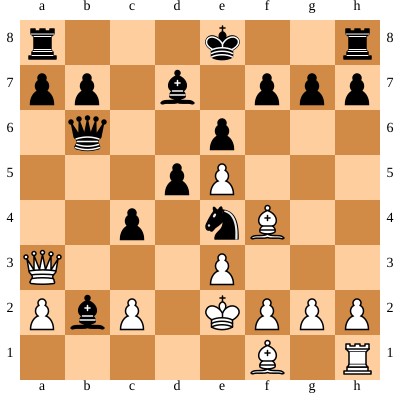



WHITE Turn
Move in UCI format: f2f3
Nodes per depth: {1: 26, 2: 743, 3: 8137}
Time taken by Move: 0.7640120983123779


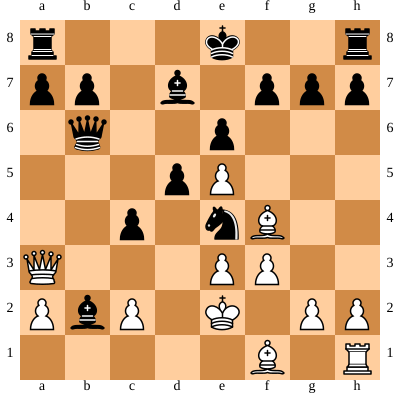



BLACK Turn
Move in UCI format: b2a3
Nodes per depth: {1: 47, 2: 341, 3: 20080, 4: 1213, 5: 2062, 6: 1428, 7: 1816, 8: 951, 9: 967, 10: 643, 11: 507, 12: 409, 13: 237, 14: 194, 15: 89, 16: 64, 17: 29, 18: 14, 19: 7, 20: 6, 21: 5, 22: 4}
Time taken by Move: 2.493407964706421


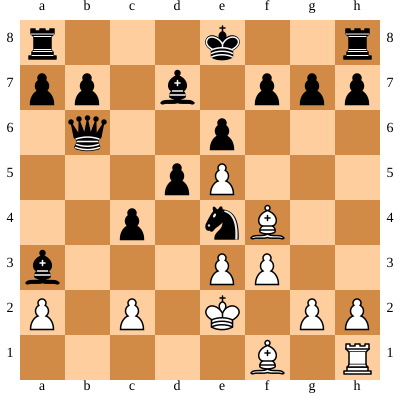



WHITE Turn
Move in UCI format: f3e4
Nodes per depth: {1: 12, 2: 425, 3: 3248}
Time taken by Move: 0.33344578742980957


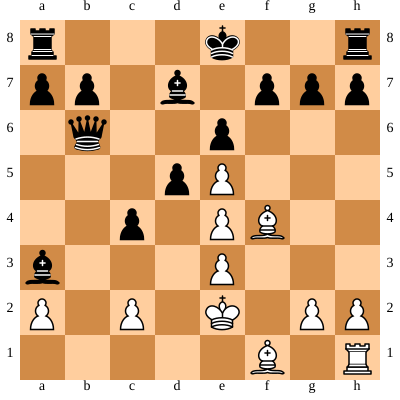



BLACK Turn
Move in UCI format: d5e4
Nodes per depth: {1: 46, 2: 299, 3: 20784, 4: 827, 5: 1511, 6: 651, 7: 889, 8: 158, 9: 229, 10: 95, 11: 82, 12: 16, 13: 12}
Time taken by Move: 1.67814040184021


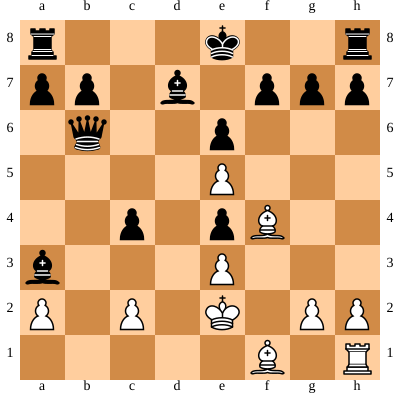



WHITE Turn
Move in UCI format: e2f2
Nodes per depth: {1: 13, 2: 233, 3: 1300}
Time taken by Move: 0.13101673126220703


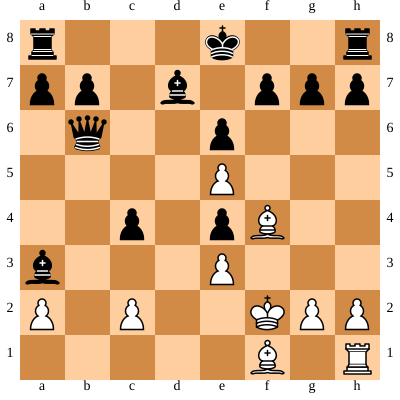



BLACK Turn
Move in UCI format: b6b1
Nodes per depth: {1: 44, 2: 241, 3: 13256, 4: 1359, 5: 1765, 6: 927, 7: 562, 8: 200, 9: 216, 10: 71, 11: 56, 12: 8, 13: 6}
Time taken by Move: 1.4730067253112793


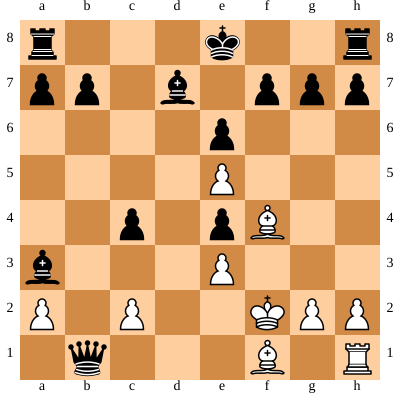



WHITE Turn
Move in UCI format: f2g1
Nodes per depth: {1: 15, 2: 454, 3: 3766}
Time taken by Move: 0.3720254898071289


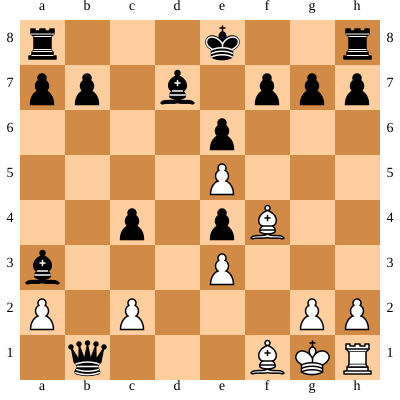



BLACK Turn
Move in UCI format: b1c2
Nodes per depth: {1: 44, 2: 128, 3: 9230, 4: 194, 5: 255, 6: 60, 7: 61, 8: 17, 9: 16, 10: 5, 11: 6, 12: 3, 13: 1}
Time taken by Move: 0.5489492416381836


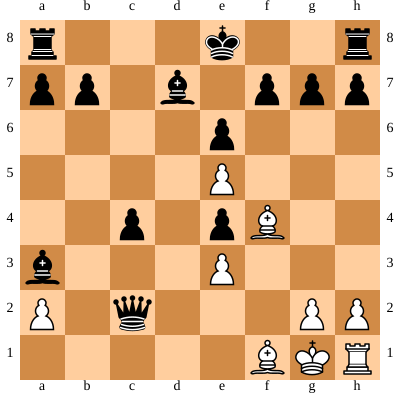



WHITE Turn
Move in UCI format: f4g5
Nodes per depth: {1: 10, 2: 302, 3: 1832}
Time taken by Move: 0.19003033638000488


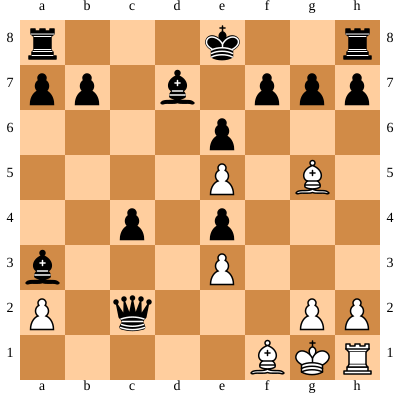



BLACK Turn
Move in UCI format: c2a2
Nodes per depth: {1: 41, 2: 226, 3: 15522, 4: 552, 5: 652, 6: 249, 7: 148, 8: 28, 9: 37, 10: 13, 11: 6}
Time taken by Move: 0.9973828792572021


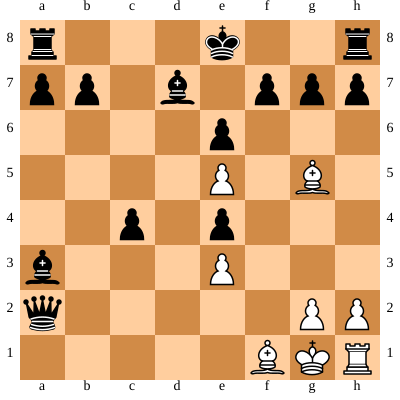



WHITE Turn
Move in UCI format: g5f4
Nodes per depth: {1: 13, 2: 373, 3: 2289}
Time taken by Move: 0.23131370544433594


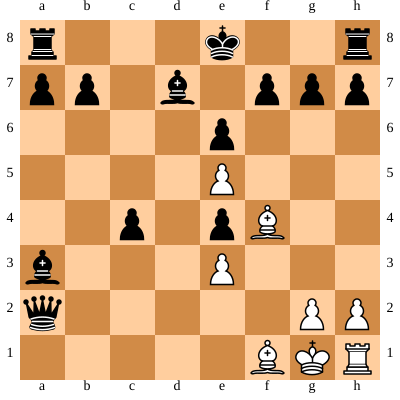



BLACK Turn
Move in UCI format: a3c5
Nodes per depth: {1: 41, 2: 120, 3: 8188, 4: 353, 5: 387, 6: 178, 7: 129, 8: 45, 9: 29, 10: 13, 11: 7, 12: 4}
Time taken by Move: 0.5614218711853027


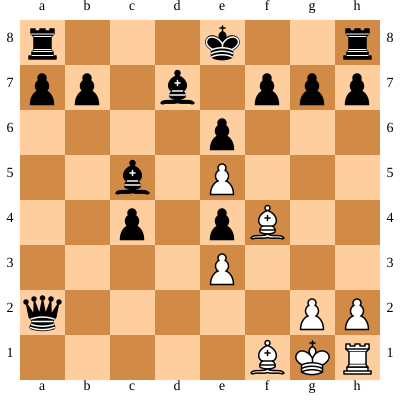



WHITE Turn
Move in UCI format: f4g5
Nodes per depth: {1: 10, 2: 321, 3: 1790}
Time taken by Move: 0.18022632598876953


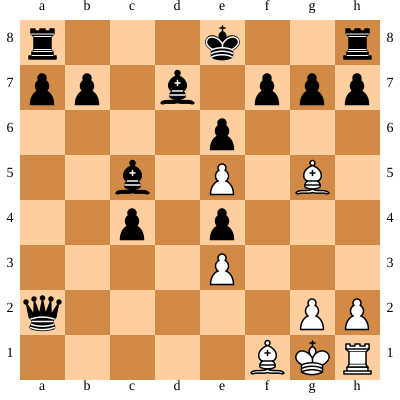



BLACK Turn
Move in UCI format: a2b3
Nodes per depth: {1: 42, 2: 268, 3: 17198, 4: 535, 5: 802, 6: 234, 7: 145, 8: 47, 9: 34, 10: 5}
Time taken by Move: 1.0930252075195312


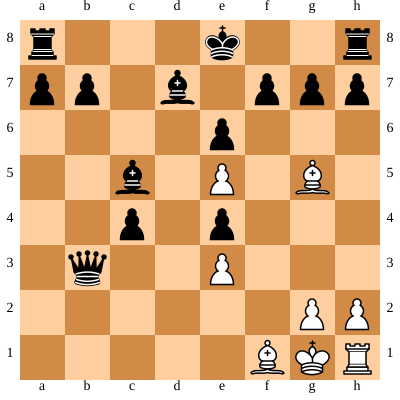



WHITE Turn
Move in UCI format: g5f4
Nodes per depth: {1: 14, 2: 433, 3: 2732}
Time taken by Move: 0.2751753330230713


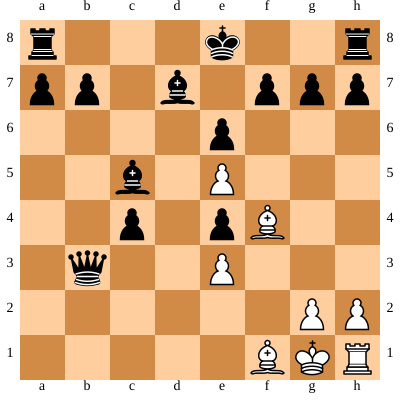



BLACK Turn
Move in UCI format: c5e3
Nodes per depth: {1: 46, 2: 120, 3: 8844, 4: 213, 5: 275, 6: 88, 7: 56, 8: 31, 9: 24}
Time taken by Move: 0.5450844764709473


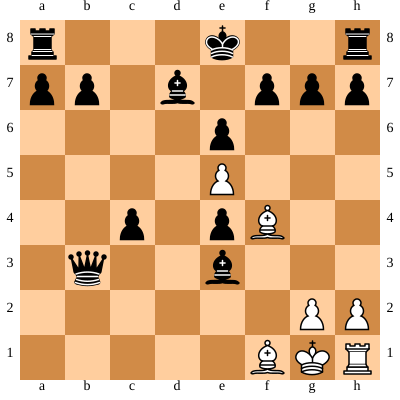



WHITE Turn
Move in UCI format: f4e3
Nodes per depth: {1: 1, 2: 38, 3: 214}
Time taken by Move: 0.02820134162902832


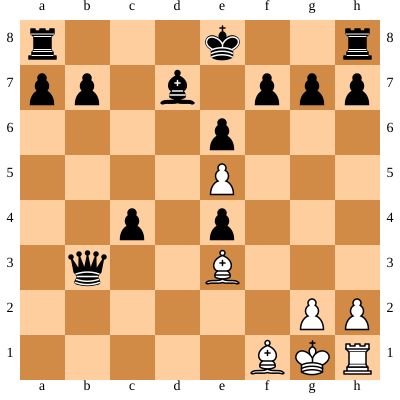



BLACK Turn
Move in UCI format: b3e3
Nodes per depth: {1: 38, 2: 108, 3: 5674, 4: 196, 5: 174, 6: 122, 7: 6}
Time taken by Move: 0.3486201763153076


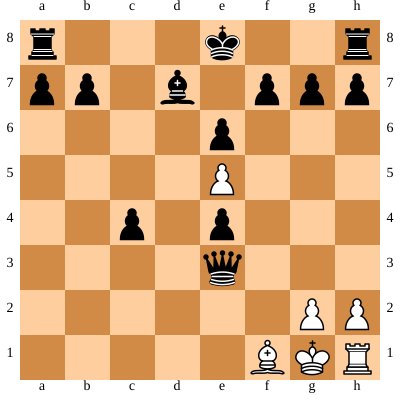



[Event "Example"]
[Site "Linz"]
[Date "2022-01-30"]
[Round "1"]
[White "MyChess"]
[Black "MyChess"]
[Result "0-1"]

1. Nf3 Nf6 2. Ne5 d6 3. Nc4 d5 4. Ne5 Nbd7 5. d4 Nxe5 6. dxe5 Ne4 7. Qd4 c5 8. Qa4+ Bd7 9. Qa3 e6 10. Bf4 c4 11. b4 Qb6 12. e3 Bxb4+ 13. Nc3 Bxc3+ 14. Kd1 Bxa1 15. Ke2 Bb2 16. f3 Bxa3 17. fxe4 dxe4 18. Kf2 Qb1 19. Kg1 Qxc2 20. Bg5 Qxa2 21. Bf4 Bc5 22. Bg5 Qb3 23. Bf4 Bxe3+ 24. Bxe3 Qxe3# 0-1


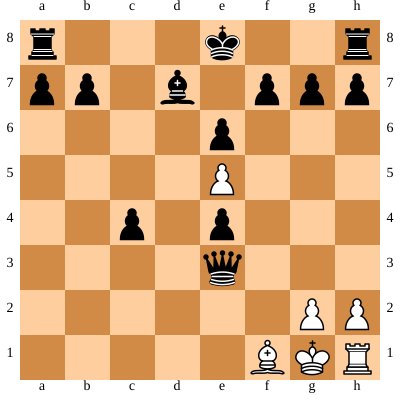

In [ ]:
import chess.pgn
import datetime
import time



movehistory = []
game = chess.pgn.Game()
game.headers["Event"] = "Example"
game.headers["Site"] = "Linz"
game.headers["Date"] = str(datetime.datetime.now().date())
game.headers["Round"] = 1
game.headers["White"] = "MyChess"
game.headers["Black"] = "MyChess"
board = chess.Board()
while not board.is_game_over(claim_draw=True):
    start = time.time()
    nodes_per_depth = dict()
    if board.turn:
        
        print("WHITE Turn")
        move = selectmove_ab(3,movehistory)
        board.push(move)       
    else:
        print("BLACK Turn")
        move = selectmove(3,movehistory)
        board.push(move)  
    end = time.time()
    print("Move in UCI format:", move)
    print("Nodes per depth:", nodes_per_depth)
    print("Time taken by Move:", end-start) 
    display(SVG(chess.svg.board(board, size=400)))  
    print("\n")

game.add_line(movehistory)
game.headers["Result"] = str(board.result(claim_draw=True))
print(game)
print(game, file=open("selftest.pgn", "w"), end="\n\n")

SVG(chess.svg.board(board=board,size=400))

WHITE Turn
Move in UCI format: g1f3
Nodes per depth: {1: 20, 2: 63, 3: 1406, 4: 12}
Time taken by Move: 0.08515286445617676


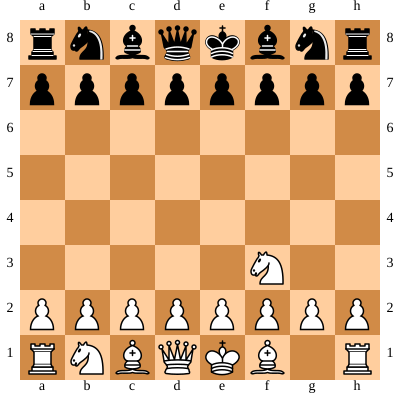



BLACK Turn
Move in UCI format: g8f6
Nodes per depth: {1: 20, 2: 93, 3: 1876, 4: 61, 5: 61}
Time taken by Move: 0.12657451629638672


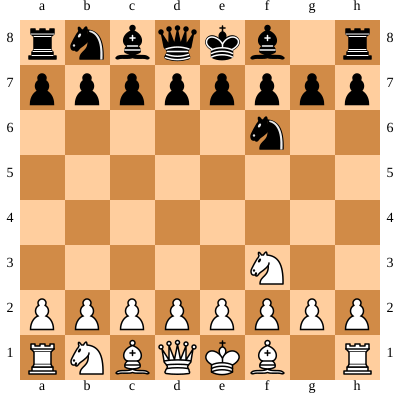



WHITE Turn
Move in UCI format: b1c3
Nodes per depth: {1: 22, 2: 97, 3: 2256, 4: 151, 5: 50, 6: 53, 7: 50, 8: 27, 9: 35, 10: 10, 11: 6, 12: 2, 13: 1, 14: 2, 15: 3, 16: 2, 17: 1}
Time taken by Move: 0.18775129318237305


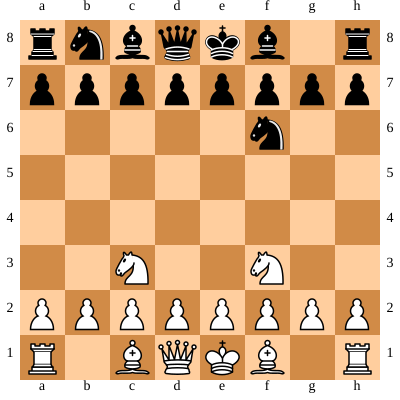



BLACK Turn
Move in UCI format: b8c6
Nodes per depth: {1: 22, 2: 122, 3: 3034, 4: 242, 5: 252, 6: 155, 7: 177, 8: 140, 9: 199, 10: 161, 11: 202, 12: 125, 13: 129, 14: 58, 15: 59, 16: 32, 17: 33, 18: 13, 19: 18, 20: 14, 21: 8, 22: 2}
Time taken by Move: 0.44853973388671875


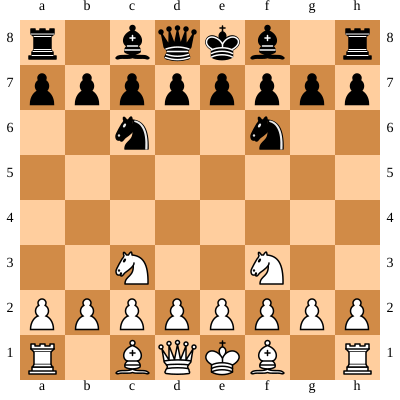



WHITE Turn
Move in UCI format: e2e3
Nodes per depth: {1: 24, 2: 342, 3: 9378, 4: 1157, 5: 1222, 6: 850, 7: 1014, 8: 930, 9: 848, 10: 706, 11: 569, 12: 382, 13: 266, 14: 184, 15: 118, 16: 83, 17: 63, 18: 34, 19: 22, 20: 6}
Time taken by Move: 1.6891627311706543


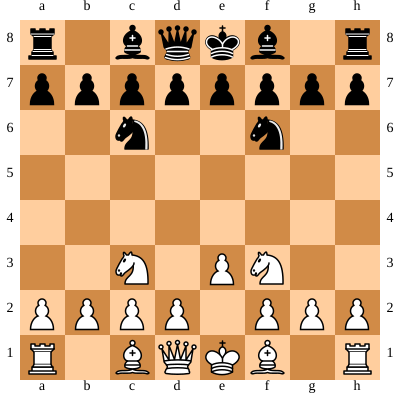



BLACK Turn
Move in UCI format: e7e6
Nodes per depth: {1: 24, 2: 342, 3: 9118, 4: 1142, 5: 1266, 6: 1092, 7: 1402, 8: 1022, 9: 1155, 10: 926, 11: 917, 12: 538, 13: 412, 14: 235, 15: 167, 16: 123, 17: 95, 18: 67, 19: 40, 20: 22, 21: 5}
Time taken by Move: 2.0941505432128906


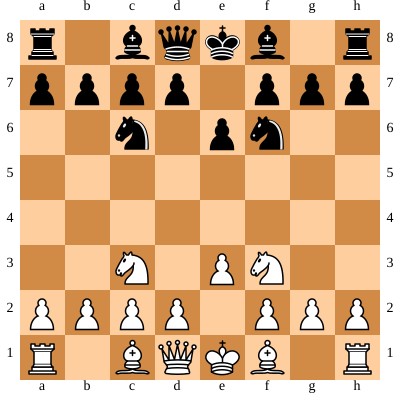



WHITE Turn
Move in UCI format: d2d4
Nodes per depth: {1: 31, 2: 372, 3: 12128, 4: 1369, 5: 1657, 6: 1147, 7: 1404, 8: 1031, 9: 928, 10: 664, 11: 654, 12: 481, 13: 336, 14: 252, 15: 168, 16: 113, 17: 67, 18: 44, 19: 28, 20: 16, 21: 10, 22: 6, 23: 5}
Time taken by Move: 2.2409725189208984


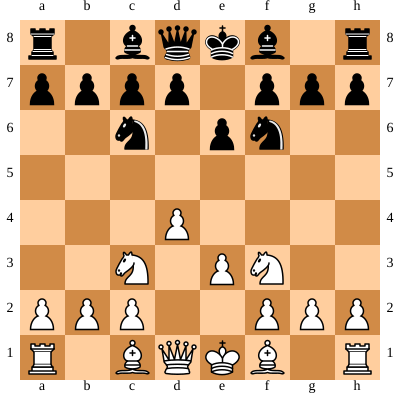



BLACK Turn
Move in UCI format: d7d5
Nodes per depth: {1: 31, 2: 202, 3: 6152, 4: 809, 5: 1259, 6: 1320, 7: 1687, 8: 1728, 9: 2022, 10: 2269, 11: 1953, 12: 1610, 13: 1388, 14: 912, 15: 750, 16: 414, 17: 220, 18: 145, 19: 136, 20: 77, 21: 91, 22: 44, 23: 42, 24: 15, 25: 10, 26: 1}
Time taken by Move: 3.0897557735443115


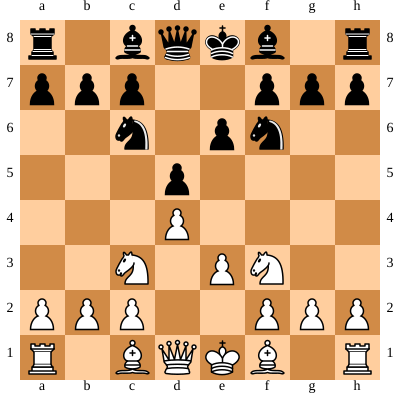



WHITE Turn
Move in UCI format: f1b5
Nodes per depth: {1: 33, 2: 148, 3: 5284, 4: 777, 5: 964, 6: 905, 7: 1004, 8: 1133, 9: 1549, 10: 1637, 11: 1688, 12: 1959, 13: 1619, 14: 1521, 15: 1167, 16: 845, 17: 615, 18: 400, 19: 236, 20: 102, 21: 106, 22: 37, 23: 31, 24: 13, 25: 14, 26: 6}
Time taken by Move: 2.9071123600006104


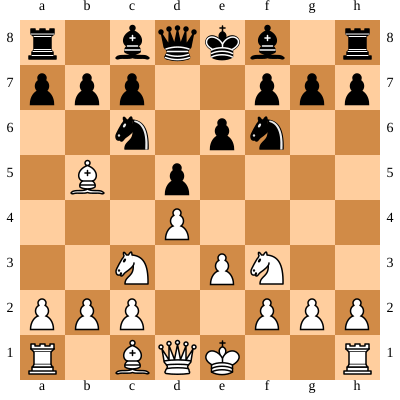



BLACK Turn
Move in UCI format: f8d6
Nodes per depth: {1: 26, 2: 196, 3: 1506, 4: 571, 5: 671, 6: 751, 7: 739, 8: 406, 9: 365, 10: 202, 11: 293, 12: 187, 13: 238, 14: 181, 15: 227, 16: 121, 17: 133, 18: 80, 19: 68, 20: 48, 21: 44, 22: 31, 23: 26, 24: 13, 25: 14, 26: 5, 27: 3}
Time taken by Move: 0.9519968032836914


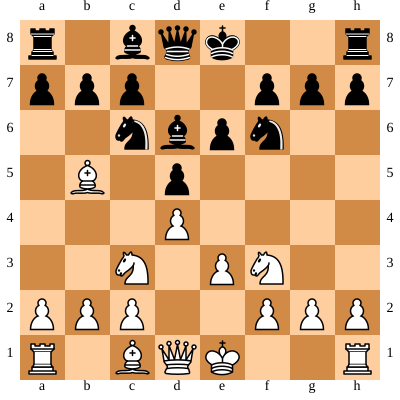



WHITE Turn
Move in UCI format: b5c6
Nodes per depth: {1: 37, 2: 59, 3: 3274, 4: 231, 5: 273, 6: 268, 7: 282, 8: 278, 9: 324, 10: 408, 11: 368, 12: 410, 13: 353, 14: 374, 15: 306, 16: 282, 17: 251, 18: 200, 19: 188, 20: 111, 21: 100, 22: 64, 23: 42, 24: 19, 25: 10, 26: 5}
Time taken by Move: 0.9357972145080566


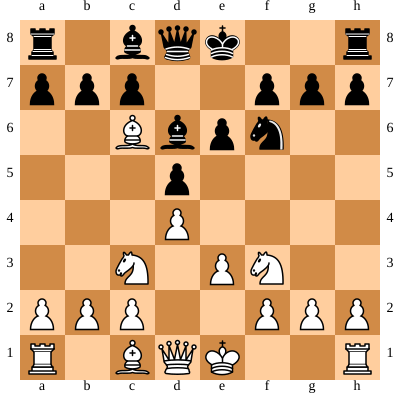



BLACK Turn
Move in UCI format: b7c6
Nodes per depth: {1: 6, 2: 76, 3: 1472, 4: 379, 5: 380, 6: 467, 7: 359, 8: 341, 9: 580, 10: 664, 11: 1149, 12: 987, 13: 1063, 14: 908, 15: 917, 16: 794, 17: 835, 18: 705, 19: 427, 20: 496, 21: 185, 22: 101, 23: 36, 24: 21, 25: 2}
Time taken by Move: 1.7732043266296387


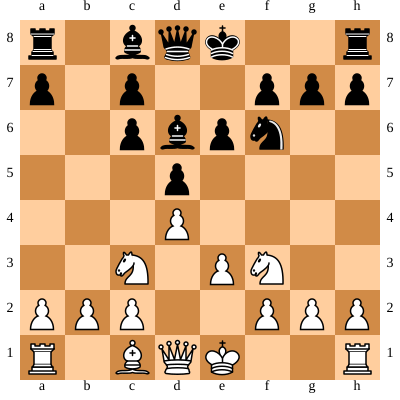



WHITE Turn
Move in UCI format: f3e5
Nodes per depth: {1: 31, 2: 243, 3: 8866, 4: 1051, 5: 1319, 6: 1285, 7: 1350, 8: 1572, 9: 1658, 10: 1640, 11: 1276, 12: 1077, 13: 804, 14: 568, 15: 448, 16: 474, 17: 390, 18: 339, 19: 238, 20: 137, 21: 86, 22: 42, 23: 30, 24: 16, 25: 11, 26: 8, 27: 1}
Time taken by Move: 2.7648825645446777


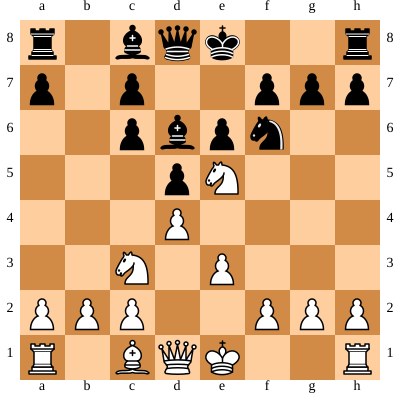



BLACK Turn
Move in UCI format: c8b7
Nodes per depth: {1: 29, 2: 283, 3: 8262, 4: 2224, 5: 2596, 6: 3278, 7: 2250, 8: 2018, 9: 2068, 10: 1434, 11: 1267, 12: 856, 13: 909, 14: 671, 15: 875, 16: 618, 17: 530, 18: 359, 19: 244, 20: 140, 21: 86, 22: 41, 23: 11, 24: 2, 25: 1, 26: 1}
Time taken by Move: 3.745143413543701


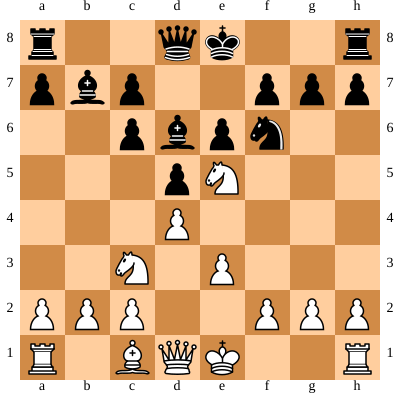



WHITE Turn
Move in UCI format: d1f3
Nodes per depth: {1: 39, 2: 573, 3: 17944, 4: 3057, 5: 5214, 6: 2041, 7: 2598, 8: 1963, 9: 2461, 10: 2176, 11: 2099, 12: 1259, 13: 1019, 14: 562, 15: 493, 16: 256, 17: 198, 18: 122, 19: 98, 20: 44, 21: 51, 22: 24, 23: 25, 24: 9, 25: 6, 26: 1}
Time taken by Move: 4.826604127883911


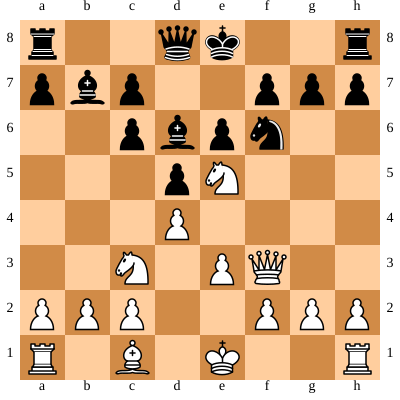



BLACK Turn
Move in UCI format: e8g8
Nodes per depth: {1: 31, 2: 665, 3: 22246, 4: 7138, 5: 7234, 6: 16259, 7: 7345, 8: 10884, 9: 6268, 10: 6482, 11: 4055, 12: 4103, 13: 2859, 14: 3061, 15: 2059, 16: 2182, 17: 1640, 18: 1580, 19: 1258, 20: 1222, 21: 933, 22: 652, 23: 386, 24: 245, 25: 86, 26: 15, 27: 6}
Time taken by Move: 13.55997347831726


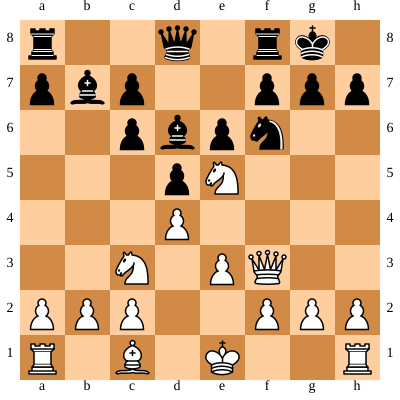



WHITE Turn
Move in UCI format: e1g1
Nodes per depth: {1: 43, 2: 381, 3: 14902, 4: 2770, 5: 6936, 6: 3383, 7: 6360, 8: 4175, 9: 6202, 10: 4565, 11: 5432, 12: 3703, 13: 3589, 14: 2603, 15: 2449, 16: 2003, 17: 1809, 18: 1575, 19: 1371, 20: 910, 21: 692, 22: 396, 23: 309, 24: 152, 25: 74, 26: 19, 27: 2}
Time taken by Move: 9.360408067703247


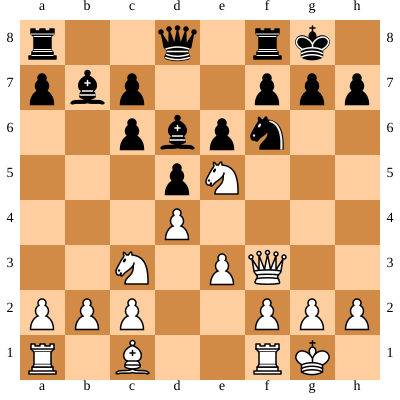



BLACK Turn
Move in UCI format: f6d7
Nodes per depth: {1: 28, 2: 528, 3: 14786, 4: 6107, 5: 7534, 6: 15013, 7: 7988, 8: 11848, 9: 8277, 10: 8511, 11: 7747, 12: 6701, 13: 6752, 14: 5882, 15: 5684, 16: 4983, 17: 4828, 18: 4048, 19: 3724, 20: 2588, 21: 2312, 22: 1362, 23: 1034, 24: 526, 25: 355, 26: 136, 27: 14, 28: 7, 29: 4}
Time taken by Move: 17.267590522766113


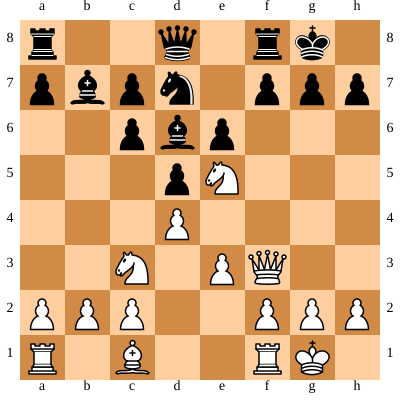



WHITE Turn
Move in UCI format: e5d7
Nodes per depth: {1: 40, 2: 244, 3: 9260, 4: 2337, 5: 5679, 6: 3128, 7: 4438, 8: 3834, 9: 4019, 10: 4751, 11: 3573, 12: 5042, 13: 3358, 14: 4468, 15: 3588, 16: 4022, 17: 2642, 18: 2387, 19: 1499, 20: 1271, 21: 780, 22: 623, 23: 292, 24: 160, 25: 48, 26: 14, 27: 4, 28: 1}
Time taken by Move: 8.779902458190918


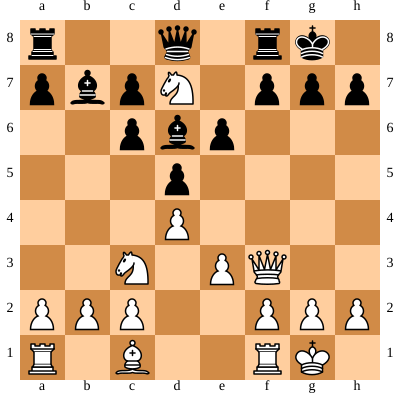



BLACK Turn
Move in UCI format: d8d7
Nodes per depth: {1: 32, 2: 142, 3: 3546, 4: 786, 5: 980, 6: 1456, 7: 859, 8: 984, 9: 737, 10: 598, 11: 590, 12: 492, 13: 493, 14: 551, 15: 499, 16: 610, 17: 505, 18: 626, 19: 501, 20: 496, 21: 358, 22: 347, 23: 205, 24: 123, 25: 23, 26: 15}
Time taken by Move: 1.8917934894561768


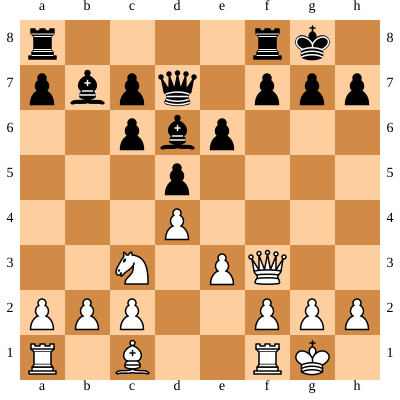



WHITE Turn
Move in UCI format: f1d1
Nodes per depth: {1: 33, 2: 598, 3: 21792, 4: 5867, 5: 8864, 6: 4371, 7: 7160, 8: 4391, 9: 5470, 10: 3633, 11: 3432, 12: 2404, 13: 2325, 14: 1396, 15: 1360, 16: 865, 17: 798, 18: 548, 19: 396, 20: 235, 21: 115, 22: 41, 23: 19}
Time taken by Move: 8.446077585220337


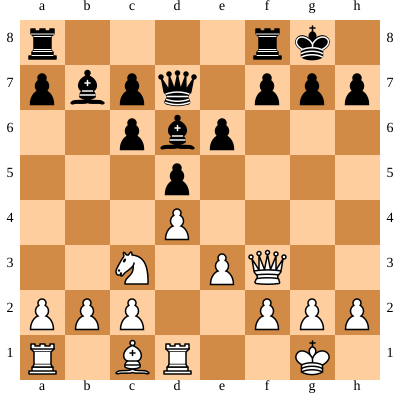



BLACK Turn
Move in UCI format: c6c5
Nodes per depth: {1: 33, 2: 624, 3: 23700, 4: 4568, 5: 5454, 6: 8261, 7: 3865, 8: 5588, 9: 4687, 10: 3025, 11: 2353, 12: 1616, 13: 1359, 14: 1023, 15: 1092, 16: 623, 17: 566, 18: 301, 19: 268, 20: 111, 21: 71, 22: 22, 23: 10}
Time taken by Move: 7.224710464477539


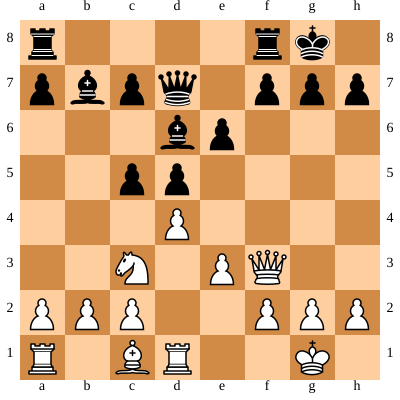



WHITE Turn
Move in UCI format: a1b1
Nodes per depth: {1: 35, 2: 522, 3: 16788, 4: 4999, 5: 12101, 6: 8647, 7: 16024, 8: 11415, 9: 14893, 10: 14837, 11: 13079, 12: 12538, 13: 10055, 14: 9146, 15: 7010, 16: 6296, 17: 5139, 18: 3918, 19: 3187, 20: 1946, 21: 1261, 22: 611, 23: 351, 24: 103, 25: 37, 26: 5}
Time taken by Move: 21.724603176116943


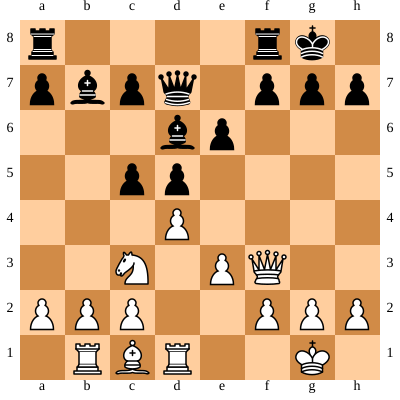



BLACK Turn
Move in UCI format: d7c6
Nodes per depth: {1: 36, 2: 451, 3: 18210, 4: 5551, 5: 6064, 6: 13732, 7: 7390, 8: 14394, 9: 12379, 10: 13513, 11: 12091, 12: 10879, 13: 9854, 14: 8670, 15: 8417, 16: 7664, 17: 6585, 18: 4842, 19: 3892, 20: 2246, 21: 1463, 22: 776, 23: 456, 24: 177, 25: 67, 26: 17, 27: 5}
Time taken by Move: 20.623019695281982


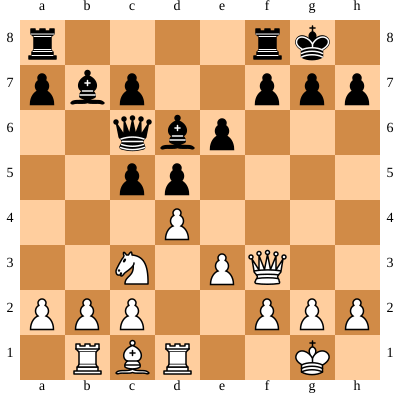



WHITE Turn
Move in UCI format: b1a1
Nodes per depth: {1: 34, 2: 434, 3: 13314, 4: 4571, 5: 10216, 6: 8291, 7: 15637, 8: 13549, 9: 19951, 10: 21144, 11: 19684, 12: 20868, 13: 14979, 14: 16359, 15: 13012, 16: 12524, 17: 9772, 18: 8693, 19: 5064, 20: 3951, 21: 1607, 22: 853, 23: 356, 24: 65, 25: 23, 26: 4}
Time taken by Move: 30.435997486114502


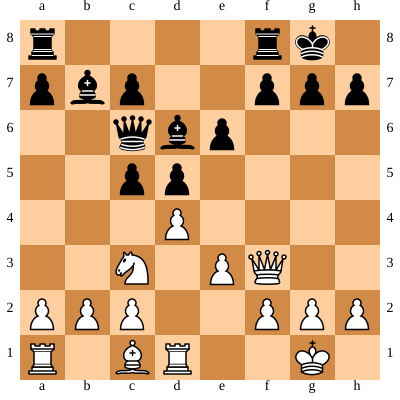



BLACK Turn
Move in UCI format: f8e8
Nodes per depth: {1: 33, 2: 303, 3: 11006, 4: 4016, 5: 5822, 6: 13627, 7: 10519, 8: 18333, 9: 19101, 10: 24768, 11: 24131, 12: 23424, 13: 21859, 14: 19132, 15: 17424, 16: 14717, 17: 11257, 18: 8339, 19: 5355, 20: 3066, 21: 1419, 22: 572, 23: 268, 24: 122, 25: 39, 26: 6}
Time taken by Move: 33.385002851486206


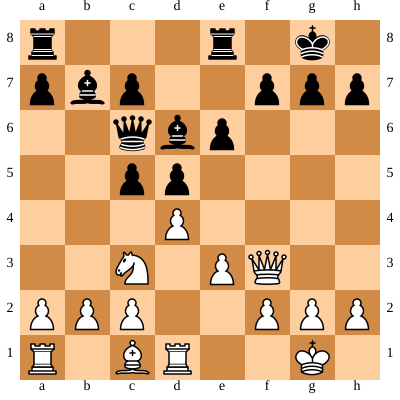



WHITE Turn
Move in UCI format: d1d2
Nodes per depth: {1: 35, 2: 821, 3: 26836, 4: 9327, 5: 22518, 6: 16839, 7: 32172, 8: 24803, 9: 38920, 10: 35673, 11: 39979, 12: 35580, 13: 28859, 14: 24374, 15: 20604, 16: 15493, 17: 14052, 18: 9970, 19: 8407, 20: 4380, 21: 2620, 22: 1132, 23: 461, 24: 168, 25: 45, 26: 6}
Time taken by Move: 53.58969855308533


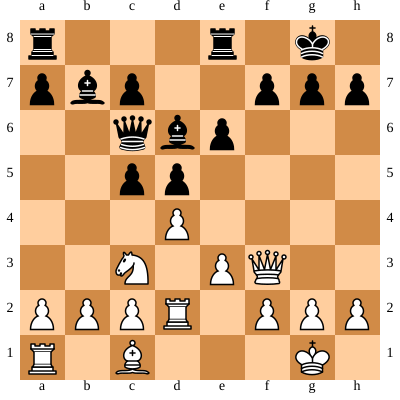



BLACK Turn
Move in UCI format: a8d8
Nodes per depth: {1: 34, 2: 340, 3: 11718, 4: 3861, 5: 5335, 6: 12120, 7: 9189, 8: 16380, 9: 16529, 10: 22755, 11: 23349, 12: 25989, 13: 28410, 14: 28477, 15: 31085, 16: 29878, 17: 25792, 18: 21993, 19: 14452, 20: 9463, 21: 4672, 22: 2707, 23: 879, 24: 341, 25: 86, 26: 25}
Time taken by Move: 44.351035594940186


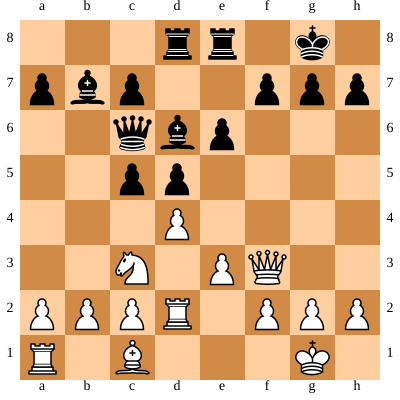



WHITE Turn
Move in UCI format: d2d3
Nodes per depth: {1: 35, 2: 794, 3: 24900, 4: 9128, 5: 22651, 6: 16990, 7: 32108, 8: 23496, 9: 36542, 10: 33326, 11: 41292, 12: 41489, 13: 44977, 14: 49382, 15: 50018, 16: 52479, 17: 53164, 18: 47864, 19: 40455, 20: 27759, 21: 19811, 22: 10864, 23: 6007, 24: 2753, 25: 1024, 26: 279, 27: 103}
Time taken by Move: 88.07888150215149


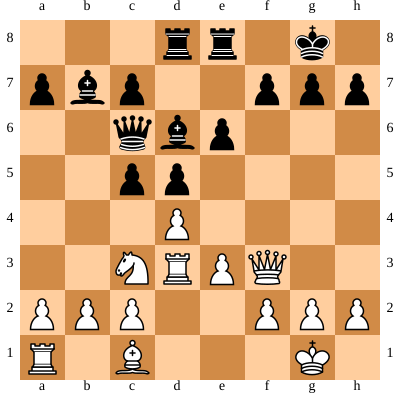



BLACK Turn
Move in UCI format: c5c4
Nodes per depth: {1: 33, 2: 435, 3: 15670, 4: 4804, 5: 5651, 6: 13425, 7: 8593, 8: 15772, 9: 12834, 10: 19139, 11: 17044, 12: 18361, 13: 17299, 14: 16356, 15: 15307, 16: 14798, 17: 12194, 18: 10774, 19: 7048, 20: 5779, 21: 3016, 22: 2139, 23: 800, 24: 336, 25: 26, 26: 10}
Time taken by Move: 29.75899076461792


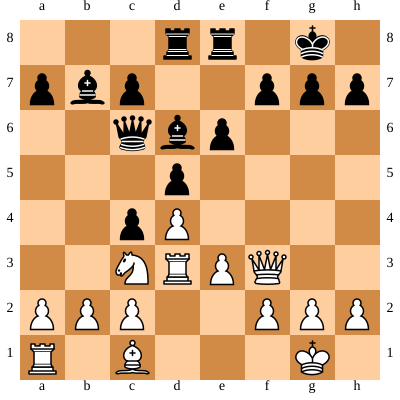



WHITE Turn
Move in UCI format: d3d1
Nodes per depth: {1: 34, 2: 540, 3: 15988, 4: 7426, 5: 13877, 6: 9255, 7: 20497, 8: 10739, 9: 17428, 10: 15556, 11: 21160, 12: 19300, 13: 23190, 14: 21259, 15: 23594, 16: 19742, 17: 22444, 18: 15488, 19: 16139, 20: 8655, 21: 6911, 22: 2770, 23: 1829, 24: 576, 25: 316, 26: 5, 27: 2}
Time taken by Move: 39.538021087646484


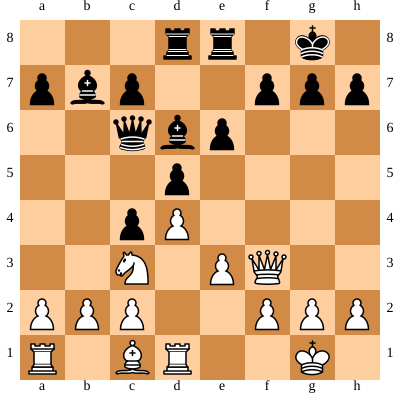



BLACK Turn
Move in UCI format: e6e5
Nodes per depth: {1: 35, 2: 528, 3: 19988, 4: 2436, 5: 2826, 6: 4614, 7: 2936, 8: 4259, 9: 3146, 10: 3282, 11: 2428, 12: 2283, 13: 2242, 14: 2468, 15: 2601, 16: 2880, 17: 2750, 18: 2568, 19: 1996, 20: 1263, 21: 744, 22: 460, 23: 164, 24: 105, 25: 21, 26: 1}
Time taken by Move: 7.403727293014526


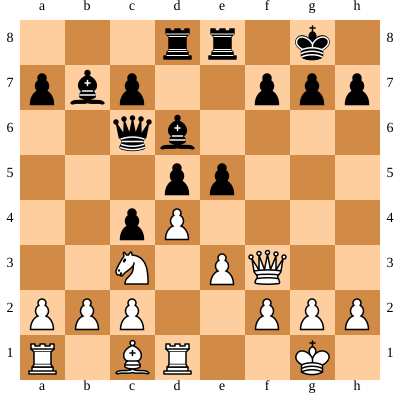



WHITE Turn
Move in UCI format: d4e5
Nodes per depth: {1: 35, 2: 637, 3: 20810, 4: 5004, 5: 13933, 6: 10733, 7: 23075, 8: 21380, 9: 34298, 10: 28810, 11: 37378, 12: 32303, 13: 38455, 14: 32699, 15: 33393, 16: 27225, 17: 29047, 18: 20722, 19: 21452, 20: 11964, 21: 10902, 22: 5561, 23: 4121, 24: 2090, 25: 993, 26: 160, 27: 9}
Time taken by Move: 59.14250993728638


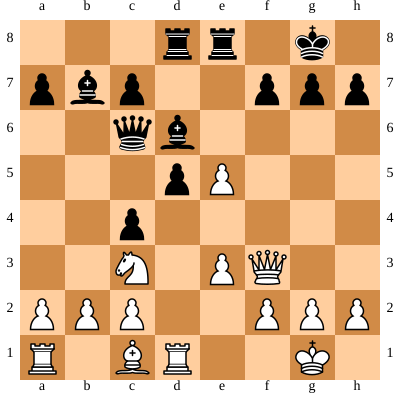



BLACK Turn
Move in UCI format: e8e5
Nodes per depth: {1: 34, 2: 347, 3: 11090, 4: 7144, 5: 11809, 6: 22030, 7: 21608, 8: 29358, 9: 24196, 10: 17760, 11: 17192, 12: 10471, 13: 9784, 14: 6786, 15: 5519, 16: 3707, 17: 2914, 18: 2106, 19: 1725, 20: 1004, 21: 621, 22: 300, 23: 126, 24: 22}
Time taken by Move: 26.75694179534912


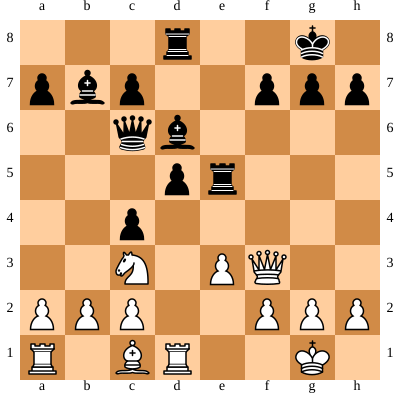



WHITE Turn
Move in UCI format: a1b1
Nodes per depth: {1: 36, 2: 561, 3: 17450, 4: 5438, 5: 12412, 6: 11223, 7: 16046, 8: 10469, 9: 12433, 10: 10987, 11: 11013, 12: 9402, 13: 7765, 14: 5836, 15: 5425, 16: 3772, 17: 3985, 18: 2358, 19: 1928, 20: 776, 21: 326, 22: 104, 23: 30, 24: 2}
Time taken by Move: 18.276564121246338


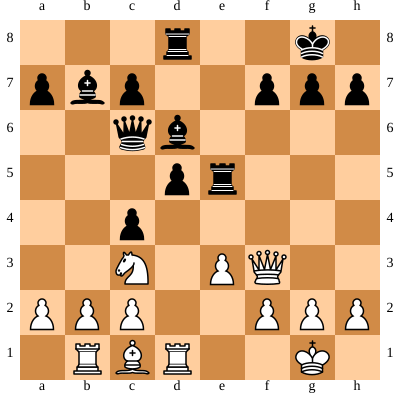



BLACK Turn
Move in UCI format: c6c5
Nodes per depth: {1: 40, 2: 652, 3: 23180, 4: 6077, 5: 8164, 6: 16254, 7: 10615, 8: 8904, 9: 6093, 10: 4625, 11: 4005, 12: 3571, 13: 2656, 14: 2258, 15: 1459, 16: 1363, 17: 754, 18: 548, 19: 292, 20: 97, 21: 26}
Time taken by Move: 11.290422677993774


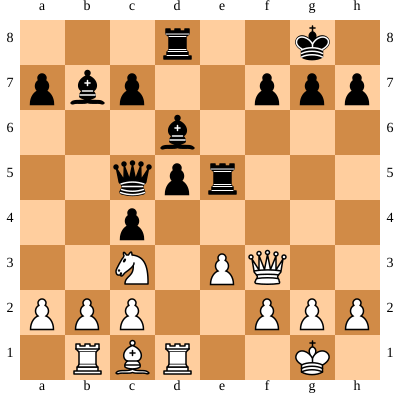



WHITE Turn
Move in UCI format: c3e2
Nodes per depth: {1: 35, 2: 473, 3: 17606, 4: 4780, 5: 10192, 6: 9708, 7: 16729, 8: 11661, 9: 15511, 10: 15819, 11: 17224, 12: 15211, 13: 13048, 14: 11805, 15: 9533, 16: 8278, 17: 5985, 18: 4542, 19: 2754, 20: 1535, 21: 765, 22: 421, 23: 149, 24: 44, 25: 16, 26: 2}
Time taken by Move: 23.82068109512329


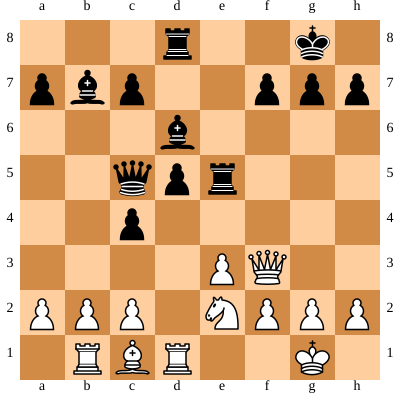



BLACK Turn
Move in UCI format: c5b6
Nodes per depth: {1: 41, 2: 460, 3: 16406, 4: 4470, 5: 6289, 6: 9919, 7: 6481, 8: 8592, 9: 8044, 10: 7550, 11: 7989, 12: 7889, 13: 7493, 14: 6340, 15: 5428, 16: 3995, 17: 3126, 18: 1868, 19: 1121, 20: 633, 21: 346, 22: 128, 23: 27, 24: 10}
Time taken by Move: 13.557200193405151


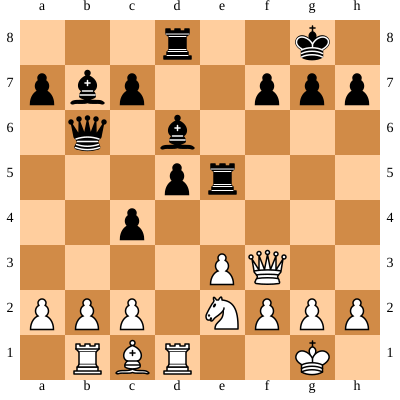



WHITE Turn
Move in UCI format: e2d4
Nodes per depth: {1: 34, 2: 407, 3: 13964, 4: 5601, 5: 9902, 6: 13294, 7: 21137, 8: 23584, 9: 32120, 10: 43331, 11: 48925, 12: 57766, 13: 62976, 14: 66998, 15: 66704, 16: 58456, 17: 54351, 18: 37647, 19: 30337, 20: 15972, 21: 9162, 22: 3179, 23: 1224, 24: 244, 25: 37}
Time taken by Move: 87.09473299980164


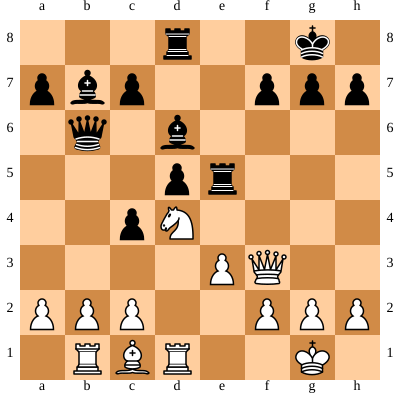



BLACK Turn
Move in UCI format: d6c5
Nodes per depth: {1: 45, 2: 640, 3: 23456, 4: 6745, 5: 12670, 6: 18556, 7: 18033, 8: 27617, 9: 36403, 10: 50868, 11: 57294, 12: 67019, 13: 70891, 14: 69838, 15: 58568, 16: 49612, 17: 31597, 18: 21621, 19: 10588, 20: 4411, 21: 1615, 22: 408, 23: 79, 24: 1}
Time taken by Move: 80.29812979698181


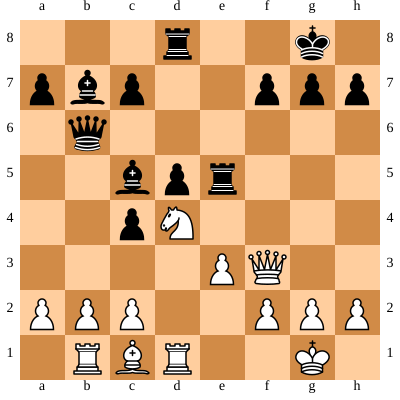



WHITE Turn
Move in UCI format: f3f4
Nodes per depth: {1: 35, 2: 642, 3: 18964, 4: 6400, 5: 10664, 6: 13926, 7: 20532, 8: 23624, 9: 35833, 10: 40340, 11: 55019, 12: 58480, 13: 74324, 14: 71168, 15: 79125, 16: 64878, 17: 63186, 18: 37242, 19: 28234, 20: 11029, 21: 5901, 22: 1518, 23: 438, 24: 137, 25: 5}
Time taken by Move: 93.20471501350403


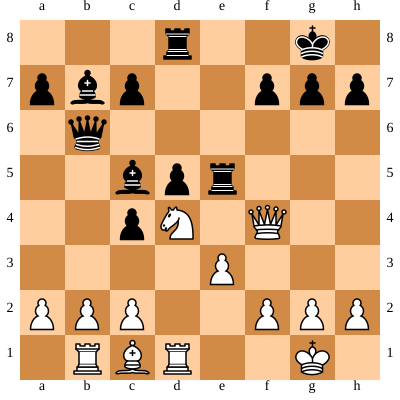



BLACK Turn
Move in UCI format: e5e4
Nodes per depth: {1: 49, 2: 493, 3: 19002, 4: 4904, 5: 7799, 6: 7679, 7: 7054, 8: 10456, 9: 11687, 10: 17630, 11: 21125, 12: 26905, 13: 29262, 14: 30941, 15: 27492, 16: 27855, 17: 21079, 18: 18535, 19: 11398, 20: 7290, 21: 2990, 22: 1103, 23: 236, 24: 11, 25: 4}
Time taken by Move: 38.83552265167236


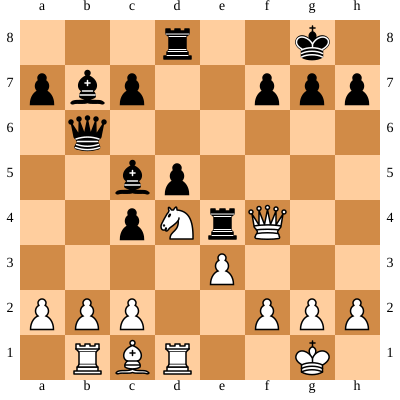



WHITE Turn
Move in UCI format: f4g5
Nodes per depth: {1: 38, 2: 256, 3: 11172, 4: 3540, 5: 6278, 6: 9077, 7: 14494, 8: 16295, 9: 23961, 10: 25737, 11: 32603, 12: 31894, 13: 40848, 14: 36183, 15: 36771, 16: 27608, 17: 23495, 18: 13586, 19: 9826, 20: 4123, 21: 2046, 22: 659, 23: 195, 24: 45}
Time taken by Move: 46.83034348487854


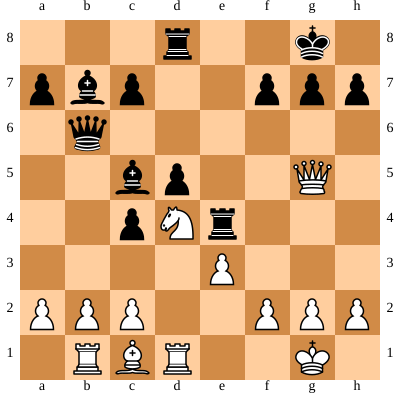



BLACK Turn
Move in UCI format: e4e8
Nodes per depth: {1: 49, 2: 358, 3: 9456, 4: 2008, 5: 2724, 6: 3384, 7: 3634, 8: 5767, 9: 7726, 10: 9455, 11: 12190, 12: 13883, 13: 16360, 14: 15983, 15: 14722, 16: 15032, 17: 12068, 18: 13132, 19: 7734, 20: 7660, 21: 2031, 22: 1336, 23: 135, 24: 27}
Time taken by Move: 22.05371069908142


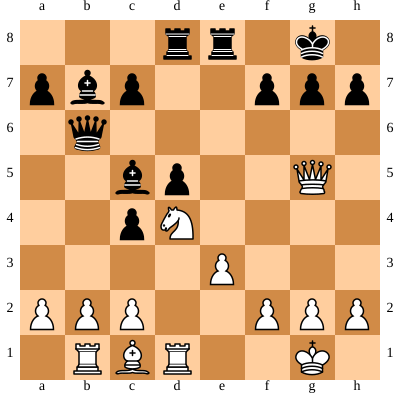



WHITE Turn
Move in UCI format: d4f5
Nodes per depth: {1: 41, 2: 767, 3: 21974, 4: 8151, 5: 14736, 6: 18232, 7: 27848, 8: 27638, 9: 42499, 10: 42087, 11: 61655, 12: 62264, 13: 85839, 14: 74480, 15: 86251, 16: 65510, 17: 65794, 18: 38018, 19: 30312, 20: 11545, 21: 6391, 22: 1514, 23: 382, 24: 94}
Time taken by Move: 99.63419675827026


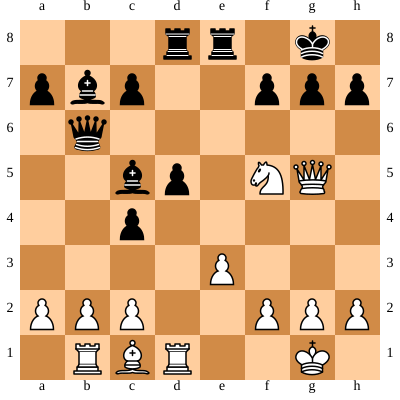



BLACK Turn
Move in UCI format: b6g6
Nodes per depth: {1: 45, 2: 260, 3: 6380, 4: 3005, 5: 4351, 6: 7012, 7: 6238, 8: 8819, 9: 7451, 10: 9517, 11: 9429, 12: 10580, 13: 10087, 14: 10025, 15: 8204, 16: 7098, 17: 4931, 18: 3798, 19: 1967, 20: 1113, 21: 393, 22: 116, 23: 17, 24: 6}
Time taken by Move: 14.957263469696045


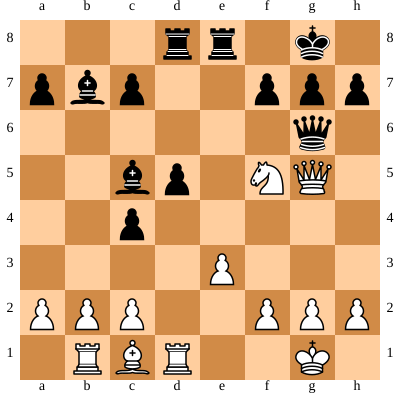



WHITE Turn
Move in UCI format: e3e4
Nodes per depth: {1: 39, 2: 348, 3: 10620, 4: 2689, 5: 4516, 6: 4172, 7: 5967, 8: 4218, 9: 4811, 10: 4797, 11: 4366, 12: 4098, 13: 3744, 14: 3056, 15: 2605, 16: 2192, 17: 1626, 18: 1101, 19: 564, 20: 260, 21: 101, 22: 32, 23: 6}
Time taken by Move: 7.668471097946167


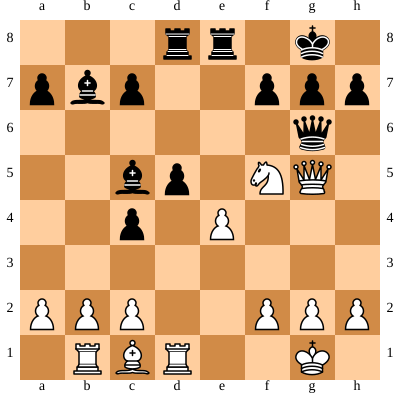



BLACK Turn
Move in UCI format: d5d4
Nodes per depth: {1: 44, 2: 456, 3: 13020, 4: 6378, 5: 12739, 6: 17388, 7: 19814, 8: 21868, 9: 23967, 10: 18929, 11: 21825, 12: 13243, 13: 14636, 14: 8342, 15: 7346, 16: 4977, 17: 3897, 18: 2901, 19: 1869, 20: 1250, 21: 599, 22: 232, 23: 26, 24: 7}
Time taken by Move: 27.29510998725891


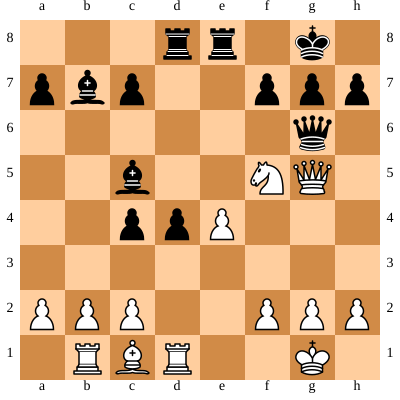



WHITE Turn
Move in UCI format: e4e5
Nodes per depth: {1: 43, 2: 719, 3: 19486, 4: 6828, 5: 15030, 6: 15597, 7: 26387, 8: 20619, 9: 22637, 10: 19313, 11: 18460, 12: 17757, 13: 18103, 14: 16307, 15: 15347, 16: 11099, 17: 10759, 18: 5787, 19: 4503, 20: 1573, 21: 585, 22: 115, 23: 3}
Time taken by Move: 33.579726457595825


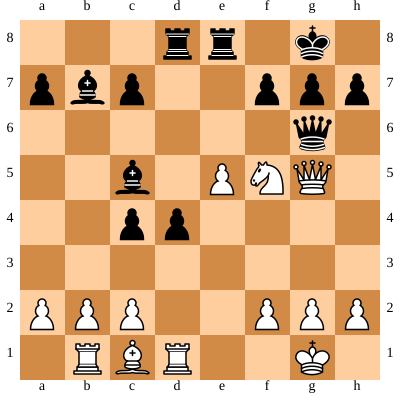



BLACK Turn
Move in UCI format: b7e4
Nodes per depth: {1: 44, 2: 390, 3: 13200, 4: 5804, 5: 10928, 6: 14524, 7: 15469, 8: 15373, 9: 18478, 10: 13930, 11: 17507, 12: 13692, 13: 17597, 14: 14766, 15: 15889, 16: 14168, 17: 11193, 18: 9148, 19: 4753, 20: 2417, 21: 889, 22: 250, 23: 42, 24: 4}
Time taken by Move: 29.141416788101196


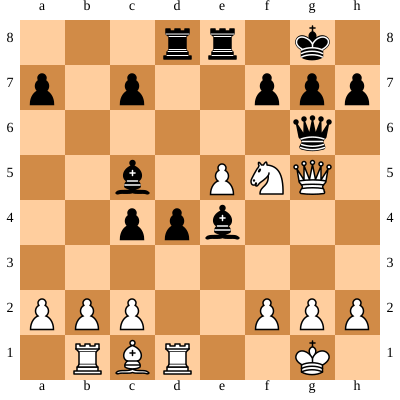



WHITE Turn
Move in UCI format: g2g4
Nodes per depth: {1: 43, 2: 804, 3: 21090, 4: 10841, 5: 25022, 6: 29134, 7: 49659, 8: 52992, 9: 60343, 10: 76682, 11: 82131, 12: 113635, 13: 113081, 14: 143668, 15: 132131, 16: 118796, 17: 99444, 18: 66726, 19: 42531, 20: 18662, 21: 7793, 22: 2641, 23: 522, 24: 99, 25: 5}
Time taken by Move: 164.36337661743164


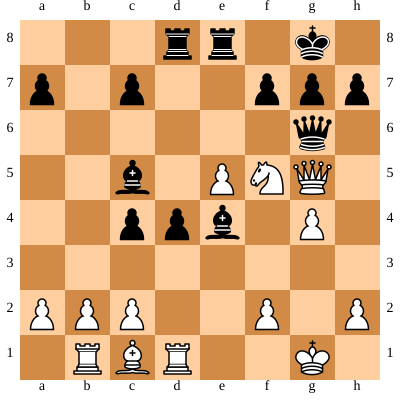



BLACK Turn
Move in UCI format: e4c2
Nodes per depth: {1: 46, 2: 301, 3: 11612, 4: 4461, 5: 8153, 6: 10968, 7: 14055, 8: 13195, 9: 16211, 10: 11907, 11: 16347, 12: 9767, 13: 13896, 14: 7378, 15: 8784, 16: 5090, 17: 5191, 18: 3311, 19: 2683, 20: 1174, 21: 692, 22: 170, 23: 51, 24: 10}
Time taken by Move: 20.57791543006897


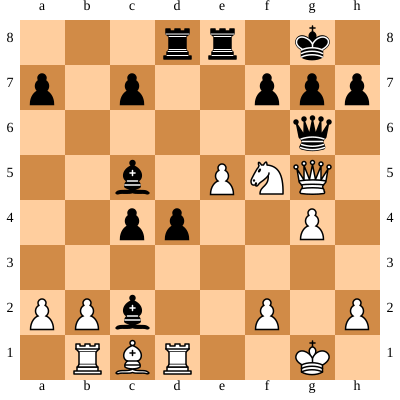



WHITE Turn
Move in UCI format: c1f4
Nodes per depth: {1: 39, 2: 782, 3: 18042, 4: 13437, 5: 31792, 6: 36585, 7: 60168, 8: 58004, 9: 79180, 10: 78909, 11: 92776, 12: 97447, 13: 97643, 14: 93714, 15: 77932, 16: 63563, 17: 49171, 18: 36206, 19: 23280, 20: 13180, 21: 6948, 22: 2757, 23: 801, 24: 286, 25: 8}
Time taken by Move: 132.49094438552856


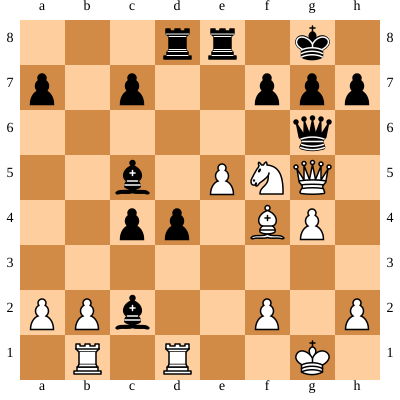



BLACK Turn
Move in UCI format: g6g5
Nodes per depth: {1: 43, 2: 286, 3: 10058, 4: 5207, 5: 9958, 6: 16035, 7: 20059, 8: 25140, 9: 27565, 10: 28907, 11: 29822, 12: 26480, 13: 24508, 14: 16118, 15: 13345, 16: 8226, 17: 6324, 18: 5114, 19: 3691, 20: 2718, 21: 1630, 22: 754, 23: 227, 24: 56}
Time taken by Move: 35.84599280357361


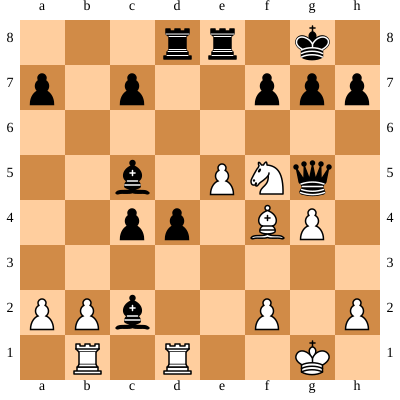



WHITE Turn
Move in UCI format: f4g5
Nodes per depth: {1: 32, 2: 287, 3: 8186, 4: 2231, 5: 2849, 6: 5037, 7: 4511, 8: 5646, 9: 4101, 10: 4666, 11: 2164, 12: 2311, 13: 925, 14: 980, 15: 540, 16: 522, 17: 451, 18: 347, 19: 169, 20: 90, 21: 53}
Time taken by Move: 5.220006465911865


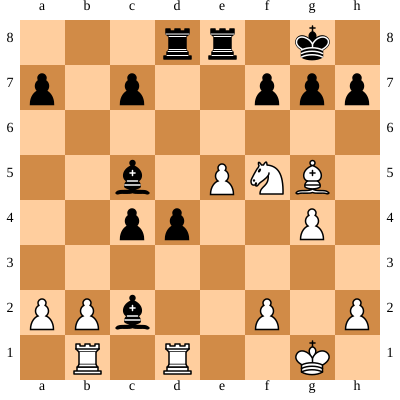



BLACK Turn
Move in UCI format: d8b8
Nodes per depth: {1: 34, 2: 266, 3: 9624, 4: 2794, 5: 4158, 6: 5184, 7: 6832, 8: 8062, 9: 8871, 10: 7158, 11: 6897, 12: 4055, 13: 3351, 14: 1951, 15: 1454, 16: 1207, 17: 1047, 18: 700, 19: 524, 20: 311, 21: 91, 22: 21, 23: 1}
Time taken by Move: 8.930665731430054


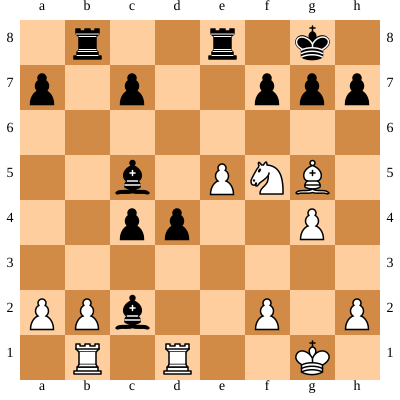



WHITE Turn
Move in UCI format: f5g7
Nodes per depth: {1: 37, 2: 662, 3: 16632, 4: 19932, 5: 37698, 6: 53387, 7: 81083, 8: 124275, 9: 152717, 10: 226781, 11: 213886, 12: 278525, 13: 208893, 14: 216743, 15: 169556, 16: 142318, 17: 116517, 18: 70800, 19: 46771, 20: 16931, 21: 6673, 22: 828, 23: 52}
Time taken by Move: 284.9168977737427


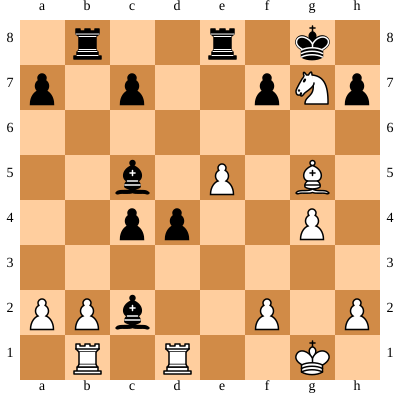



BLACK Turn
Move in UCI format: g8g7
Nodes per depth: {1: 41, 2: 112, 3: 4144, 4: 294, 5: 583, 6: 614, 7: 902, 8: 892, 9: 1289, 10: 759, 11: 1002, 12: 546, 13: 571, 14: 405, 15: 451, 16: 402, 17: 426, 18: 260, 19: 203, 20: 49, 21: 6}
Time taken by Move: 1.495131015777588


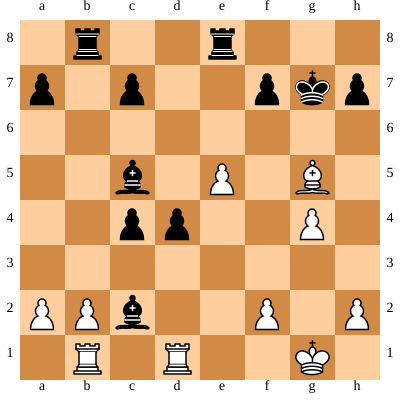



WHITE Turn
Move in UCI format: g5f6
Nodes per depth: {1: 29, 2: 582, 3: 9930, 4: 6674, 5: 7196, 6: 8516, 7: 8287, 8: 11092, 9: 8587, 10: 11143, 11: 6949, 12: 7186, 13: 3684, 14: 2729, 15: 1929, 16: 1664, 17: 1064, 18: 424, 19: 201}
Time taken by Move: 12.29700255393982


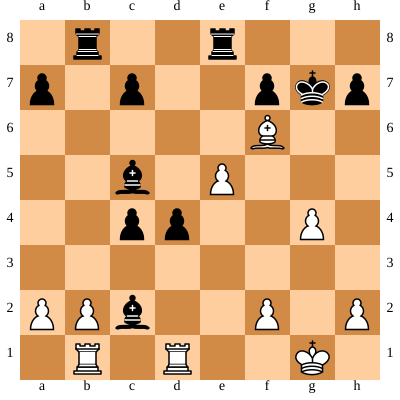



BLACK Turn
Move in UCI format: g7g8
Nodes per depth: {1: 4, 2: 66, 3: 3856, 4: 404, 5: 864, 6: 898, 7: 1599, 8: 1529, 9: 2803, 10: 1569, 11: 1936, 12: 843, 13: 805, 14: 620, 15: 495, 16: 319, 17: 166, 18: 49, 19: 10}
Time taken by Move: 2.2345919609069824


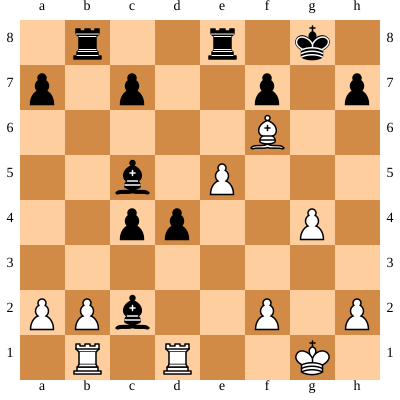



WHITE Turn
Move in UCI format: d1f1
Nodes per depth: {1: 27, 2: 551, 3: 12326, 4: 14175, 5: 13153, 6: 18323, 7: 17357, 8: 28028, 9: 23517, 10: 34354, 11: 20928, 12: 23084, 13: 11410, 14: 9408, 15: 5908, 16: 4184, 17: 2462, 18: 905, 19: 458, 20: 23, 21: 5}
Time taken by Move: 31.130574941635132


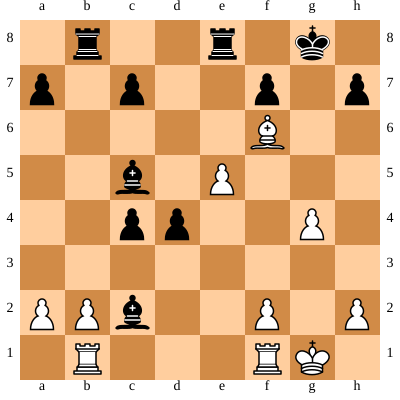



BLACK Turn
Move in UCI format: c2b1
Nodes per depth: {1: 37, 2: 409, 3: 24380, 4: 1250, 5: 2062, 6: 1233, 7: 1937, 8: 868, 9: 1397, 10: 670, 11: 780, 12: 338, 13: 324, 14: 199, 15: 173, 16: 78, 17: 15, 18: 9}
Time taken by Move: 2.65753173828125


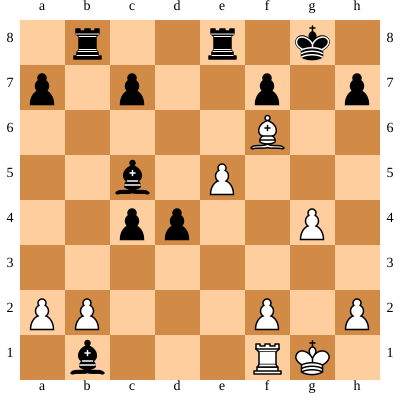



WHITE Turn
Move in UCI format: f1b1
Nodes per depth: {1: 22, 2: 395, 3: 7694, 4: 4726, 5: 4370, 6: 8327, 7: 2748, 8: 4299, 9: 1806, 10: 2375, 11: 1333, 12: 1690, 13: 1155, 14: 1073, 15: 456, 16: 230, 17: 55}
Time taken by Move: 5.032613277435303


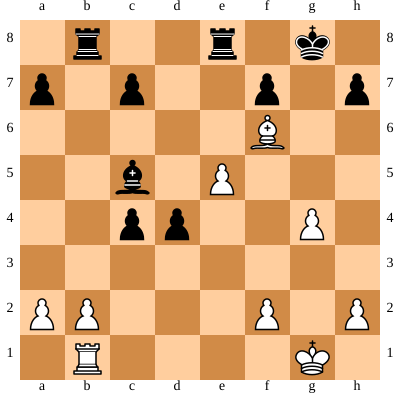



BLACK Turn
Move in UCI format: c4c3
Nodes per depth: {1: 29, 2: 370, 3: 12402, 4: 823, 5: 1473, 6: 352, 7: 565, 8: 152, 9: 212, 10: 136, 11: 140, 12: 119, 13: 103, 14: 77, 15: 15, 16: 6}
Time taken by Move: 1.1734108924865723


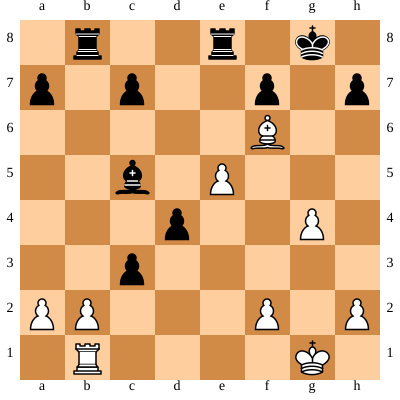



WHITE Turn
Move in UCI format: b2b3
Nodes per depth: {1: 25, 2: 515, 3: 12052, 4: 9604, 5: 7907, 6: 11371, 7: 3026, 8: 4151, 9: 1888, 10: 1896, 11: 549, 12: 450, 13: 247, 14: 176, 15: 74, 16: 28, 17: 5}
Time taken by Move: 6.323075771331787


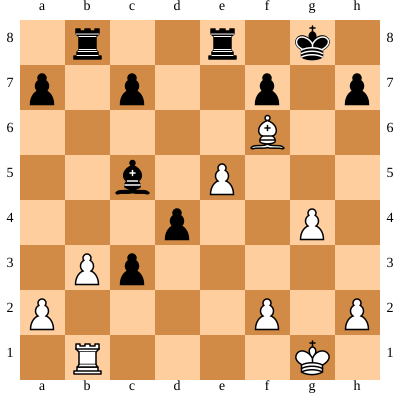



BLACK Turn
Move in UCI format: c3c2
Nodes per depth: {1: 28, 2: 360, 3: 14054, 4: 1032, 5: 1686, 6: 300, 7: 336, 8: 177, 9: 149, 10: 69, 11: 45, 12: 6, 13: 4}
Time taken by Move: 1.2191791534423828


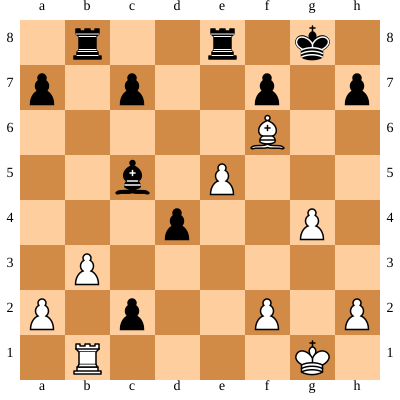



WHITE Turn
Move in UCI format: b1e1
Nodes per depth: {1: 24, 2: 407, 3: 8826, 4: 9040, 5: 2126, 6: 2797, 7: 1151, 8: 1202, 9: 641, 10: 696, 11: 327, 12: 290, 13: 206, 14: 130, 15: 66, 16: 23}
Time taken by Move: 3.0228192806243896


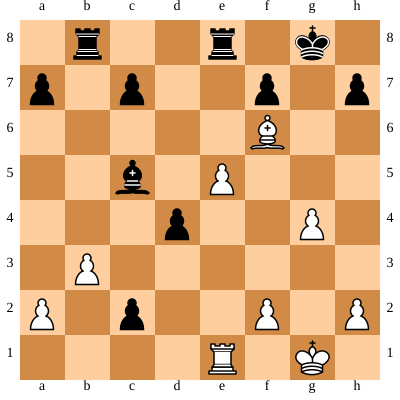



BLACK Turn
Move in UCI format: c5b4
Nodes per depth: {1: 31, 2: 421, 3: 13556, 4: 2708, 5: 5160, 6: 1546, 7: 1994, 8: 674, 9: 762, 10: 342, 11: 400, 12: 235, 13: 155, 14: 96, 15: 16}
Time taken by Move: 2.587808132171631


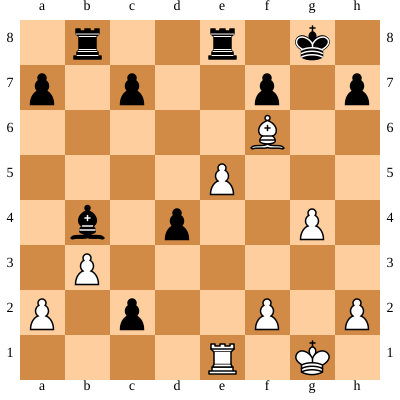



WHITE Turn
Move in UCI format: e1f1
Nodes per depth: {1: 25, 2: 469, 3: 9814, 4: 5584, 5: 3049, 6: 2975, 7: 1632, 8: 1729, 9: 1177, 10: 838, 11: 250, 12: 128, 13: 136, 14: 128, 15: 98, 16: 40}
Time taken by Move: 3.0558297634124756


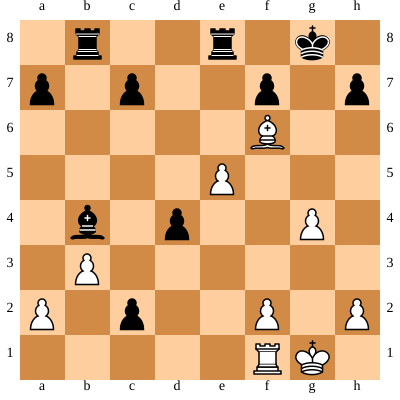



BLACK Turn
Move in UCI format: b4d2
Nodes per depth: {1: 33, 2: 331, 3: 12936, 4: 1642, 5: 2917, 6: 612, 7: 719, 8: 233, 9: 208, 10: 77, 11: 29, 12: 18, 13: 5, 14: 4}
Time taken by Move: 1.5050108432769775


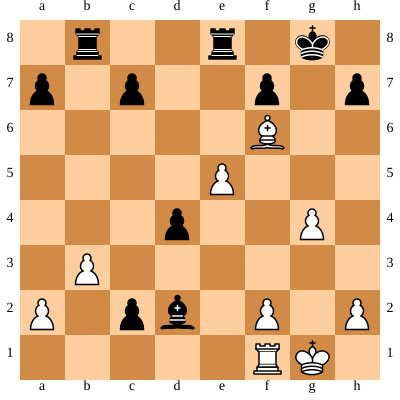



WHITE Turn
Move in UCI format: e5e6
Nodes per depth: {1: 22, 2: 658, 3: 11934, 4: 8925, 5: 5328, 6: 7901, 7: 3289, 8: 3084, 9: 1963, 10: 1462, 11: 970, 12: 578, 13: 401, 14: 192, 15: 79, 16: 36}
Time taken by Move: 5.545010566711426


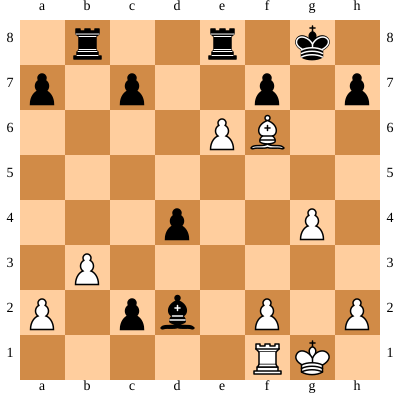



BLACK Turn
Move in UCI format: e8e6
Nodes per depth: {1: 35, 2: 184, 3: 8282, 4: 2385, 5: 5405, 6: 3633, 7: 5626, 8: 2915, 9: 2829, 10: 1270, 11: 757, 12: 382, 13: 262, 14: 163, 15: 44, 16: 4}
Time taken by Move: 3.958827257156372


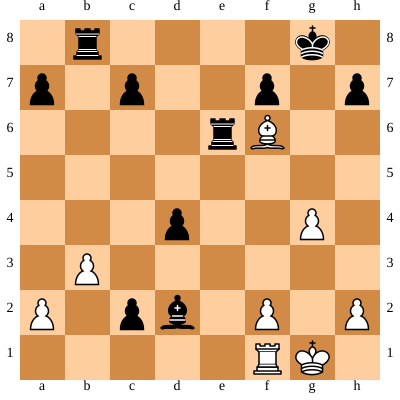



WHITE Turn
Move in UCI format: f6d4
Nodes per depth: {1: 23, 2: 431, 3: 8484, 4: 3673, 5: 2159, 6: 1925, 7: 1102, 8: 800, 9: 538, 10: 385, 11: 306, 12: 225, 13: 154, 14: 45, 15: 5}
Time taken by Move: 2.207512855529785


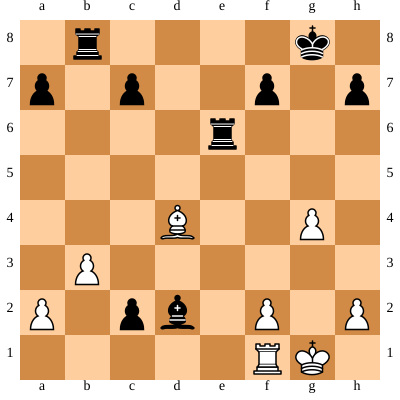



BLACK Turn
Move in UCI format: c2c1q
Nodes per depth: {1: 46, 2: 336, 3: 19878, 4: 1817, 5: 2980, 6: 1137, 7: 1087, 8: 292, 9: 217, 10: 100, 11: 73, 12: 37, 13: 11, 14: 5}
Time taken by Move: 2.0436925888061523


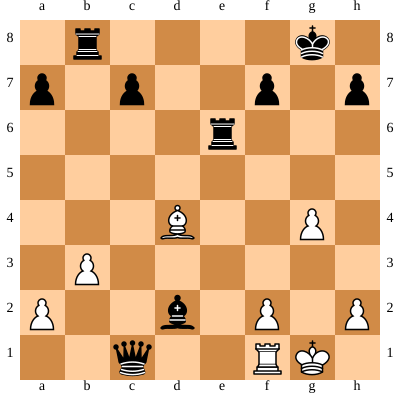



WHITE Turn
Move in UCI format: f1c1
Nodes per depth: {1: 24, 2: 482, 3: 11836, 4: 3182, 5: 2045, 6: 3154, 7: 841, 8: 708, 9: 379, 10: 262, 11: 189, 12: 103, 13: 71, 14: 11, 15: 2}
Time taken by Move: 2.152219772338867


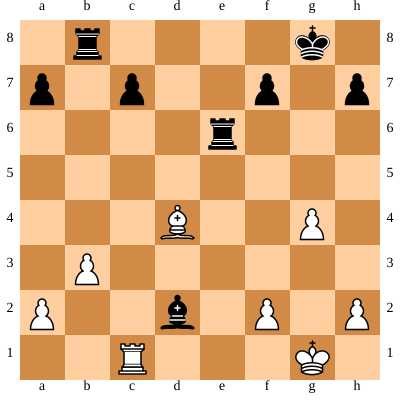



BLACK Turn
Move in UCI format: d2c1
Nodes per depth: {1: 42, 2: 429, 3: 19962, 4: 2656, 5: 2604, 6: 1769, 7: 997, 8: 709, 9: 592, 10: 425, 11: 257, 12: 149, 13: 42, 14: 5}
Time taken by Move: 2.357419967651367


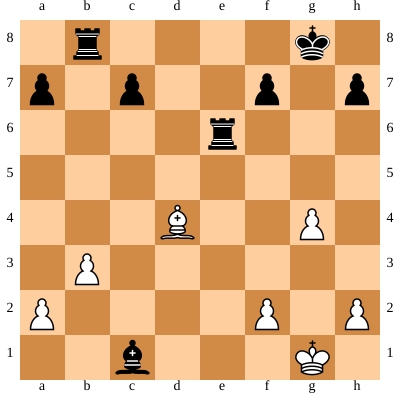



WHITE Turn
Move in UCI format: d4a7
Nodes per depth: {1: 22, 2: 321, 3: 5352, 4: 812, 5: 356, 6: 161, 7: 11, 8: 1}
Time taken by Move: 0.4908621311187744


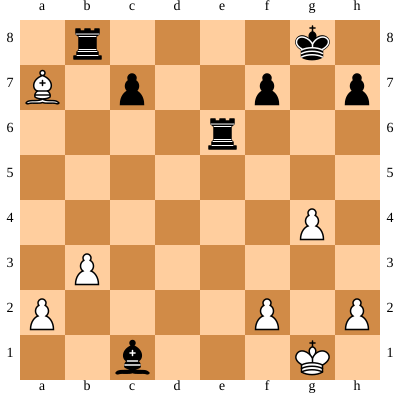



BLACK Turn
Move in UCI format: b8a8
Nodes per depth: {1: 40, 2: 127, 3: 4348, 4: 97, 5: 57, 6: 15, 7: 3}
Time taken by Move: 0.25027942657470703


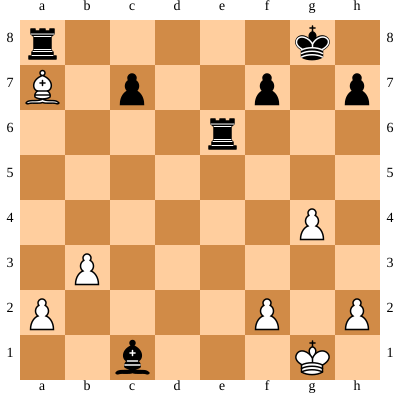



WHITE Turn
Move in UCI format: a7d4
Nodes per depth: {1: 16, 2: 263, 3: 4248, 4: 1692, 5: 444, 6: 429, 7: 79, 8: 33}
Time taken by Move: 0.677459716796875


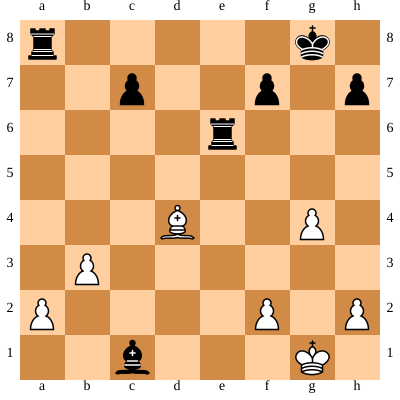



BLACK Turn
Move in UCI format: a8a2
Nodes per depth: {1: 39, 2: 372, 3: 15256, 4: 242, 5: 249, 6: 17, 7: 5}
Time taken by Move: 0.7726688385009766


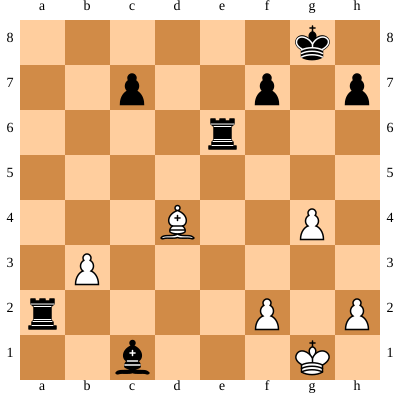



WHITE Turn
Move in UCI format: d4c5
Nodes per depth: {1: 20, 2: 328, 3: 4802, 4: 1763, 5: 645, 6: 493, 7: 70, 8: 27}
Time taken by Move: 0.7202939987182617


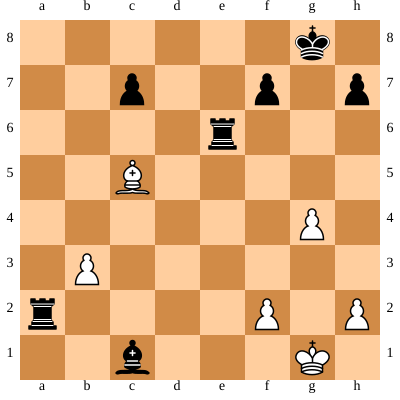



BLACK Turn
Move in UCI format: e6e1
Nodes per depth: {1: 40, 2: 299, 3: 13120, 4: 436, 5: 460, 6: 103, 7: 43, 8: 1, 9: 1}
Time taken by Move: 0.7655088901519775


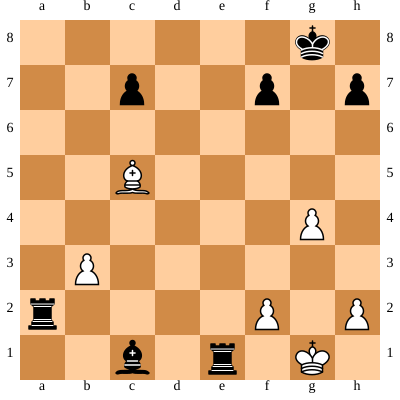



WHITE Turn
Move in UCI format: g1g2
Nodes per depth: {1: 1, 2: 37, 3: 638, 4: 363, 5: 143, 6: 120, 7: 4}
Time taken by Move: 0.15311884880065918


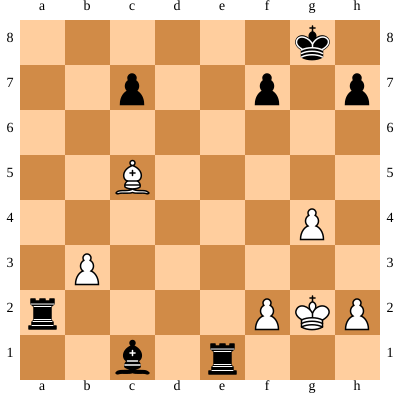



BLACK Turn
Move in UCI format: c1f4
Nodes per depth: {1: 37, 2: 300, 3: 12862, 4: 414, 5: 439, 6: 36, 7: 6}
Time taken by Move: 0.7294437885284424


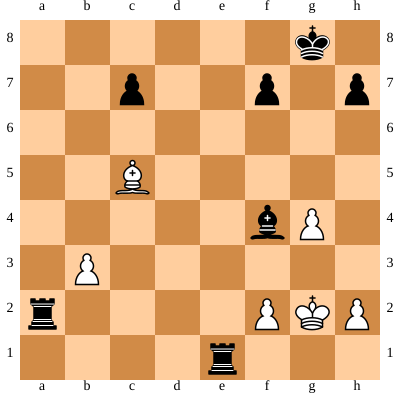



WHITE Turn
Move in UCI format: b3b4
Nodes per depth: {1: 15, 2: 309, 3: 4094, 4: 2364, 5: 1243, 6: 1589, 7: 128, 8: 64}
Time taken by Move: 1.0139763355255127


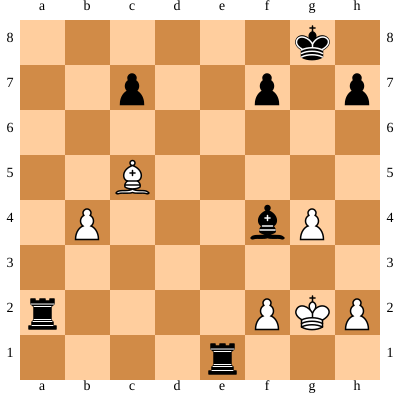



BLACK Turn
Move in UCI format: a2b2
Nodes per depth: {1: 42, 2: 279, 3: 13690, 4: 542, 5: 914, 6: 117, 7: 96, 8: 6, 9: 2}
Time taken by Move: 0.8778727054595947


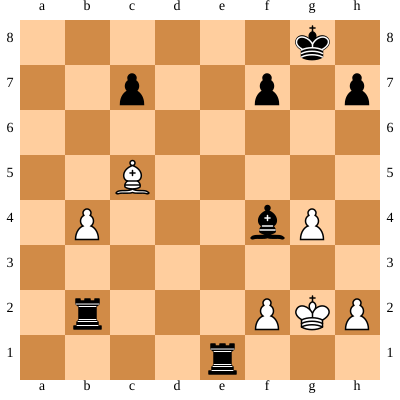



WHITE Turn
Move in UCI format: h2h3
Nodes per depth: {1: 13, 2: 237, 3: 2754, 4: 2044, 5: 1165, 6: 1497, 7: 124, 8: 58, 9: 3}
Time taken by Move: 0.8491742610931396


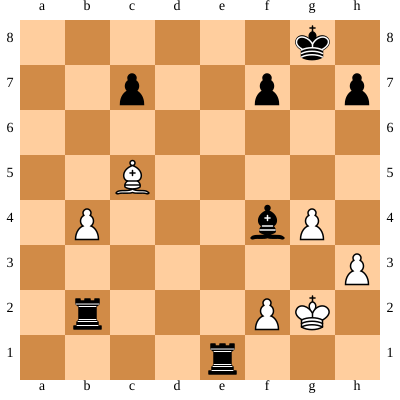



BLACK Turn
Move in UCI format: f4d2
Nodes per depth: {1: 38, 2: 227, 3: 10772, 4: 306, 5: 326, 6: 55, 7: 15, 8: 5}
Time taken by Move: 0.613471508026123


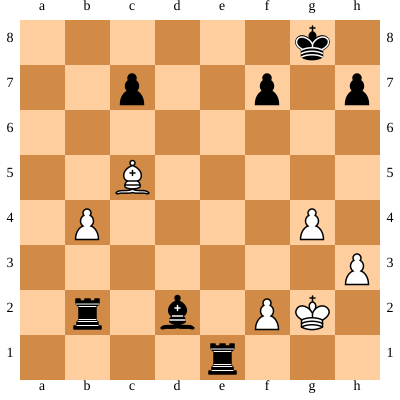



WHITE Turn
Move in UCI format: c5d4
Nodes per depth: {1: 15, 2: 222, 3: 2406, 4: 1486, 5: 674, 6: 694, 7: 168, 8: 50, 9: 1}
Time taken by Move: 0.6067626476287842


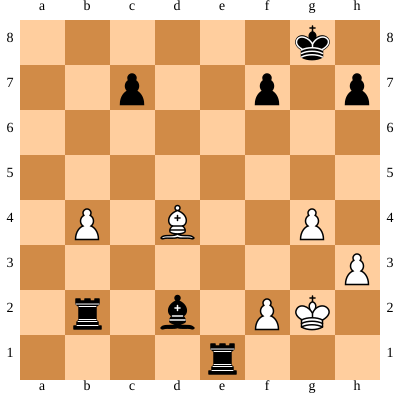



BLACK Turn
Move in UCI format: b2b4
Nodes per depth: {1: 33, 2: 201, 3: 8070, 4: 685, 5: 721, 6: 193, 7: 45, 8: 11, 9: 1}
Time taken by Move: 0.6329784393310547


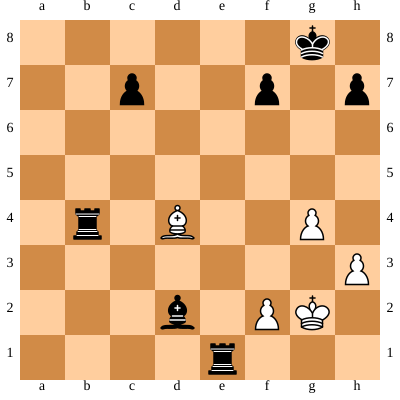



WHITE Turn
Move in UCI format: d4f6
Nodes per depth: {1: 18, 2: 228, 3: 3220, 4: 854, 5: 351, 6: 232, 7: 7, 8: 1}
Time taken by Move: 0.42388272285461426


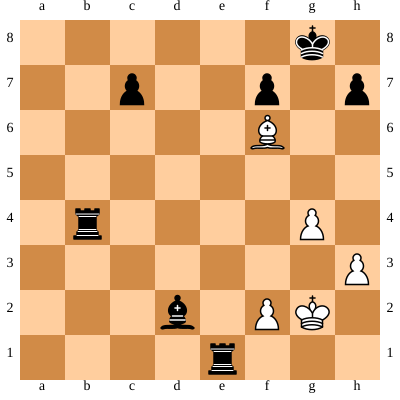



BLACK Turn
Move in UCI format: h7h6
Nodes per depth: {1: 38, 2: 354, 3: 14328, 4: 752, 5: 812, 6: 73, 7: 34}
Time taken by Move: 0.9024078845977783


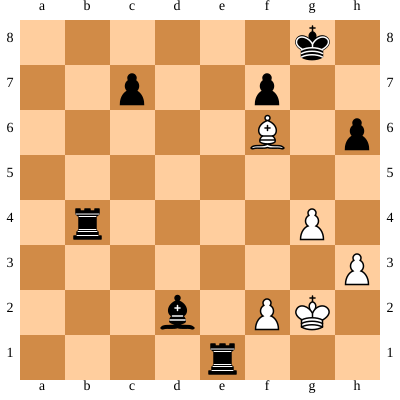



WHITE Turn
Move in UCI format: f6d8
Nodes per depth: {1: 18, 2: 238, 3: 3376, 4: 773, 5: 355, 6: 188, 7: 8}
Time taken by Move: 0.4149603843688965


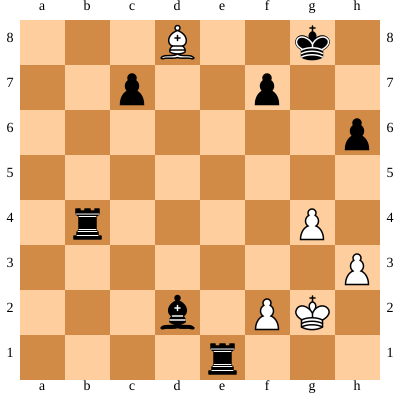



BLACK Turn
Move in UCI format: d2f4
Nodes per depth: {1: 41, 2: 114, 3: 6182, 4: 243, 5: 168, 6: 37, 7: 14, 8: 1}
Time taken by Move: 0.3717484474182129


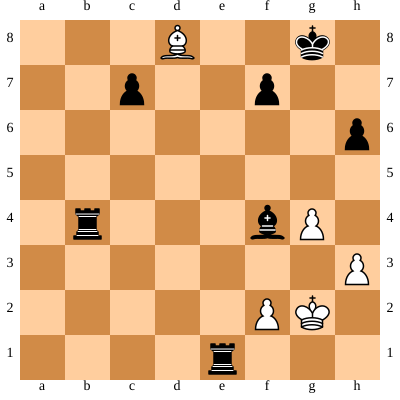



WHITE Turn
Move in UCI format: d8f6
Nodes per depth: {1: 9, 2: 148, 3: 1386, 4: 479, 5: 196, 6: 122, 7: 42, 8: 16}
Time taken by Move: 0.2555811405181885


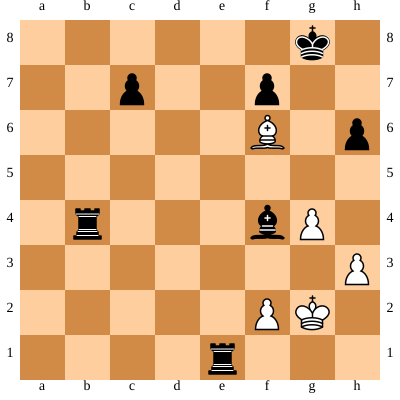



BLACK Turn
Move in UCI format: e1c1
Nodes per depth: {1: 38, 2: 308, 3: 12734, 4: 751, 5: 835, 6: 164, 7: 93, 8: 4, 9: 1}
Time taken by Move: 0.8600552082061768


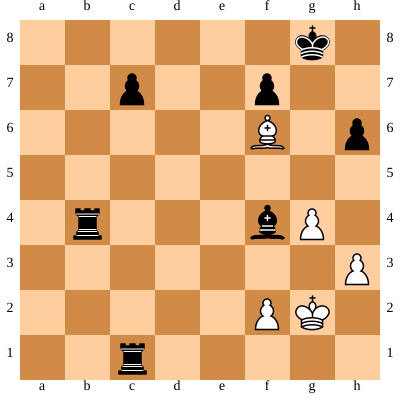



WHITE Turn
Move in UCI format: f6d8
Nodes per depth: {1: 15, 2: 197, 3: 2196, 4: 516, 5: 187, 6: 112, 7: 36, 8: 11, 9: 7}
Time taken by Move: 0.2941896915435791


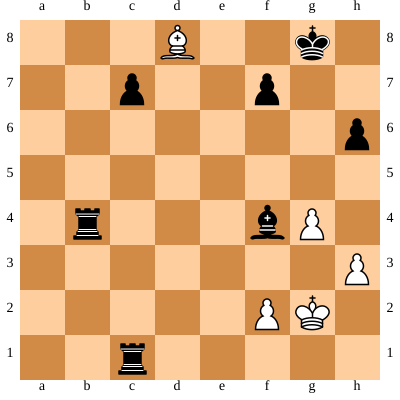



BLACK Turn
Move in UCI format: f4d6
Nodes per depth: {1: 39, 2: 87, 3: 4468, 4: 93, 5: 82, 6: 20, 7: 6}
Time taken by Move: 0.2538008689880371


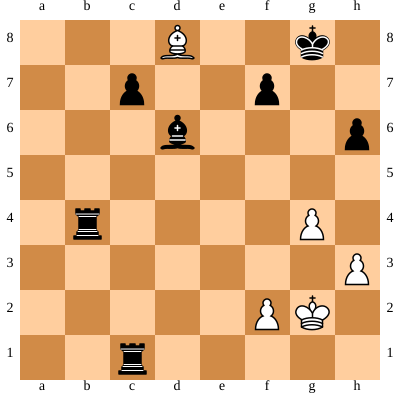



WHITE Turn
Move in UCI format: g4g5
Nodes per depth: {1: 10, 2: 205, 3: 1776, 4: 703, 5: 332, 6: 165, 7: 32, 8: 11, 9: 6}
Time taken by Move: 0.32744455337524414


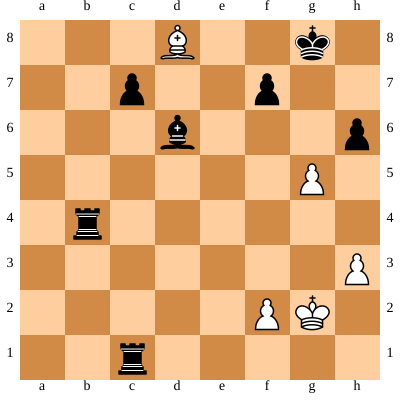



BLACK Turn
Move in UCI format: h6g5
Nodes per depth: {1: 43, 2: 180, 3: 10246, 4: 908, 5: 964, 6: 429, 7: 176, 8: 34, 9: 17}
Time taken by Move: 0.8323566913604736


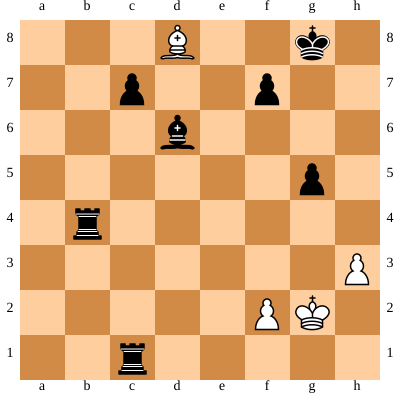



WHITE Turn
Move in UCI format: d8g5
Nodes per depth: {1: 8, 2: 171, 3: 1404, 4: 361, 5: 90, 6: 26, 7: 18}
Time taken by Move: 0.1928999423980713


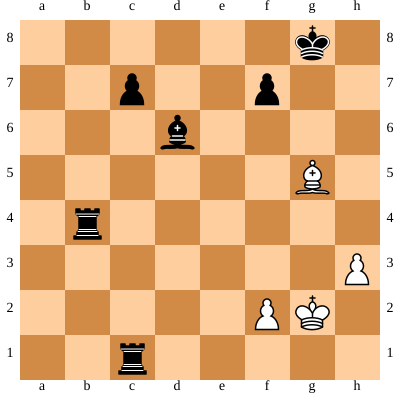



BLACK Turn
Move in UCI format: c1c2
Nodes per depth: {1: 41, 2: 279, 3: 12462, 4: 1557, 5: 1019, 6: 131, 7: 39}
Time taken by Move: 1.0255317687988281


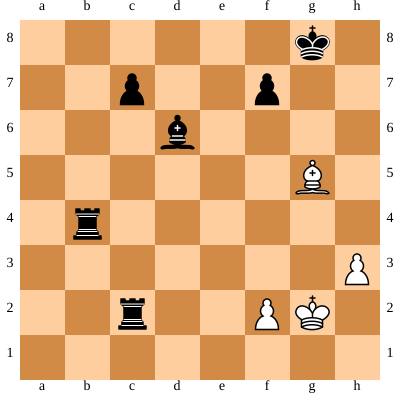



WHITE Turn
Move in UCI format: g5e3
Nodes per depth: {1: 14, 2: 217, 3: 2712, 4: 891, 5: 293, 6: 78, 7: 24, 8: 4}
Time taken by Move: 0.38552021980285645


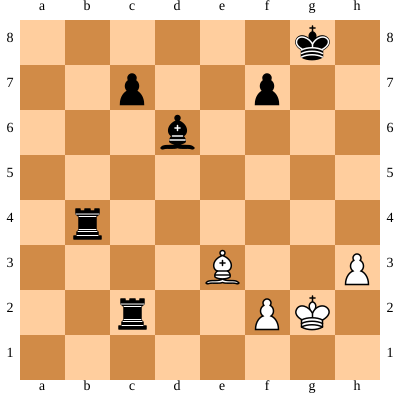



BLACK Turn
Move in UCI format: b4h4
Nodes per depth: {1: 39, 2: 282, 3: 12434, 4: 406, 5: 407, 6: 7, 7: 4}
Time taken by Move: 0.7123644351959229


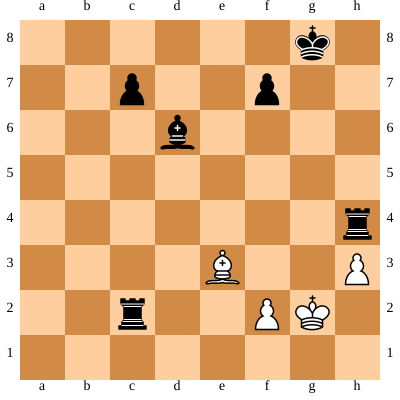



WHITE Turn
Move in UCI format: e3g5
Nodes per depth: {1: 13, 2: 194, 3: 2562, 4: 1042, 5: 563, 6: 706, 7: 207, 8: 122}
Time taken by Move: 0.5380446910858154


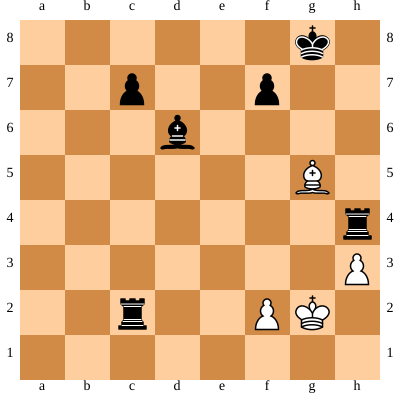



BLACK Turn
Move in UCI format: h4e4
Nodes per depth: {1: 39, 2: 223, 3: 8352, 4: 1057, 5: 1615, 6: 542, 7: 543, 8: 98, 9: 25}
Time taken by Move: 0.9090936183929443


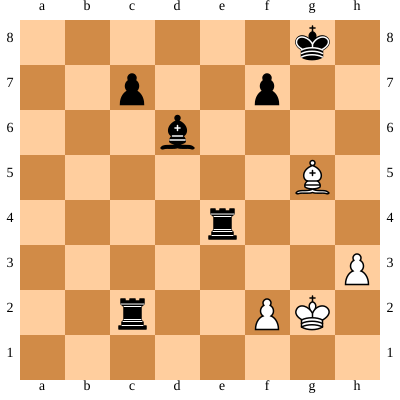



WHITE Turn
Move in UCI format: g2f1
Nodes per depth: {1: 14, 2: 321, 3: 3818, 4: 1835, 5: 763, 6: 329, 7: 58, 8: 9}
Time taken by Move: 0.7359364032745361


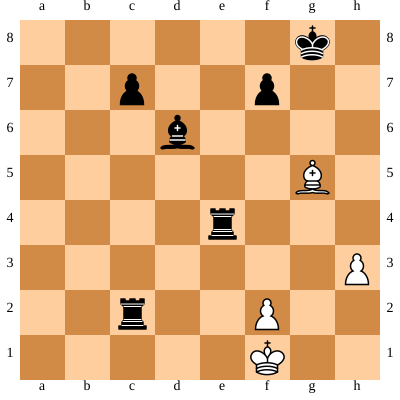



BLACK Turn
Move in UCI format: d6c5
Nodes per depth: {1: 41, 2: 180, 3: 8164, 4: 210, 5: 159, 6: 10, 7: 3}
Time taken by Move: 0.4600536823272705


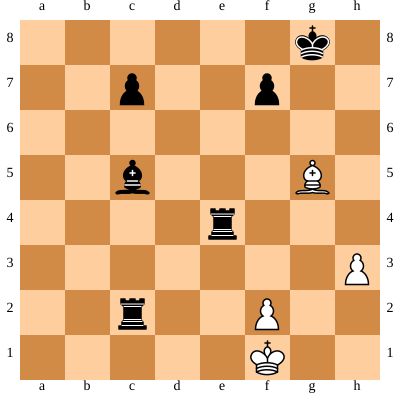



WHITE Turn
Move in UCI format: f2f3
Nodes per depth: {1: 14, 2: 290, 3: 3590, 4: 2089, 5: 589, 6: 494, 7: 153, 8: 15}
Time taken by Move: 0.7592217922210693


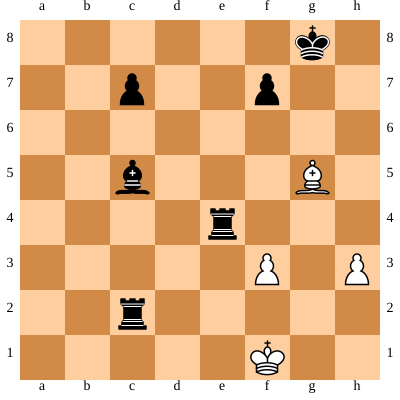



BLACK Turn
Move in UCI format: c2f2
Nodes per depth: {1: 42, 2: 274, 3: 11946, 4: 1969, 5: 1061, 6: 390, 7: 15}
Time taken by Move: 1.1790964603424072


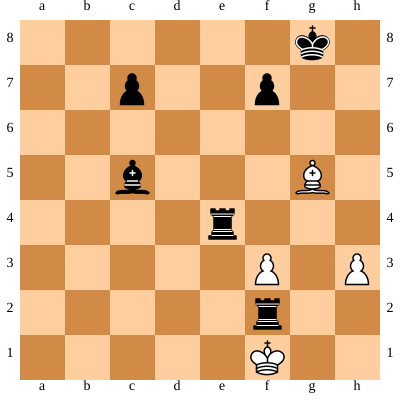



WHITE Turn
Move in UCI format: f1g1
Nodes per depth: {1: 1, 2: 39, 3: 434, 4: 227, 5: 97, 6: 72}
Time taken by Move: 0.11180830001831055


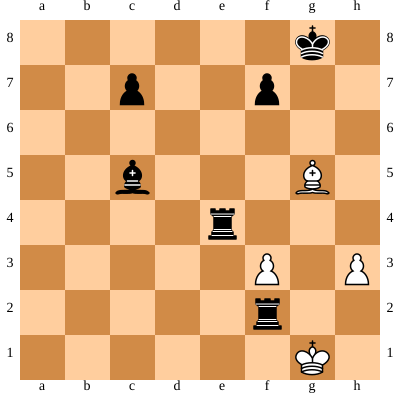



BLACK Turn
Move in UCI format: e4e1
Nodes per depth: {1: 39, 2: 225, 3: 10202, 4: 2653, 5: 1931, 6: 683, 7: 170}
Time taken by Move: 1.354522943496704


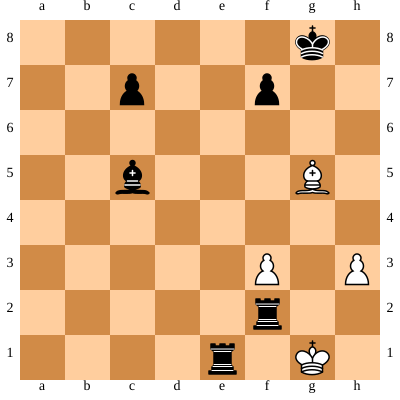



[Event "Example"]
[Site "Linz"]
[Date "2022-01-30"]
[Round "1"]
[White "MyChess"]
[Black "MyChess"]
[Result "0-1"]

1. Nf3 Nf6 2. Nc3 Nc6 3. e3 e6 4. d4 d5 5. Bb5 Bd6 6. Bxc6+ bxc6 7. Ne5 Bb7 8. Qf3 O-O 9. O-O Nd7 10. Nxd7 Qxd7 11. Rd1 c5 12. Rb1 Qc6 13. Ra1 Rfe8 14. Rd2 Rad8 15. Rd3 c4 16. Rd1 e5 17. dxe5 Rxe5 18. Rb1 Qc5 19. Ne2 Qb6 20. Nd4 Bc5 21. Qf4 Re4 22. Qg5 Ree8 23. Nf5 Qg6 24. e4 d4 25. e5 Be4 26. g4 Bxc2 27. Bf4 Qxg5 28. Bxg5 Rb8 29. Nxg7 Kxg7 30. Bf6+ Kg8 31. Rf1 Bxb1 32. Rxb1 c3 33. b3 c2 34. Re1 Bb4 35. Rf1 Bd2 36. e6 Rxe6 37. Bxd4 c1=Q 38. Rxc1 Bxc1 39. Bxa7 Ra8 40. Bd4 Rxa2 41. Bc5 Re1+ 42. Kg2 Bf4 43. b4 Rb2 44. h3 Bd2 45. Bd4 Rxb4 46. Bf6 h6 47. Bd8 Bf4 48. Bf6 Rc1 49. Bd8 Bd6 50. g5 hxg5 51. Bxg5 Rc2 52. Be3 Rh4 53. Bg5 Re4 54. Kf1 Bc5 55. f3 Rf2+ 56. Kg1 Re1# 0-1


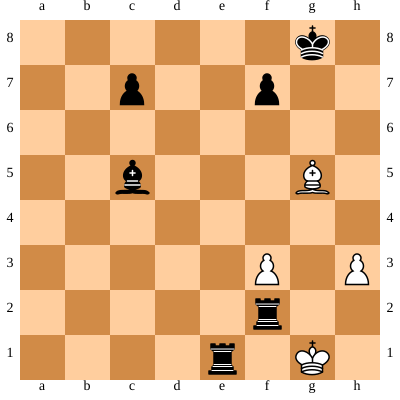

In [ ]:
import chess.pgn
import datetime
import time



movehistory = []
game = chess.pgn.Game()
game.headers["Event"] = "Example"
game.headers["Site"] = "Linz"
game.headers["Date"] = str(datetime.datetime.now().date())
game.headers["Round"] = 1
game.headers["White"] = "MyChess"
game.headers["Black"] = "MyChess"
board = chess.Board()
while not board.is_game_over(claim_draw=True):
    start = time.time()
    nodes_per_depth = dict()
    if board.turn:
        
        print("WHITE Turn")
        move = selectmove(3,movehistory)
        board.push(move)       
    else:
        print("BLACK Turn")
        move = selectmove(3,movehistory)
        board.push(move)  
    end = time.time()
    print("Move in UCI format:", move)
    print("Nodes per depth:", nodes_per_depth)
    print("Time taken by Move:", end-start) 
    display(SVG(chess.svg.board(board, size=400)))  
    print("\n")

game.add_line(movehistory)
game.headers["Result"] = str(board.result(claim_draw=True))
print(game)
print(game, file=open("selftest.pgn", "w"), end="\n\n")

SVG(chess.svg.board(board=board,size=400))

###Quies vs Quies : with cuts count
We are trying to increase max depth search 

WHITE Turn
Move in UCI format: g1f3
Nodes per depth: {1: 20, 2: 63, 3: 1406, 4: 12}
Time taken by Move: 0.08661675453186035
coupe 689


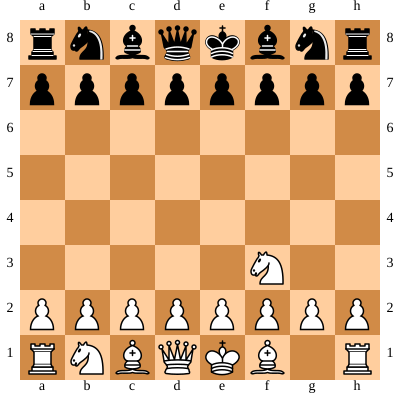



BLACK Turn
Move in UCI format: g8f6
Nodes per depth: {1: 20, 2: 93, 3: 1876, 4: 61, 5: 61}
Time taken by Move: 0.12486004829406738
coupe 965


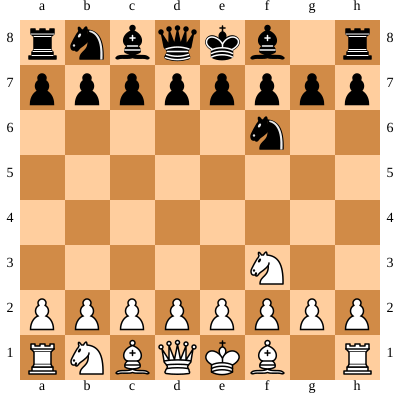



WHITE Turn
Move in UCI format: b1c3
Nodes per depth: {1: 22, 2: 97, 3: 2256, 4: 151, 5: 50, 6: 53, 7: 50, 8: 27, 9: 35, 10: 10, 11: 6, 12: 2, 13: 1, 14: 2, 15: 3, 16: 2, 17: 1}
Time taken by Move: 0.20265483856201172
coupe 1233


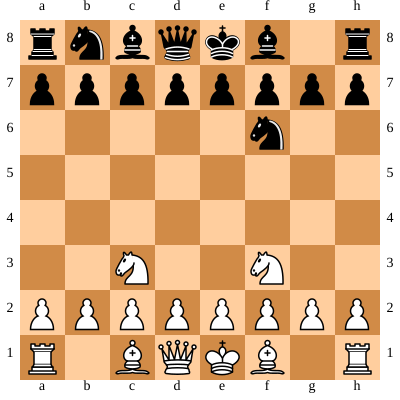



BLACK Turn
Move in UCI format: b8c6
Nodes per depth: {1: 22, 2: 122, 3: 3034, 4: 242, 5: 252, 6: 155, 7: 177, 8: 140, 9: 199, 10: 161, 11: 202, 12: 125, 13: 129, 14: 58, 15: 59, 16: 32, 17: 33, 18: 13, 19: 18, 20: 14, 21: 8, 22: 2}
Time taken by Move: 0.49454379081726074
coupe 2631


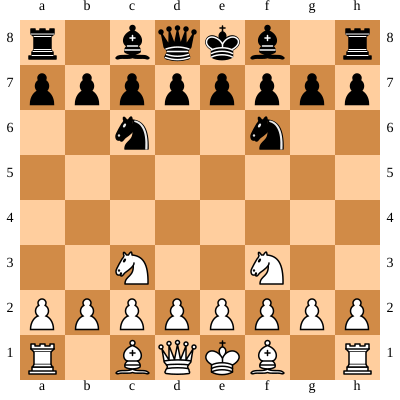



WHITE Turn
Move in UCI format: e2e3
Nodes per depth: {1: 24, 2: 342, 3: 9378, 4: 1157, 5: 1222, 6: 850, 7: 1014, 8: 930, 9: 848, 10: 706, 11: 569, 12: 382, 13: 266, 14: 184, 15: 118, 16: 83, 17: 63, 18: 34, 19: 22, 20: 6}
Time taken by Move: 1.8251867294311523
coupe 9321


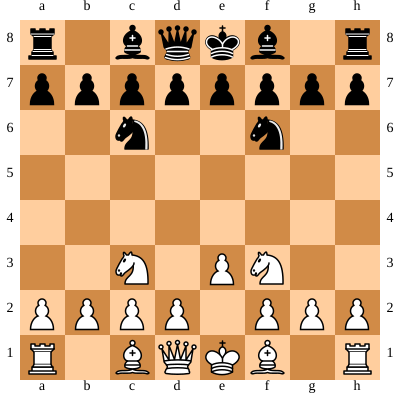



BLACK Turn
Move in UCI format: e7e6
Nodes per depth: {1: 24, 2: 342, 3: 9118, 4: 1142, 5: 1266, 6: 1092, 7: 1402, 8: 1022, 9: 1155, 10: 926, 11: 917, 12: 538, 13: 412, 14: 235, 15: 167, 16: 123, 17: 95, 18: 67, 19: 40, 20: 22, 21: 5}
Time taken by Move: 2.1899423599243164
coupe 10698


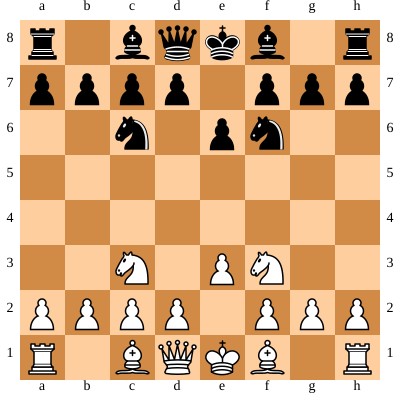



WHITE Turn
Move in UCI format: d2d4
Nodes per depth: {1: 31, 2: 372, 3: 12128, 4: 1369, 5: 1657, 6: 1147, 7: 1404, 8: 1031, 9: 928, 10: 664, 11: 654, 12: 481, 13: 336, 14: 252, 15: 168, 16: 113, 17: 67, 18: 44, 19: 28, 20: 16, 21: 10, 22: 6, 23: 5}
Time taken by Move: 2.378326654434204
coupe 12159


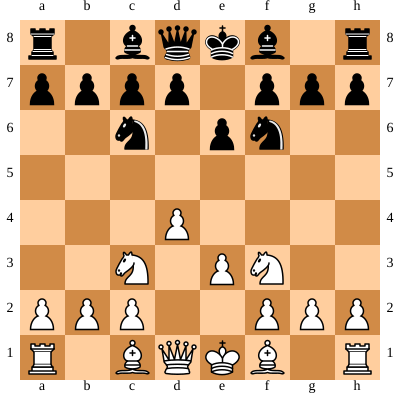



BLACK Turn
Move in UCI format: d7d5
Nodes per depth: {1: 31, 2: 202, 3: 6152, 4: 809, 5: 1259, 6: 1320, 7: 1687, 8: 1728, 9: 2022, 10: 2269, 11: 1953, 12: 1610, 13: 1388, 14: 912, 15: 750, 16: 414, 17: 220, 18: 145, 19: 136, 20: 77, 21: 91, 22: 44, 23: 42, 24: 15, 25: 10, 26: 1}
Time taken by Move: 3.3826088905334473
coupe 14701


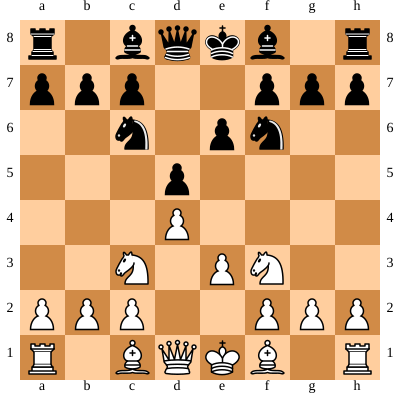



WHITE Turn
Move in UCI format: f1b5
Nodes per depth: {1: 33, 2: 148, 3: 5284, 4: 777, 5: 964, 6: 905, 7: 1004, 8: 1133, 9: 1549, 10: 1637, 11: 1688, 12: 1959, 13: 1619, 14: 1521, 15: 1167, 16: 845, 17: 615, 18: 400, 19: 236, 20: 102, 21: 106, 22: 37, 23: 31, 24: 13, 25: 14, 26: 6}
Time taken by Move: 3.1741251945495605
coupe 14231


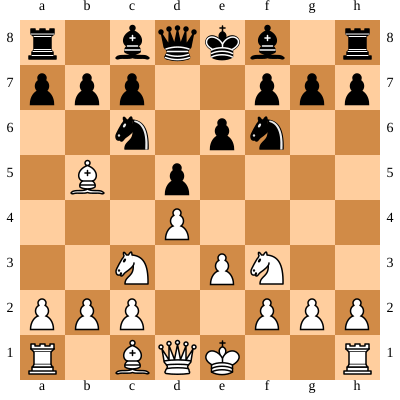



BLACK Turn
Move in UCI format: f8d6
Nodes per depth: {1: 26, 2: 196, 3: 1506, 4: 571, 5: 671, 6: 751, 7: 739, 8: 406, 9: 365, 10: 202, 11: 293, 12: 187, 13: 238, 14: 181, 15: 227, 16: 121, 17: 133, 18: 80, 19: 68, 20: 48, 21: 44, 22: 31, 23: 26, 24: 13, 25: 14, 26: 5, 27: 3}
Time taken by Move: 1.0549721717834473
coupe 3956


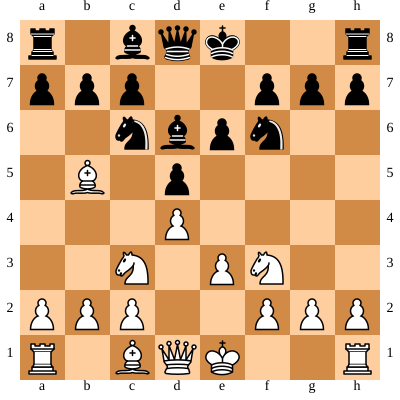



WHITE Turn
Move in UCI format: b5c6
Nodes per depth: {1: 37, 2: 59, 3: 3274, 4: 231, 5: 273, 6: 268, 7: 282, 8: 278, 9: 324, 10: 408, 11: 368, 12: 410, 13: 353, 14: 374, 15: 306, 16: 282, 17: 251, 18: 200, 19: 188, 20: 111, 21: 100, 22: 64, 23: 42, 24: 19, 25: 10, 26: 5}
Time taken by Move: 0.982393741607666
coupe 4812


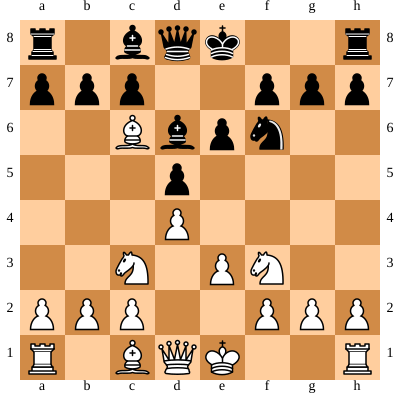



BLACK Turn
Move in UCI format: b7c6
Nodes per depth: {1: 6, 2: 76, 3: 1472, 4: 379, 5: 380, 6: 467, 7: 359, 8: 341, 9: 580, 10: 664, 11: 1149, 12: 987, 13: 1063, 14: 908, 15: 917, 16: 794, 17: 835, 18: 705, 19: 427, 20: 496, 21: 185, 22: 101, 23: 36, 24: 21, 25: 2}
Time taken by Move: 1.8991429805755615
coupe 7905


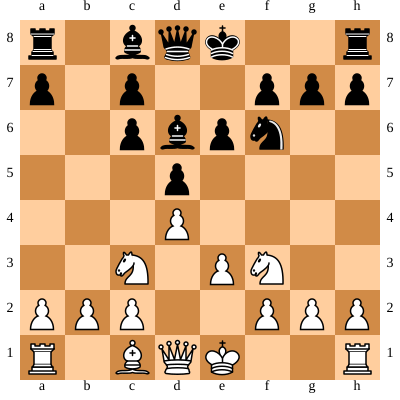



WHITE Turn
Move in UCI format: f3e5
Nodes per depth: {1: 31, 2: 243, 3: 8866, 4: 1051, 5: 1319, 6: 1285, 7: 1350, 8: 1572, 9: 1658, 10: 1640, 11: 1276, 12: 1077, 13: 804, 14: 568, 15: 448, 16: 474, 17: 390, 18: 339, 19: 238, 20: 137, 21: 86, 22: 42, 23: 30, 24: 16, 25: 11, 26: 8, 27: 1}
Time taken by Move: 2.983151435852051
coupe 14318


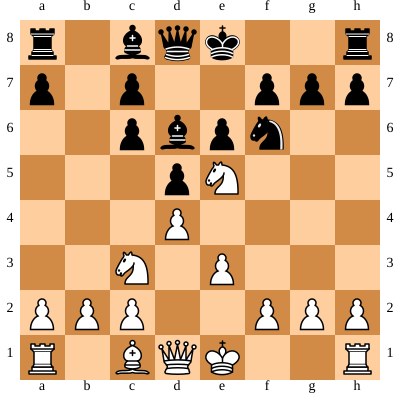



BLACK Turn
Move in UCI format: c8b7
Nodes per depth: {1: 29, 2: 283, 3: 8262, 4: 2224, 5: 2596, 6: 3278, 7: 2250, 8: 2018, 9: 2068, 10: 1434, 11: 1267, 12: 856, 13: 909, 14: 671, 15: 875, 16: 618, 17: 530, 18: 359, 19: 244, 20: 140, 21: 86, 22: 41, 23: 11, 24: 2, 25: 1, 26: 1}
Time taken by Move: 4.097840309143066
coupe 17874


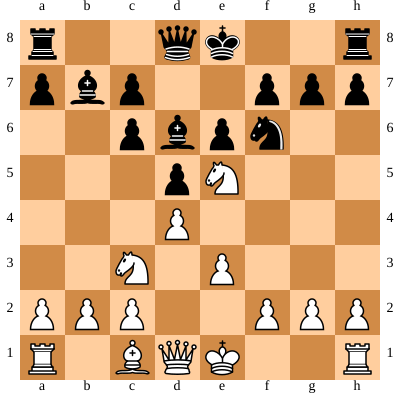



WHITE Turn
Move in UCI format: d1f3
Nodes per depth: {1: 39, 2: 573, 3: 17944, 4: 3057, 5: 5214, 6: 2041, 7: 2598, 8: 1963, 9: 2461, 10: 2176, 11: 2099, 12: 1259, 13: 1019, 14: 562, 15: 493, 16: 256, 17: 198, 18: 122, 19: 98, 20: 44, 21: 51, 22: 24, 23: 25, 24: 9, 25: 6, 26: 1}
Time taken by Move: 5.234934329986572
coupe 25053


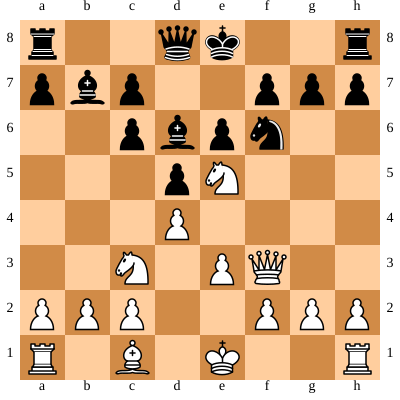



BLACK Turn
Move in UCI format: e8g8
Nodes per depth: {1: 31, 2: 665, 3: 22246, 4: 7138, 5: 7234, 6: 16259, 7: 7345, 8: 10884, 9: 6268, 10: 6482, 11: 4055, 12: 4103, 13: 2859, 14: 3061, 15: 2059, 16: 2182, 17: 1640, 18: 1580, 19: 1258, 20: 1222, 21: 933, 22: 652, 23: 386, 24: 245, 25: 86, 26: 15, 27: 6}
Time taken by Move: 14.671030521392822
coupe 68709


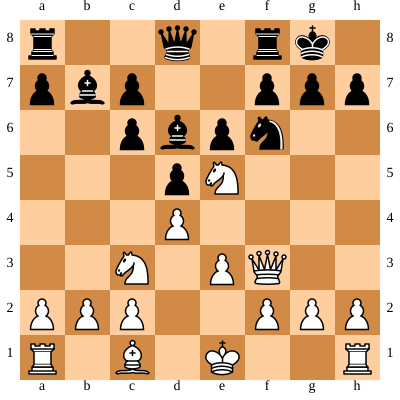



WHITE Turn
Move in UCI format: e1g1
Nodes per depth: {1: 43, 2: 381, 3: 14902, 4: 2770, 5: 6936, 6: 3383, 7: 6360, 8: 4175, 9: 6202, 10: 4565, 11: 5432, 12: 3703, 13: 3589, 14: 2603, 15: 2449, 16: 2003, 17: 1809, 18: 1575, 19: 1371, 20: 910, 21: 692, 22: 396, 23: 309, 24: 152, 25: 74, 26: 19, 27: 2}
Time taken by Move: 10.062505722045898
coupe 48164


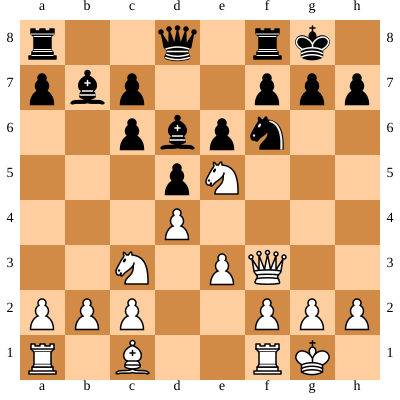



BLACK Turn


KeyboardInterrupt: ignored

In [104]:
import chess.pgn
import datetime
import time



movehistory =[]
game = chess.pgn.Game()
game.headers["Event"] = "Example"
game.headers["Site"] = "Linz"
game.headers["Date"] = str(datetime.datetime.now().date())
game.headers["Round"] = 1
game.headers["White"] = "MyChess"
game.headers["Black"] = "MyChess"
board = chess.Board()
coupe_all = 0
while not board.is_game_over(claim_draw=True):
    start = time.time()
    nodes_per_depth = dict()
    coupe = dict()
    coupe[0] = 0
    if board.turn:
        
        print("WHITE Turn")
        move = selectmove(3,movehistory)
        board.push(move)       
    else:
        print("BLACK Turn")
        move = selectmove(3,movehistory)
        board.push(move)  
    end = time.time()
    print("Move in UCI format:", move)
    print("Nodes per depth:", nodes_per_depth)
    print("Time taken by Move:", end-start) 
    print('coupe', coupe[0])
    
    coupe_all = coupe_all + coupe[0]
    print('coupe all', coupe_all)
    display(SVG(chess.svg.board(board, size=400)))  
    print("\n")

game.add_line(movehistory)
game.headers["Result"] = str(board.result(claim_draw=True))
print(game)
print(game, file=open("selftest.pgn", "w"), end="\n\n")
print('all coupe', coupe_all)
SVG(chess.svg.board(board=board,size=400))

# Move Ordering
In this section,  we order the legal moves based on their outcome 

## MinMax Score move order


### Search with order

In [95]:
def alphabeta_order( alpha, beta,maxdepth, depthleft,order):
    # This if else code block is only used for analysis of algorithm, by counting number of nodes explored
    if maxdepth - depthleft in nodes_per_depth:
        nodes_per_depth[maxdepth - depthleft] += 1
    else: 
        nodes_per_depth[maxdepth - depthleft] = 1

    bestscore = -9999
    if( depthleft == 0 ):
        #return evaluate_board()
        return quiesce_order( alpha, beta, maxdepth,order )
    for move in get_ordered_moves_estim(board, order):
        board.push(move)   
        score= - alphabeta_order( -beta, -alpha, maxdepth, depthleft - 1 , not order)        
        board.pop()
        if( score >= beta ):
            coupe[0] = coupe[0] +1
            return score
        if( score > bestscore ):
            bestscore = score
        if( score > alpha ):
            alpha = score   
    return bestscore

In [96]:
def quiesce_order( alpha, beta,  maxdepth, order):
    stand_pat = evaluate_board()
    if maxdepth  in nodes_per_depth:
        nodes_per_depth[maxdepth ] += 1
    else: 
        nodes_per_depth[maxdepth ] = 1
    if( stand_pat >= beta ):
        
        coupe[0] = coupe[0] +1
        return beta
    if( alpha < stand_pat ):
        alpha = stand_pat

    for move in get_ordered_moves_estim(board, order):
        if board.is_capture(move):
            board.push(move)        
            score = -quiesce_order( -beta, -alpha, maxdepth + 1, not order )
            
            board.pop()

            if( score >= beta ):
                coupe[0] = coupe[0] +1
                return beta
            if( score > alpha ):
                alpha = score  
    return alpha

In [97]:
import chess.polyglot

def selectmove_order(depth,movehistory,order):
    
    bestMove = chess.Move.null()
    bestValue = -99999
    alpha = -100000
    beta = 100000
    for move in get_ordered_moves(board,order):
        board.push(move)
        boardValue = -alphabeta_order(-beta, -alpha,depth, depth-1,not order)
        
        if boardValue > bestValue:
            bestValue = boardValue;
            bestMove = move
        if( boardValue > alpha ):
            alpha = boardValue
        board.pop()
    movehistory.append(bestMove)
    return bestMove



### ordering functions

In [63]:
def get_ordered_moves(board: chess.Board, order) -> List[chess.Move]:
    """
    Get legal moves.
    Attempt to sort moves by best to worst.
    Use piece values (and positional gains/losses) to weight captures.
    """
    alpha = -100000
    beta = 100000

    def orderer(move):
        board.push(move)
        
        a =  -alphabeta_ab_sort(-beta, -alpha, 2,order)
        
        board.pop()
        return a

    in_order = sorted(
        board.legal_moves, key=orderer, reverse = order
    )
    return list(in_order)

In [64]:
def get_ordered_moves_estim(board: chess.Board, order) -> List[chess.Move]:
    """
    Get legal moves.
    Attempt to sort moves by best to worst.
    Use piece values (and positional gains/losses) to weight captures.
    """
    alpha = -100000
    beta = 100000

    def orderer(move):
        board.push(move)
        
        a =  evaluate_board()
        
        board.pop()
        return a

    in_order = sorted(
        board.legal_moves, key=orderer, reverse = order
    )
    return list(in_order)

In [65]:
def alphabeta_ab_sort( alpha, beta, depthleft,order):
    

    bestscore = -9999
    if( depthleft == 0 ):
        return evaluate_board()
    for move in get_ordered_moves_estim(board,order):
        board.push(move)  
        score= - alphabeta_ab_sort( -beta, -alpha, depthleft - 1 , not order)
        
        board.pop()
        if( score >= beta ):
            return score
        if( score > bestscore ):
            bestscore = score
        if( score > alpha ):
            alpha = score   
    return bestscore

### testing

WHITE Turn
Move in UCI format: g1f3
Nodes per depth: {1: 20, 2: 39, 3: 1308, 4: 22, 5: 5, 6: 1, 7: 2}
Time taken by Move: 1.8982868194580078
Coupe:  566
Coupe all:  566


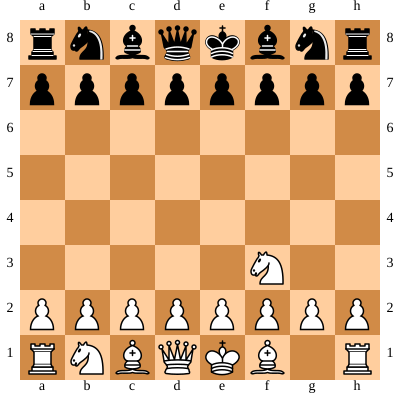



BLACK Turn
Move in UCI format: g8f6
Nodes per depth: {1: 20, 2: 433, 3: 9986, 4: 274, 5: 159, 6: 79, 7: 67, 8: 76, 9: 47, 10: 50, 11: 41, 12: 31, 13: 12, 14: 2}
Time taken by Move: 7.2914135456085205
Coupe:  5151
Coupe all:  5717


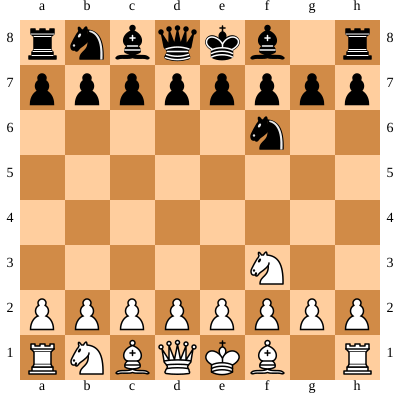



WHITE Turn
Move in UCI format: b1c3
Nodes per depth: {1: 22, 2: 83, 3: 2152, 4: 195, 5: 96, 6: 38, 7: 66, 8: 38, 9: 38, 10: 14, 11: 13, 12: 7, 13: 3, 14: 6, 15: 11, 16: 11, 17: 10, 18: 6, 19: 5, 20: 1}
Time taken by Move: 5.199425935745239
Coupe:  1259
Coupe all:  6976


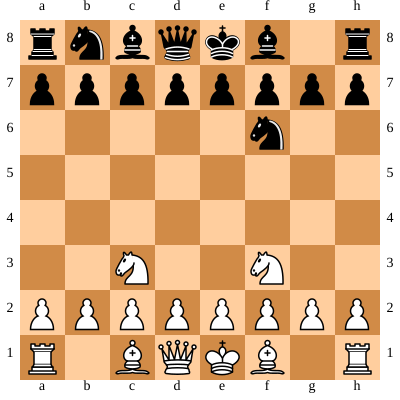



BLACK Turn
Move in UCI format: d7d5
Nodes per depth: {1: 22, 2: 504, 3: 10264, 4: 883, 5: 554, 6: 656, 7: 440, 8: 684, 9: 480, 10: 714, 11: 430, 12: 534, 13: 333, 14: 433, 15: 289, 16: 348, 17: 164, 18: 176, 19: 69, 20: 64, 21: 30, 22: 18, 23: 10, 24: 5, 25: 2}
Time taken by Move: 19.06089687347412
Coupe:  9141
Coupe all:  16117


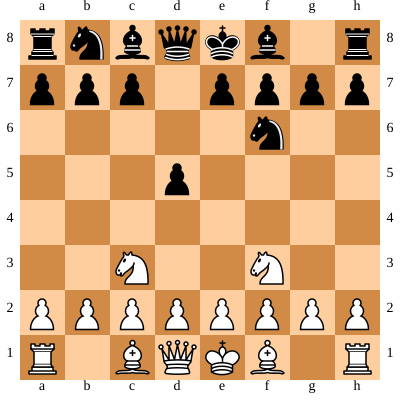



WHITE Turn
Move in UCI format: d2d4
Nodes per depth: {1: 24, 2: 53, 3: 1610, 4: 99, 5: 146, 6: 92, 7: 174, 8: 78, 9: 99, 10: 57, 11: 57, 12: 30, 13: 37, 14: 36, 15: 31, 16: 35, 17: 42, 18: 11, 19: 7, 20: 7, 21: 2}
Time taken by Move: 5.425584077835083
Coupe:  1359
Coupe all:  17476


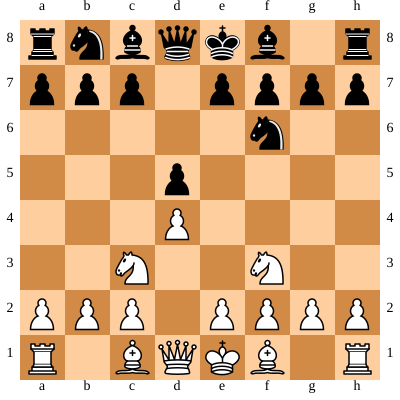



BLACK Turn
Move in UCI format: c8e6
Nodes per depth: {1: 29, 2: 735, 3: 16386, 4: 2901, 5: 2572, 6: 4239, 7: 3202, 8: 5624, 9: 4357, 10: 6087, 11: 5284, 12: 6685, 13: 5866, 14: 6932, 15: 5972, 16: 6980, 17: 5465, 18: 5812, 19: 4144, 20: 4127, 21: 3105, 22: 2254, 23: 927, 24: 582, 25: 229, 26: 75, 27: 23, 28: 5}
Time taken by Move: 190.5059633255005
Coupe:  65392
Coupe all:  82868


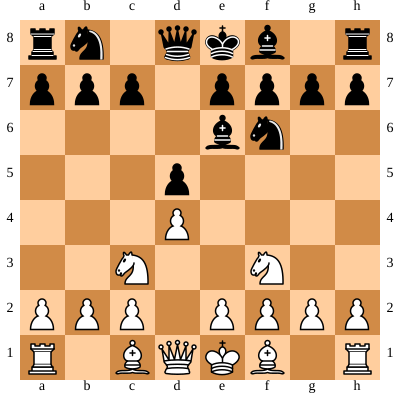



WHITE Turn
Move in UCI format: d1d3
Nodes per depth: {1: 30, 2: 111, 3: 3050, 4: 205, 5: 343, 6: 171, 7: 391, 8: 170, 9: 302, 10: 244, 11: 303, 12: 273, 13: 211, 14: 184, 15: 180, 16: 137, 17: 69, 18: 31, 19: 10, 20: 2}
Time taken by Move: 10.956562757492065
Coupe:  3498
Coupe all:  86366


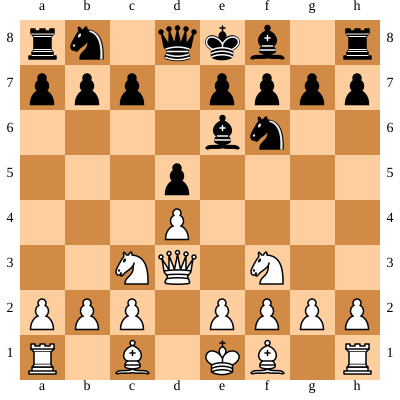



BLACK Turn
Move in UCI format: b8c6
Nodes per depth: {1: 28, 2: 755, 3: 11552, 4: 3680, 5: 2835, 6: 5739, 7: 2157, 8: 4510, 9: 2524, 10: 4165, 11: 2757, 12: 3531, 13: 2120, 14: 2717, 15: 1581, 16: 1686, 17: 903, 18: 774, 19: 309, 20: 255, 21: 116, 22: 93, 23: 37, 24: 59, 25: 28}
Time taken by Move: 91.7854835987091
Coupe:  33786
Coupe all:  120152


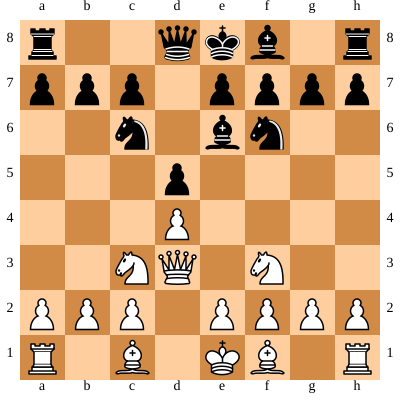



WHITE Turn
Move in UCI format: e2e4
Nodes per depth: {1: 40, 2: 307, 3: 20392, 4: 1850, 5: 5160, 6: 4478, 7: 9458, 8: 8093, 9: 16618, 10: 12962, 11: 19525, 12: 12792, 13: 19419, 14: 12869, 15: 20934, 16: 11636, 17: 17301, 18: 9984, 19: 13855, 20: 6630, 21: 7241, 22: 3022, 23: 3155, 24: 1105, 25: 633, 26: 127, 27: 42, 28: 9, 29: 6}
Time taken by Move: 371.348201751709
Coupe:  163082
Coupe all:  283234


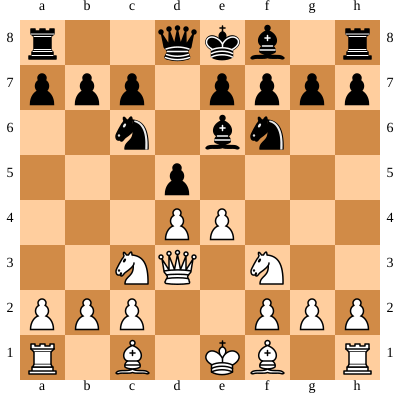



BLACK Turn
Move in UCI format: d8d7
Nodes per depth: {1: 32, 2: 1049, 3: 17124, 4: 8662, 5: 13294, 6: 23208, 7: 27102, 8: 45245, 9: 45896, 10: 62477, 11: 59654, 12: 78580, 13: 74332, 14: 94251, 15: 83282, 16: 101753, 17: 80951, 18: 86832, 19: 64600, 20: 58541, 21: 41370, 22: 32312, 23: 21969, 24: 15422, 25: 9580, 26: 5102, 27: 2726, 28: 1374, 29: 591, 30: 214, 31: 51}
Time taken by Move: 2072.9356575012207
Coupe:  762198
Coupe all:  1045432


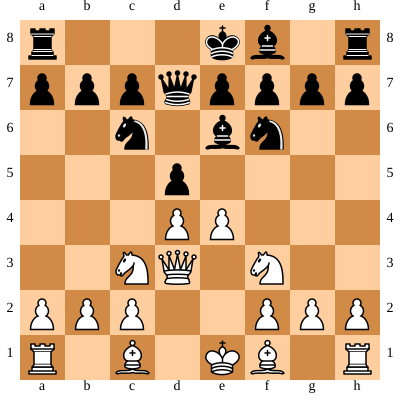



WHITE Turn
Move in UCI format: e4d5
Nodes per depth: {1: 39, 2: 104, 3: 6176, 4: 1335, 5: 2220, 6: 2703, 7: 3605, 8: 3836, 9: 4547, 10: 4610, 11: 4564, 12: 3583, 13: 3319, 14: 2642, 15: 2867, 16: 1996, 17: 2334, 18: 1361, 19: 1314, 20: 643, 21: 524, 22: 289, 23: 226, 24: 119, 25: 107, 26: 53, 27: 33, 28: 13}
Time taken by Move: 100.0949764251709
Coupe:  36078
Coupe all:  1081510


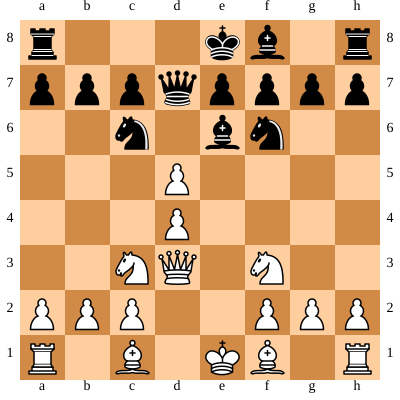



BLACK Turn
Move in UCI format: f6d5
Nodes per depth: {1: 33, 2: 1339, 3: 20478, 4: 7522, 5: 12111, 6: 16805, 7: 21687, 8: 29454, 9: 32450, 10: 38713, 11: 41075, 12: 47898, 13: 49657, 14: 57792, 15: 54794, 16: 56168, 17: 47275, 18: 41040, 19: 32936, 20: 23227, 21: 17469, 22: 10701, 23: 7192, 24: 3595, 25: 1705, 26: 725, 27: 166, 28: 18, 29: 4}
Time taken by Move: 1169.1224265098572
Coupe:  448180
Coupe all:  1529690


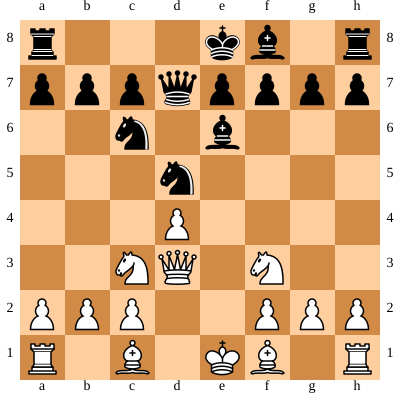



WHITE Turn
Move in UCI format: c3d5
Nodes per depth: {1: 42, 2: 81, 3: 4218, 4: 489, 5: 450, 6: 428, 7: 347, 8: 216, 9: 110, 10: 71, 11: 44, 12: 37, 13: 17, 14: 13, 15: 7, 16: 7, 17: 3}
Time taken by Move: 12.740859746932983
Coupe:  3519
Coupe all:  1533209


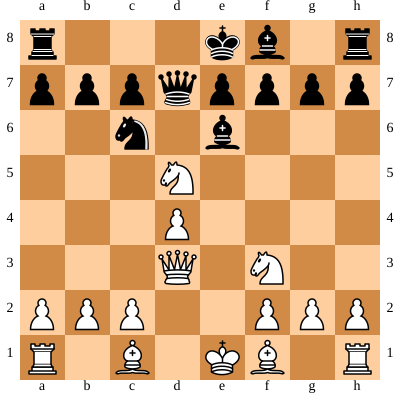



BLACK Turn
Move in UCI format: d7d5
Nodes per depth: {1: 30, 2: 780, 3: 11732, 4: 2361, 5: 2236, 6: 2973, 7: 2482, 8: 2853, 9: 2122, 10: 2538, 11: 1866, 12: 2111, 13: 1501, 14: 1527, 15: 1087, 16: 1171, 17: 832, 18: 853, 19: 664, 20: 696, 21: 483, 22: 450, 23: 103, 24: 80}
Time taken by Move: 71.66208624839783
Coupe:  25527
Coupe all:  1558736


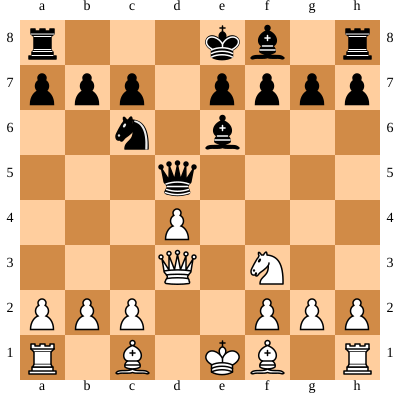



WHITE Turn
Move in UCI format: c1e3
Nodes per depth: {1: 40, 2: 258, 3: 13732, 4: 2341, 5: 4189, 6: 4506, 7: 4039, 8: 3291, 9: 2862, 10: 2499, 11: 2384, 12: 1868, 13: 1753, 14: 1185, 15: 1098, 16: 706, 17: 633, 18: 490, 19: 450, 20: 289, 21: 186, 22: 100, 23: 23, 24: 4, 25: 1}
Time taken by Move: 76.28086280822754
Coupe:  29456
Coupe all:  1588192


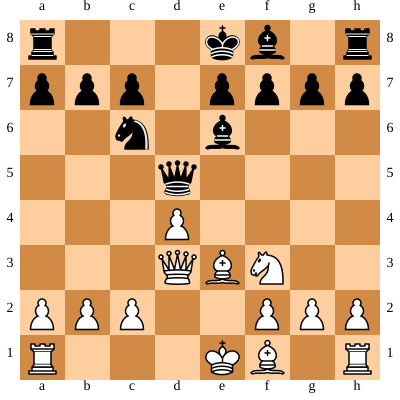



BLACK Turn
Move in UCI format: e8c8
Nodes per depth: {1: 44, 2: 1083, 3: 30280, 4: 10976, 5: 19129, 6: 23084, 7: 33511, 8: 37394, 9: 41219, 10: 46759, 11: 41179, 12: 43336, 13: 35591, 14: 36546, 15: 26840, 16: 23786, 17: 17855, 18: 13802, 19: 9732, 20: 6703, 21: 4423, 22: 2743, 23: 1230, 24: 581, 25: 118, 26: 31, 27: 5}
Time taken by Move: 866.5094912052155
Coupe:  323603
Coupe all:  1911795


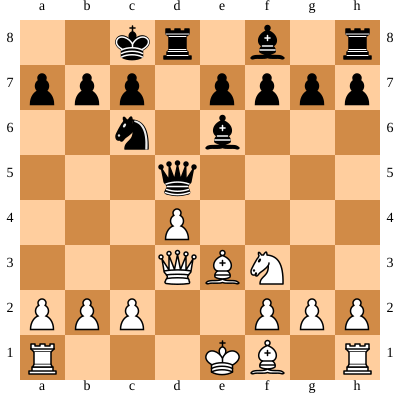



WHITE Turn
Move in UCI format: d3c3
Nodes per depth: {1: 42, 2: 206, 3: 13920, 4: 2527, 5: 4693, 6: 7291, 7: 6301, 8: 5794, 9: 4806, 10: 3918, 11: 3576, 12: 2619, 13: 2703, 14: 1743, 15: 1433, 16: 714, 17: 491, 18: 237, 19: 160, 20: 63, 21: 60, 22: 30, 23: 20, 24: 10, 25: 4}
Time taken by Move: 94.88419699668884
Coupe:  39909
Coupe all:  1951704


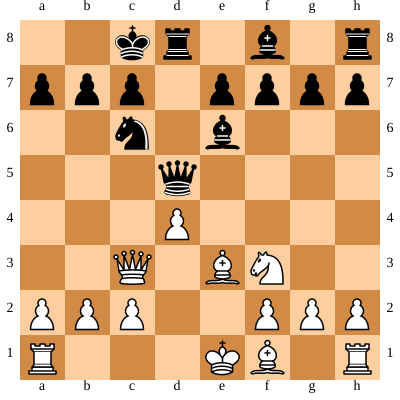



BLACK Turn
Move in UCI format: d8e8
Nodes per depth: {1: 40, 2: 1471, 3: 32804, 4: 12422, 5: 23038, 6: 23605, 7: 30332, 8: 30823, 9: 28668, 10: 29545, 11: 22767, 12: 23709, 13: 15885, 14: 15905, 15: 9963, 16: 8883, 17: 5247, 18: 4008, 19: 2157, 20: 1737, 21: 988, 22: 770, 23: 351, 24: 235, 25: 71, 26: 22, 27: 1}
Time taken by Move: 521.3566498756409
Coupe:  205730
Coupe all:  2157434


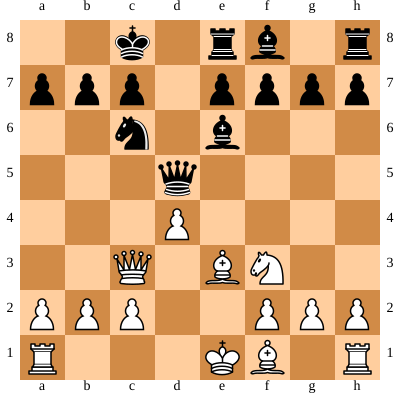



WHITE Turn
Move in UCI format: f1d3
Nodes per depth: {1: 40, 2: 256, 3: 14098, 4: 3515, 5: 8270, 6: 9360, 7: 12510, 8: 8966, 9: 9529, 10: 8106, 11: 8763, 12: 6856, 13: 6782, 14: 4657, 15: 4290, 16: 2779, 17: 2127, 18: 1221, 19: 714, 20: 401, 21: 250, 22: 160, 23: 67, 24: 33, 25: 11, 26: 11}
Time taken by Move: 173.82145380973816
Coupe:  73944
Coupe all:  2231378


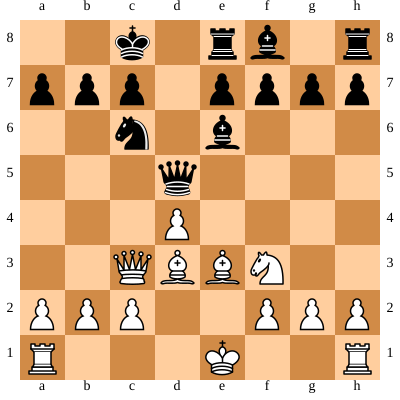



BLACK Turn
Move in UCI format: e6g4
Nodes per depth: {1: 41, 2: 1746, 3: 34708, 4: 17578, 5: 26204, 6: 39061, 7: 42600, 8: 50193, 9: 45196, 10: 56972, 11: 45654, 12: 51017, 13: 36355, 14: 35568, 15: 20846, 16: 17955, 17: 7940, 18: 6113, 19: 2635, 20: 1978, 21: 682, 22: 336, 23: 211, 24: 95, 25: 37, 26: 15}
Time taken by Move: 869.2960653305054
Coupe:  348658
Coupe all:  2580036


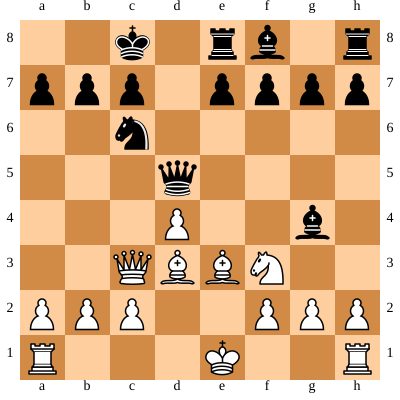



WHITE Turn
Move in UCI format: d3c4
Nodes per depth: {1: 45, 2: 216, 3: 9406, 4: 3289, 5: 7258, 6: 9456, 7: 13272, 8: 11215, 9: 15368, 10: 11369, 11: 13628, 12: 8825, 13: 8801, 14: 5612, 15: 4454, 16: 2358, 17: 1462, 18: 646, 19: 300, 20: 97, 21: 47, 22: 22, 23: 12, 24: 8, 25: 5, 26: 2}
Time taken by Move: 219.201153755188
Coupe:  81518
Coupe all:  2661554


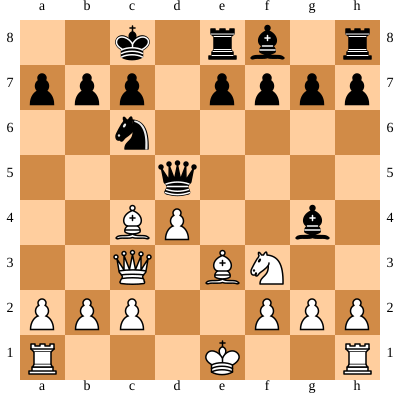



BLACK Turn
Move in UCI format: d5f5
Nodes per depth: {1: 44, 2: 1781, 3: 47974, 4: 31643, 5: 65712, 6: 108996, 7: 161379, 8: 220174, 9: 240917, 10: 320152, 11: 276506, 12: 320823, 13: 231613, 14: 227325, 15: 149607, 16: 124703, 17: 71235, 18: 46033, 19: 23780, 20: 14665, 21: 6774, 22: 3953, 23: 1653, 24: 812, 25: 214, 26: 31, 27: 10}
Time taken by Move: 4578.0267078876495
Coupe:  1751039
Coupe all:  4412593


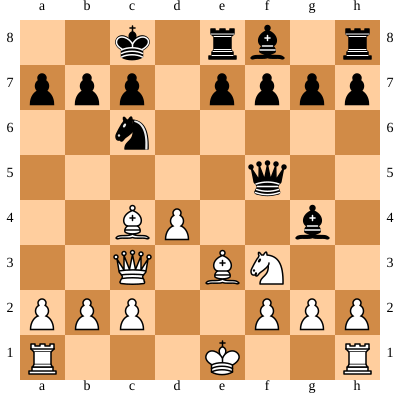



WHITE Turn
Move in UCI format: f3e5
Nodes per depth: {1: 44, 2: 174, 3: 9986, 4: 2139, 5: 5464, 6: 5900, 7: 8860, 8: 6044, 9: 8837, 10: 4391, 11: 4854, 12: 2559, 13: 1978, 14: 821, 15: 521, 16: 106, 17: 40, 18: 9, 19: 3, 20: 1}
Time taken by Move: 96.13402223587036
Coupe:  40887
Coupe all:  4453480


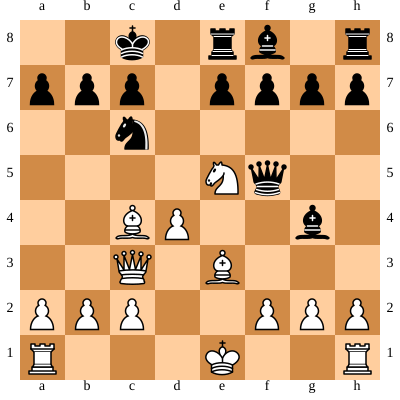



BLACK Turn


In [ ]:
import chess.pgn
import datetime
import time



movehistory =[]
game = chess.pgn.Game()
game.headers["Event"] = "Example"
game.headers["Site"] = "Linz"
game.headers["Date"] = str(datetime.datetime.now().date())
game.headers["Round"] = 1
game.headers["White"] = "MyChess"
game.headers["Black"] = "MyChess"
board = chess.Board()
coupe_all = 0
while not board.is_game_over(claim_draw=True):
    start = time.time()
    
    nodes_per_depth = dict()
    coupe = dict()
    coupe[0] = 0
    if board.turn:
        
        print("WHITE Turn")
        move = selectmove_order(3,movehistory,True)
        board.push(move)       
    else:
        print("BLACK Turn")
        move = selectmove_order(3,movehistory,False)
        board.push(move)  
    end = time.time()
    print("Move in UCI format:", move)
    print("Nodes per depth:", nodes_per_depth)
    print("Time taken by Move:", end-start) 
    print("Coupe: ", coupe[0])
    coupe_all = coupe_all + coupe[0]
    print("Coupe all: ", coupe_all)
    
    display(SVG(chess.svg.board(board, size=400)))  
    print("\n")

game.add_line(movehistory)
game.headers["Result"] = str(board.result(claim_draw=True))
print(game)
print(game, file=open("selftest.pgn", "w"), end="\n\n")
print('coupe all', coupe_all)
SVG(chess.svg.board(board=board,size=400))

## Promising move order

### Move evaluation function 

In [ ]:

   
import chess

# this module implement's Tomasz Michniewski's Simplified Evaluation Function
# https://www.chessprogramming.org/Simplified_Evaluation_Function
# note that the board layouts have been flipped and the top left square is A1

# fmt: off
piece_value = {
    chess.PAWN: 100,
    chess.ROOK: 500,
    chess.KNIGHT: 320,
    chess.BISHOP: 330,
    chess.QUEEN: 900,
    chess.KING: 20000
}

pawnEvalWhite = [
    0,  0,  0,  0,  0,  0,  0,  0,
    5, 10, 10, -20, -20, 10, 10,  5,
    5, -5, -10,  0,  0, -10, -5,  5,
    0,  0,  0, 20, 20,  0,  0,  0,
    5,  5, 10, 25, 25, 10,  5,  5,
    10, 10, 20, 30, 30, 20, 10, 10,
    50, 50, 50, 50, 50, 50, 50, 50,
    0, 0, 0, 0, 0, 0, 0, 0
]
pawnEvalBlack = list(reversed(pawnEvalWhite))

knightEval = [
    -50, -40, -30, -30, -30, -30, -40, -50,
    -40, -20, 0, 0, 0, 0, -20, -40,
    -30, 0, 10, 15, 15, 10, 0, -30,
    -30, 5, 15, 20, 20, 15, 5, -30,
    -30, 0, 15, 20, 20, 15, 0, -30,
    -30, 5, 10, 15, 15, 10, 5, -30,
    -40, -20, 0, 5, 5, 0, -20, -40,
    -50, -40, -30, -30, -30, -30, -40, -50
]

bishopEvalWhite = [
    -20, -10, -10, -10, -10, -10, -10, -20,
    -10, 5, 0, 0, 0, 0, 5, -10,
    -10, 10, 10, 10, 10, 10, 10, -10,
    -10, 0, 10, 10, 10, 10, 0, -10,
    -10, 5, 5, 10, 10, 5, 5, -10,
    -10, 0, 5, 10, 10, 5, 0, -10,
    -10, 0, 0, 0, 0, 0, 0, -10,
    -20, -10, -10, -10, -10, -10, -10, -20
]
bishopEvalBlack = list(reversed(bishopEvalWhite))

rookEvalWhite = [
    0, 0, 0, 5, 5, 0, 0, 0,
    -5, 0, 0, 0, 0, 0, 0, -5,
    -5, 0, 0, 0, 0, 0, 0, -5,
    -5, 0, 0, 0, 0, 0, 0, -5,
    -5, 0, 0, 0, 0, 0, 0, -5,
    -5, 0, 0, 0, 0, 0, 0, -5,
    5, 10, 10, 10, 10, 10, 10, 5,
    0, 0, 0, 0, 0, 0, 0, 0
]
rookEvalBlack = list(reversed(rookEvalWhite))

queenEval = [
    -20, -10, -10, -5, -5, -10, -10, -20,
    -10, 0, 0, 0, 0, 0, 0, -10,
    -10, 0, 5, 5, 5, 5, 0, -10,
    -5, 0, 5, 5, 5, 5, 0, -5,
    0, 0, 5, 5, 5, 5, 0, -5,
    -10, 5, 5, 5, 5, 5, 0, -10,
    -10, 0, 5, 0, 0, 0, 0, -10,
    -20, -10, -10, -5, -5, -10, -10, -20
]

kingEvalWhite = [
    20, 30, 10, 0, 0, 10, 30, 20,
    20, 20, 0, 0, 0, 0, 20, 20,
    -10, -20, -20, -20, -20, -20, -20, -10,
    20, -30, -30, -40, -40, -30, -30, -20,
    -30, -40, -40, -50, -50, -40, -40, -30,
    -30, -40, -40, -50, -50, -40, -40, -30,
    -30, -40, -40, -50, -50, -40, -40, -30,
    -30, -40, -40, -50, -50, -40, -40, -30
]
kingEvalBlack = list(reversed(kingEvalWhite))

kingEvalEndGameWhite = [
    50, -30, -30, -30, -30, -30, -30, -50,
    -30, -30,  0,  0,  0,  0, -30, -30,
    -30, -10, 20, 30, 30, 20, -10, -30,
    -30, -10, 30, 40, 40, 30, -10, -30,
    -30, -10, 30, 40, 40, 30, -10, -30,
    -30, -10, 20, 30, 30, 20, -10, -30,
    -30, -20, -10,  0,  0, -10, -20, -30,
    -50, -40, -30, -20, -20, -30, -40, -50
]
kingEvalEndGameBlack = list(reversed(kingEvalEndGameWhite))
# fmt: on


def move_value(board: chess.Board, move: chess.Move, endgame: bool) -> float:
    """
    How good is a move?
    A promotion is great.
    A weaker piece taking a stronger piece is good.
    A stronger piece taking a weaker piece is bad.
    Also consider the position change via piece-square table.
    """
    if move.promotion is not None:
        return -float("inf") if board.turn == chess.BLACK else float("inf")

    _piece = board.piece_at(move.from_square)
    if _piece:
        _from_value = evaluate_piece(_piece, move.from_square, endgame)
        _to_value = evaluate_piece(_piece, move.to_square, endgame)
        position_change = _to_value - _from_value
    else:
        raise Exception(f"A piece was expected at {move.from_square}")

    capture_value = 0.0
    if board.is_capture(move):
        capture_value = evaluate_capture(board, move)

    current_move_value = capture_value + position_change
    if board.turn == chess.BLACK:
        current_move_value = -current_move_value

    return current_move_value


def evaluate_capture(board: chess.Board, move: chess.Move) -> float:
    """
    Given a capturing move, weight the trade being made.
    """
    if board.is_en_passant(move):
        return piece_value[chess.PAWN]
    _to = board.piece_at(move.to_square)
    _from = board.piece_at(move.from_square)
    if _to is None or _from is None:
        raise Exception(
            f"Pieces were expected at _both_ {move.to_square} and {move.from_square}"
        )
    return piece_value[_to.piece_type] - piece_value[_from.piece_type]


def evaluate_piece(piece: chess.Piece, square: chess.Square, end_game: bool) -> int:
    piece_type = piece.piece_type
    mapping = []
    if piece_type == chess.PAWN:
        mapping = pawnEvalWhite if piece.color == chess.WHITE else pawnEvalBlack
    if piece_type == chess.KNIGHT:
        mapping = knightEval
    if piece_type == chess.BISHOP:
        mapping = bishopEvalWhite if piece.color == chess.WHITE else bishopEvalBlack
    if piece_type == chess.ROOK:
        mapping = rookEvalWhite if piece.color == chess.WHITE else rookEvalBlack
    if piece_type == chess.QUEEN:
        mapping = queenEval
    if piece_type == chess.KING:
        # use end game piece-square tables if neither side has a queen
        if end_game:
            mapping = (
                kingEvalEndGameWhite
                if piece.color == chess.WHITE
                else kingEvalEndGameBlack
            )
        else:
            mapping = kingEvalWhite if piece.color == chess.WHITE else kingEvalBlack

    return mapping[square]



def check_end_game(board: chess.Board) -> bool:
    """
    Are we in the end game?
    Per Michniewski:
    - Both sides have no queens or
    - Every side which has a queen has additionally no other pieces or one minorpiece maximum.
    """
    queens = 0
    minors = 0

    for square in chess.SQUARES:
        piece = board.piece_at(square)
        if piece and piece.piece_type == chess.QUEEN:
            queens += 1
        if piece and (
            piece.piece_type == chess.BISHOP or piece.piece_type == chess.KNIGHT
        ):
            minors += 1

    if queens == 0 or (queens == 2 and minors <= 1):
        return True

    return False


def get_ordered_moves_best(board: chess.Board) -> List[chess.Move]:
    """
    Get legal moves.
    Attempt to sort moves by best to worst.
    Use piece values (and positional gains/losses) to weight captures.
    """
    end_game = check_end_game(board)

    def orderer(move):
        return move_value(board, move, end_game)

    in_order = sorted(
        board.legal_moves, key=orderer, reverse=(board.turn == chess.WHITE)
    )
    return list(in_order)

### Search algorithms

In [ ]:
def alphabeta_best_order( alpha, beta,maxdepth, depthleft,order):
    # This if else code block is only used for analysis of algorithm, by counting number of nodes explored
    if maxdepth - depthleft in nodes_per_depth:
        nodes_per_depth[maxdepth - depthleft] += 1
    else: 
        nodes_per_depth[maxdepth - depthleft] = 1

    bestscore = -9999
    if( depthleft == 0 ):
        #return evaluate_board()
        return quiesce_best_order( alpha, beta, maxdepth,order )
    for move in get_ordered_moves_estim(board, order):
        board.push(move)   
        score= - alphabeta_best_order( -beta, -alpha, maxdepth, depthleft - 1 , not order)        
        board.pop()
        if( score >= beta ):
            coupe[0] = coupe[0] +1
            return score
        if( score > bestscore ):
            bestscore = score
        if( score > alpha ):
            alpha = score   
    return bestscore

In [ ]:
def quiesce_best_order( alpha, beta,  maxdepth, order):
    stand_pat = evaluate_board()
    if maxdepth  in nodes_per_depth:
        nodes_per_depth[maxdepth ] += 1
    else: 
        nodes_per_depth[maxdepth ] = 1
    if( stand_pat >= beta ):
        
        coupe[0] = coupe[0] +1
        return beta
    if( alpha < stand_pat ):
        alpha = stand_pat

    for move in get_ordered_moves_estim(board, order):
        if board.is_capture(move):
            board.push(move)        
            score = -quiesce_best_order( -beta, -alpha, maxdepth + 1, not order )
            
            board.pop()

            if( score >= beta ):
                coupe[0] = coupe[0] +1
                return beta
            if( score > alpha ):
                alpha = score  
    return alpha

In [ ]:
import chess.polyglot

def selectmove_best_order(depth,movehistory,order):
    
    bestMove = chess.Move.null()
    bestValue = -99999
    alpha = -100000
    beta = 100000
    for move in get_ordered_moves(board,order):
        board.push(move)
        boardValue = -alphabeta_best_order(-beta, -alpha,depth, depth-1,not order)
        
        if boardValue > bestValue:
            bestValue = boardValue;
            bestMove = move
        if( boardValue > alpha ):
            alpha = boardValue
        board.pop()
    movehistory.append(bestMove)
    return bestMove



### Testing

In [ ]:
import chess.pgn
import datetime
import time



movehistory =[]
game = chess.pgn.Game()
game.headers["Event"] = "Example"
game.headers["Site"] = "Linz"
game.headers["Date"] = str(datetime.datetime.now().date())
game.headers["Round"] = 1
game.headers["White"] = "MyChess"
game.headers["Black"] = "MyChess"
board = chess.Board()
coupe_all = 0
while not board.is_game_over(claim_draw=True):
    start = time.time()
    
    nodes_per_depth = dict()
    coupe = dict()
    coupe[0] = 0
    if board.turn:
        
        print("WHITE Turn")
        move = selectmove_best_order(3,movehistory,True)
        board.push(move)       
    else:
        print("BLACK Turn")
        move = selectmove_best_order(3,movehistory,False)
        board.push(move)  
    end = time.time()
    print("Move in UCI format:", move)
    print("Nodes per depth:", nodes_per_depth)
    print("Time taken by Move:", end-start) 
    print("Coupe: ", coupe[0])
    coupe_all = coupe_all + coupe[0]
    print("Coupe all: ", coupe_all)
    
    display(SVG(chess.svg.board(board, size=400)))  
    print("\n")

game.add_line(movehistory)
game.headers["Result"] = str(board.result(claim_draw=True))
print(game)
print(game, file=open("selftest.pgn", "w"), end="\n\n")
print('coupe all', coupe_all)
SVG(chess.svg.board(board=board,size=400))

## dump

In [6]:
from typing import List
def get_ordered_moves(board: chess.Board) -> List[chess.Move]:
    """
    Get legal moves.
    Attempt to sort moves by best to worst.
    Use piece values (and positional gains/losses) to weight captures.
    """
    alpha = -100000
    beta = 100000
    moves = []
    for move in board.legal_moves :
      board.push(move)
      moves.append((move, -alphabeta_ab_sort(-beta, -alpha, 2)))
      board.pop()
    def orderer(move):
        
        return move[1]

    in_order = sorted(
        moves, key=orderer
    )
    return [el[0] for el in moves]